In [1]:
import tensorflow as tf
from pandas.plotting._matplotlib import scatter_matrix
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pyodbc
import os
import math 


Parametre, ktorými sa dá aplikácia jemne nastaviť 
- database = tabulka z ktorej sa budu vytahovat informacie
- zastavky = zoznam zastávok, ktoré bude aplikácia sledovať

In [2]:
database = '[SK-CA]'
zastavky1 = ['Krásno n/K','Èadca','Mosty u Jabl.']
zastavky2 = ['Zwardoò ','Skalité','Èierne pri Èadci','Èadca','Krásno n/K']

Funkcie ktoré pomáhaju so spacovaním dát
- outlier_treatment = odstráni z dát outliery na základe IQR
- track%monitor = vyberie z dát iba tie, ktoré majú určenú trasu pomocou zoznamu zástavok a sleduje meškanie na každej zástavke

In [3]:
def outlier_treatment(datacolumn):
    sorted(datacolumn)
    Q1, Q3 = np.percentile(datacolumn, [25, 75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range, upper_range


def track_monitor(stops_list, df_p, title, directory):
    cesty = {}
    lastId = -1
    for index, row in df_p.iterrows():
        trainId = row['TrainId']
        if (row['FromName'] in stops_list) & (row['ToName'] in stops_list):
            if trainId == lastId:
                cesty.setdefault(trainId, []).append(row['RealDrivingTime'])
            elif (row['SectIdx'] == 0) & (row['FromName'] == stops_list[0]):
                cesty[row['TrainId']] = [0.0, row['RealDrivingTime']]
                lastId = trainId
        else:
            if trainId == lastId:
                cesty.pop(lastId, None)

    total = [0] * len(stops_list)
    
    trainsCount = 0
    for value in cesty.values():
        if len(value) == 11:
            plt.plot(zastavky, value)
            total = np.add(value, total)
            trainsCount += 1
    plt.title(title)
    plt.xticks(fontsize=7, rotation=15)
    plt.savefig(directory + 'AllTrains')
    plt.close()

    dividers = [trainsCount] * len(stops_list)

    means = np.divide(total, dividers)

    plt.title(title)
    plt.xticks(fontsize=7, rotation=15)
    plt.plot(zastavky, means)
    plt.savefig(directory + 'Mean')
    plt.close()

Nastavenia ktore dovoluju pandas zobrazit cely dataframe ako tabulku
- neodporúča sa používať
- môže spôsobiť spadnutie systému pri veľkom množstve dát 
- použivať iba na kontrolu

In [4]:
#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.width', None)

Select ktorý z databázy vytiahne všetky potrebné dáta.
- TrainId = unikátny kľúč vlaku, spája jednu celú jazdu vlaku
- FromName = Meno zastávky úseku, odkiaľ vlak vyráža
- ToName = Meno zastávky úseku, kam vlak smeruje
- TrainType = Typ Vlaku = (Os,Ex,R,Nex,Pn,Vlec,Sluz, atď.)
- Length = dĺžka vlaku v metroch 
- CarCount = počet vagónov vlaku na danom úseku vrátane pohonných súprav
- AxisCount = počet náprav vlaku
- EngineType = typ pohonnej súpravy
- DepRealTimeStamp = timestamp reálneho odchodu zo zástavky
- ArrRealTimeStamp = timestamp reálneho príchodu do cieľovej zastávky
- DepPlanTimeStamp = timestamp plánovaného odchodu zo zástavky
- ArrPlanTimeStamp = timestamp plánovaného príchodu do cieľovej zastávky
- PlanDrivingTime = plánované trvanie cesty v sekundách
- DelayDeparture = meškanie odchodu vlaku zo stanice v sekundách 
- DelayArrive = meškanie príchodu vlaku do stanice v sekundách 
- LengthSect = dĺžka úseku v km
- PredLength = dĺžka predošlého úseku v km
- SectIdx = poradie úseku v ceste vlaku (0 = 1. úsek, 1 = 2. úsek)
- Season = ročné obdobie v ktorom sa cesta uskutočnila
- DayTime = obdobie dňa v ktorom sa trasa uskutočnila(Ráno, Obed, Večer, Noc)


In [5]:
cnxn = pyodbc.connect("Driver={SQL Server};"
                      "Server=dokelu.kst.fri.uniza.sk;"
                      "Database=TrainsDB20-01-23;"
                      "uid=Lukas;pwd=lukas")

DFBASE = pd.read_sql_query(
      'SELECT [TrainId]'
      ',[FromName]'
      ',[ToName]'
      ',[TrainType]'
      ',[Weight]'
      ',[Length]'
      ',[CarCount]'
      ',[AxisCount]'
      ',SUBSTRING([EngineType],1,4) as EngineType'
      ',DATEDIFF(SECOND,\'1970-01-01\',[DepRealTime]) as DepRealTimeStamp'
      ',DATEDIFF(SECOND,\'1970-01-01\',[ArrRealTime]) as ArrRealTimeStamp'
      ',DATEDIFF(SECOND,\'1970-01-01\',[DepPlanTime]) as DepPlanTimeStamp'
      ',DATEDIFF(SECOND,\'1970-01-01\',[ArrPlanTime]) as ArrPlanTimeStamp'
      ',DATEDIFF(SECOND,[DepPlanTime],[ArrPlanTime]) as PlanDrivingTime'
      ',DATEDIFF(SECOND,[DepRealTime],[DepPlanTime]) as DelayDeparture'
      ',DATEDIFF(SECOND,[ArrRealTime],[ArrPlanTime]) as DelayArrive'
      ',COALESCE([LengthSect],0) as LengthSect'
      ',COALESCE([PredLength],0) as PredLength'
      ',[SectIdx]'
      ',[DepILS]'
      ',[ArrILS]'
      ',COALESCE([CadcaTemp],[TurzovkaTemp]) as Temp'
      ',COALESCE([CadcaWind],[TurzovkaWind]) as Wind'
      ',COALESCE([CadcaPrecipitation],[TurzovkaPrecipitation]) as Precipitation'
      ',COALESCE([CadcaWindDirection],[TurzovkaWindDirection]) as WindDirection'
      ',CASE WHEN DATEPART(MONTH,DepPlanTime) in (3,4,5) then \'Jar\''
            ' WHEN DATEPART(MONTH,DepPlanTime) in (6,7,8) then \'Leto\''
            ' WHEN DATEPART(MONTH,DepPlanTime) in (9,10,11) then \'Jesen\''
            ' WHEN DATEPART(MONTH,DepPlanTime) in (12,1,2) then \'Zima\''
      ' END as Season'
      ',CASE WHEN DATEPART(HOUR,DepRealTime) in (5,6,7,8,9,10) THEN \'Rano\''
            ' WHEN DATEPART(HOUR,DepRealTime) in (11,12,13,14,15,16) THEN \'Obed\''
            ' WHEN DATEPART(HOUR,DepRealTime) in (17,18,19,20,21,22) THEN \'Vecer\''
            ' WHEN DATEPART(HOUR,DepRealTime) in (23,0,1,2,3,4) THEN \'Noc\''
     ' END as DayTime'
    ' FROM [TrainsDb20-01-23].[dbo].' + database +
    ' join [TrainsDb20-01-23].[dbo].[SK-CA/Tur-weather]'
    ' on (DepRealTime >= DateFrom AND DepRealTime < DateTo)'
    ' where DepPlanTime IS NOT NULL'
    ' and DepRealTime IS NOT NULL'
    ' and ArrRealTime IS NOT NULL'
    ' and ArrPlanTime IS NOT NULL'
    ' and COALESCE([CadcaTemp],[TurzovkaTemp]) is not null'
    ' order by TrainId,SectIdx ASC'
    , cnxn)
    

In [6]:
DFBASE.isna().sum()

TrainId             0
FromName            0
ToName              0
TrainType           0
Weight              0
Length              0
CarCount            0
AxisCount           0
EngineType          0
DepRealTimeStamp    0
ArrRealTimeStamp    0
DepPlanTimeStamp    0
ArrPlanTimeStamp    0
PlanDrivingTime     0
DelayDeparture      0
DelayArrive         0
LengthSect          0
PredLength          0
SectIdx             0
DepILS              0
ArrILS              0
Temp                0
Wind                0
Precipitation       0
WindDirection       0
Season              0
DayTime             0
dtype: int64

In [7]:
print(len(DFBASE))

338973


Deklarácia ďalších atribútov, ktoré priamo v programe získame z dát
- PredDelay = Meškanie získané na predošlom úseku v sekundách 
- PredLength = Kvôli neúplnosti databázy túto hodnotu musíme získať dopočítaním
- DelayDiff = Získané meškanie na úseku v sekundách 
    = RealDrivingTime - PlanDrivingTime
- DelayDiffPercent = DelayDiff v pomere s Plánovaým trvaním trasy 
    = DelayDiff / PlanDrivingTime 
- NoStop = bool ktorý označuje, či vlak šiel trasu bez zastávok 
    (1 = bez zástavok, 0 = so zástavkami) - nedokončené
- PredDelayDiffPercent = DelayDiffPercent zazanmenané na predošlom úseku. Ak nemá predošlý úsek tak 0


- Ar1, Ar2, Ar3 = Rovnaký princíp ako PredDelayDiffPercent ale rozšírený na 3 predošlé úseky


In [8]:
DFBASE['PredDelay'] = 0
DFBASE['Delay'] = 0
#DFBASE['PredLength'] = 0
DFBASE['DelayDiff'] = 0
DFBASE['DelayDiffPercent'] = 0.0
DFBASE['DelayPercent'] = 0
DFBASE['Speed'] = 0

In [9]:
DFBASE['Ar1'] = 0.0
DFBASE['Ar2'] = 0.0
DFBASE['Ar3'] = 0.0

Kombinácie atribútov použitých pri testovaní a filtre.

In [10]:
season_types = DFBASE.Season.unique()
daytime_types = DFBASE.DayTime.unique()

# Filtrácia
Filtrovaním dát sa snažím opraviť dáta, ktoré dokážem označiť za nesprávne a odstániť ich v prípade, ak ich oprava nieje možná. Robím to z toho dôvodu, aby mal model ideálne podmienky na nájdenie vzorov v dátach. Dáta môžu mať vzor, ale ak sú narušené dátami, ktoré sú nesprávne, alebo sú takzvanými outliermi, ktoré tento vzor zahaľujú, tak je v niektorých prípadoch lepšie dáta vyfiltrovať. 

Pre porovnanie výsledkov, budem na hodnotenie modelov používať rôzne vyfiltrované dáta, aby som mohol potvrdiť ako sa jednotlivé modely správajú s rôznými dátami. V rámci jednej filtrácie budú všetky modely trénované a testované na totožných dátach. 

#### Dáta bez Filtrácie BASE 
    - Chýbajúce dáta sú dopočítané a žiadny údaj nieje nezadaný, čo je potrebné pre správne fungovanie trénovacích algoritmov

Dáta budem filtrovať vo viacerých úrovniach:
#### Prvá Filtrácia FILTER1
    - Táto filtrácia bude iba o odstánení veľmi jednoznačných a ľahko odhaliteľných chýb, a oprava dát.
    - oprava dát pri prechode na letný/zimný čas
    - všetky dáta kladné 
    - Počet vozňov musí byť väčší ako 1
    - Plánovaná jazdná doba nesmie presiahnuť 4 násobok reálnej plánovanej doby a obe musia mať trvanie aspoň minútu
    
#### Druhá Filtrácia FILTER2
     - Párny počet náprav a menší počet ako 225
     - Počet vozňov musí byť menší ako 60
     - Váha vlakov musí byť menšia ako 4000 ton
     - Plánované jazdné doby musia byť menšie ako 40 000 s ~ 11 hodín
     
#### Tretia Filtrácia FILTER3
    - Dĺžka vlaku musí byť kratšia ako 750 metrov
    - Váha vlakov musí byť menšia ako 2000 ton
    - Počet vozňov musí byť menší ako 45
    - Plánované jazdné doby musia byť menšie ako 15 000 s ~ 4 hodiny
    - Reálna jazdná trasa nesmie prekročiť 20 násobok plánovanej jazdnej doby

#### Upozornenie!
Nasledujúce operácie môž mať veľký dopad na rýchlosť programu, pre veľké zaťaženie RAM, keďže budeme mať 4 kópie 1.5 GB dát = 6 GB. Pre lepšiu stabilitu odporúčam pracovať iba s dvoma kópiami

# BASE
Pre základnú databázu dopočítame všetky ďalšie atribúty

In [11]:
DFBASE.loc[(DFBASE['PlanDrivingTime'] > 0),
       ['Speed']] = (DFBASE['LengthSect'] / (DFBASE['PlanDrivingTime'] / 3600.0))
DFBASE['RealDrivingTime'] = (DFBASE['ArrRealTimeStamp'] - DFBASE['DepRealTimeStamp'])
DFBASE['DelayDiff'] = (DFBASE['RealDrivingTime'] - DFBASE['PlanDrivingTime'])
#DFBASE['Delay'] = ((DFBASE['RealDrivingTime'] / DFBASE['PlanDrivingTime']) -1)
DFBASE.loc[(DFBASE['PlanDrivingTime'] != 0),
       ['Delay']] = ((DFBASE['RealDrivingTime'] / DFBASE['PlanDrivingTime']) -1)

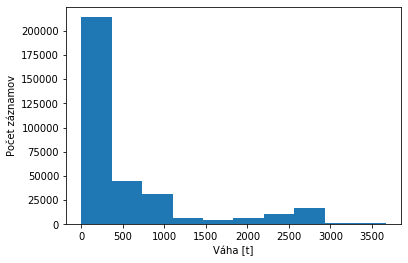

In [12]:
plt.hist(DFBASE['Weight'])
plt.xlabel("Váha [t]")
plt.ylabel("Počet záznamov")
plt.show()

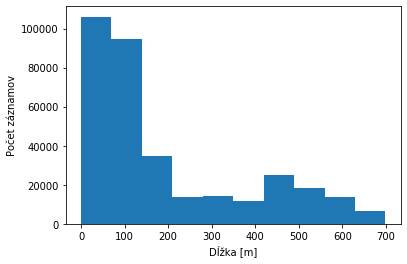

In [13]:
plt.hist(DFBASE['Length'])
plt.xlabel("Dĺžka [m]")
plt.ylabel("Počet záznamov")
plt.show()

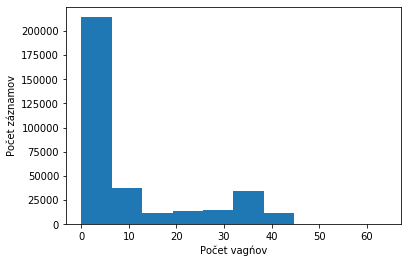

In [14]:
plt.hist(DFBASE['CarCount'])
plt.xlabel("Počet vagńov")
plt.ylabel("Počet záznamov")
plt.show()

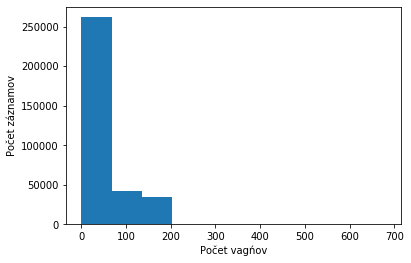

In [15]:
plt.hist(DFBASE['AxisCount'])
plt.xlabel("Počet vagńov")
plt.ylabel("Počet záznamov")
plt.show()

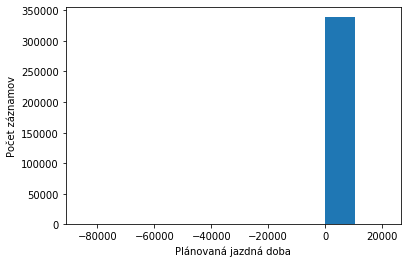

In [16]:
plt.hist( DFBASE['PlanDrivingTime'],bins=10)
plt.xlabel("Plánovaná jazdná doba")
plt.ylabel("Počet záznamov")
plt.show()

In [17]:
len(DFBASE[(abs(DFBASE['PlanDrivingTime']) > 18000)])

122

In [18]:
len(DFBASE[(abs(DFBASE['PlanDrivingTime']) > 3600)])

269

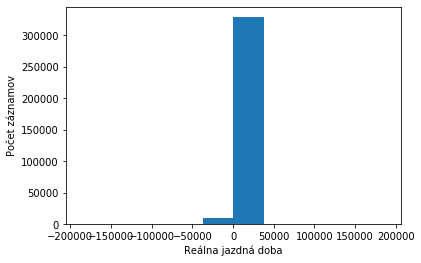

In [19]:
plt.hist( DFBASE['RealDrivingTime'],bins=10)
plt.xlabel("Reálna jazdná doba")
plt.ylabel("Počet záznamov")
plt.show()

In [20]:
len(DFBASE[(abs(DFBASE['RealDrivingTime']) > 3600)])

367

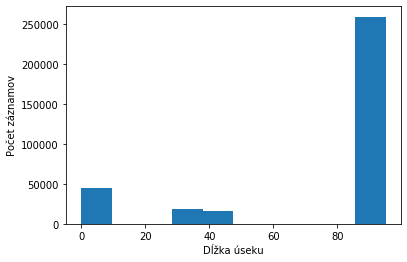

In [21]:
plt.hist( DFBASE['LengthSect'])
plt.xlabel("Dĺžka úseku")
plt.ylabel("Počet záznamov")
plt.show()

In [22]:
len(DFBASE[(abs(DFBASE['PredLength']) > 15)])

86146

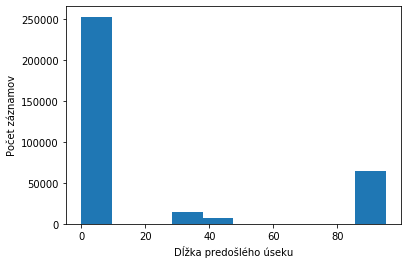

In [23]:
plt.hist( DFBASE['PredLength'])
plt.xlabel("Dĺžka predošlého úseku")
plt.ylabel("Počet záznamov")
plt.show()

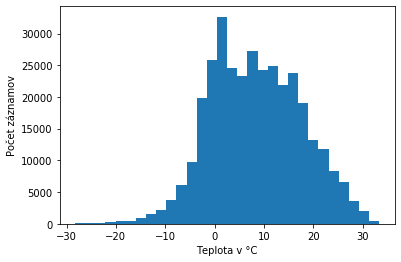

In [78]:
plt.hist(DFBASE['Temp'], bins=30)
plt.xlabel("Teplota v °C")
plt.ylabel("Počet záznamov")
plt.show()

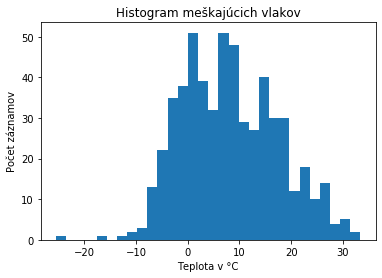

In [77]:
meskajuce = DFBASE[((DFBASE['RealDrivingTime'] - DFBASE['PlanDrivingTime']) > 15*60)]

plt.hist(meskajuce['Temp'], bins=30)
plt.title("Histogram meškajúcich vlakov")
plt.xlabel("Teplota v °C")
plt.ylabel("Počet záznamov")
plt.show()

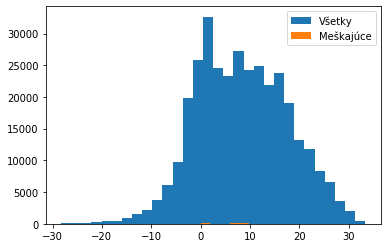

In [80]:
plt.hist(DFBASE['Temp'], label='Všetky',bins=30)
plt.hist(meskajuce['Temp'],label='Meškajúce',bins=30)
plt.legend()
plt.show()

In [24]:
DFBASE.loc[:,'DelayDepartureReduced'] = 0

lastId = -1
firstDelayDeparture = 0
lastLength = 0
lastDelay = 0

#for index in DFBASE.index:
for index, row in DFBASE.iterrows():
    if DFBASE.at[index, 'TrainId'] != lastId:
        lastId = DFBASE.at[index, 'TrainId']
        firstDelayDeparture = DFBASE.at[index, 'DelayDeparture']
    else:
        DFBASE.at[index,'PredLength'] = lastLength
        DFBASE.at[index,'PredDelay'] = lastDelay
    DFBASE.at[index,'DelayDepartureReduced'] = DFBASE.at[index, 'DelayDeparture'] - firstDelayDeparture
    lastLength = DFBASE.at[index,'LengthSect']
    lastDelay = DFBASE.at[index,'Delay']

In [25]:
DFFILTER1 = DFBASE.copy()

In [26]:
parNext = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'SectIdx', 'DelayDeparture',
           'PredDelay','PredLength','RealDrivingTime']

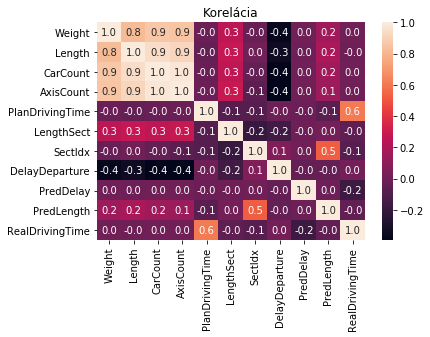

In [27]:
cor = DFBASE[parNext].corr()

plt.title("Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

## Filtrácia a oprava chybných dát

V tejto časti sa pokúšam opraviť dáta, a odstrániť všetky tie, ktoré podľa môjho uváženia sú nepresné alebo chybné.
Už na začiatku som niektoré dáta vyfiltroval:

#### Váha, dĺžka, počet vozňov a počet náprav musí byť kladné číslo
Táto operácia neodstánila žiadne úseky, takže dáta sú v tomto smere správne
- Weight > 0  
- Length > 0
- CarCount > 0
- AxisCount > 0

#### Dĺžka úseku musí byť kladné číslo
V tomto prípade ide o to, že úsek nesmie vycestovať z tej istej stanice ako jeho finálna stanica. Tým pádom, nesmie mať nulovú dĺžku trate. Takto som odstánil 216 záznamov
- LengthSect > 0
- FromName <> ToName

#### Oprava chyby jazdných dôb spôsobených presunom na letný alebo zimný čas
Tu sa snažím lokalizovať ktoré úseky boli posunom času zasiahnuté, a následne opraviť ich jazdnú dobu a meškanie tak, aby lepšie predstavolali realitu. Zahŕňa roky 2016 - 2019
Za zmenu na letný čas bolo opravených 113 záznamov a za zimný 84

#### Jazdné doby dlhšie ako 1 minúta
Týmto som sa snažil odstrániť všetky dáta, ktoré som neopravil pri presune na zimný čas
- PlanDrivingTime > 60 = 1926 záznamov odstánených
- RealDrivingTime > 60 = 4043 záznamov odstánených

#### Vlaky ktorých reálne jazdné doby boli 4x kratšie ako plánované jazné doby
Tieto dáta sú väčšinou vlaky, ktorých jazdné doby mali trvať niekoľko hodín ale trvali menej ako 10 minút
- PlanDrivingTime/RealDrivingTime > 4 = 253 záznamov odstánených

#### Vlaky každý vozeň má aspoň 3 nápravy a dĺžku 5 metrov
Týmto spôsobom som sa snažil opraviť dáta, ktoré vykazovali menší počet náprav ako vozňov. Keď som sa bližšie na dáta pozrel, videl som, že niektoré dáta sú prehodené, a po opravení dávajú zmysel. Taktiež, žiaden vlak nemá iba jeden vozeň - tieto dáta mali v sebe najväčší počet chýb.
- usporiadanie dát CarCount < AxisCount < Length
- CarCount > 1 = odstánenie 

# Filter1
- oprava dát pri prechode na letný/zimný čas
- všetky dáta kladné 
- Počet vozňov musí byť väčší ako 1
- Plánovaná jazdná doba nesmie presiahnuť 4 násobok reálnej plánovanej doby a obe musia mať trvanie aspoň minútu

-> 296445

Odstránenie meškaní a skorých príchodov spôsobených zmenou na letný/zimný čas 

opravene hodnoty Zima = 6
opravene hodnoty Leto = 0

In [28]:
# zmena casu ----------------- NA ZIMNY-----------------------------------------------
s = ((((DFFILTER1['DepRealTimeStamp'] > 1477792800) & (DFFILTER1['DepRealTimeStamp'] < 1477807200))
    # ------------------------2017-------------------------------------------------
    | ((DFFILTER1['DepRealTimeStamp'] > 1509242400) & (DFFILTER1['DepRealTimeStamp'] < 1509256800))
    # ------------------------2018-------------------------------------------------
    | ((DFFILTER1['DepRealTimeStamp'] > 1540692000) & (DFFILTER1['DepRealTimeStamp'] < 1540706400))
    # ------------------------2019-------------------------------------------------
    | ((DFFILTER1['DepRealTimeStamp'] > 1572141600) & (DFFILTER1['DepRealTimeStamp'] < 1572156000)))
    & (DFFILTER1['DelayDeparture'] < -1500)
    & (DFFILTER1['DelayDeparture'] > -5000))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['DelayDeparture', 'DepRealTimeStamp']] += 3600

#  -------------------------------2016-------------------------------------------------
s = ((((DFFILTER1['ArrRealTimeStamp'] > 1477792800) & (DFFILTER1['ArrRealTimeStamp'] < 1477807200))
    # ------------------------2017-------------------------------------------------
    | ((DFFILTER1['ArrRealTimeStamp'] > 1509242400) & (DFFILTER1['ArrRealTimeStamp'] < 1509256800))
    # ------------------------2018-------------------------------------------------
    | ((DFFILTER1['ArrRealTimeStamp'] > 1540692000) & (DFFILTER1['ArrRealTimeStamp'] < 1540706400))
    # ------------------------2019-------------------------------------------------
    | ((DFFILTER1['ArrRealTimeStamp'] > 1572141600) & (DFFILTER1['ArrRealTimeStamp'] < 1572156000)))
    & (DFFILTER1['DelayArrive'] < -1500)
    & (DFFILTER1['DelayArrive'] > -5000))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['DelayArrive', 'ArrRealTimeStamp']] += 3600


# zmena casu ----------------- NA LETNY-----------------------------------------------
# -------------------------------2016-------------------------------------------------
s = ((((DFFILTER1['DepRealTimeStamp'] > 1459044000) & (DFFILTER1['DepRealTimeStamp'] < 1459058400))
    # ------------------------2017-------------------------------------------------
    | ((DFFILTER1['DepRealTimeStamp'] > 1490493600) & (DFFILTER1['DepRealTimeStamp'] < 1490508000))
    # ------------------------2018-------------------------------------------------
    | ((DFFILTER1['DepRealTimeStamp'] > 1521943200) & (DFFILTER1['DepRealTimeStamp'] < 1521957600))
    # ------------------------2019-------------------------------------------------
    | ((DFFILTER1['DepRealTimeStamp'] > 1553997600) & (DFFILTER1['DepRealTimeStamp'] < 1554012000)))
    & (DFFILTER1['DelayDeparture'] > 2200)
    & (DFFILTER1['DelayDeparture'] < 5700))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['DelayDeparture', 'DepRealTimeStamp']] -= 3600

#  -------------------------------2016-------------------------------------------------
s = ((((DFFILTER1['ArrRealTimeStamp'] > 1459044000) & (DFFILTER1['ArrRealTimeStamp'] < 1459058400))
    # ------------------------2017-------------------------------------------------
    | ((DFFILTER1['ArrRealTimeStamp'] > 1490493600) & (DFFILTER1['ArrRealTimeStamp'] < 1490508000))
    # ------------------------2018-------------------------------------------------
    | ((DFFILTER1['ArrRealTimeStamp'] > 1521943200) & (DFFILTER1['ArrRealTimeStamp'] < 1521957600))
    # ------------------------2019-------------------------------------------------
    | ((DFFILTER1['ArrRealTimeStamp'] > 1553997600) & (DFFILTER1['ArrRealTimeStamp'] < 1554012000)))
    & (DFFILTER1['DelayArrive'] > 2200)
    & (DFFILTER1['DelayArrive'] < 5700))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['DelayArrive', 'ArrRealTimeStamp']] -= 3600

3
3
0
0


Keďže som opravil naozaj malú časť dát, tak veľká zmena v korelácií nenastáva 

Výpočet viacerých atribútov, a odstránenie neplatných dát. 
- RealDrivingTime = reálny čas ktorý trvala cesta
- DelayDiff = časový rozdiel medzi reálnym časom trvania cesty a plánovaným 
- DelayDiffPercent = DelayDiff v pomere ku plánovanej časovej dĺžke trasy
- CarCount,AxisCount,Length = výmena poradia týchto atribútov aby dávali zmysel 
- PredLength = priradenie hodnoty pri chýbajúcich údajoch

In [29]:
DFFILTER1['RealDrivingTime'] = (DFFILTER1['ArrRealTimeStamp'] - DFFILTER1['DepRealTimeStamp'])

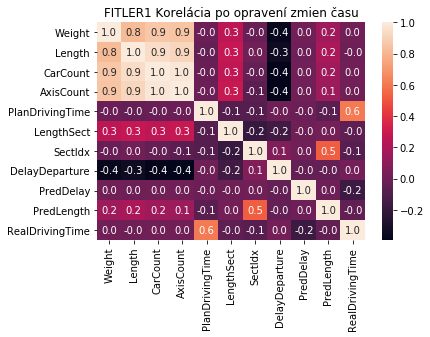

In [30]:
cor = DFFILTER1[parNext].corr()

plt.title("FITLER1 Korelácia po opravení zmien času")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

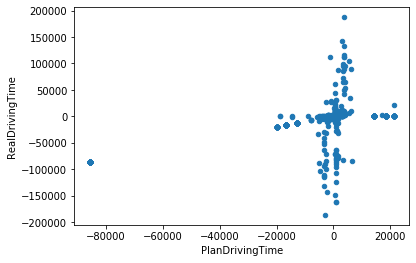

In [31]:
DFFILTER1.plot.scatter(x='PlanDrivingTime', y='RealDrivingTime')
plt.show()

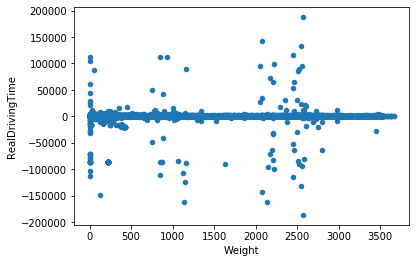

In [32]:
DFFILTER1.plot.scatter(x='Weight', y='RealDrivingTime')
plt.show()

### Odstránenie záporných a príliš nízkých jazdných dôb
- PlanDrivingTime - 375
- RealDrivingTime - 124

Vidím, že odstránenie týchto hodnôt pomohlo viacerým atribútom opäť získať koreláciu.

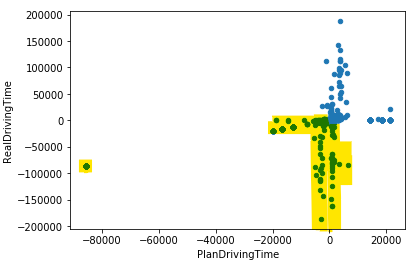
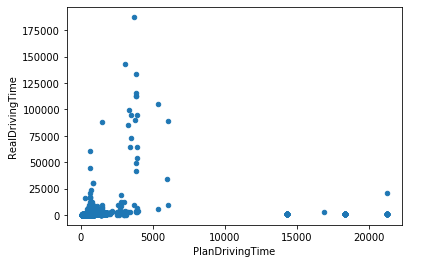

In [33]:
print(DFFILTER1.shape)
DFFILTER1 = DFFILTER1[(DFFILTER1['PlanDrivingTime'] > 60)]
print(DFFILTER1.shape)
DFFILTER1 = DFFILTER1[(DFFILTER1['RealDrivingTime'] > 60)]
print(DFFILTER1.shape)

(338973, 38)
(338598, 38)
(338474, 38)


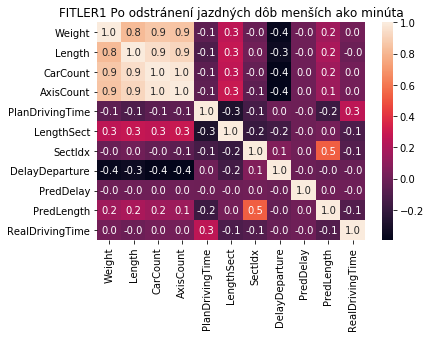

In [34]:
cor = DFFILTER1[parNext].corr()

plt.title("FITLER1 Po odstránení jazdných dôb menších ako minúta")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

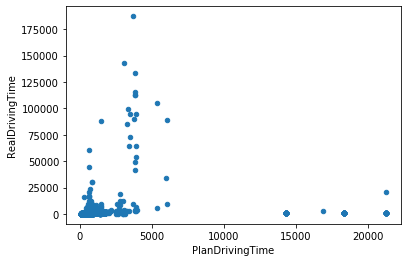

In [35]:
DFFILTER1.plot.scatter(x='PlanDrivingTime', y='RealDrivingTime')
plt.show()

### Odstránenie jazdných dôb, ktoré sú príliš rýchle oproti ich plánu
vyradil som preto vsetky jazdne doby ktoré boli menšie ako dvadsatina ich plánovanej doby

táto zmena veľmi pomohla korelácií PlanDrivingTime-RealDrivingTime - avšak tu som filtroval priamo sledovanu premennu
co znamena ze taketo data nebudeme moct odhalit v praxi.

-72 záznamov

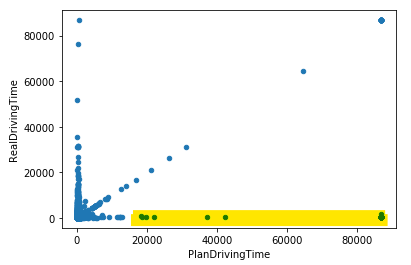
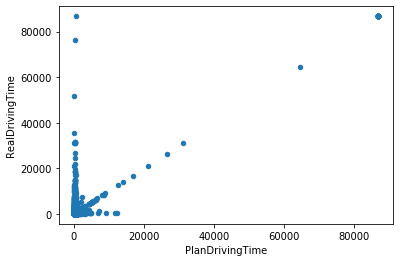

In [36]:
print(DFFILTER1.shape)
DFFILTER1 = DFFILTER1[((DFFILTER1['PlanDrivingTime'] / DFFILTER1['RealDrivingTime']) <= 20)]
print(DFFILTER1.shape)

(338474, 38)
(338402, 38)


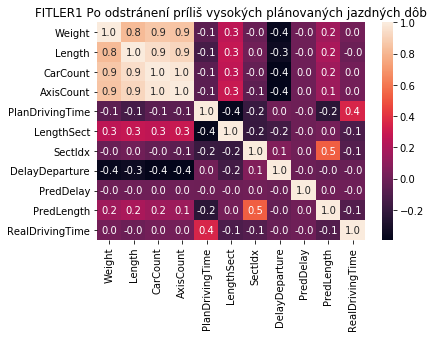

In [37]:
cor = DFFILTER1[parNext].corr()

plt.title("FITLER1 Po odstránení príliš vysokých plánovaných jazdných dôb")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

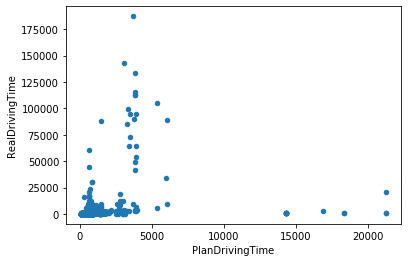

In [38]:
DFFILTER1.plot.scatter(x='PlanDrivingTime', y='RealDrivingTime')
plt.show()

In [39]:
DFFILTER1.loc[:,'DelayDiff'] = (DFFILTER1['RealDrivingTime'] - DFFILTER1['PlanDrivingTime'])
DFFILTER1.loc[:,'DelayDiffPercent'] = (DFFILTER1['DelayDiff'] / DFFILTER1['PlanDrivingTime'])
DFFILTER1.loc[:,'DelayPercent'] = (DFFILTER1['RealDrivingTime'] / DFFILTER1['PlanDrivingTime'])
DFFILTER1.loc[:,'Delay'] = ((DFFILTER1['RealDrivingTime'] / DFFILTER1['PlanDrivingTime']) -1)

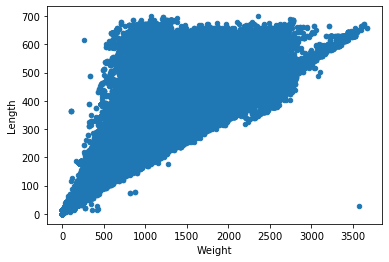

In [40]:
DFFILTER1.plot.scatter(x='Weight', y='Length')
plt.show()

### Vymena poradia atributov Length, AxisCount, CarCount.

In [41]:
lastId = -1
lastKm = 0
lastDelay = 0
firstDelay = 0

lastDelays = [0]*3

# vypocet hodnot pre dlzku predosleho useku a posledneho meskania
for index,row in DFFILTER1.iterrows():
    # vymena stlpcov
    vymena = []
    vymena.insert(0, DFFILTER1.at[index, 'CarCount'])
    vymena.insert(1, DFFILTER1.at[index, 'AxisCount'])
    vymena.insert(2, DFFILTER1.at[index, 'Length'])
    vymena.sort()
    DFFILTER1.at[index, 'CarCount'] = vymena[0]
    DFFILTER1.at[index, 'AxisCount'] = vymena[1]
    DFFILTER1.at[index, 'Length'] = vymena[2]

    if DFFILTER1.at[index, 'TrainId'] == lastId:
        DFFILTER1.at[index, 'PredLength'] = lastKm
        DFFILTER1.at[index, 'PredDelay'] = lastDelay
        
        DFFILTER1.at[index, 'Ar1'] = lastDelays[-1]
        DFFILTER1.at[index, 'Ar2'] = lastDelays[-2]
        DFFILTER1.at[index, 'Ar3'] = lastDelays[-3]

    else:
        lastId = DFFILTER1.at[index, 'TrainId']
        firstDelay = DFFILTER1.at[index, 'DelayDeparture']
        lastDelays = [0]*3
        
    lastDelays.append(DFFILTER1.at[index, 'DelayDiffPercent'])
    lastKm = DFFILTER1.at[index, 'LengthSect']
    lastDelay = DFFILTER1.at[index, 'Delay']
    DFFILTER1.at[index,'DelayDepartureReduced'] = DFFILTER1.at[index, 'DelayDeparture'] - firstDelay

print(DFFILTER1.shape)

(338402, 38)


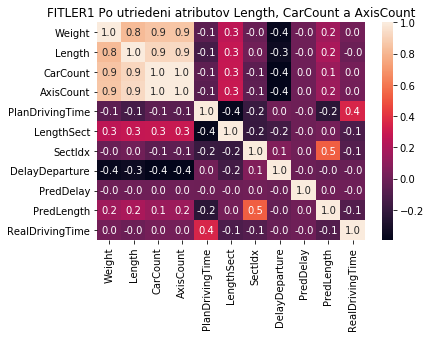

In [42]:
cor = DFFILTER1[parNext].corr()

plt.title("FITLER1 Po utriedeni atributov Length, CarCount a AxisCount")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

Odstránenie záznamov ktoré nemajú vyjadrenú hodnotu Weight a Length
- 41 878 záznamov

In [43]:
len(DFFILTER1)

338402

In [44]:
DFFILTER1 = DFFILTER1[((DFFILTER1['Weight'] > 5) & (DFFILTER1['Length'] > 5))]

In [45]:
len(DFFILTER1)

296524

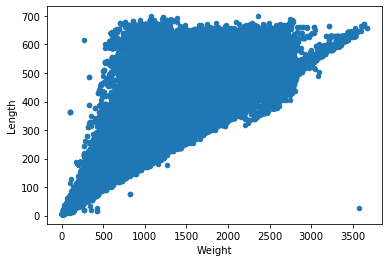

In [46]:
DFFILTER1.plot.scatter(x='Weight', y='Length')
plt.show()

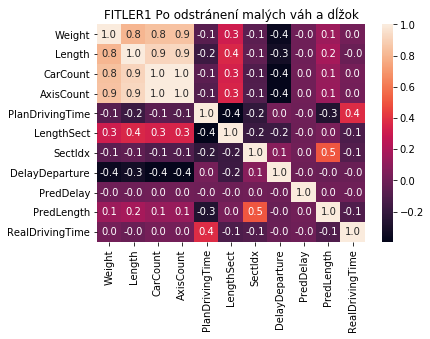

In [47]:
cor = DFFILTER1[parNext].corr()

plt.title("FITLER1 Po odstránení malých váh a dĺžok")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

### Vymena Weight A Length v tych pripadoch, kde pomer dlzky a pocet vagonov nedava zmysel ale pri zamene weight za lenght tento pomer dava zmysel
- 2195 záznamov

In [48]:
s = ((DFFILTER1['CarCount'] > 0)
&
(
    (
        (((DFFILTER1['Length'] *1.0 ) / (DFFILTER1['CarCount']*1.0 )) < 7)
        | 
        (((DFFILTER1['Length']*1.0)  / (DFFILTER1['CarCount']*1.0)) > 40)
    )
    &
    (
        (((DFFILTER1['Weight']*1.0) / (DFFILTER1['CarCount']*1.0)) >= 7)
        & 
        (((DFFILTER1['Weight']*1.0) / (DFFILTER1['CarCount']*1.0)) <= 40)
    )
))

In [49]:
DFFILTER1.loc[s, ['Length','Weight']] =DFFILTER1.loc[s, ['Weight','Length']].values

D:\Programs\Anaconda\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [50]:
s = ((DFFILTER1['CarCount'] > 0)
&
(
    (
        (((DFFILTER1['Length'] *1.0 ) / (DFFILTER1['CarCount']*1.0 )) < 7)
        | 
        (((DFFILTER1['Length']*1.0)  / (DFFILTER1['CarCount']*1.0)) > 40)
    )
    &
    (
        (((DFFILTER1['Weight']*1.0) / (DFFILTER1['CarCount']*1.0)) >= 7)
        & 
        (((DFFILTER1['Weight']*1.0) / (DFFILTER1['CarCount']*1.0)) <= 40)
    )
))

In [53]:
print(len(DFFILTER1[s]))

0


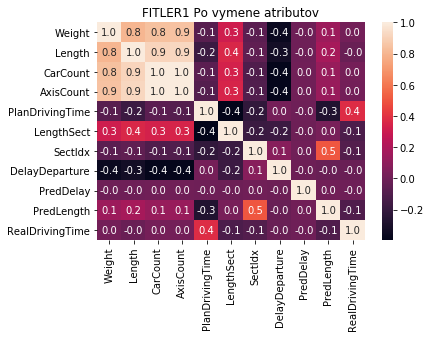

In [54]:
cor = DFFILTER1[parNext].corr()

plt.title("FITLER1 Po vymene atributov")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

### Vypocitanie hodnot AxisCount a CarCount na zaklade modusu podľa typu vlaku
- 84319 zaznamov

In [55]:
s = ((DFFILTER1['CarCount'] <= 0) & (DFFILTER1['TrainType'].isin(['Os','R','Ex','Sv']))) 
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['CarCount']] = (DFFILTER1.loc[s,['Length']].values /  25.0).round(0)
    
s = ((DFFILTER1['CarCount'] <= 0) & (DFFILTER1['TrainType'].isin(['Pn','Mn','Nex','Sluz','Lv'])))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['CarCount']] = (DFFILTER1.loc[s,['Length']].values /  14.0).round(0)
    
s = ((DFFILTER1['AxisCount'] <= 0) & (DFFILTER1['TrainType'].isin(['Sluz'])))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['AxisCount']] = (DFFILTER1.loc[s,['CarCount']].values *  2.0).round(0)
    
s = ((DFFILTER1['AxisCount'] <= 0) & (DFFILTER1['TrainType'].isin(['Os','R','Ex','Pn','Mn','Nex','Sv','Lv'])))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['AxisCount']] = (DFFILTER1.loc[s,['CarCount']].values *  4.0).round(0)

80938
828
0
2553


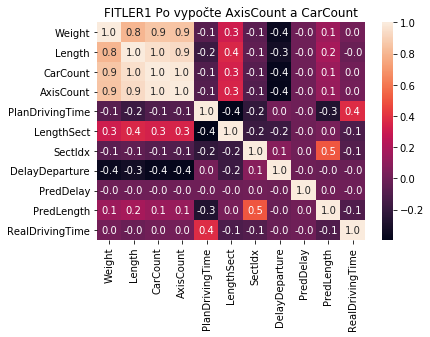

In [56]:
cor = DFFILTER1[parNext].corr()

plt.title("FITLER1 Po vypočte AxisCount a CarCount")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

### Oprava dlzky usekov, kde v niektorých prípadoch bola stratena desatinná čiara, hodnoty upravnené na hodnoty z českých dráh

Táto úprava zvýšila koreláciu medzi dĺžkou úseku a jazdnou dobou, pretože sme zmenšili všetky tie hodnoty, ktoré sa pohybovali v stovkách na ich desatinu.
- 254068 opravených záznamov

In [57]:
s =(DFFILTER1['LengthSect'] > 10)
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['LengthSect']] /= 10 

s = ((DFFILTER1['FromName'].isin(['Èadca', 'Turzovka'])) 
    & (DFFILTER1['ToName'].isin(['Èadca', 'Turzovka'])))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['LengthSect']] = 14

s = ((DFFILTER1['FromName'].isin(['Skalité', 'Èierne pri Èadci'])) 
    & (DFFILTER1['ToName'].isin(['Skalité', 'Èierne pri Èadci'])))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['LengthSect']] = 7

s = ((DFFILTER1['FromName'].isin(['Skalité', 'Zwardoò '])) 
    & (DFFILTER1['ToName'].isin(['Skalité', 'Zwardoò '])))
print(len(DFFILTER1[s]))
DFFILTER1.loc[s,['LengthSect']] = 8

254068
23827
18439
14459


odstránenie hodnôt s nulovou dĺžkou trasy 
- 79 záznamov

In [58]:
print(len(DFFILTER1[(DFFILTER1['LengthSect'] == 0)]))

79


In [59]:
DFFILTER1 = DFFILTER1[(DFFILTER1['LengthSect'] > 0)]

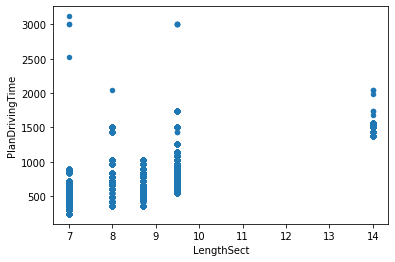

In [60]:
DFFILTER1.plot.scatter(x='LengthSect', y='PlanDrivingTime')
plt.show()

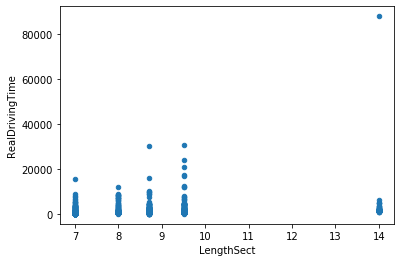

In [61]:
DFFILTER1.plot.scatter(x='LengthSect', y='RealDrivingTime')
plt.show()

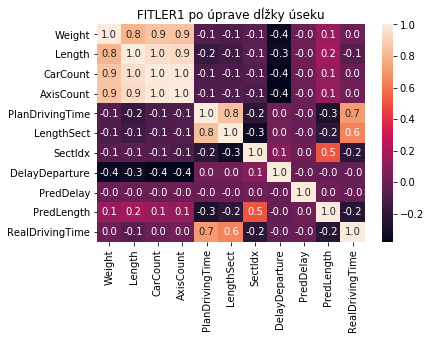

In [62]:
cor = DFFILTER1[parNext].corr()

plt.title("FITLER1 po úprave dĺžky úseku")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

In [63]:
#DFFILTER1.loc[:,'DelayDepartureReduced'] = 0

lastId = -1
firstDelay = 0
lastKm = 0
lastDelay = 0

for index, row in DFFILTER1.iterrows():
    if DFFILTER1.at[index, 'TrainId'] != lastId:
        lastId = DFFILTER1.at[index, 'TrainId']
        firstDelay = DFFILTER1.at[index, 'DelayDeparture']
    else:
        DFFILTER1.at[index, 'PredLength'] = lastKm
        DFFILTER1.at[index, 'PredDelay'] = lastDelay
    DFFILTER1.at[index,'DelayDepartureReduced'] = DFFILTER1.at[index, 'DelayDeparture'] - firstDelay
    lastKm = DFFILTER1.at[index, 'LengthSect']
    lastDelay = DFFILTER1.at[index, 'Delay']

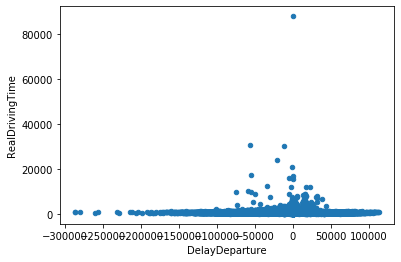

In [64]:
DFFILTER1.plot.scatter(x='DelayDeparture', y='RealDrivingTime')
plt.show()

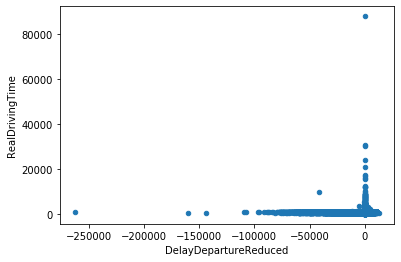

In [65]:
DFFILTER1.plot.scatter(x='DelayDepartureReduced', y='RealDrivingTime')
plt.show()

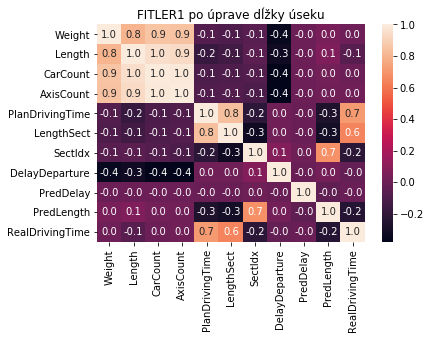

In [66]:
cor = DFFILTER1[parNext].corr()

plt.title("FITLER1 po úprave dĺžky úseku")
sns.heatmap(cor, annot = True, fmt='.1f') 
plt.show()

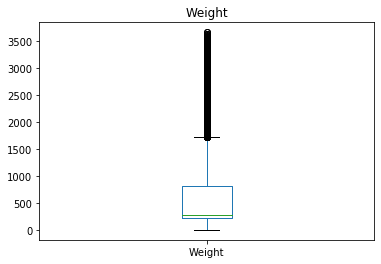

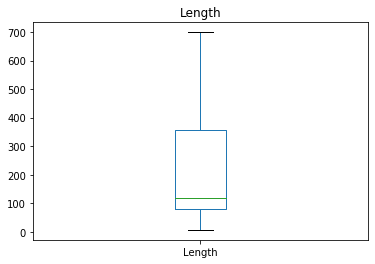

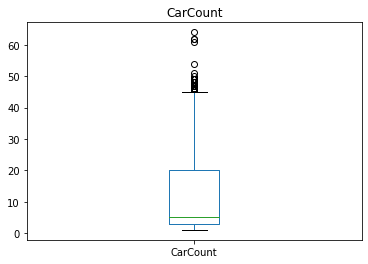

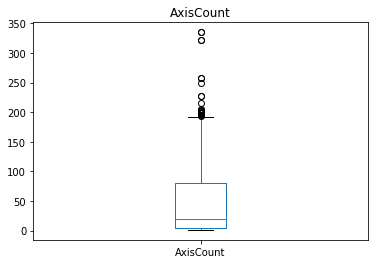

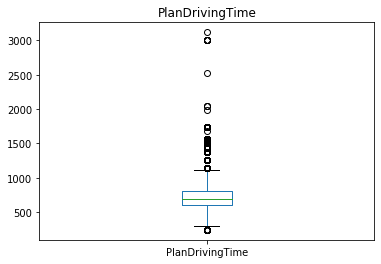

...

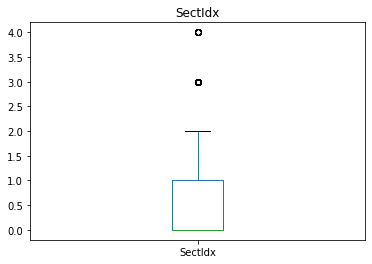

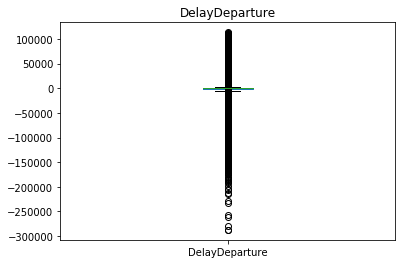

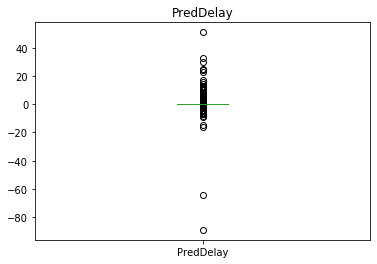

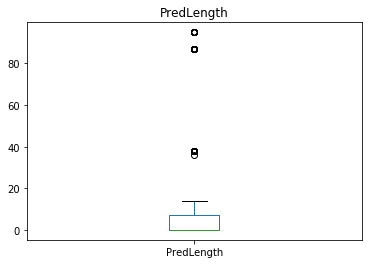

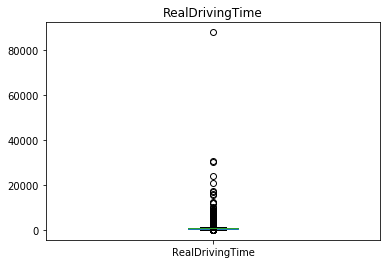

In [67]:
for attr in parNext:
    DFFILTER1.plot(kind='box', y=attr)
    plt.title(attr)
    plt.show()

### Temperature

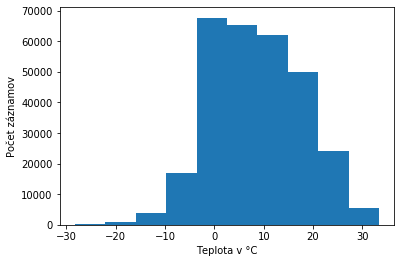

In [82]:
plt.hist( DFFILTER1['Temp'])
plt.xlabel("Teplota v °C")
plt.ylabel("Počet záznamov")
plt.show()

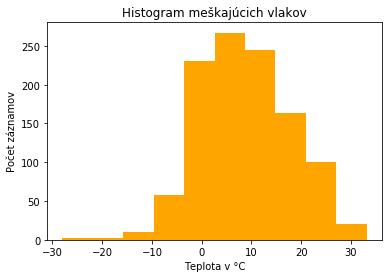

In [119]:
meskajuce = DFFILTER1[((DFFILTER1['RealDrivingTime'] - DFFILTER1['PlanDrivingTime']) > 10*60)]

plt.hist(meskajuce['Temp'],color='orange')
plt.title("Histogram meškajúcich vlakov")
plt.xlabel("Teplota v °C")
plt.ylabel("Počet záznamov")
plt.show()

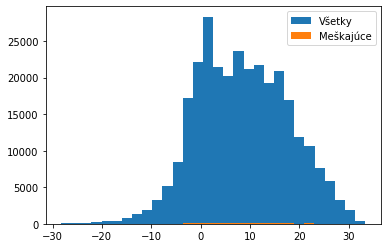

In [91]:
plt.hist(DFFILTER1['Temp'],label='Všetky',bins=30)
plt.hist(meskajuce['Temp'],label='Meškajúce',bins=30)
plt.legend()
plt.show()

### Wind Speed

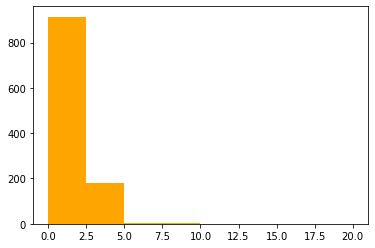

In [122]:
plt.hist(meskajuce['Wind'],label='Meškajúce',bins=(0,2.5,5,10,15,20),color='orange')
plt.show()

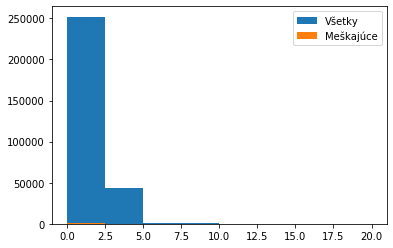

In [113]:
plt.hist(DFFILTER1['Wind'],label='Všetky',bins=(0,2.5,5,10,15,20))
plt.hist(meskajuce['Wind'],label='Meškajúce',bins=(0,2.5,5,10,15,20))
plt.legend()
plt.show()

### Precipitation

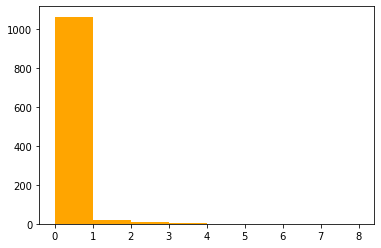

In [123]:
plt.hist(meskajuce['Precipitation'],label='Meškajúce',bins=(0,1,2,3,4,5,6,7,8),color='orange')
plt.show()

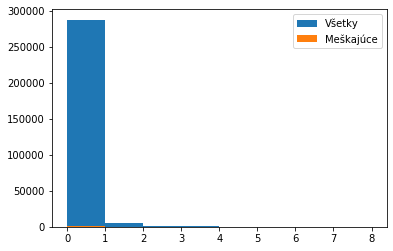

In [117]:
plt.hist(DFFILTER1['Precipitation'],label='Všetky',bins=(0,1,2,3,4,5,6,7,8))
plt.hist(meskajuce['Precipitation'],label='Meškajúce',bins=(0,1,2,3,4,5,6,7,8))
plt.legend()
plt.show()

In [68]:
print(len(DFFILTER1))

296445


## Normovanie (Štandardizácia)
Normovanie prevedie všetky dáta okrem výsledkov do intervalu <0,1> a tu vidíme rozdiely

In [33]:
def norm(x):
        return (x-train_stats['mean']) / train_stats['std']

Metóda v ktorej môžeme definovať hyperparametre nášho modelu.
Definujeme počet vrstiev v sieti a počet perceptrónov v každej vrstve.
Každému perceptrónu zadeľujeme aj jeho aktivačnú funkciu, v tomto prípade relu=rectified linear unit
Nastavujeme aj optimalizér, čo je funkcia, ktorá vypočíta gradient, alebo smer, ktorým sa parametre majú upraviť pre zlepšenie výsledku. Zadávame v nej aj veľkosť kroku, teda o koľko sa parametre neurónovej siete posunú v smere gradientu.
Pri regresnom probléme ako je tento budem sledovať hlavne Mean Absolute Error a Mean Squared Error, kde náš model sa bude riadiť práve MSE.

In [34]:
def build_model(lr_par=0.01):
    model = keras.Sequential([
        layers.Dense(64, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
        layers.Dense(64, activation=tf.nn.relu),
        layers.Dense(1)
    ])

    optimizer = tf.keras.optimizers.Adam(lr_par)

    model.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=['mae','mse'])
    return model

Metóda PrintDot slúži iba na to, aby sme mohli sledovať priebeh účenia sa siete. Prejdenie všetkých trénovacích dát neurónovou sieťou nazývame epocha. Za každou touto epochou vykreslíme bodku, a tým vieme, že sa sieť stále účí.
Sieť sa upravuje práve medzi jednotlivými epochami.
Pre učenie siete použijeme ako maximum 1000 epoch, avšak zavedieme aj techniku early stop, ktorá zabezpečí, že ak sa sieť zachytí na nájdenom minime na dlhšiu dobu, tak predpokladáme, že našlo absolútne minimum funkcie a teda učenie ukončíme.

In [35]:
class PrintDot(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        if epoch % 20 == 0:
            print('')
        print('.', end='')

In [36]:
EPOCHS = 150

In [37]:
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=17)

In [38]:
def save_best_model(model_name):
    return keras.callbacks.ModelCheckpoint(model_name, monitor='val_loss', verbose=0, save_best_only=True, save_weights_only=False)

In [39]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    plt.figure()
    plt.xlabel('Epocha')
    plt.ylabel('Mean Abs Error')
    plt.plot(hist['epoch'], hist['mae'],
             label='Chyba na trénovacej mn.')
    plt.plot(hist['epoch'], hist['val_mae'],
             label='Chyba na validačnej mn.')
    plt.legend()
    plt.show()

    plt.figure()
    plt.xlabel('Epocha')
    plt.ylabel('Mean Squared Error')
    plt.plot(hist['epoch'], hist['mse'],
             label='Chyba na trénovacej mn.')
    plt.plot(hist['epoch'], hist['val_mse'],
             label='Chyba na validačnej mn.')
    plt.legend()
    plt.show()

In [40]:
def show_predictions():
    predictions = testModel.predict(normed_test_data).flatten()

    f, ax = plt.subplots(figsize=(10, 6))
    ax.scatter(test_labels, predictions)
    plt.xlabel('Reálne hodnoty [' + label + ']')
    plt.ylabel('Odhadované hodnoty [' + label + ']')
    
    plt.plot([0,30000],[0,30000],'r')
    plt.show()

In [41]:
def show_errors(margin):
    error = new_test_predictions - test_labels

    print("Najväčšia chyba:" + str(max(error)))
    print("Najväčšia chyba v zápornom smere:" + str(min(error)))

    lessThan2Min = error[abs(error) < margin] 
    print("% približne správnych odhadov: " + str(len(lessThan2Min)/len(error)))


    plt.hist(error)
    plt.xlabel('Veľkosť chyby ['+label+']')
    plt.ylabel("Počet")
    plt.show()

In [42]:
def eval_Model(filter_type, model, attribute_list, margin=120):
    if filter_type == "BASE":
        dfCut = DFBASE[attribute_list]
    elif filter_type == "FILTER1":
        dfCut = DFFILTER1[attribute_list]
    else:
        print("ERROR")
        return
    
    label = attribute_list[-1]
    
    train_dataset = dfCut.sample(frac=0.8, random_state=0)
    test_dataset = dfCut.drop(train_dataset.index)

    train_labels = train_dataset.pop(label)
    test_labels = test_dataset.pop(label)

    train_stats = train_dataset.describe()
    train_stats = train_stats.transpose() 

    normed_train_data = (train_dataset-train_stats['mean']) / train_stats['std']
    normed_test_data = (test_dataset-train_stats['mean']) / train_stats['std']
    
    print("------Presnosť na " + filter_type + " dátach-------- ")
    loss, mae, mse = model.evaluate(normed_test_data, test_labels, verbose=0)
    
    print("Testing set Mean Abs Error: {:5.2f} {} ".format(mae, label))
    print("Testing set Mean Sqrt Error: {:5.2f} {} ".format(mse, label))
    print("Testing set Root Mean Sqrt Error: {:5.2f} {} ".format(math.sqrt(mse),label))
    
    # -------------PREDIKCIE--------------------------
    predictions = model.predict(normed_test_data).flatten()

    f, ax = plt.subplots(figsize=(10, 6))
    ax.scatter(test_labels, predictions)
    plt.xlabel('Reálne hodnoty [' + label + ']')
    plt.ylabel('Odhadované hodnoty [' + label + ']')
    
    ax.plot(ax.get_xlim(), ax.get_xlim(), ls="--", c="r")
    plt.show()
    
    # -------------ERRORS - chyby--------------------- 
    error = predictions - test_labels

    print("Najväčšia chyba:" + str(max(error)))
    print("Najväčšia chyba v zápornom smere:" + str(min(error)))

    smallErrors = error[abs(error) < margin] 
    bigErrors = error[abs(error) > 10000] 
    print("% približne správnych odhadov: " + str(len(smallErrors)/len(error)))

    plt.hist(error)
    plt.xlabel('Veľkosť chyby ['+label+']')
    plt.ylabel("Počet")
    plt.show()
    
    #np.sort(bigErrors)    
    #display(dfCut[dfCut.index.isin(bigErrors.index)])

In [43]:
def CreateAndFitModelLocations(filter_type,learning_rate, margin, name, attributes_list, topo="64-64"):
                               
    if filter_type == "BASE":
        dfCut = DFBASE[attributes_list]
    elif filter_type == "FILTER1":
        dfCut = DFFILTER1[attributes_list]
    else:
        print("ERROR")
        return
    label = attributes_list[-1]
    
    train_dataset = dfCut.sample(frac=0.8, random_state=0)
    test_dataset = dfCut.drop(train_dataset.index)

    train_labels = train_dataset.pop(label)
    test_labels = test_dataset.pop(label)

    print("-----------------------------" + filter_type + "---------------------------------")
    print("Veľkosť trénovacej množniy: " + str(train_dataset.shape))
    print("Veľkosť testovacej množniy: " + str(test_dataset.shape))

    train_stats = train_dataset.describe()
    train_stats = train_stats.transpose() 
    
    normed_train_data = (train_dataset-train_stats['mean']) / train_stats['std']
    normed_test_data = (test_dataset-train_stats['mean']) / train_stats['std']
    
    #tvorba modelu
    if topo == "128-64-64" :
        # 3 vrstvy
        testModel = keras.Sequential([
            layers.Dense(128, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    elif topo == "96-64-32-32":
        # 4 vrstvy
        testModel = keras.Sequential([
            layers.Dense(96, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    elif topo == "96-64-64-32-32-32":
        # 6 vrstiev
        testModel = keras.Sequential([
            layers.Dense(96, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    else :
        # 2 vrstvy
        testModel = keras.Sequential([
            layers.Dense(64, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(1)
        ])

    optimizer = tf.keras.optimizers.Adam(learning_rate)

    testModel.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=['mae','mse'])
    
    testModelHistory = testModel.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop,save_best_model(name + ".h5"), PrintDot()])
    
    testModel = load_model(name + ".h5")
    
    plot_history(testModelHistory)

    if filter_type in ("BASE","FILTER1"):
        eval_Model("BASE", testModel, attributes_list, margin)
    if filter_type in ("FILTER1"):
        eval_Model("FILTER1", testModel, attributes_list, margin)

In [44]:
def CreateAndFitModel(filter_type,learning_rate, margin, name, attributes_list, topo="64-64"):       
    if filter_type == "BASE":
        dfCut = DFBASE[attributes_list]
    elif filter_type == "FILTER1":
        dfCut = DFFILTER1[attributes_list]
    else:
        print("ERROR")
        return
    label = attributes_list[-1]
    
    train_dataset = dfCut.sample(frac=0.8, random_state=0)
    test_dataset = dfCut.drop(train_dataset.index)

    train_labels = train_dataset.pop(label)
    test_labels = test_dataset.pop(label)

    print("-----------------------------" + filter_type + "---------------------------------")
    print("Veľkosť trénovacej množniy: " + str(train_dataset.shape))
    print("Veľkosť testovacej množniy: " + str(test_dataset.shape))

    train_stats = train_dataset.describe()
    train_stats = train_stats.transpose() 
     
    normed_train_data = (train_dataset-train_stats['mean']) / train_stats['std']
    normed_test_data = (test_dataset-train_stats['mean']) / train_stats['std']
    
    #tvorba modelu
    if topo == "128-64-64" :
        # 3 vrstvy
        testModel = keras.Sequential([
            layers.Dense(128, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    elif topo == "96-64-32-32":
        # 4 vrstvy
        testModel = keras.Sequential([
            layers.Dense(96, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    elif topo == "96-64-64-32-32-32":
        # 6 vrstiev
        testModel = keras.Sequential([
            layers.Dense(96, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    else :
        # 2 vrstvy
        testModel = keras.Sequential([
            layers.Dense(64, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(1)
        ])

    optimizer = tf.keras.optimizers.Adam(learning_rate)

    testModel.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=['mae','mse'])
    
    testModelHistory = testModel.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop,save_best_model(name + ".h5"), PrintDot()])
    
    testModel = load_model(name + ".h5")
    
    
    plot_history(testModelHistory)

    eval_Model("BASE", testModel, attributes_list, margin)
    eval_Model("FILTER1", testModel, attributes_list, margin)

In [45]:
def just_Eval(testModel,attributes_list):
    eval_Model("BASE", testModel, attributes_list)
    eval_Model("FILTER1", testModel, attributes_list)
    eval_Model("FILTER2", testModel, attributes_list)
    eval_Model("FILTER3", testModel, attributes_list)

In [46]:
def just_Eval_locations(filter_type,testModel,attributes_list):
    if filter_type in ("BASE","FILTER1","FILTER2","FILTER3"):
        eval_Model("BASE", testModel, attributes_list, margin)
    if filter_type in ("FILTER1","FILTER2","FILTER3"):
        eval_Model("FILTER1", testModel, attributes_list, margin)
    if filter_type in ("FILTER2","FILTER3"):
        eval_Model("FILTER2", testModel, attributes_list, margin) 
    if filter_type in ("FILTER3"):
        eval_Model("FILTER3", testModel, attributes_list, margin)

In [47]:
def just_Eval_Percent(testModel,attributes_list):
    eval_Model_Percent("BASE", testModel, attributes_list)
    eval_Model_Percent("FILTER1", testModel, attributes_list)
    eval_Model_Percent("FILTER2", testModel, attributes_list)
    eval_Model_Percent("FILTER3", testModel, attributes_list)

## BASELINE MODEL 
Na porovnanie, že náš model je naozaj vhodné použitie, a že funguje lepšie ako náhodné hádanie hodnoty, musím vytvoriť baseline model, ktorý je veľmi jednoduchým riešením problému. Väčšinou nevyužíva žiadne znaky skúmaného súboru, a hodnotu odhadne vždy rovnako. V regresií teda existujú 3 druhy baseline modelov 


- medián = vždy predpovedá, že nasledujúca hodnota testovacieho datasetu sa rovná mediánu trénovacieho datasetu
- kvantil = vždy predpovedá konkrétny kvantil trénovacieho datasetu, ale kvantil vyberá priamo užívateľ
- konštanta = vždy predpovedá jednu hodnotu nezávisle od dát. Túto hodnotu priamo zadáva užívateľ

Ja teda využijem prvú možnosť a mojím prediktorom bude medián.

In [168]:
def BaseLineEval(Filter_type, metric):
    if Filter_type == "BASE":
        DFCUT = DFBASE['RealDrivingTime']
    elif Filter_type == "FILTER1":
        DFCUT = DFFILTER1['RealDrivingTime']
    elif Filter_type == "FILTER2":
        DFCUT = DFFILTER2['RealDrivingTime']
    elif Filter_type == "FILTER3":
        DFCUT = DFFILTER3['RealDrivingTime']
    else:
        print("ERROR")
        return

    train_dataset = DFCUT.sample(frac=0.8, random_state=0)
    test_dataset = DFCUT.drop(train_dataset.index)

    if metric == "median":
        train_metric = train_dataset.median()
    elif metric == "mean":
        train_metric = train_dataset.mean()
        
    print("Hodnota metriky trénovacieho datasetu: " + str(train_metric))
    
    predictions = [train_metric] * len(test_dataset)

    MAE = sum(abs(predictions - test_dataset)) / len(predictions)
    MSE = sum((predictions - test_dataset)**2) /  len(predictions)
    RMSE = math.sqrt(MSE)

    print("MAE: " + str(MAE))
    print("MSE: " + str(MSE))
    print("RMSE: " + str(RMSE))
    
    error = predictions - test_dataset

    print("Najväčšia chyba:" + str(max(error)))
    print("Najväčšia chyba v zápornom smere:" + str(min(error)))

    smallErrors = error[abs(error) < 120] 
    bigErrors = error[abs(error) > 10000] 
    print("% približne správnych odhadov: " + str(len(smallErrors)/len(error)))


In [169]:
BaseLineEval("BASE","median")
print()
BaseLineEval("BASE","mean")

Hodnota metriky trénovacieho datasetu: 706.0
MAE: 213.3466479828896
MSE: 3212808.670993436
RMSE: 1792.4309389746195
Najväčšia chyba:149206.0
Najväčšia chyba v zápornom smere:-111794.0
% približne správnych odhadov: 0.5472084962017848

Hodnota metriky trénovacieho datasetu: 723.5019101844545
MAE: 213.97039607758842
MSE: 3213053.1525029964
RMSE: 1792.4991359838912
Najväčšia chyba:149223.50191018445
Najväčšia chyba v zápornom smere:-111776.49808981555
% približne správnych odhadov: 0.5479165130171841


In [170]:
BaseLineEval("FILTER1",'median')
print()
BaseLineEval("FILTER1",'mean')

Hodnota metriky trénovacieho datasetu: 710.0
MAE: 183.55789438175717
MSE: 99714.15419386396
RMSE: 315.77548067236626
Najväčšia chyba:525.0
Najväčšia chyba v zápornom smere:-23337.0
% približne správnych odhadov: 0.5092681610416772

Hodnota metriky trénovacieho datasetu: 745.7423552429624
MAE: 186.53137548169246
MSE: 98316.73926935853
RMSE: 313.5550019842747
Najväčšia chyba:560.7423552429624
Najväčšia chyba v zápornom smere:-23301.25764475704
% približne správnych odhadov: 0.5019986844102616


## Vyhodotenie 
Ako baseline model budem teda používať medián. Vidím, že tento model nieje vôbec zlý, čisto z hľadiska metrík. Priemerná chyba sa pohybuje okolo 2 minút. Môže to znamenať, že v týchto dátach sa ťažšie budú hľadať prediktory, ktoré výrazne zlepšia presnosť odhadu oproti baseline modelu. Tieto hodnoty budeme používať na refernciu, ako neurónová sieť zlepšila presnosť a či vôbec sa neurónová sieť je vhodná na daný problém.

### BASE 
- MAE: 213.3466479828896
- MSE: 3212808.670993436
- RMSE: 1792.4309389746195

### FILTER1 
- MAE: 183.55789438175717
- MSE: 99714.15419386396
- RMSE: 315.77548067236626

## Experiment - Baseline model založený na jednom prediktore 
Chcem použiť jediný prediktor PlanDrivingTime = teda plánovaná jazdná doba. Teda aký presný by bol model, ak by predpokladal, že vlak nikdy nebude meškať

In [171]:
def BaseLineEvalPlanDriving(Filter_type):
    if Filter_type == "BASE":
        DFCUT = DFBASE[['PlanDrivingTime','RealDrivingTime']]
    elif Filter_type == "FILTER1":
        DFCUT = DFFILTER1[['PlanDrivingTime','RealDrivingTime']]
    elif Filter_type == "FILTER2":
        DFCUT = DFFILTER2[['PlanDrivingTime','RealDrivingTime']]
    elif Filter_type == "FILTER3":
        DFCUT = DFFILTER3[['PlanDrivingTime','RealDrivingTime']]
    else:
        print("ERROR")
        return

    train_dataset = DFCUT.sample(frac=0.8, random_state=0)
    test_dataset = DFCUT.drop(train_dataset.index)
    
    predictions = test_dataset['PlanDrivingTime']

    MAE = sum(abs(predictions - test_dataset['RealDrivingTime'])) / len(predictions)
    MSE = sum((predictions - test_dataset['RealDrivingTime'])**2) / len(predictions)
    RMSE = math.sqrt(MSE)

    print("MAE: " + str(MAE))
    print("MSE: " + str(MSE))
    print("RMSE: " + str(RMSE))
    
    error = predictions - test_dataset['RealDrivingTime']

    print("Najväčšia chyba:" + str(max(error)))
    print("Najväčšia chyba v zápornom smere:" + str(min(error)))

    smallErrors = error[abs(error) < 120] 
    bigErrors = error[abs(error) > 10000] 
    print("% približne správnych odhadov: " + str(len(smallErrors)/len(error)))
    
    f, ax = plt.subplots(figsize=(10, 6))
    ax.scatter(test_dataset['RealDrivingTime'], predictions)
    plt.title("BASELINE - PlanDrivingTime")
    plt.xlabel('True Values [' + label + ']')
    plt.ylabel('Predictions [' + label + ']')

    ax.plot(ax.get_xlim(), ax.get_xlim(), ls="--", c="r")
    plt.show()

MAE: 68.5674164761413
MSE: 1698619.9943063648
RMSE: 1303.3111655726598
Najväčšia chyba:149100
Najväčšia chyba v zápornom smere:-108660
% približne správnych odhadov: 0.8886496054281289


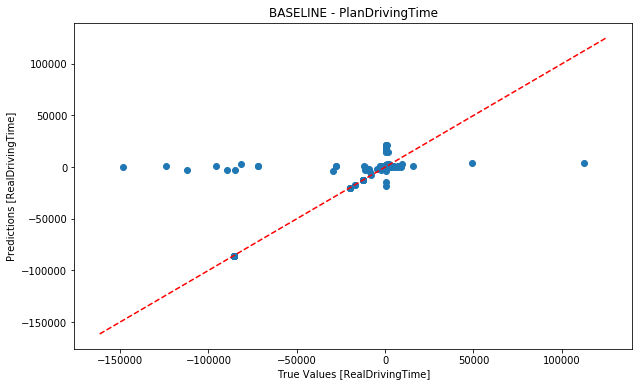

In [172]:
label = 'RealDrivingTime'
BaseLineEvalPlanDriving("BASE")

MAE: 52.632022803555465
MSE: 36376.448379969304
RMSE: 190.72610828087826
Najväčšia chyba:2099
Najväčšia chyba v zápornom smere:-23357
% približne správnych odhadov: 0.8746816441498423


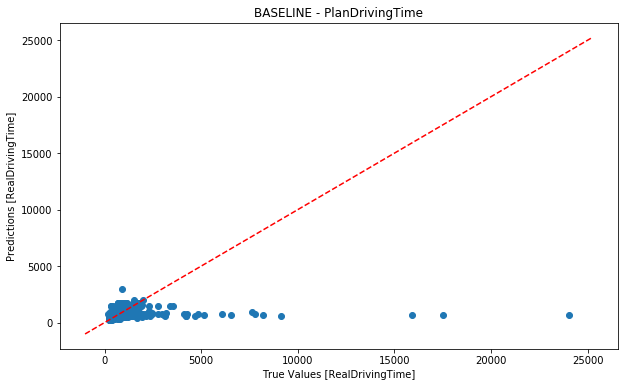

In [173]:
BaseLineEvalPlanDriving("FILTER1")

## Vyhodnotenie Experimentu
Ako najlepší quasi Baseline model sa ukázal model naložený na jedinom prediktore. Ako vidíme, na zlepšenie tu nieje veľký priestor, a chyby v predikcií nastávajú iba pri meškaniach, kde pri iných modeloch môže nastať chyba aj keď vlak nemešká

### BASE 
- MAE: 68.5674164761413
- MSE: 1698619.9943063648
- RMSE: 1303.3111655726598
- % správnych odhadov: 88%

### FILTER1 
- MAE: 52.632022803555465
- MSE: 36376.448379969304
- RMSE: 190.72610828087826
- % správnych odhadov: 87%

# Prvý Test - Vytvorenie modelu zo základných dát

Na začiatok pracujem z dátami ktoré sa nachádzajú priamo v databáze. Dáta boli upravené tak, aby obsahovali čo najmenej chýb a nemožných údajov.
Pracujem teda s týmito vlastnosťami:
- Weigth = váha vlakovej súpravy v tonách
- Length = dĺžka vlaku v metroch 
- CarCount = počet vagónov vlaku na danom úseku vrátane pohonných súprav
- AxisCount = počet náprav vlaku
- PlanDrivingTime = plánované trvanie cesty v sekundách
- DelayDeparture = meškanie odchodu vlaku zo stanice v sekundách 
- LengthSect = dĺžka úseku v km
- PredLength = dĺžka predošlého úseku v km
- SectIdx = poradie úseku v ceste vlaku (0 = 1. úsek, 1 = 2. úsek)

a sledujem jazdnú dobu vlaku
- RealDrivingTime

In [221]:
first_attributes = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
                    'SectIdx', 'DelayDeparture', 'PredLength','PredDelay',
                    'RealDrivingTime']

In [222]:
used_attributes = first_attributes
label = used_attributes[-1]

## Analýza - Výpočet lineárneho vplyvu atribútov na skúmanú vlastnosť
- korelácia so sledovanou vlastnosťou
- korelačné matice a histogram

korelácia: 

BASE
- RealDrivingTime    1.000000
- PlanDrivingTime    0.831802
- LengthSect         0.026890
- CarCount           0.009292
- AxisCount          0.008214
- Weight             0.004331
- Length             0.000130
- SectIdx           -0.004530
- DelayDeparture    -0.007265

FILTER1


FILTER2


FILTER3


## BASE

In [223]:
DFCUT = DFBASE[used_attributes]
cor = DFCUT.corr()
print(cor[label].sort_values(ascending=False))

RealDrivingTime    1.000000
PlanDrivingTime    0.609927
DelayDeparture     0.026316
AxisCount          0.009889
CarCount           0.008051
Weight             0.005573
Length            -0.004669
PredLength        -0.043303
LengthSect        -0.045145
Speed             -0.051934
SectIdx           -0.069611
PredDelay         -0.167566
Name: RealDrivingTime, dtype: float64


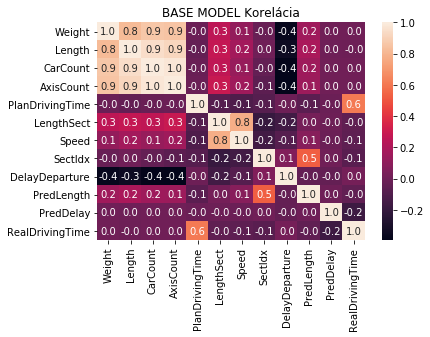

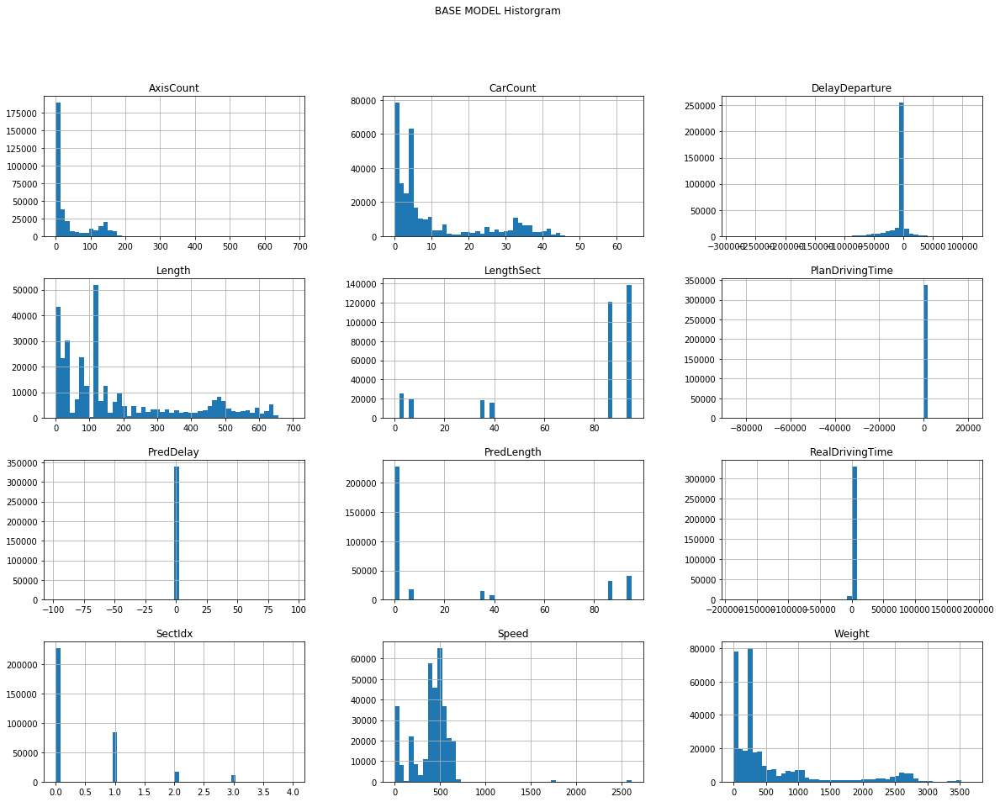

In [224]:
plt.title("BASE MODEL Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
    
DFCUT.hist(bins=50, figsize=(20, 15))
plt.suptitle("BASE MODEL Historgram")
plt.show()

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 11)
Veľkosť testovacej množniy: (67795, 11)

....................
....................
....................
....................
....................
....................
....................
......

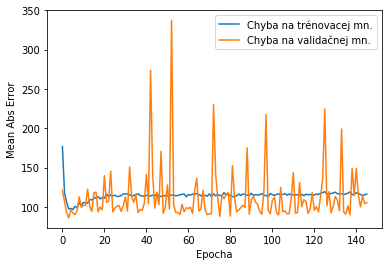

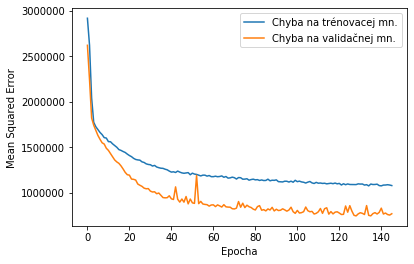

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 93.52 RealDrivingTime 
Testing set Mean Sqrt Error: 1221727.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1105.32 RealDrivingTime 


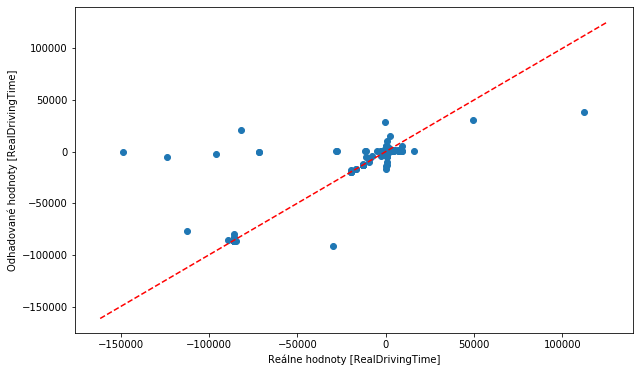

Najväčšia chyba:148339.765625
Najväčšia chyba v zápornom smere:-73942.3203125
% približne správnych odhadov: 0.8383214101334907


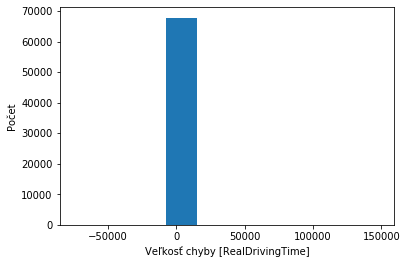

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 588.39 RealDrivingTime 
Testing set Mean Sqrt Error: 1051591.62 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1025.47 RealDrivingTime 


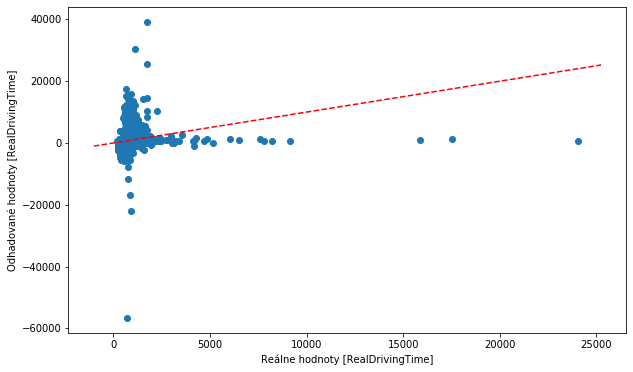

Najväčšia chyba:37427.68359375
Najväčšia chyba v zápornom smere:-57513.859375
% približne správnych odhadov: 0.29005380424699356


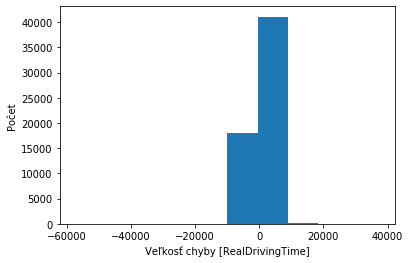

In [225]:
CreateAndFitModel("BASE",0.001, 120, "SKBASEModelAutoKor.h5", used_attributes, topo="64-64")

## Vyberieme iba tie premenne, ktoré nemajú vysokú mieru korelácie medzi sebou

In [186]:
no_auto_cor = ['Weight', 'PlanDrivingTime', 'LengthSect',
                    'SectIdx', 'DelayDeparture', 'PredLength','PredDelay',
                    'RealDrivingTime']

In [189]:
used_attributes = no_auto_cor
label = used_attributes[-1]
DFCUT = DFBASE[used_attributes]
cor = DFCUT.corr()

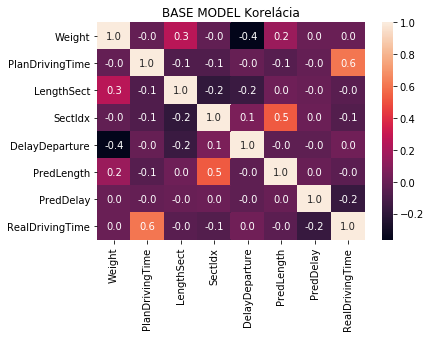

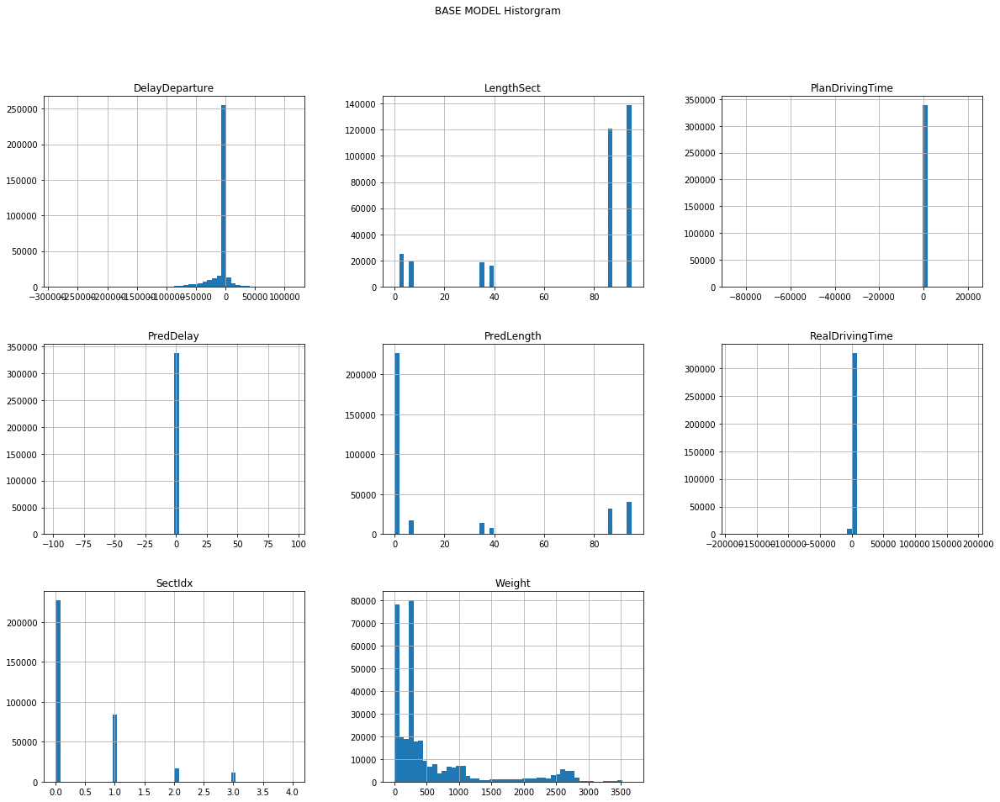

In [190]:
plt.title("BASE MODEL Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
    
DFCUT.hist(bins=50, figsize=(20, 15))
plt.suptitle("BASE MODEL Historgram")
plt.show()

Porovnanie závislosti trvania trasy od parametrov trasy.
Logicky, najväčší vplyv ukazuje plánovaný čas trvania trasy(PlanDrivingTime), keďže v prípade že vlak nemešká sa tieto dve hodnoty rovnajú. Vidíme, že v dátach je mnoho outlierov.

Je aj veľmi ľahko vidieť koreláciu atribútov CarCount, AxisCount, Length a Weigth ktorých vzor je veľmi podobný a ihneď rozoznateľný. 

Vidím aj veľmi veľkú prezenciu dát, v ktorých RealDrivingTime sa drží na línií okolo -86000 sekúnd ~ 1 deň. Toto sú veľmi zjavne chybné dáta ktoré identifikujeme podľa meškania veľmi blízkeho 24 hodinám a opravíme vo FILTER1

Ďalej pri Scatter plote PlanDrivingTime x RealDrivingTime sú ľahko viditeľné všetky hodnoty ktoré sú chybné

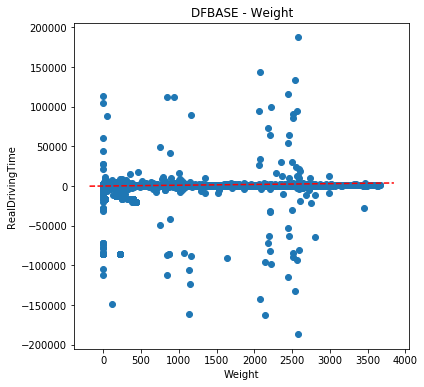

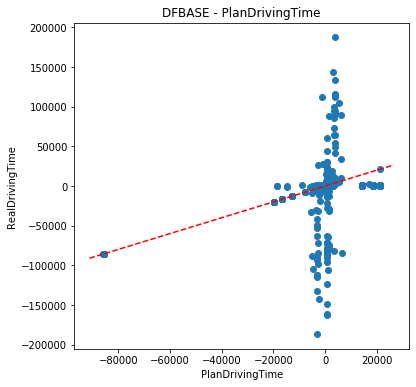

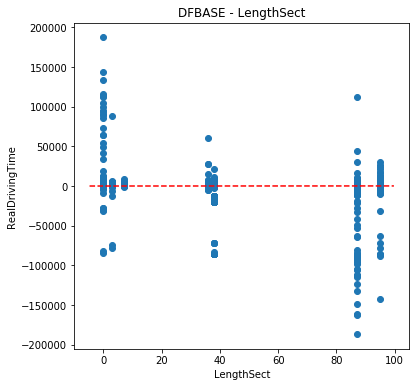

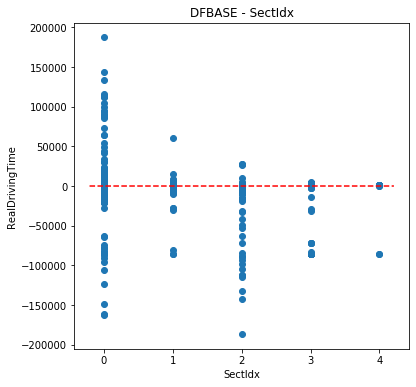

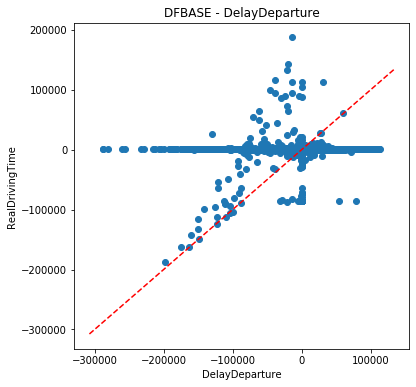

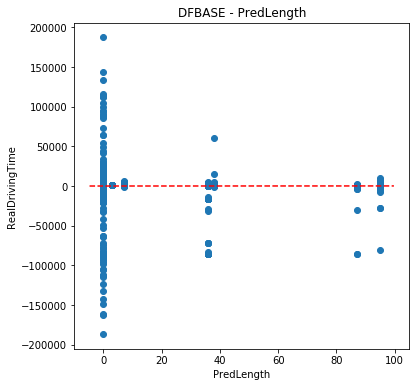

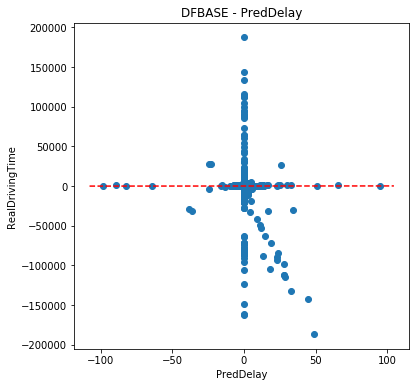

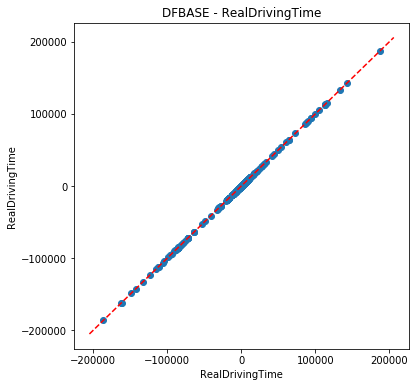

In [211]:
for attr in used_attributes:
    f, ax = plt.subplots(figsize=(6,6))
    ax.scatter(DFBASE[attr], DFBASE[label])
    plt.title("DFBASE - " + attr)
    plt.xlabel(attr)
    plt.ylabel(label)

    ax.plot(ax.get_xlim(), ax.get_xlim(), ls="--", c="r")
    plt.show()

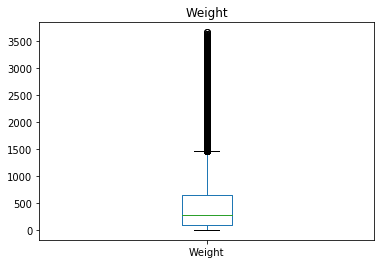

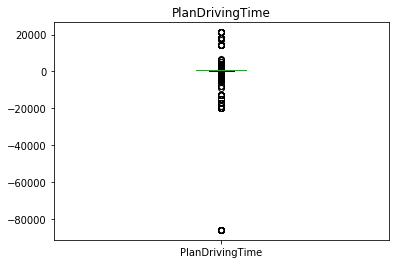

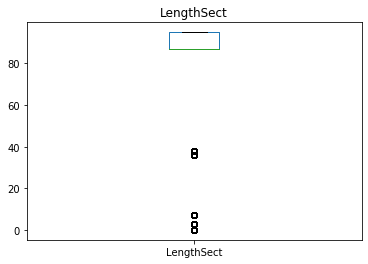

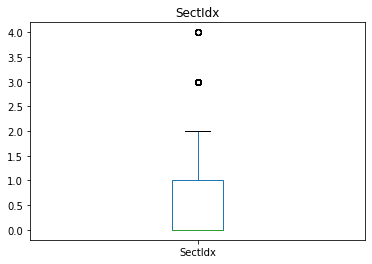

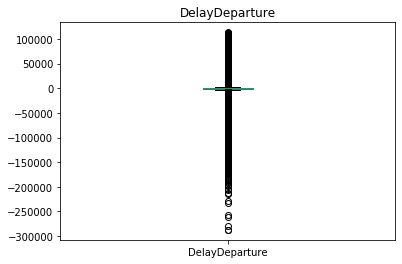

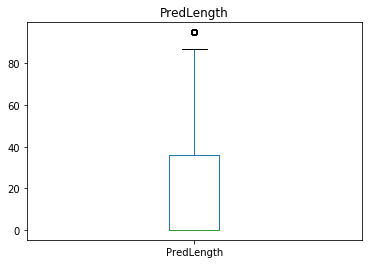

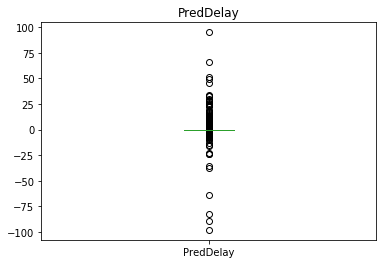

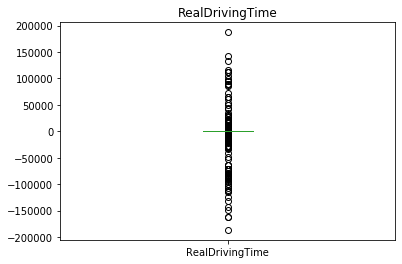

In [212]:
for attr in used_attributes:
    DFCUT.plot(kind='box', y=attr)
    plt.title(attr)
    plt.show()

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 7)
Veľkosť testovacej množniy: (67795, 7)

....................
....................
....................
....................
....................
.................

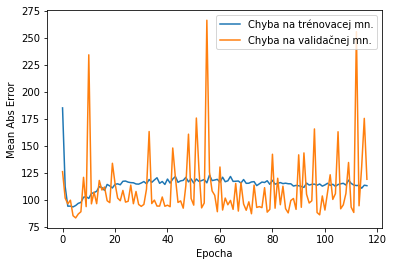

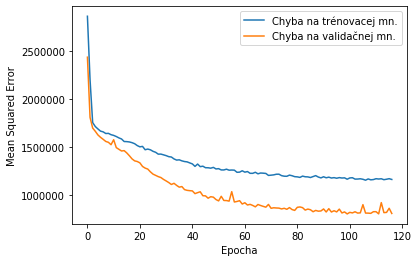

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 104.21 RealDrivingTime 
Testing set Mean Sqrt Error: 1306704.88 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1143.11 RealDrivingTime 


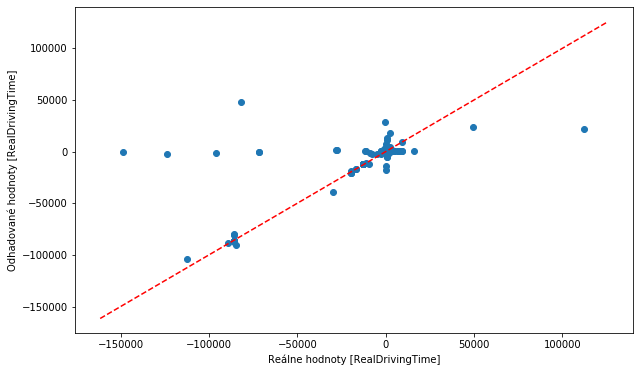

Najväčšia chyba:147723.140625
Najväčšia chyba v zápornom smere:-91011.78125
% približne správnych odhadov: 0.8194704624234825


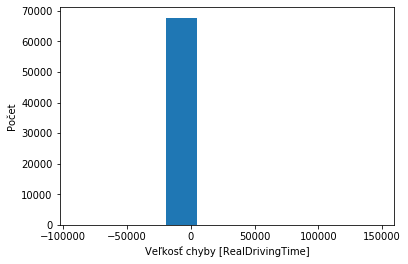

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 1070.05 RealDrivingTime 
Testing set Mean Sqrt Error: 3878278.75 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1969.33 RealDrivingTime 


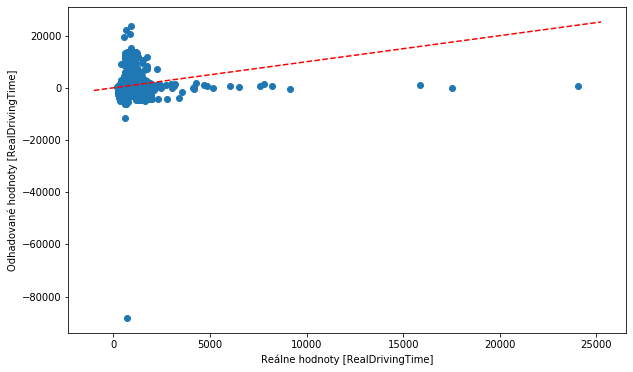

Najväčšia chyba:22920.974609375
Najväčšia chyba v zápornom smere:-89123.078125
% približne správnych odhadov: 0.10615797196781865


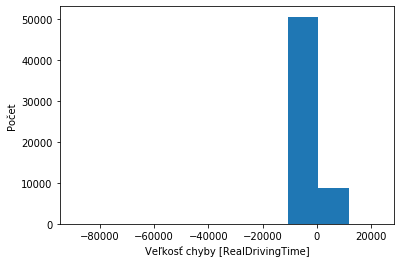

NameError: name 'DFFILTER2' is not defined

In [213]:
CreateAndFitModel("BASE",0.001, 120, "SKBASEModel.h5", used_attributes, topo="64-64")

## FILTER1

In [231]:
test1FILTER1 = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
                    'SectIdx', 'DelayDeparture', 'PredLength','PredDelay',
                    'RealDrivingTime']
test1FILTER1noKor = ['Weight', 'PlanDrivingTime', 
                     'SectIdx', 'DelayDeparture','PredDelay',
                     'RealDrivingTime']

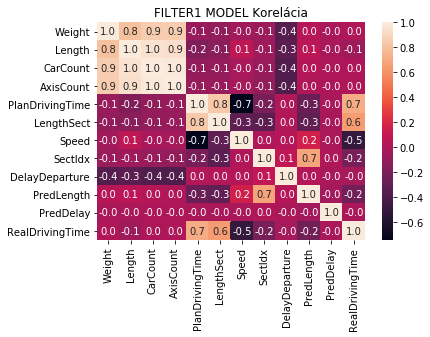

In [229]:
cor = DFFILTER1[test1FILTER1].corr()
plt.title("FILTER1 MODEL Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 11)
Veľkosť testovacej množniy: (59289, 11)

....................
....................
....................
....................
....................
....................
...........

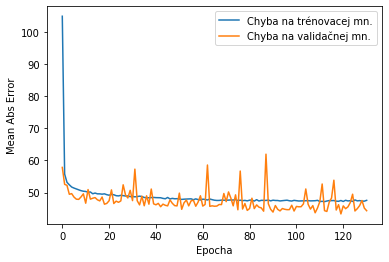

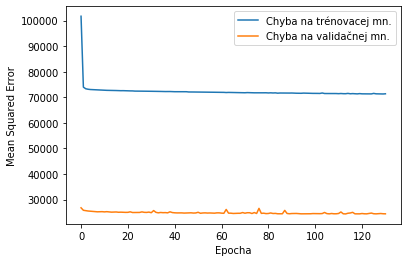

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 176.78 RealDrivingTime 
Testing set Mean Sqrt Error: 3040801.50 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1743.79 RealDrivingTime 


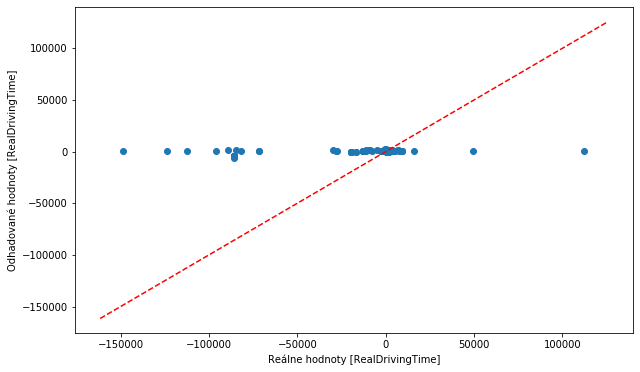

Najväčšia chyba:149202.703125
Najväčšia chyba v zápornom smere:-111899.390625
% približne správnych odhadov: 0.7521646139095803


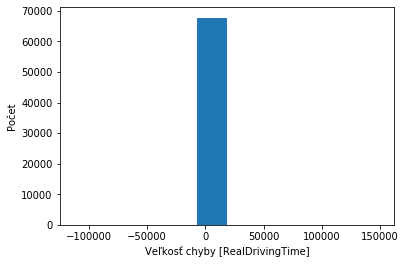

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 44.16 RealDrivingTime 
Testing set Mean Sqrt Error: 31620.12 RealDrivingTime 
Testing set Root Mean Sqrt Error: 177.82 RealDrivingTime 


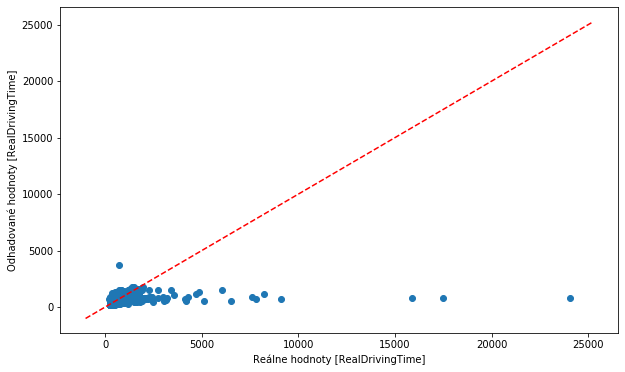

Najväčšia chyba:3007.84423828125
Najväčšia chyba v zápornom smere:-23254.552734375
% približne správnych odhadov: 0.9266137057464285


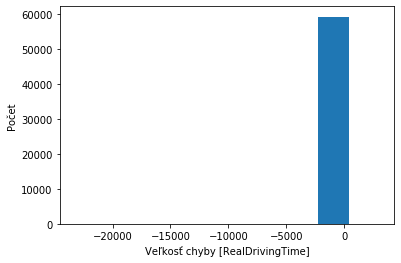

In [230]:
CreateAndFitModel("FILTER1", 0.001, 120, "SKFILTER1Model",test1FILTER1)

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 5)
Veľkosť testovacej množniy: (59289, 5)

....................
....................
....................
....................
....................
....................
....................
...

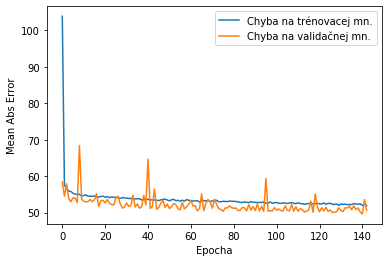

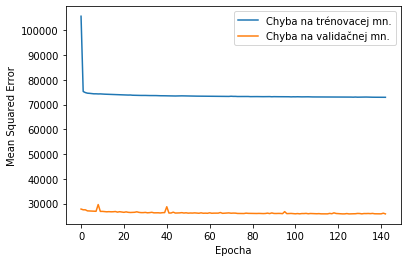

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 185.93 RealDrivingTime 
Testing set Mean Sqrt Error: 3295858.50 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1815.45 RealDrivingTime 


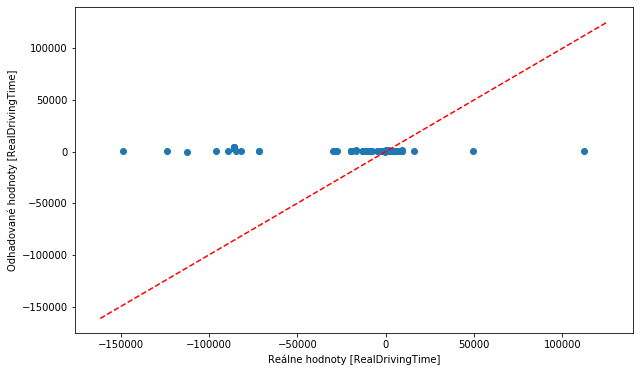

Najväčšia chyba:149319.640625
Najväčšia chyba v zápornom smere:-111529.484375
% približne správnych odhadov: 0.6094107235046833


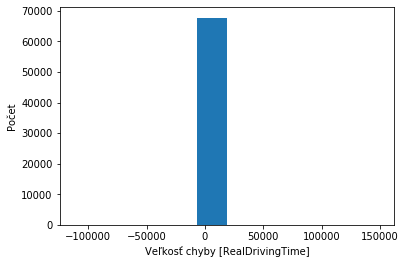

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 50.46 RealDrivingTime 
Testing set Mean Sqrt Error: 32684.00 RealDrivingTime 
Testing set Root Mean Sqrt Error: 180.79 RealDrivingTime 


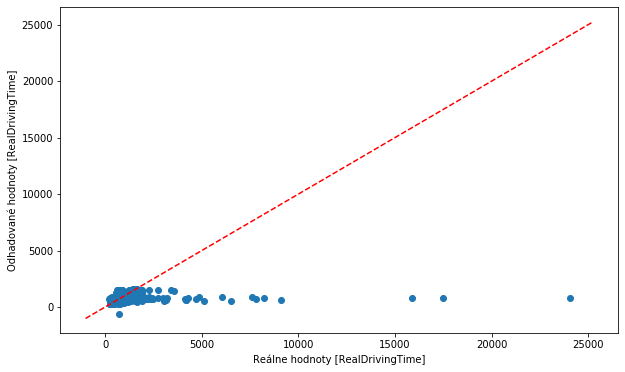

Najväčšia chyba:873.20361328125
Najväčšia chyba v zápornom smere:-23234.515625
% približne správnych odhadov: 0.913137344195382


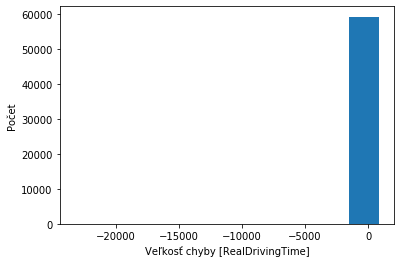

In [232]:
CreateAndFitModel("FILTER1", 0.001, 120, "SKFILTER1ModelNoKor",test1FILTER1noKor)

# Vyhodnotenie - TEST1

### BASELINE 


#### -----Presnosť na BASE dátach-------- 
- MAE: 68.5674164761413
- MSE: 1698619.9943063648
- RMSE: 1303.3111655726598
- % presných odhadhov: 89%

#### ------Presnosť na FILTER1 dátach--------
- MAE: 52.632022803555465
- MSE: 36376.448379969304
- RMSE: 190.72610828087826
- % presných odhadhov:  87%


### BASE

#### ------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 93.52 RealDrivingTime 
- Testing set Mean Sqrt Error: 1221727.25 RealDrivingTime 
- Testing set Root Mean Sqrt Error: 1105.32 RealDrivingTime 
- % presných odhadhov: 84%

------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 588.39 RealDrivingTime 
- Testing set Mean Sqrt Error: 1051591.62 RealDrivingTime 
- Testing set Root Mean Sqrt Error: 1025.47 RealDrivingTime 
- % presných odhadhov: 29%

### FILTER1

------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 176.78 RealDrivingTime 
- Testing set Mean Sqrt Error: 3040801.50 RealDrivingTime 
- Testing set Root Mean Sqrt Error: 1743.79 RealDrivingTime 
- % presných odhadhov: 75%

#### ------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 44.16 RealDrivingTime 
- Testing set Mean Sqrt Error: 31620.12 RealDrivingTime 
- Testing set Root Mean Sqrt Error: 177.82 RealDrivingTime 
- % presných odhadhov: 92%

# Experiment - dropout DelayDeparture

In [233]:
Exp_NoDelay = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
                    'SectIdx', 'PredLength','PredDelay',
                    'RealDrivingTime']

In [234]:
used_attributes = Exp_NoDelay
label = used_attributes[-1]

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 10)
Veľkosť testovacej množniy: (59289, 10)

....................
....................
....................
....................
...................

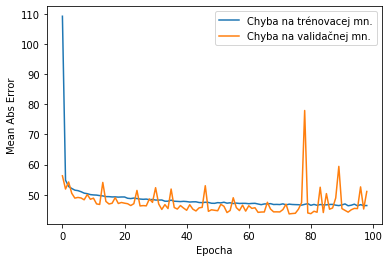

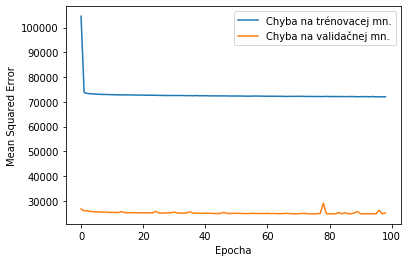

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 204.25 RealDrivingTime 
Testing set Mean Sqrt Error: 3943887.50 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1985.92 RealDrivingTime 


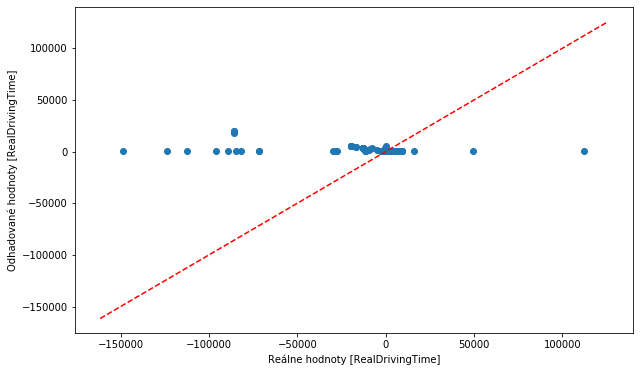

Najväčšia chyba:149182.234375
Najväčšia chyba v zápornom smere:-112138.9453125
% približne správnych odhadov: 0.7180175529168817


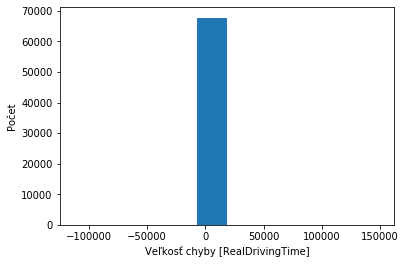

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 44.41 RealDrivingTime 
Testing set Mean Sqrt Error: 32127.95 RealDrivingTime 
Testing set Root Mean Sqrt Error: 179.24 RealDrivingTime 


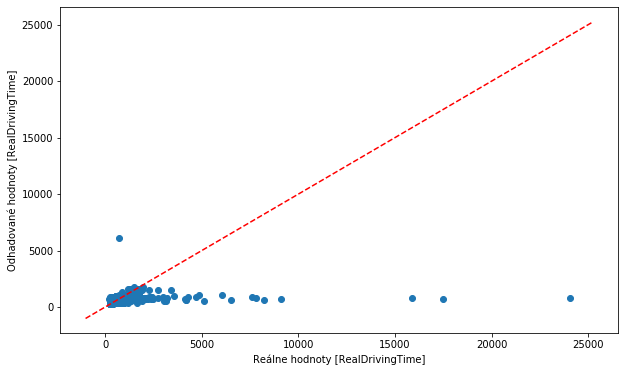

Najväčšia chyba:5379.4814453125
Najväčšia chyba v zápornom smere:-23242.7890625
% približne správnych odhadov: 0.9214862790736899


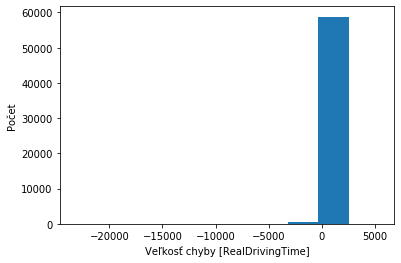

In [235]:
CreateAndFitModel("FILTER1",0.001, 120, "SKFILTER1NoDelayDeparture", used_attributes)

# Experiment - nahradenie premennej DelayDeparture  DelayDepartureReduced
Táto premenná odstráni počiatočné meškanie, a sleduje meškanie získané iba od začatia trasy. 

In [239]:
Exp_reducedDelay = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
                    'SectIdx', 'PredLength','PredDelay', 'DelayDepartureReduced',
                    'RealDrivingTime']

In [240]:
used_attributes = Exp_reducedDelay
label = used_attributes[-1]

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 11)
Veľkosť testovacej množniy: (59289, 11)

....................
....................
....................
....................
....................
....................
.............

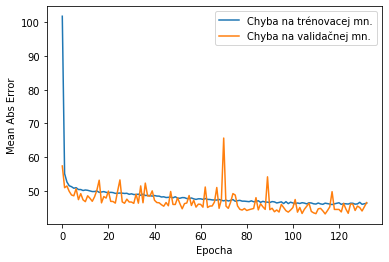

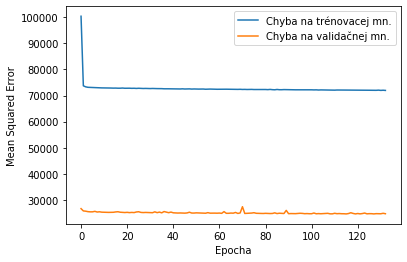

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 226.42 RealDrivingTime 
Testing set Mean Sqrt Error: 3309756.75 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1819.27 RealDrivingTime 


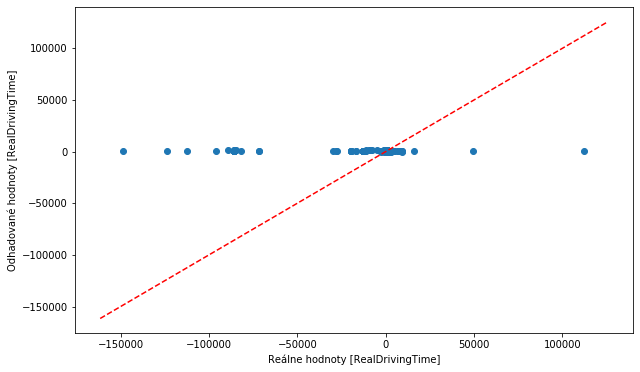

Najväčšia chyba:149172.328125
Najväčšia chyba v zápornom smere:-111783.375
% približne správnych odhadov: 0.7487130319345084


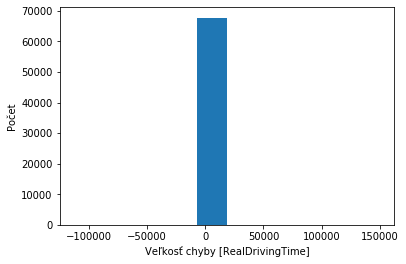

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 44.08 RealDrivingTime 
Testing set Mean Sqrt Error: 31691.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 178.02 RealDrivingTime 


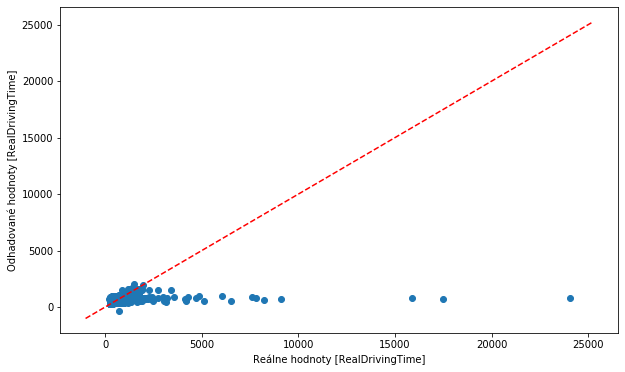

Najväčšia chyba:619.6276245117188
Najväčšia chyba v zápornom smere:-23257.435546875
% približne správnych odhadov: 0.9279798950901517


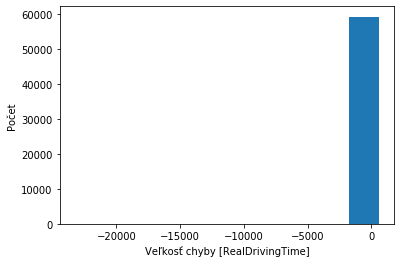

In [241]:
CreateAndFitModel("FILTER1",0.001, 120, "SKFILTER1DelayDepartureReduced", used_attributes)

# Vyhodnotenie


## Odstránenie DelayDeparture

#### ------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 204.25 RealDrivingTime 
- Testing set Mean Sqrt Error: 3943887.50 RealDrivingTime 
- Testing set Root Mean Sqrt Error: 1985.92 RealDrivingTime 
- % presných odhadhov: 72%

#### ------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 44.41 RealDrivingTime 
- Testing set Mean Sqrt Error: 32127.95 RealDrivingTime 
- Testing set Root Mean Sqrt Error: 179.24 RealDrivingTime 
- % presných odhadhov: 92%

## Nahradenie DelayDeparture atribútom DelayDepartureReduced

#### ------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 226.42 RealDrivingTime 
- Testing set Mean Sqrt Error: 3309756.75 RealDrivingTime 
- Testing set Root Mean Sqrt Error: 1819.27 RealDrivingTime 
- % presných odhadhov: 74%

#### ------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 44.08 RealDrivingTime 
- Testing set Mean Sqrt Error: 31691.25 RealDrivingTime 
- Testing set Root Mean Sqrt Error: 178.02 RealDrivingTime 
- % presných odhadhov: 93%


# Test 2 - sledovanie vplyvu typu vlaku na jazdnu dobu
V tomto teste sledujem, aký vplyv na presnosť modelu má vlastnosť typ vlaku.
Novými sledovanými vlastnosťami teda budú:
- Ex 
- Mn
- Nex
- Os 
- Pn
- R
- Sluz
- Sp
- Sv
- Vlec
- Lv

In [48]:
print(DFBASE.TrainType.unique())
print(DFFILTER1.TrainType.unique())

['Pn' 'Os' 'Nex' 'Ex' 'Sv' 'Lv' 'Mn' 'Sluz' 'R']
['Pn' 'Os' 'Nex' 'Ex' 'Sv' 'Mn' 'Sluz' 'Lv' 'R']


In [49]:
def CreateAndFitModelDATA(learning_rate, name, data, attributes_list, topo="64-64"):       
    
    dfCut = data[attributes_list]
    label = attributes_list[-1]
    
    train_dataset = dfCut.sample(frac=0.8, random_state=0)
    test_dataset = dfCut.drop(train_dataset.index)

    train_labels = train_dataset.pop(label)
    test_labels = test_dataset.pop(label)

    print("Veľkosť trénovacej množniy: " + str(train_dataset.shape))
    print("Veľkosť testovacej množniy: " + str(test_dataset.shape))

    train_stats = train_dataset.describe()
    train_stats = train_stats.transpose() 
    
    #normed_train_data = (train_dataset-train_stats['mean']) / train_stats['std']
    #normed_test_data = (test_dataset-train_stats['mean']) / train_stats['std']
    
    normed_train_data = train_dataset
    normed_test_data = test_dataset
    
    #tvorba modelu
    if topo == "128-64-64" :
        # 3 vrstvy
        testModel = keras.Sequential([
            layers.Dense(128, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    elif topo == "96-64-32-32":
        # 4 vrstvy
        testModel = keras.Sequential([
            layers.Dense(96, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    elif topo == "96-64-64-32-32-32":
        # 6 vrstiev
        testModel = keras.Sequential([
            layers.Dense(96, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    else :
        # 2 vrstvy
        testModel = keras.Sequential([
            layers.Dense(64, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(1)
        ])

    optimizer = tf.keras.optimizers.Adam(learning_rate)

    testModel.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=['mae','mse'])
    
    testModelHistory = testModel.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop,save_best_model(name + ".h5"), PrintDot()])
    
    testModel = load_model(name + ".h5")
    
    plot_history(testModelHistory)
    
    eval_Model_Data(testModel,data,attributes_list)

In [50]:
def eval_Model_Data(model,data,attribute_list):
    
    dfCut = data[attribute_list]

    label = attribute_list[-1]
    
    train_dataset = dfCut.sample(frac=0.8, random_state=0)
    test_dataset = dfCut.drop(train_dataset.index)

    train_labels = train_dataset.pop(label)
    test_labels = test_dataset.pop(label)

    train_stats = train_dataset.describe()
    train_stats = train_stats.transpose() 

    #normed_train_data = (train_dataset-train_stats['mean']) / train_stats['std']
    #normed_test_data = (test_dataset-train_stats['mean']) / train_stats['std']
    
    normed_train_data = train_dataset
    normed_test_data = test_dataset
    
    loss, mae, mse = model.evaluate(normed_test_data, test_labels, verbose=0)
    
    print("Testing set Mean Abs Error: {:5.2f} {} ".format(mae, label))
    print("Testing set Mean Sqrt Error: {:5.2f} {} ".format(mse, label))
    print("Testing set Root Mean Sqrt Error: {:5.2f} {} ".format(math.sqrt(mse),label))
    
    # -------------PREDIKCIE--------------------------
    predictions = model.predict(normed_test_data).flatten()

    f, ax = plt.subplots(figsize=(10, 6))
    ax.scatter(test_labels, predictions)
    plt.xlabel('Reálne hodnoty [' + label + ']')
    plt.ylabel('Odhadované hodnoty [' + label + ']')
    
    ax.plot(ax.get_xlim(), ax.get_xlim(), ls="--", c="r")
    plt.show()
    
    # -------------ERRORS - chyby--------------------- 
    error = predictions - test_labels

    print("Najväčšia chyba:" + str(max(error)))
    print("Najväčšia chyba v zápornom smere:" + str(min(error)))

    smallErrors = error[abs(error) < 120] 
    bigErrors = error[abs(error) > 10000] 
    
    #np.sort(bigErrors)    
    #display(data[data.index.isin(bigErrors.index)])

    print("% približne správnych odhadov: " + str(len(smallErrors)/len(error)))

    plt.hist(error)
    plt.xlabel('Veľkosť chyby ['+label+']')
    plt.ylabel("Počet")
    plt.show()

In [87]:
test2BASE = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
            'SectIdx', 'PredLength','PredDelay', 'DelayDeparture',
            'RealDrivingTime']
test2FILTER1 = test2BASE.copy()

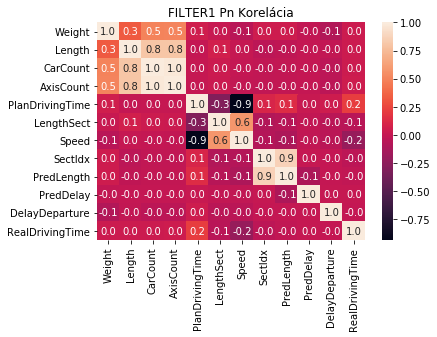

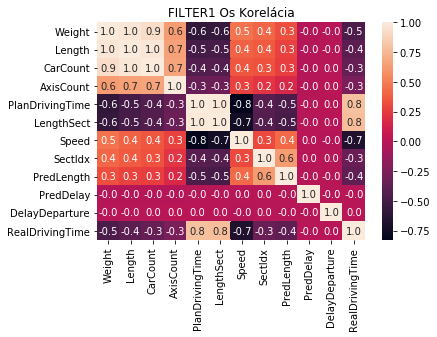

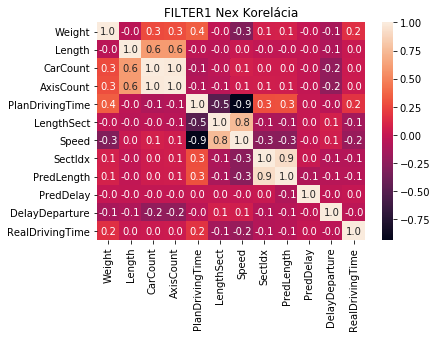

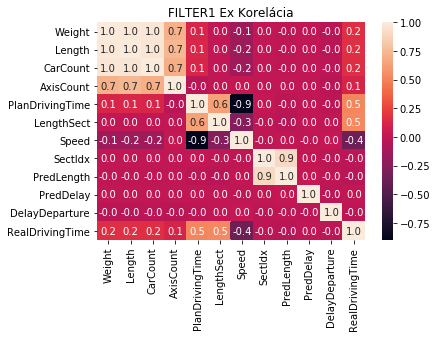

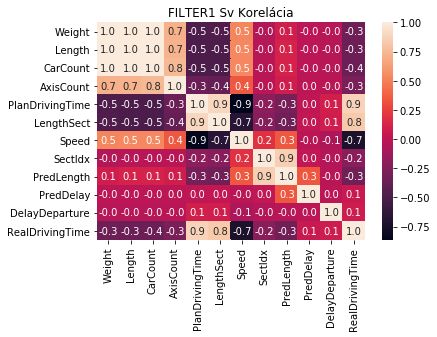

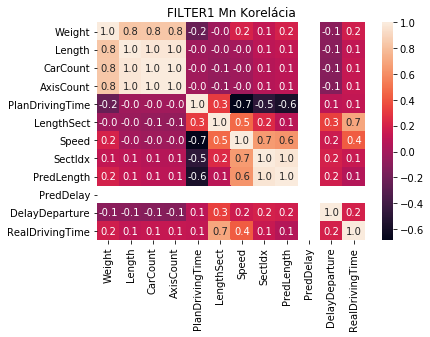

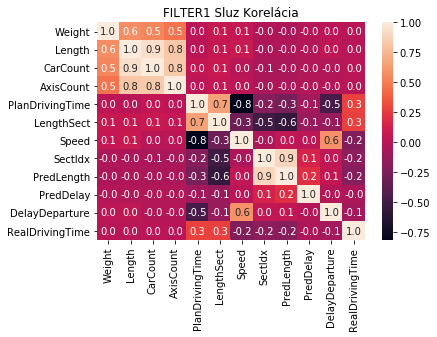

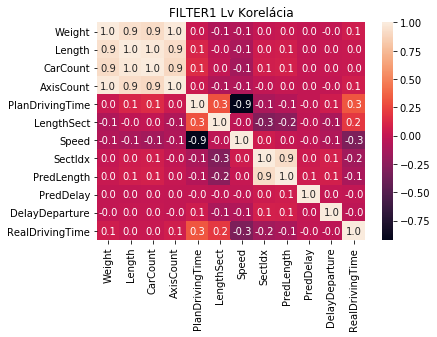

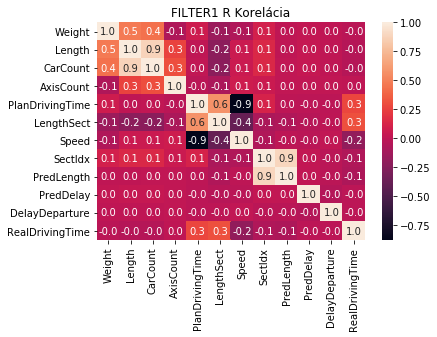

In [251]:
for trainType in DFFILTER1.TrainType.unique():
    typVlakov = DFFILTER1[(DFFILTER1['TrainType'] == trainType)]
    
    cor = typVlakov[test2FILTER1].corr()
    plt.title("FILTER1 " + trainType + " Korelácia")
    sns.heatmap(cor, annot = True, fmt='.1f')    
    plt.show()

## Osobne, nakladne, ostatne

In [52]:
nakladne = DFFILTER1[(DFFILTER1['TrainType'].isin(['Nex','Mn','Pn']))]
osobne = DFFILTER1[(DFFILTER1['TrainType'].isin(['Os','Ex','R']))]
ostatne = DFFILTER1[(DFFILTER1['TrainType'].isin(['Sluz','Sv','Lv']))]

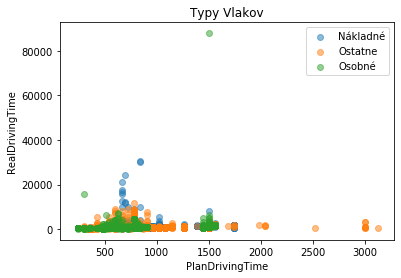

In [86]:
plt.scatter(nakladne['PlanDrivingTime'],nakladne['RealDrivingTime'],alpha=0.5, label='Nákladné')
plt.scatter(ostatne['PlanDrivingTime'],ostatne['RealDrivingTime'],alpha=0.5, label='Ostatne')
plt.scatter(osobne['PlanDrivingTime'],osobne['RealDrivingTime'],alpha=0.5, label='Osobné')
plt.ylabel("RealDrivingTime")
plt.xlabel("PlanDrivingTime")
plt.title("Typy Vlakov")
plt.legend()
plt.show()

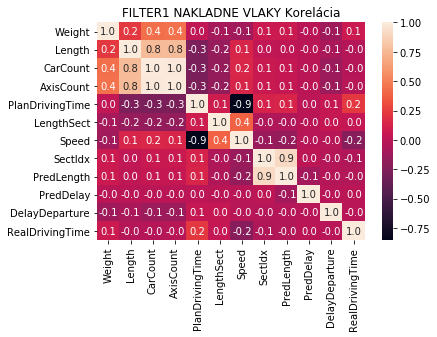

In [267]:
cor = nakladne[test2FILTER1].corr()
plt.title("FILTER1 NAKLADNE VLAKY Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

No handles with labels found to put in legend.


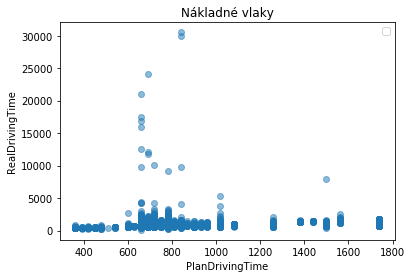

In [53]:
plt.scatter(nakladne['PlanDrivingTime'],nakladne['RealDrivingTime'],alpha=0.5)
plt.ylabel("RealDrivingTime")
plt.xlabel("PlanDrivingTime")
plt.title("Nákladné vlaky")
plt.legend()
plt.show()

Veľkosť trénovacej množniy: (66475, 11)
Veľkosť testovacej množniy: (16619, 11)

....................
....................
....................
....................
.

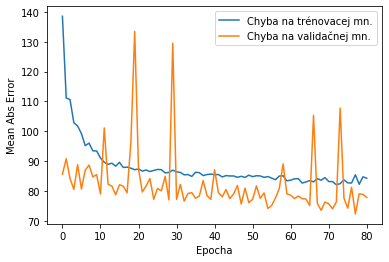

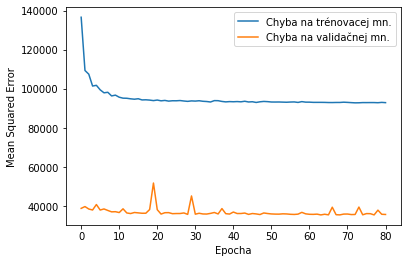

Testing set Mean Abs Error: 78.57 RealDrivingTime 
Testing set Mean Sqrt Error: 28704.46 RealDrivingTime 
Testing set Root Mean Sqrt Error: 169.42 RealDrivingTime 


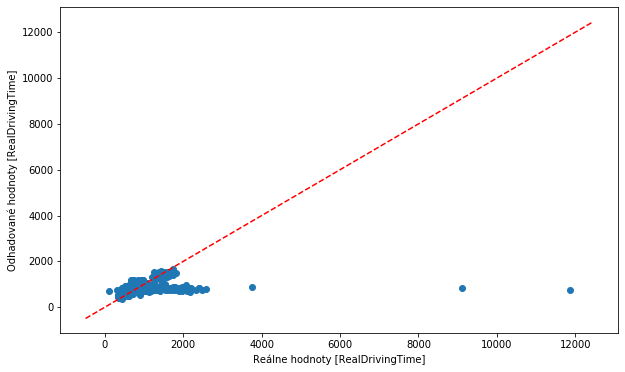

Najväčšia chyba:627.002685546875
Najväčšia chyba v zápornom smere:-11113.5576171875
% približne správnych odhadov: 0.802755881822011


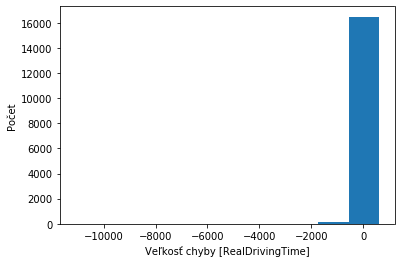

In [268]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypesNakladne", nakladne, test2FILTER1)

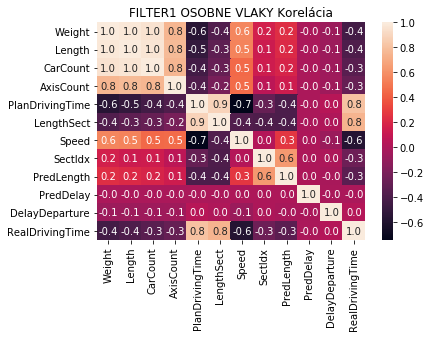

In [269]:
cor = osobne[test2FILTER1].corr()
plt.title("FILTER1 OSOBNE VLAKY Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

No handles with labels found to put in legend.


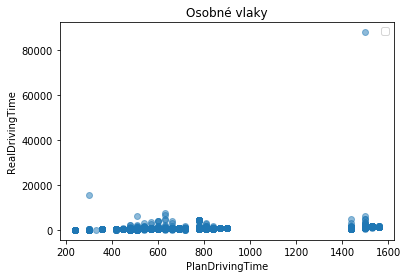

In [54]:
plt.scatter(osobne['PlanDrivingTime'],osobne['RealDrivingTime'],alpha=0.5)
plt.ylabel("RealDrivingTime")
plt.xlabel("PlanDrivingTime")
plt.title("Osobné vlaky")
plt.legend()
plt.show()

Veľkosť trénovacej množniy: (147885, 11)
Veľkosť testovacej množniy: (36971, 11)

....................
....................
....................
..................

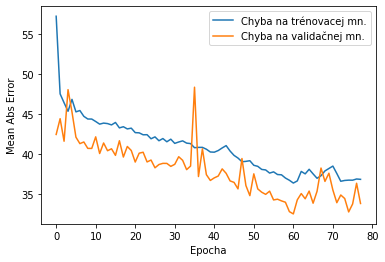

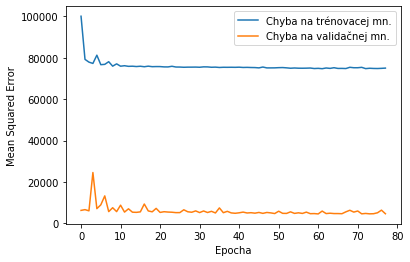

Testing set Mean Abs Error: 33.29 RealDrivingTime 
Testing set Mean Sqrt Error: 6724.80 RealDrivingTime 
Testing set Root Mean Sqrt Error: 82.00 RealDrivingTime 


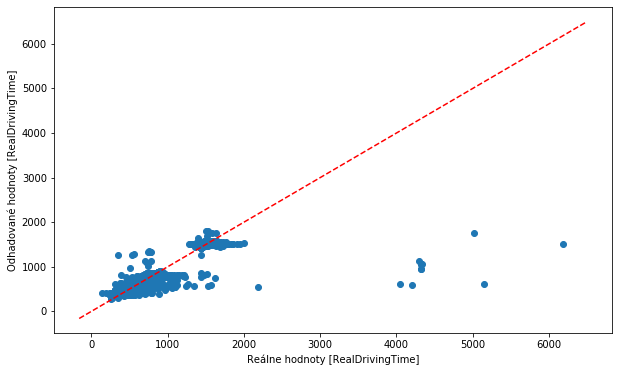

Najväčšia chyba:922.6563720703125
Najväčšia chyba v zápornom smere:-4686.984375
% približne správnych odhadov: 0.9749533418084445


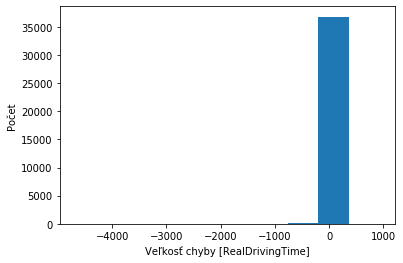

In [270]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypesOsobne", osobne, test2FILTER1)

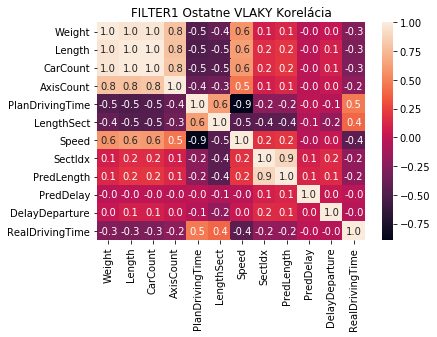

In [271]:
cor = ostatne[test2FILTER1].corr()
plt.title("FILTER1 Ostatne VLAKY Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

No handles with labels found to put in legend.


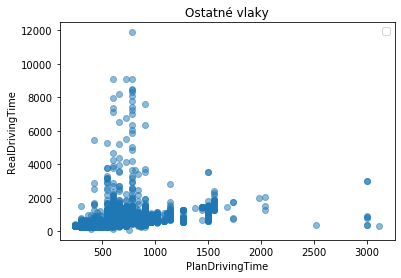

In [55]:
plt.scatter(ostatne['PlanDrivingTime'],ostatne['RealDrivingTime'],alpha=0.5)
plt.ylabel("RealDrivingTime")
plt.xlabel("PlanDrivingTime")
plt.title("Ostatné vlaky")
plt.legend()
plt.show()

Veľkosť trénovacej množniy: (22796, 11)
Veľkosť testovacej množniy: (5699, 11)

....................
....................
....................
.................

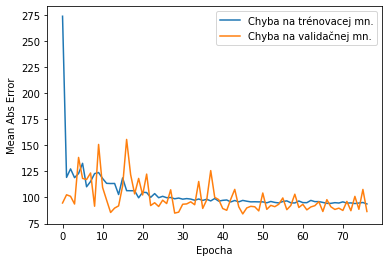

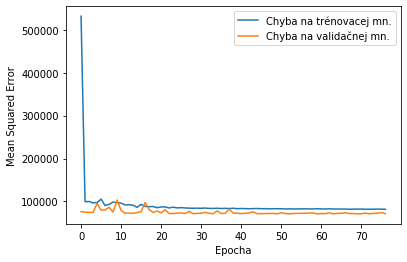

Testing set Mean Abs Error: 87.74 RealDrivingTime 
Testing set Mean Sqrt Error: 44436.20 RealDrivingTime 
Testing set Root Mean Sqrt Error: 210.80 RealDrivingTime 


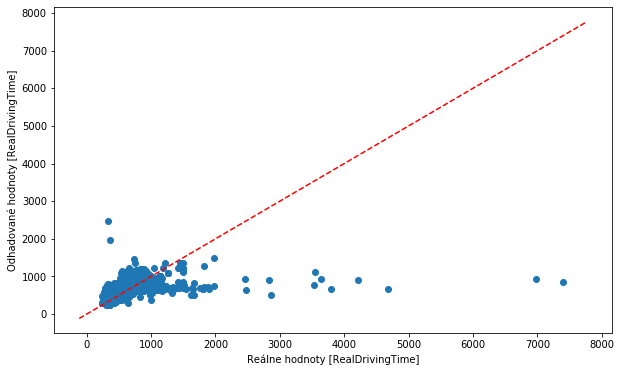

Najväčšia chyba:2134.133056640625
Najväčšia chyba v zápornom smere:-6563.058837890625
% približne správnych odhadov: 0.7857518862958414


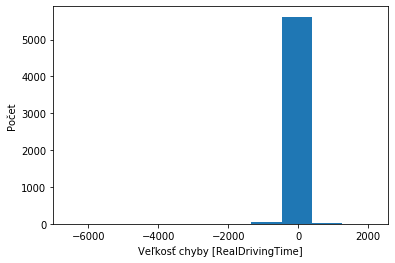

In [272]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypesOstatne", ostatne, test2FILTER1)

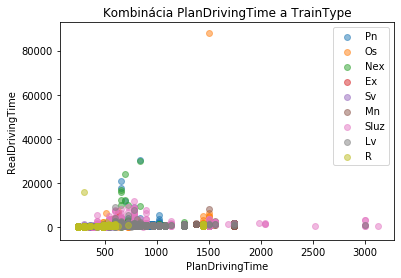

In [248]:
for vlak in DFFILTER1.TrainType.unique():
    subDF = DFFILTER1[(DFFILTER1['TrainType'] == vlak)]
    plt.scatter(subDF['PlanDrivingTime'],subDF['RealDrivingTime'],alpha=0.5,label=vlak)

plt.ylabel("RealDrivingTime")
plt.xlabel("PlanDrivingTime")
plt.title("Kombinácia PlanDrivingTime a TrainType")
plt.legend()
plt.show()


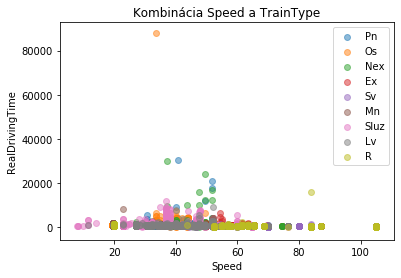

In [249]:
for vlak in DFFILTER1.TrainType.unique():
    subDF = DFFILTER1[(DFFILTER1['TrainType'] == vlak)]
    plt.scatter(subDF['Speed'],subDF['RealDrivingTime'],alpha=0.5,label=vlak)

plt.ylabel("RealDrivingTime")
plt.xlabel("Speed")
plt.title("Kombinácia Speed a TrainType")
plt.legend()
plt.show()


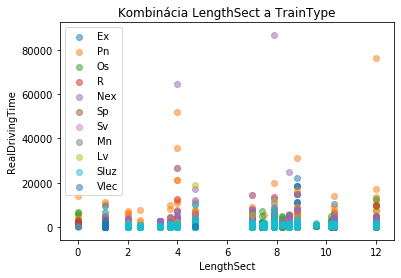

In [146]:
for vlak in DFFILTER1.TrainType.unique():
    subDF = DFFILTER1[(DFFILTER1['TrainType'] == vlak)]
    plt.scatter(subDF['LengthSect'],subDF['RealDrivingTime'],alpha=0.5,label=vlak)

plt.ylabel("RealDrivingTime")
plt.xlabel("LengthSect")
plt.title("Kombinácia LengthSect a TrainType")
plt.legend()
plt.show()


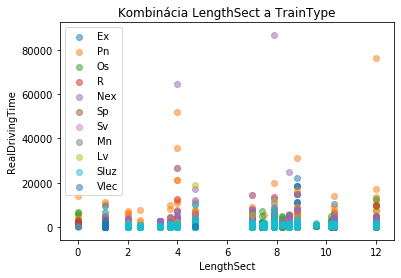

In [146]:
plt.scatter(osobne['LengthSect'],osobne['RealDrivingTime'],alpha=0.5,label='osobné vlaky(Os,R,Ex)')
plt.scatter(nakladne['LengthSect'],nakladne['RealDrivingTime'],alpha=0.5,label='nákladné vlaky(Pn,Nex,Mn)')
plt.scatter(osobne['LengthSect'],osobne['RealDrivingTime'],alpha=0.5,label='osobné vlaky(Os,R,Ex)')

plt.ylabel("RealDrivingTime")
plt.xlabel("LengthSect")
plt.title("Kombinácia LengthSect a TrainType")
plt.legend()
plt.show()


In [77]:
test2BASEOneHot = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
            'SectIdx', 'PredLength','PredDelay', 'DelayDeparture']
test2FILTER1OneHot = test2BASEOneHot.copy()

## One-Hot encoding
Typy vlakov získame z vlastnosti TrainType, ale keďže je hodnota kategorická a neordinálna, tak algoritmus strojového učenia s ňou nevie pracovať. Preto použijem techniku nazvanú one-hot encoding ktorá každému údaju pridá aj informáciu o tom, či daný vlak je alebo nieje daného typu

In [78]:
type = DFBASE['TrainType']
for typ in DFBASE.TrainType.unique():
    test2BASEOneHot.append(typ)
    DFBASE[typ] = (type == typ)*1.0

type = DFFILTER1['TrainType']
for typ in DFFILTER1.TrainType.unique():
    test2FILTER1OneHot.append(typ)
    DFFILTER1[typ] = (type == typ)*1.0    

test2BASEOneHot.append('RealDrivingTime')
test2FILTER1OneHot.append('RealDrivingTime')

Najväčší lineárny plyv na meškanie má vlastnosť Ex, čo znamená, že vlaky Typu Ex mávajú menšie meškania ako iné vlaky. Podobný vlpyv májú aj vlaky typu R. 
Naopak väčšie meškania majú vlaky typu Pn, Os, Nex, Mn 

Avšak tieto korelácie sú veľmi slabé

In [79]:
cor_vlastnosti = DFFILTER1.TrainType.unique().copy()
cor_vlastnosti = np.append(cor_vlastnosti,['RealDrivingTime'])

DFCUT = DFFILTER1[cor_vlastnosti]
cor = DFCUT.corr()
print(cor['RealDrivingTime'].sort_values(ascending=False))

RealDrivingTime    1.000000
Os                 0.224233
Mn                 0.066164
Nex                0.043968
Pn                 0.037592
Sluz               0.012638
Lv                -0.032882
Sv                -0.122468
R                 -0.142569
Ex                -0.233779
Name: RealDrivingTime, dtype: float64


Počet vlakov pre každý typ:
Pn: 37410
Os: 119146
Nex: 44420
Ex: 47404
Sv: 4913
Mn: 1264
Sluz: 3789
Lv: 19793
R: 18306


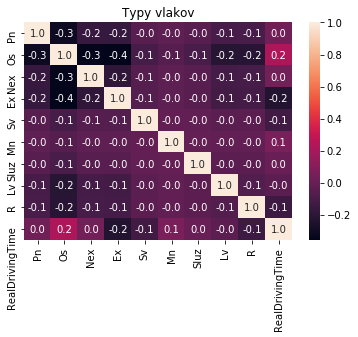

In [80]:
plt.title("Typy vlakov")
sns.heatmap(cor, annot = True, fmt='.1f')    

print("Počet vlakov pre každý typ:")
for typ_vlaku in DFFILTER1.TrainType.unique():
    print(typ_vlaku + ": " + str(len(DFFILTER1[(DFFILTER1[typ_vlaku] == 1.0)])))

# FILTER 1  - OSOBNE, NAKLADNE,OSTATNE VLAKY 64-64

Veľkosť trénovacej množniy: (147885, 11)
Veľkosť testovacej množniy: (36971, 11)

....................
....................
................

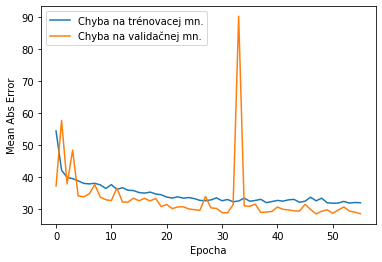

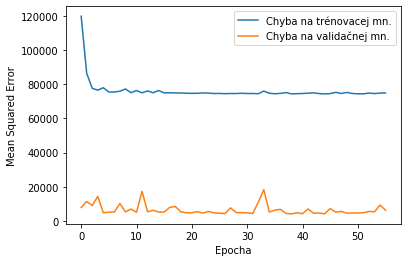

Testing set Mean Abs Error: 29.71 RealDrivingTime 
Testing set Mean Sqrt Error: 6131.92 RealDrivingTime 
Testing set Root Mean Sqrt Error: 78.31 RealDrivingTime 


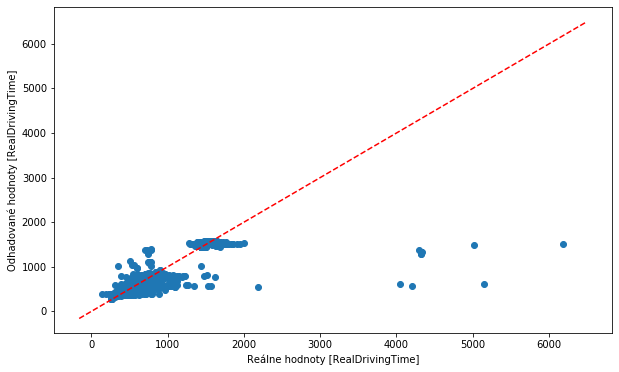

Najväčšia chyba:678.1449584960938
Najväčšia chyba v zápornom smere:-4672.58544921875
% približne správnych odhadov: 0.9793351545806173


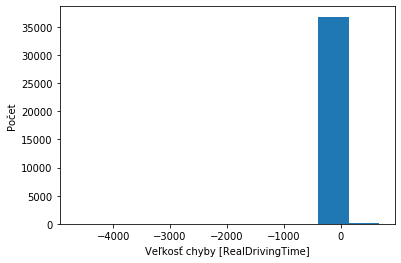

In [88]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes2Osobne", osobne, test2FILTER1, "64-64")

Veľkosť trénovacej množniy: (66475, 11)
Veľkosť testovacej množniy: (16619, 11)

....................
....................

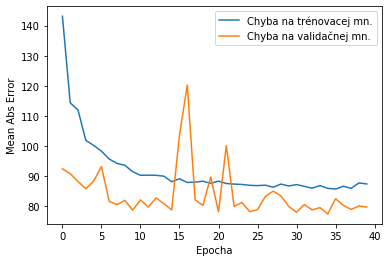

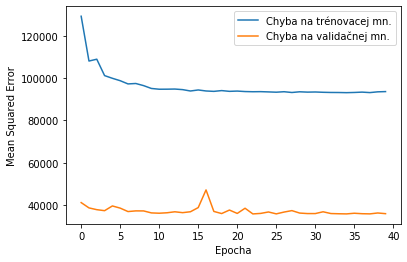

Testing set Mean Abs Error: 81.06 RealDrivingTime 
Testing set Mean Sqrt Error: 28861.47 RealDrivingTime 
Testing set Root Mean Sqrt Error: 169.89 RealDrivingTime 


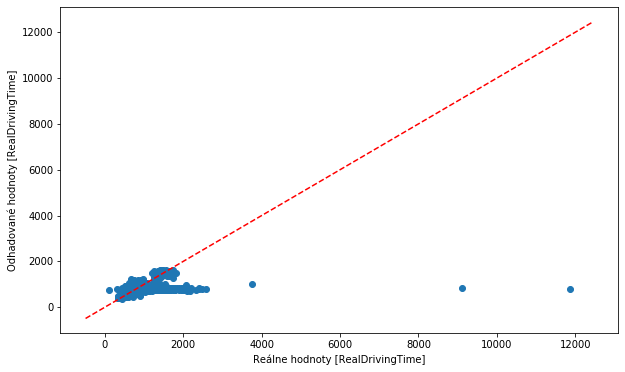

Najväčšia chyba:648.3453979492188
Najväčšia chyba v zápornom smere:-11077.6728515625
% približne správnych odhadov: 0.8359708767073831


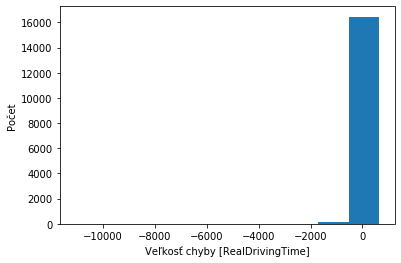

In [89]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes2Nakladne", nakladne, test2FILTER1, "64-64")

Veľkosť trénovacej množniy: (22796, 11)
Veľkosť testovacej množniy: (5699, 11)

....................
....................
....................
....................
....................
..

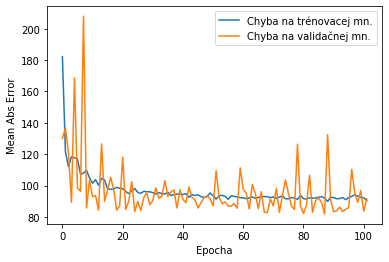

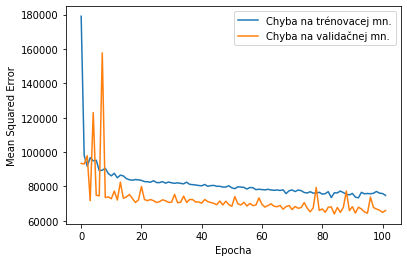

Testing set Mean Abs Error: 88.08 RealDrivingTime 
Testing set Mean Sqrt Error: 41667.03 RealDrivingTime 
Testing set Root Mean Sqrt Error: 204.13 RealDrivingTime 


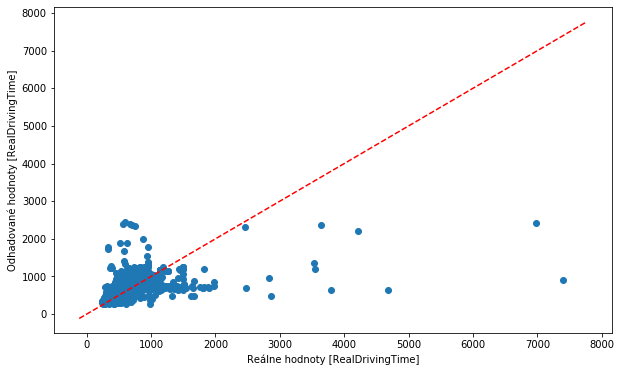

Najväčšia chyba:1850.07373046875
Najväčšia chyba v zápornom smere:-6508.036315917969
% približne správnych odhadov: 0.782768906825759


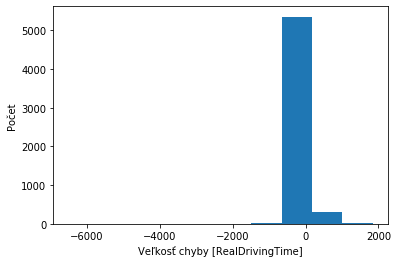

In [90]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes2Ostatne", ostatne, test2FILTER1, "64-64")

# FILTER 1  - OSOBNE, NAKLADNE,OSTATNE VLAKY 128-64-64

Veľkosť trénovacej množniy: (147885, 11)
Veľkosť testovacej množniy: (36971, 11)

....................
....................
....................
....................
.............

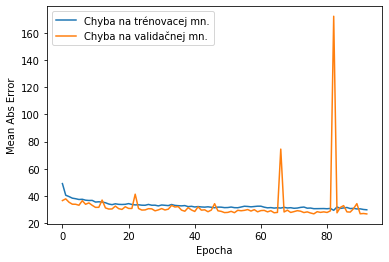

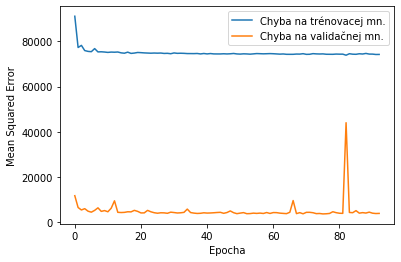

Testing set Mean Abs Error: 28.04 RealDrivingTime 
Testing set Mean Sqrt Error: 5690.04 RealDrivingTime 
Testing set Root Mean Sqrt Error: 75.43 RealDrivingTime 


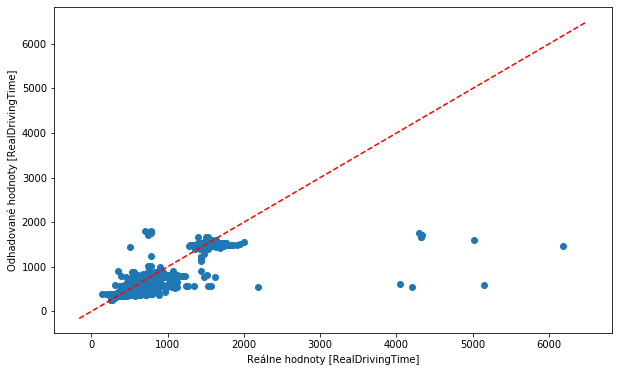

Najväčšia chyba:1104.392822265625
Najväčšia chyba v zápornom smere:-4722.04443359375
% približne správnych odhadov: 0.9796867815314706


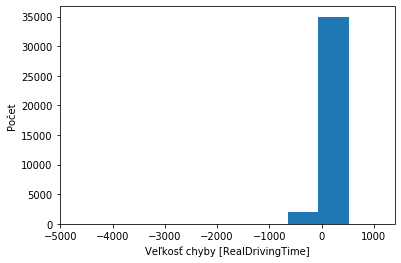

In [91]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes3Osobne", osobne, test2FILTER1, "128-64-64")

Veľkosť trénovacej množniy: (66475, 11)
Veľkosť testovacej množniy: (16619, 11)

....................
....................
..

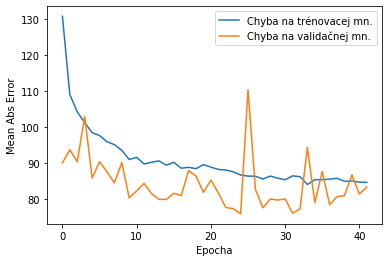

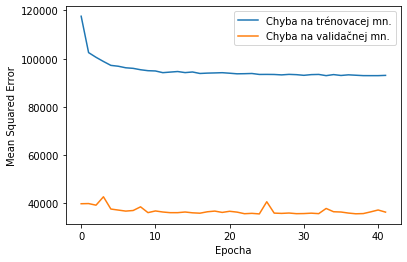

Testing set Mean Abs Error: 76.77 RealDrivingTime 
Testing set Mean Sqrt Error: 28609.22 RealDrivingTime 
Testing set Root Mean Sqrt Error: 169.14 RealDrivingTime 


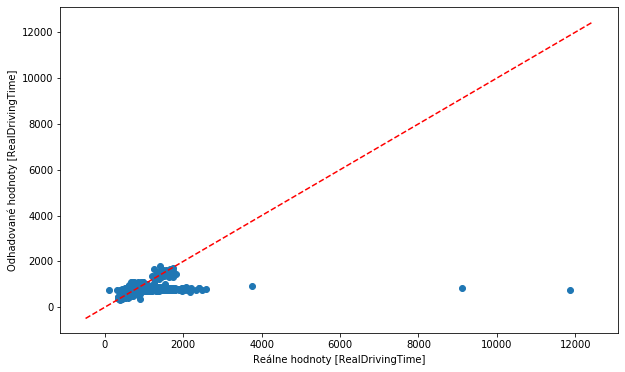

Najväčšia chyba:633.1337280273438
Najväčšia chyba v zápornom smere:-11099.56640625
% približne správnych odhadov: 0.8435525603225225


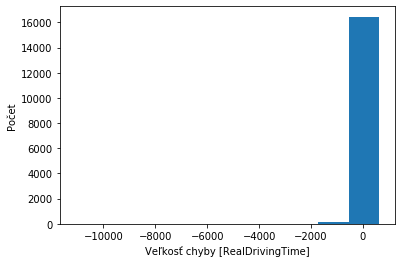

In [92]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes3Nakladne", nakladne, test2FILTER1, "128-64-64")

Veľkosť trénovacej množniy: (22796, 11)
Veľkosť testovacej množniy: (5699, 11)

....................
....................
....................
....................
.......

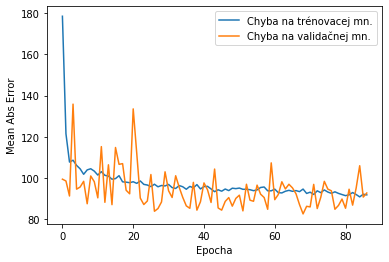

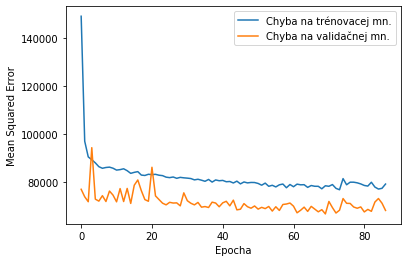

Testing set Mean Abs Error: 83.79 RealDrivingTime 
Testing set Mean Sqrt Error: 42067.86 RealDrivingTime 
Testing set Root Mean Sqrt Error: 205.10 RealDrivingTime 


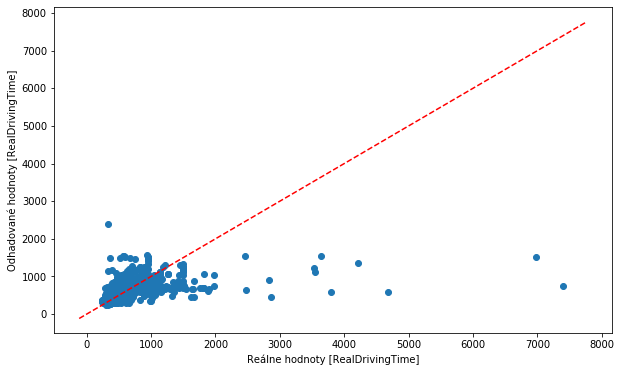

Najväčšia chyba:2065.655517578125
Najväčšia chyba v zápornom smere:-6662.438781738281
% približne správnych odhadov: 0.8210212317950517


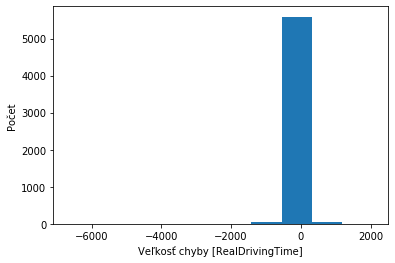

In [93]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes3Ostatne", ostatne, test2FILTER1, "128-64-64")

# FILTER 1  - OSOBNE, NAKLADNE,OSTATNE VLAKY  96-64-32-32

Veľkosť trénovacej množniy: (147885, 11)
Veľkosť testovacej množniy: (36971, 11)

....................
....................
........

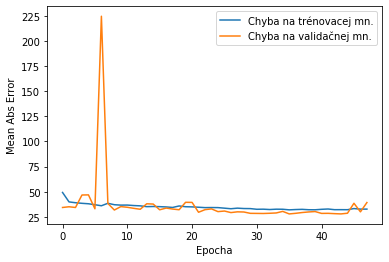

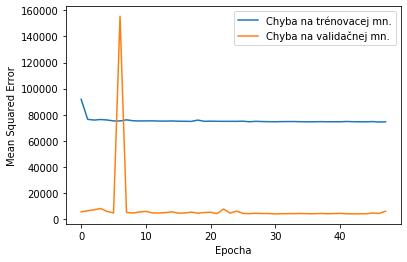

Testing set Mean Abs Error: 29.14 RealDrivingTime 
Testing set Mean Sqrt Error: 5987.22 RealDrivingTime 
Testing set Root Mean Sqrt Error: 77.38 RealDrivingTime 


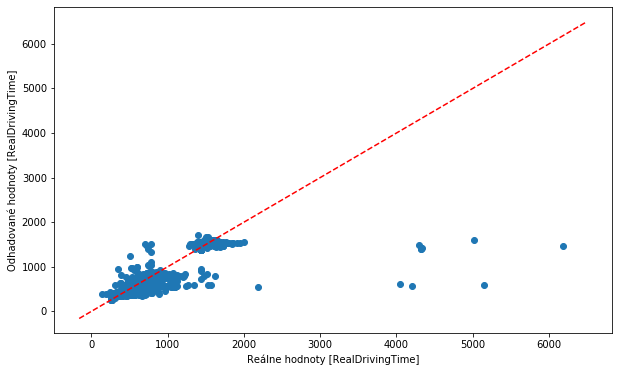

Najväčšia chyba:802.5499267578125
Najväčšia chyba v zápornom smere:-4714.3505859375
% približne správnych odhadov: 0.9806064212490871


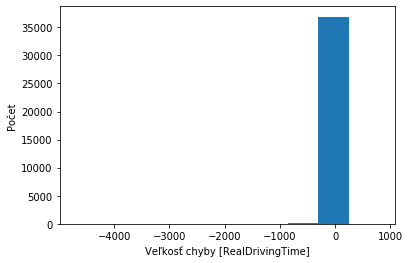

In [97]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes4Osobne", osobne, test2FILTER1, "96-64-32-32")

Veľkosť trénovacej množniy: (66475, 11)
Veľkosť testovacej množniy: (16619, 11)

....................
....................
....................

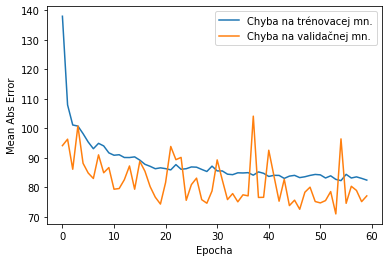

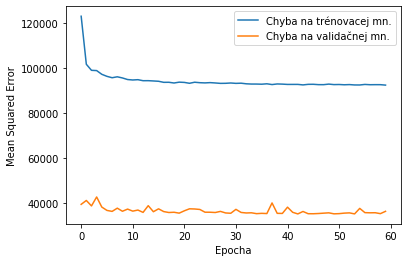

Testing set Mean Abs Error: 76.23 RealDrivingTime 
Testing set Mean Sqrt Error: 28261.03 RealDrivingTime 
Testing set Root Mean Sqrt Error: 168.11 RealDrivingTime 


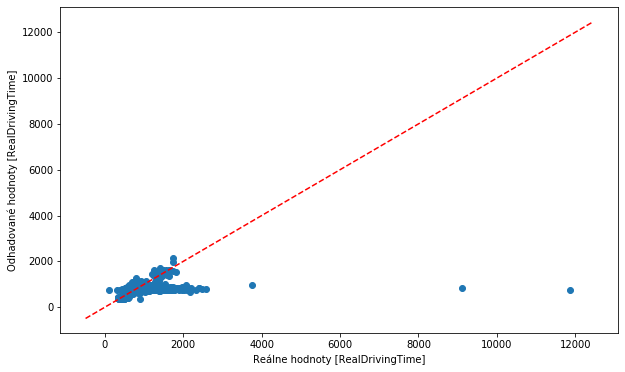

Najväčšia chyba:635.6016845703125
Najväčšia chyba v zápornom smere:-11098.8740234375
% približne správnych odhadov: 0.8301943558577531


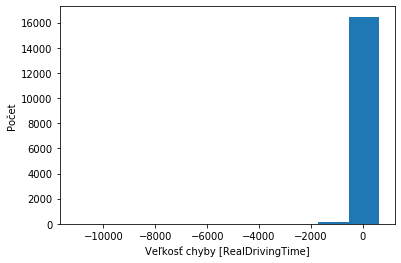

In [98]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes4Nakladne", nakladne, test2FILTER1, "96-64-32-32")

Veľkosť trénovacej množniy: (22796, 11)
Veľkosť testovacej množniy: (5699, 11)

....................
....................
....................
........

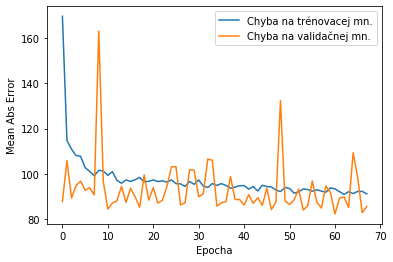

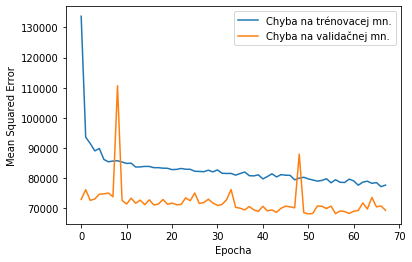

Testing set Mean Abs Error: 84.68 RealDrivingTime 
Testing set Mean Sqrt Error: 43335.54 RealDrivingTime 
Testing set Root Mean Sqrt Error: 208.17 RealDrivingTime 


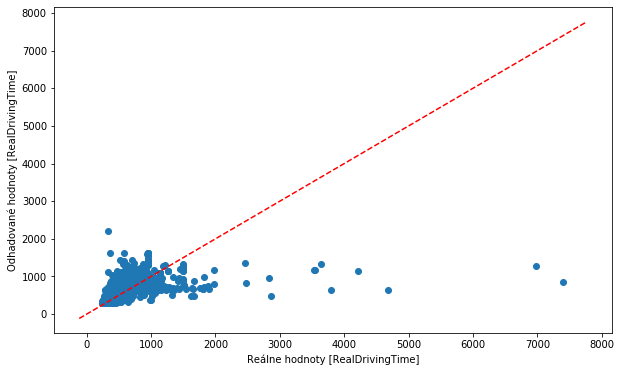

Najväčšia chyba:1876.777099609375
Najväčšia chyba v zápornom smere:-6549.972900390625
% približne správnych odhadov: 0.8117213546236182


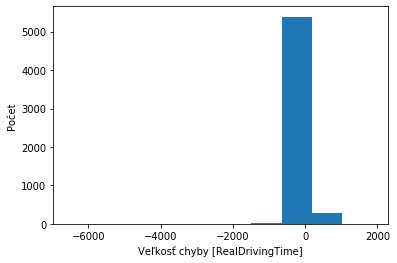

In [99]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes4Ostatne", ostatne, test2FILTER1, "96-64-32-32")

# FILTER 1  - OSOBNE, NAKLADNE,OSTATNE VLAKY  96-64-64-32-32-32

Veľkosť trénovacej množniy: (147885, 11)
Veľkosť testovacej množniy: (36971, 11)

....................
....................
....................
....................
....................
..

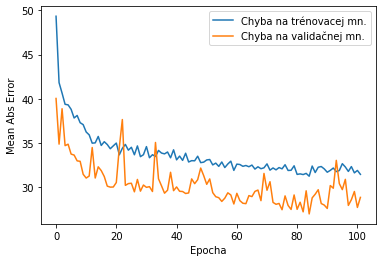

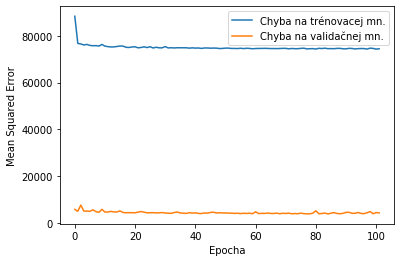

Testing set Mean Abs Error: 27.63 RealDrivingTime 
Testing set Mean Sqrt Error: 5783.50 RealDrivingTime 
Testing set Root Mean Sqrt Error: 76.05 RealDrivingTime 


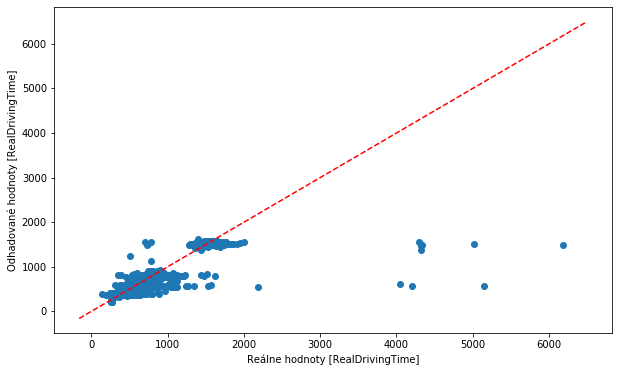

Najväčšia chyba:836.1251220703125
Najväčšia chyba v zápornom smere:-4708.2373046875
% približne správnych odhadov: 0.9817965432365908


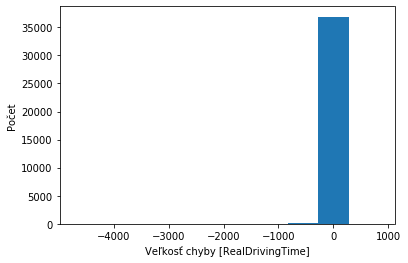

In [100]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes6Osobne", osobne, test2FILTER1, "96-64-64-32-32-32")

Veľkosť trénovacej množniy: (66475, 11)
Veľkosť testovacej množniy: (16619, 11)

....................
....................
....................
....................
....................
....................
....................
..........

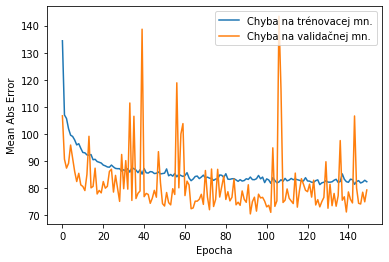

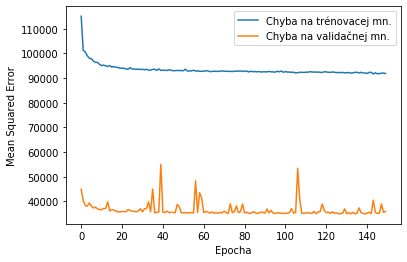

Testing set Mean Abs Error: 74.55 RealDrivingTime 
Testing set Mean Sqrt Error: 28183.60 RealDrivingTime 
Testing set Root Mean Sqrt Error: 167.88 RealDrivingTime 


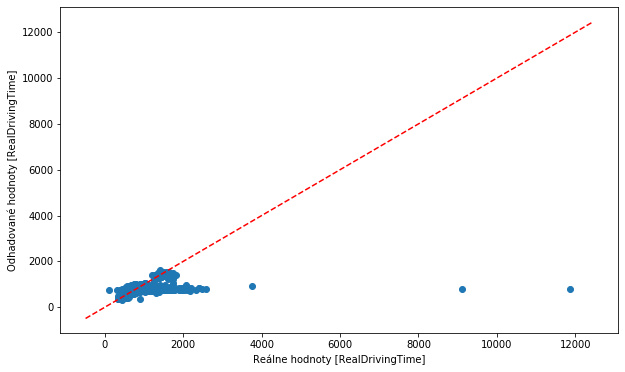

Najväčšia chyba:633.9835815429688
Najväčšia chyba v zápornom smere:-11083.4765625
% približne správnych odhadov: 0.8290510861062639


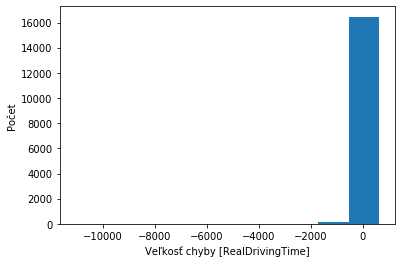

In [101]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes6Nakladne", nakladne, test2FILTER1, "96-64-64-32-32-32")

Veľkosť trénovacej množniy: (22796, 11)
Veľkosť testovacej množniy: (5699, 11)

....................
....................
....................
....................
....................
....................
.........

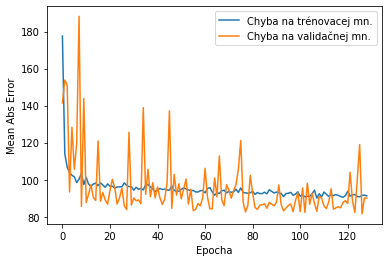

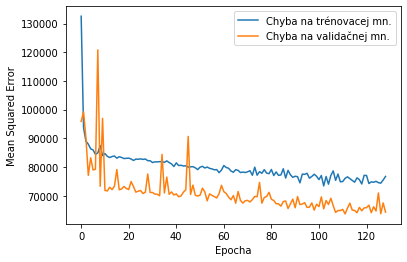

Testing set Mean Abs Error: 83.36 RealDrivingTime 
Testing set Mean Sqrt Error: 40317.40 RealDrivingTime 
Testing set Root Mean Sqrt Error: 200.79 RealDrivingTime 


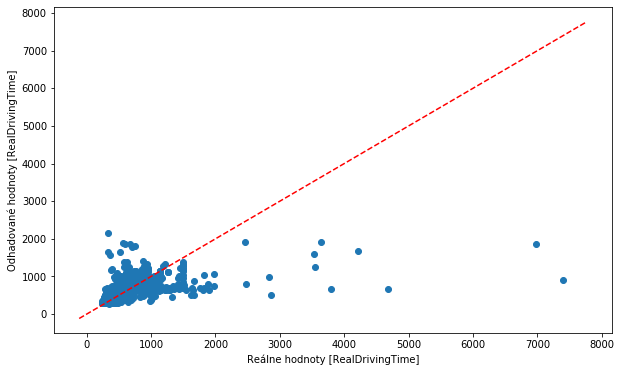

Najväčšia chyba:1806.744873046875
Najväčšia chyba v zápornom smere:-6494.71044921875
% približne správnych odhadov: 0.8227759256009827


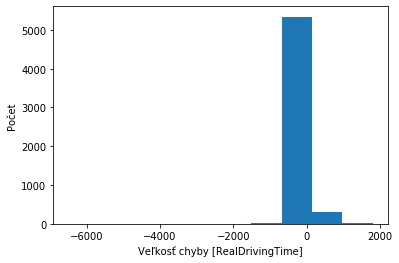

In [102]:
CreateAndFitModelDATA(0.001, "SKFILTER1TrainTypes6Ostatne", ostatne, test2FILTER1, "96-64-64-32-32-32")

### OneHot TrainTypes BASE 64-64

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 20)
Veľkosť testovacej množniy: (67795, 20)

....................
....................
....................
....................
....................
....................
....................
..........

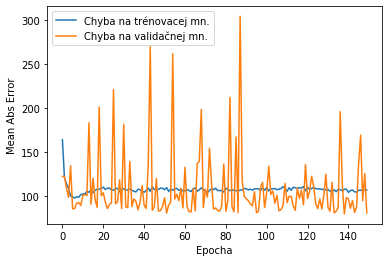

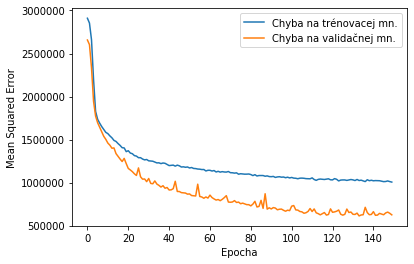

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 83.44 RealDrivingTime 
Testing set Mean Sqrt Error: 1209172.00 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1099.62 RealDrivingTime 


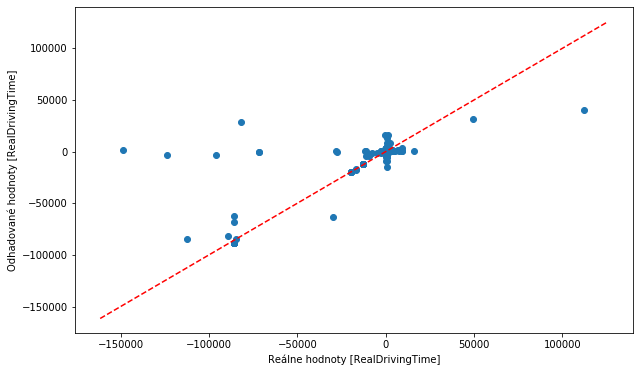

Najväčšia chyba:150127.453125
Najväčšia chyba v zápornom smere:-71743.109375
% približne správnych odhadov: 0.8728667305848514


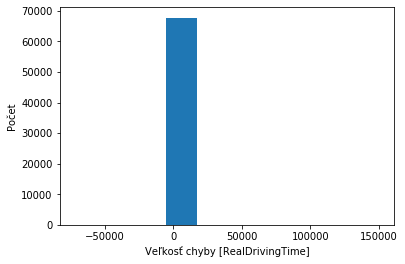

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 546.26 RealDrivingTime 
Testing set Mean Sqrt Error: 934575.56 RealDrivingTime 
Testing set Root Mean Sqrt Error: 966.73 RealDrivingTime 


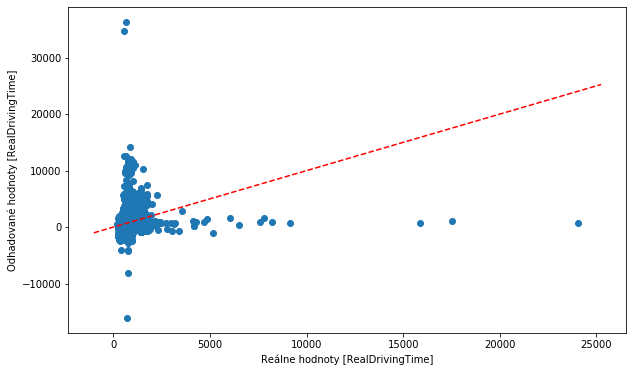

Najväčšia chyba:35671.61328125
Najväčšia chyba v zápornom smere:-23266.1328125
% približne správnych odhadov: 0.31380188567862505


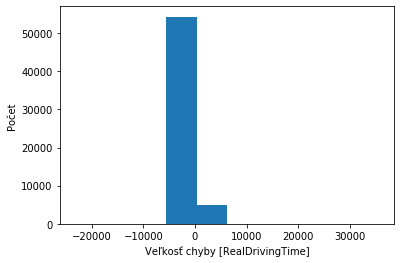

In [82]:
CreateAndFitModel("BASE",0.001, 120, "SKBASETrainTypes", test2BASEOneHot)

### OneHot TrainTypes FILTER 1  64-64 

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 20)
Veľkosť testovacej množniy: (59289, 20)

....................
....................
....................
....................
...

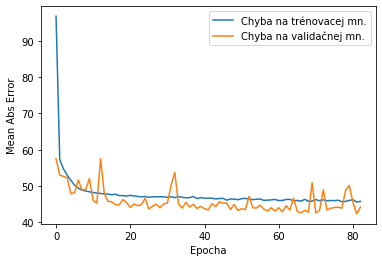

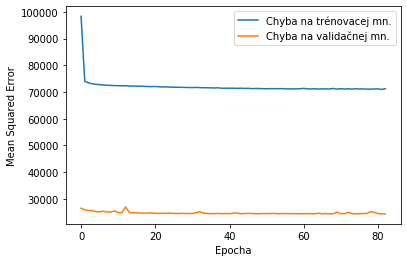

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 188.08 RealDrivingTime 
Testing set Mean Sqrt Error: 3159138.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1777.40 RealDrivingTime 


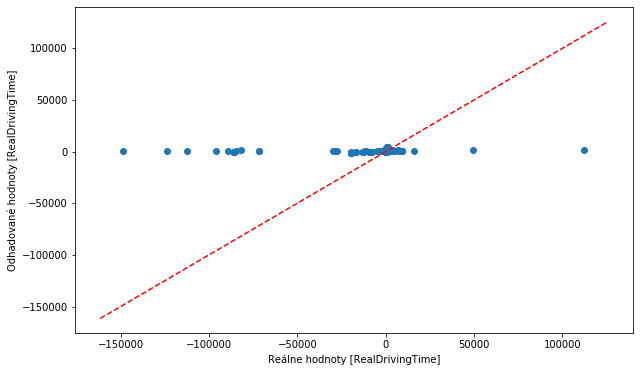

Najväčšia chyba:149261.890625
Najväčšia chyba v zápornom smere:-111263.8828125
% približne správnych odhadov: 0.6876908326572756


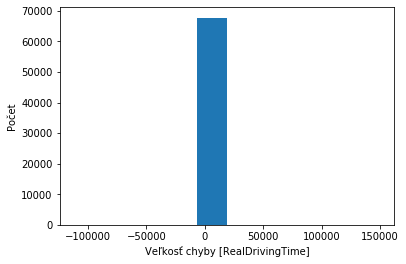

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 43.09 RealDrivingTime 
Testing set Mean Sqrt Error: 32145.13 RealDrivingTime 
Testing set Root Mean Sqrt Error: 179.29 RealDrivingTime 


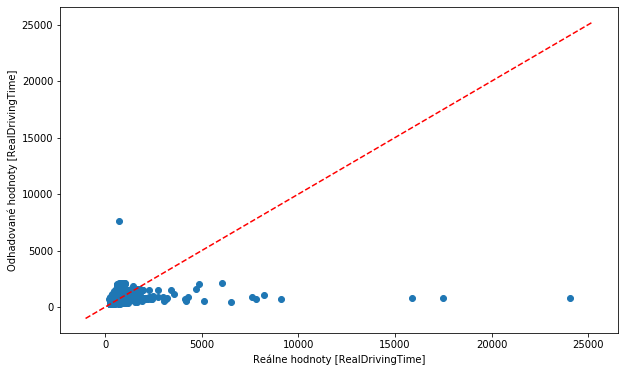

Najväčšia chyba:6896.2578125
Najväčšia chyba v zápornom smere:-23231.333984375
% približne správnych odhadov: 0.9298014808817825


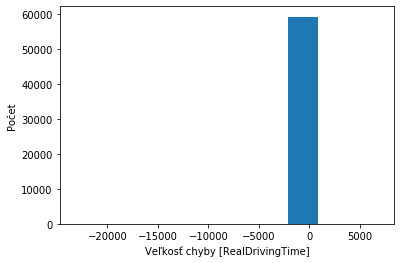

In [84]:
CreateAndFitModel("FILTER1",0.001, 120, "SKFILTER1TrainTypesOneHot", test2FILTER1OneHot)

### OneHot TrainTypes FILTER1 128-64-64

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 20)
Veľkosť testovacej množniy: (59289, 20)

....................
....................

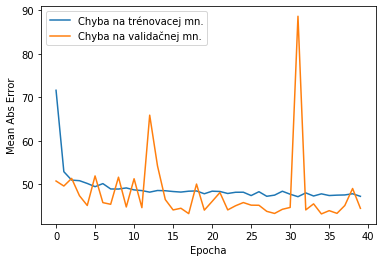

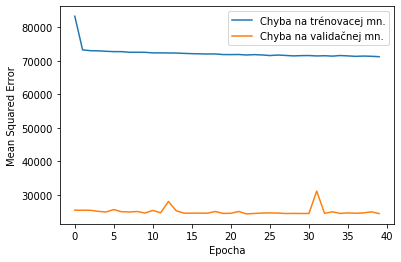

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 200.34 RealDrivingTime 
Testing set Mean Sqrt Error: 3227693.75 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1796.58 RealDrivingTime 


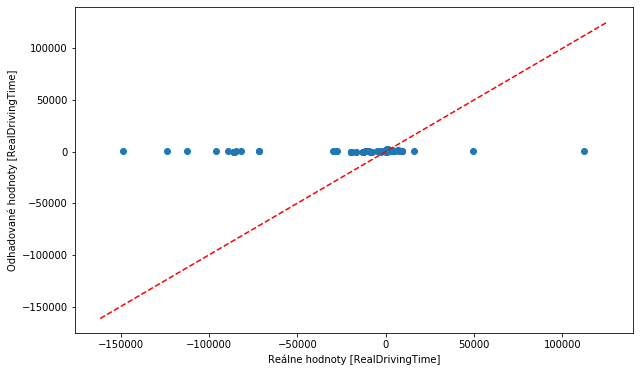

Najväčšia chyba:149259.765625
Najväčšia chyba v zápornom smere:-112157.4296875
% približne správnych odhadov: 0.723165425178848


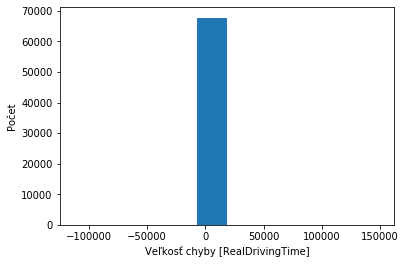

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 44.11 RealDrivingTime 
Testing set Mean Sqrt Error: 31334.41 RealDrivingTime 
Testing set Root Mean Sqrt Error: 177.02 RealDrivingTime 


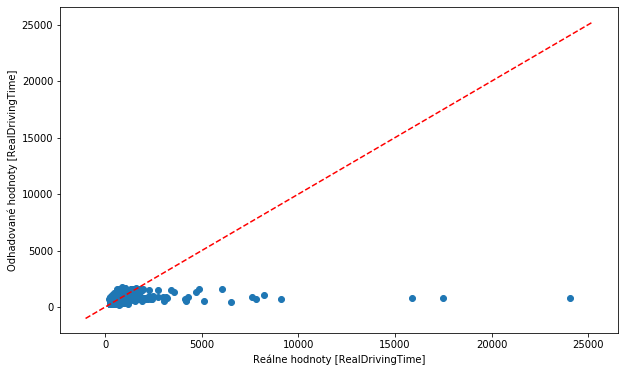

Najväčšia chyba:1015.6424560546875
Najväčšia chyba v zápornom smere:-23236.15625
% približne správnych odhadov: 0.9294810167147363


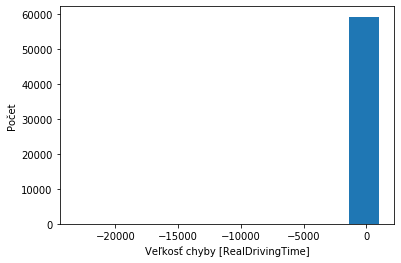

In [94]:
CreateAndFitModel("FILTER1", 0.001, 120, "SKFILTER1TrainTypes3OneHot",test2FILTER1OneHot,"128-64-64")

### OneHot TrainTypes FILTER1 96-64-32-32

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 20)
Veľkosť testovacej množniy: (59289, 20)

....................
....................
....................
.........

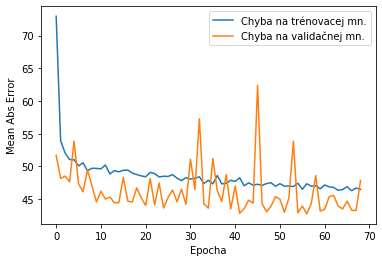

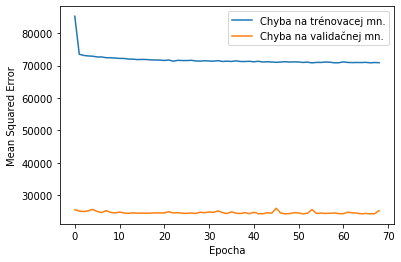

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 214.95 RealDrivingTime 
Testing set Mean Sqrt Error: 3300063.50 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1816.61 RealDrivingTime 


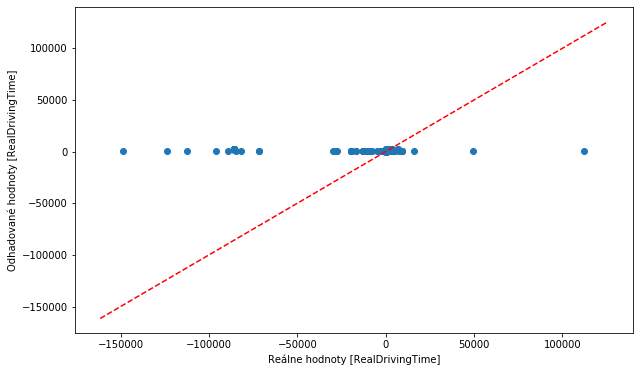

Najväčšia chyba:149286.59375
Najväčšia chyba v zápornom smere:-111738.5859375
% približne správnych odhadov: 0.6738107530053838


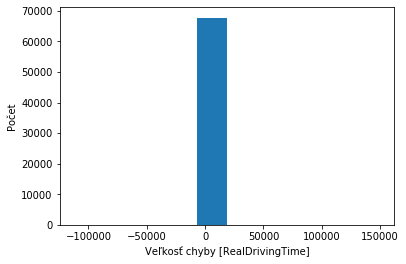

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 42.97 RealDrivingTime 
Testing set Mean Sqrt Error: 31292.66 RealDrivingTime 
Testing set Root Mean Sqrt Error: 176.90 RealDrivingTime 


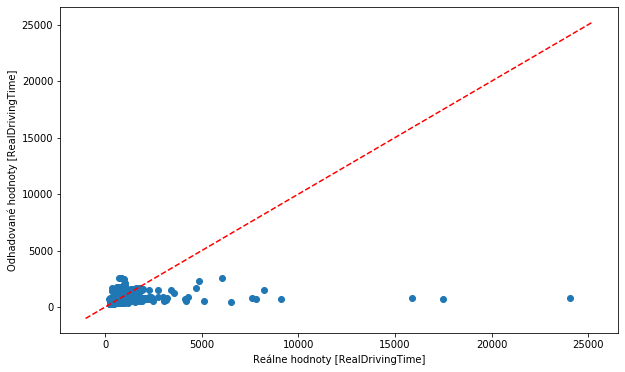

Najväčšia chyba:1846.826904296875
Najväčšia chyba v zápornom smere:-23235.3671875
% približne správnych odhadov: 0.9307460068478133


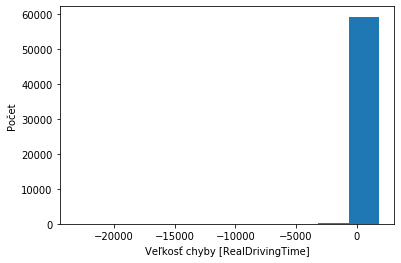

In [95]:
CreateAndFitModel("FILTER1", 0.001, 120, "SKFILTER1TrainTypes4OneHot",test2FILTER1OneHot,"96-64-32-32")

### OneHot TrainTypes FILTER1 96-64-64-32-32-32

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 20)
Veľkosť testovacej množniy: (59289, 20)

....................
....................
.........

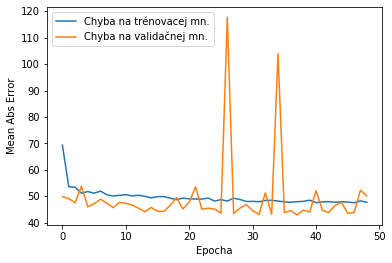

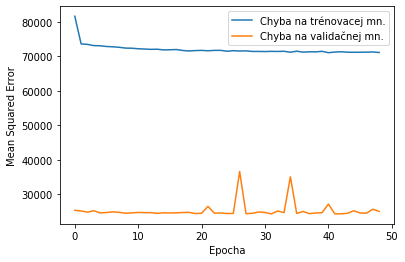

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 192.28 RealDrivingTime 
Testing set Mean Sqrt Error: 3560369.00 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1886.89 RealDrivingTime 


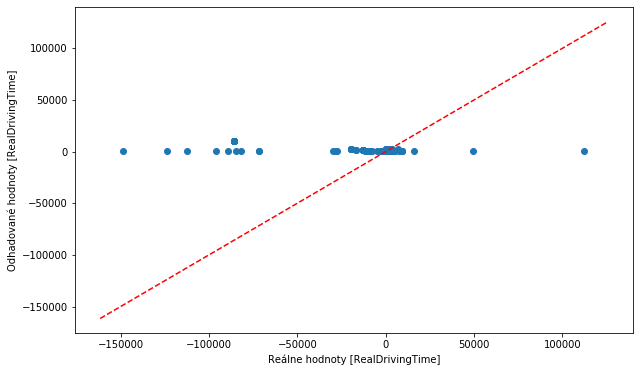

Najväčšia chyba:149186.40625
Najväčšia chyba v zápornom smere:-111715.171875
% približne správnych odhadov: 0.7166162696364039


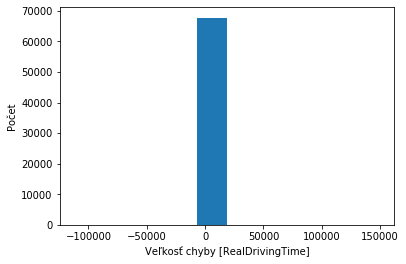

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 43.29 RealDrivingTime 
Testing set Mean Sqrt Error: 31348.27 RealDrivingTime 
Testing set Root Mean Sqrt Error: 177.05 RealDrivingTime 


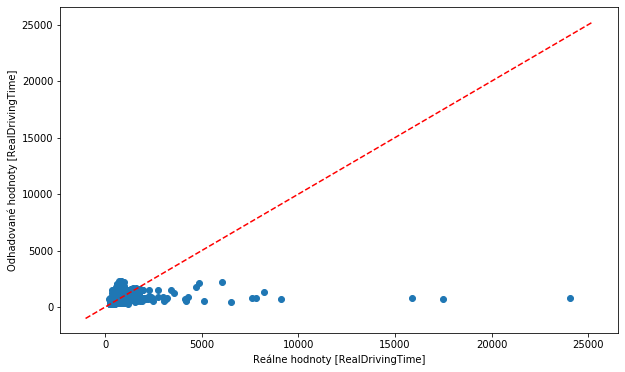

Najväčšia chyba:1547.131103515625
Najväčšia chyba v zápornom smere:-23244.96484375
% približne správnych odhadov: 0.9306110745669517


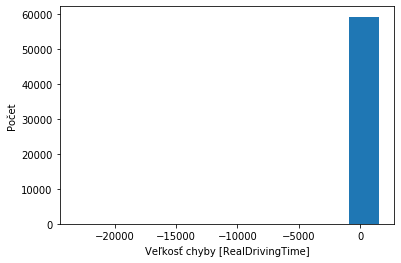

In [96]:
CreateAndFitModel("FILTER1", 0.001, 120, "SKFILTER1TrainTypes6OneHot",test2FILTER1OneHot,"96-64-64-32-32-32")

## Vyhodnotenie

### BASE

#### ------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 49.04 RealDrivingTime [-8,52]
- Testing set Mean Sqrt Error: 301175.59 RealDrivingTime [-89 876‬]
- Testing set Root Mean Sqrt Error: 548.79 RealDrivingTime [-64]

------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 464.12 RealDrivingTime
- Testing set Mean Sqrt Error: 532327.06 RealDrivingTime
- Testing set Root Mean Sqrt Error: 729.61 RealDrivingTime


### FILTER1

------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 109.89 RealDrivingTime        
- Testing set Mean Sqrt Error: 1675617.00 RealDrivingTime   
- Testing set Root Mean Sqrt Error: 1294.46 RealDrivingTime 

#### ------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 35.23 RealDrivingTime         [-0,67]
- Testing set Mean Sqrt Error: 17814.88 RealDrivingTime     [-6 678]
- Testing set Root Mean Sqrt Error: 133.47 RealDrivingTime  [-23‬]


# Test 3 - vplyv ročných obodobí na jazdné doby vlakov
Podľa času výjazdu vlaku zo stanice som rozdelil dáta do štyroch skúpín 
- Jar 
- Leto
- Jeseň
- Zima

In [121]:
test3 = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
            'SectIdx', 'PredLength','PredDelay', 'DelayDeparture',
            'RealDrivingTime']
test3OneHot = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
            'SectIdx', 'PredLength','PredDelay', 'DelayDeparture',
            'Jar','Leto','Jesen','Zima',
            'RealDrivingTime']

In [498]:
used_attributes = test3
label = used_attributes[-1]

In [106]:
jar = DFFILTER1[(DFFILTER1['Season'] == 'Jar')]
leto = DFFILTER1[(DFFILTER1['Season'] == 'Leto')]
jesen = DFFILTER1[(DFFILTER1['Season'] == 'Jesen')]
zima = DFFILTER1[(DFFILTER1['Season'] == 'Zima')]

In [107]:
season = DFBASE['Season']
for seas in season_types:
    DFBASE[seas] = (season == seas)*1.0
    
season = DFFILTER1['Season']
for seas in season_types:
    DFFILTER1[seas] = (season == seas)*1.0

In [109]:
cor_vlastnosti = season_types.copy()
cor_vlastnosti = np.append(cor_vlastnosti,['RealDrivingTime'])
print(cor_vlastnosti)

cor = DFFILTER1[cor_vlastnosti].corr()
print(cor['RealDrivingTime'].sort_values(ascending=False))

['Zima' 'Jar' 'Leto' 'Jesen' 'RealDrivingTime']
RealDrivingTime    1.000000
Jesen              0.008073
Jar                0.004999
Leto               0.001135
Zima              -0.013825
Name: RealDrivingTime, dtype: float64


Korelačná matica ukazuje, že ročné obodbie nemá žiadny zaznamenateľný vplyv na jazdnú dobu vlaku. Toto môže viesť k dvom prípadom. Buď model prestane byť senzitívny na isté neuróny, alebo sa naučí zle, čím by sme mohli získať nepresnosť vo predikciách

Počet vlakov pre každú sezónu:
Zima: 78925
Jar: 74090
Leto: 71560
Jesen: 71870


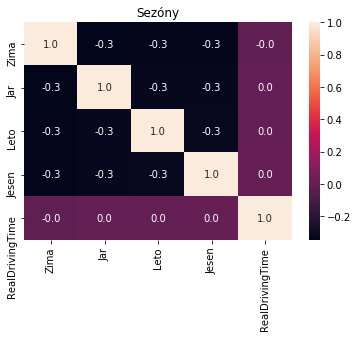

In [110]:
plt.title("Sezóny")
sns.heatmap(cor, annot = True, fmt='.1f')    

print("Počet vlakov pre každú sezónu:")
for roc_obd in season_types:
    print(roc_obd + ": " + str(len(DFFILTER1[(DFFILTER1[roc_obd] == 1.0)])))

In [95]:
jar = DFFILTER1[(DFFILTER1['Season'] == 'Jar')]
leto = DFFILTER1[(DFFILTER1['Season'] == 'Leto')]
jesen = DFFILTER1[(DFFILTER1['Season'] == 'Jesen')]
zima = DFFILTER1[(DFFILTER1['Season'] == 'Zima')]

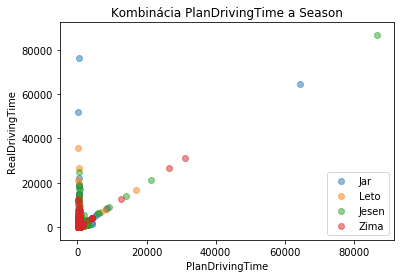

In [96]:
plt.scatter(jar['PlanDrivingTime'],jar['RealDrivingTime'],alpha=0.5,label="Jar")
plt.scatter(leto['PlanDrivingTime'],leto['RealDrivingTime'],alpha=0.5,label="Leto")
plt.scatter(jesen['PlanDrivingTime'],jesen['RealDrivingTime'],alpha=0.5,label="Jesen")
plt.scatter(zima['PlanDrivingTime'],zima['RealDrivingTime'],alpha=0.5,label="Zima")
plt.ylabel("RealDrivingTime")
plt.xlabel("PlanDrivingTime")
plt.title("Kombinácia PlanDrivingTime a Season")
plt.legend()
plt.show()


# BASE Seasons OneHot

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 15)
Veľkosť testovacej množniy: (67795, 15)

....................
....................
....................
....................
....................
....................
....................
..........

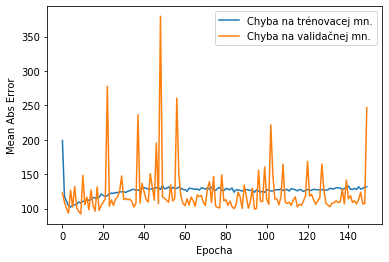

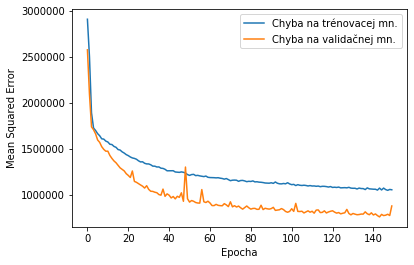

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 112.53 RealDrivingTime 
Testing set Mean Sqrt Error: 1294582.00 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1137.80 RealDrivingTime 


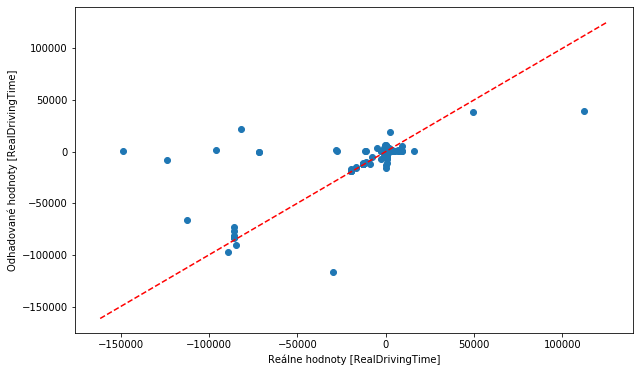

Najväčšia chyba:149475.140625
Najväčšia chyba v zápornom smere:-87043.859375
% približne správnych odhadov: 0.7630061213953832


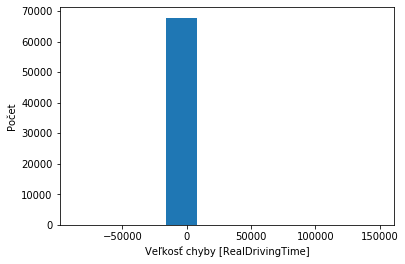

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 800.88 RealDrivingTime 
Testing set Mean Sqrt Error: 2155053.50 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1468.01 RealDrivingTime 


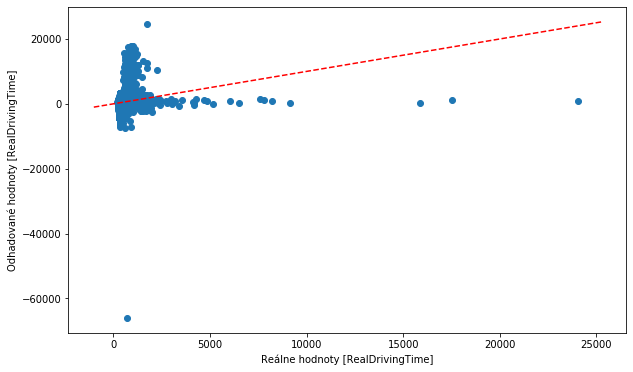

Najväčšia chyba:22990.8046875
Najväčšia chyba v zápornom smere:-66877.8046875
% približne správnych odhadov: 0.15517212299077401


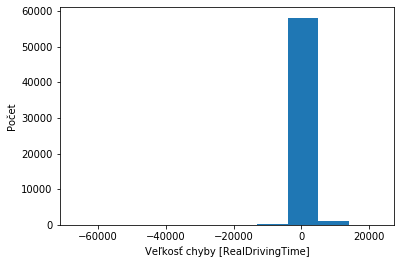

In [112]:
CreateAndFitModel("BASE",  0.001, 120, "SKBASESeasons2OneHot",test3OneHot)

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 15)
Veľkosť testovacej množniy: (67795, 15)

....................
....................
......

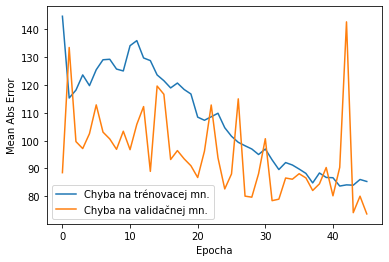

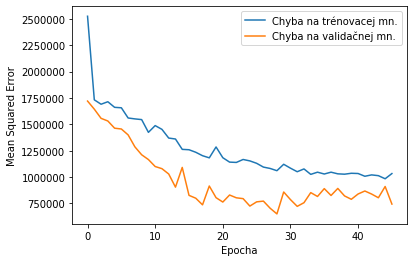

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 81.05 RealDrivingTime 
Testing set Mean Sqrt Error: 1210773.38 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1100.35 RealDrivingTime 


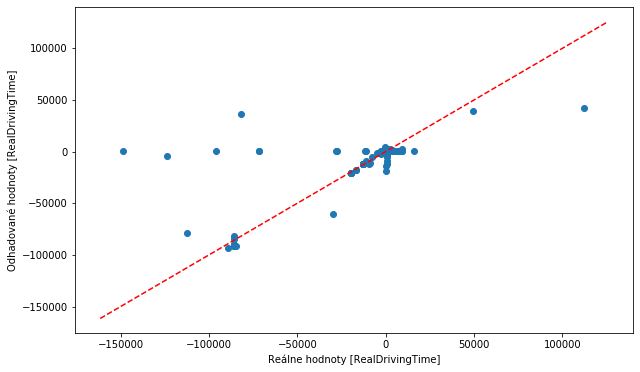

Najväčšia chyba:148961.25
Najväčšia chyba v zápornom smere:-70470.5078125
% približne správnych odhadov: 0.8612287041817244


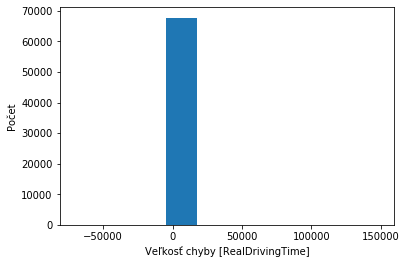

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 207.37 RealDrivingTime 
Testing set Mean Sqrt Error: 163680.12 RealDrivingTime 
Testing set Root Mean Sqrt Error: 404.57 RealDrivingTime 


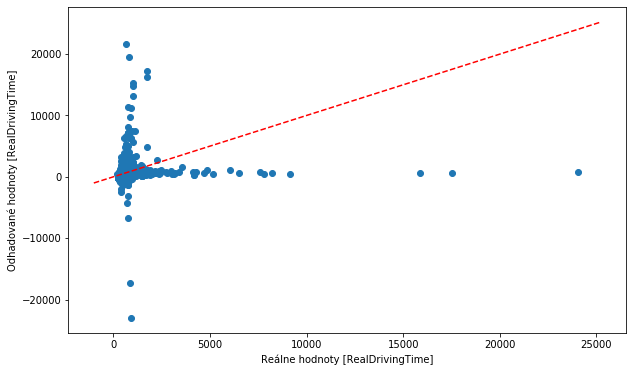

Najväčšia chyba:20945.583984375
Najväčšia chyba v zápornom smere:-23989.6171875
% približne správnych odhadov: 0.36124744893656496


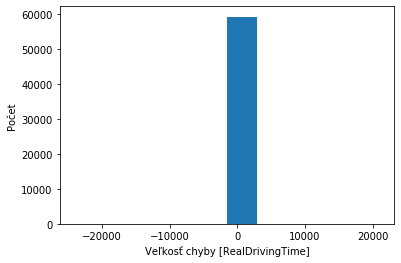

In [113]:
CreateAndFitModel("BASE",  0.001, 120, "SKBASESeasons3OneHot",test3OneHot,"128-64-64")

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 15)
Veľkosť testovacej množniy: (67795, 15)

....................
..............

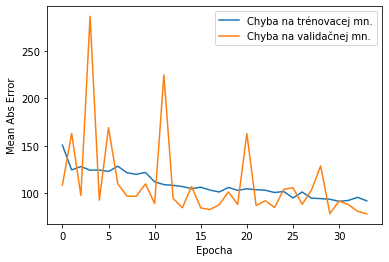

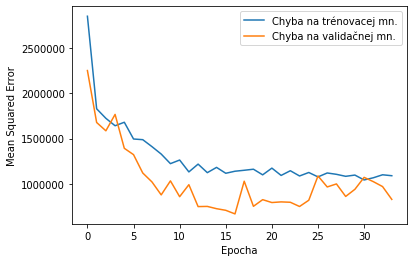

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 83.64 RealDrivingTime 
Testing set Mean Sqrt Error: 1191502.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1091.56 RealDrivingTime 


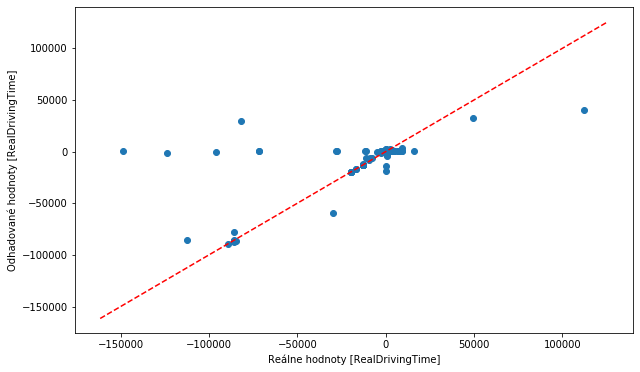

Najväčšia chyba:148805.4375
Najväčšia chyba v zápornom smere:-72028.3359375
% približne správnych odhadov: 0.8430857732871155


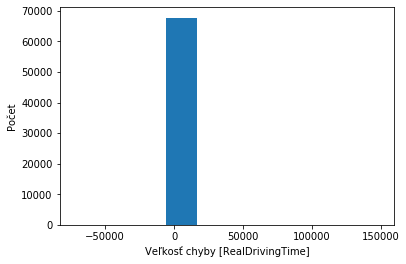

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 135.56 RealDrivingTime 
Testing set Mean Sqrt Error: 63483.20 RealDrivingTime 
Testing set Root Mean Sqrt Error: 251.96 RealDrivingTime 


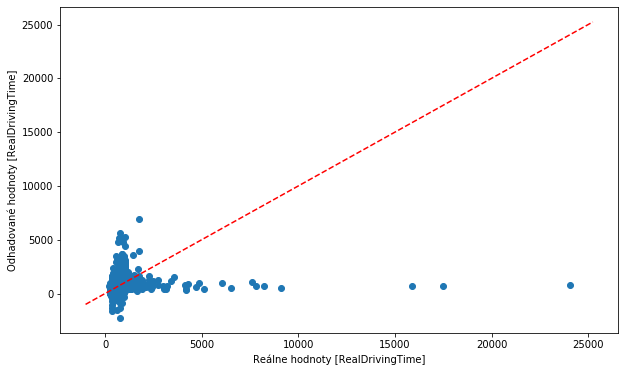

Najväčšia chyba:5150.3125
Najväčšia chyba v zápornom smere:-23232.51953125
% približne správnych odhadov: 0.5761102396734639


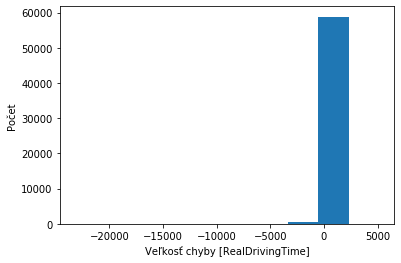

In [114]:
CreateAndFitModel("BASE",  0.001, 120, "SKBASESeasons4OneHot",test3OneHot,"96-64-32-32")

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 15)
Veľkosť testovacej množniy: (67795, 15)

....................
.........

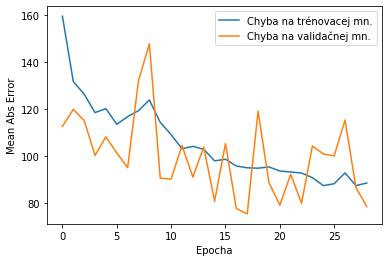

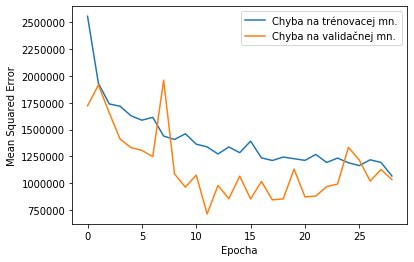

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 105.44 RealDrivingTime 
Testing set Mean Sqrt Error: 1138588.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1067.05 RealDrivingTime 


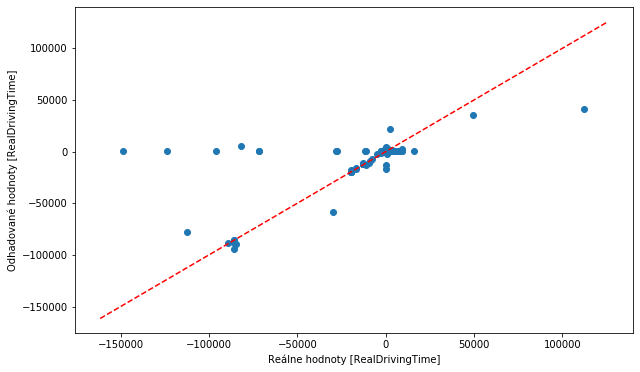

Najväčšia chyba:149124.390625
Najväčšia chyba v zápornom smere:-71270.421875
% približne správnych odhadov: 0.7625193598347961


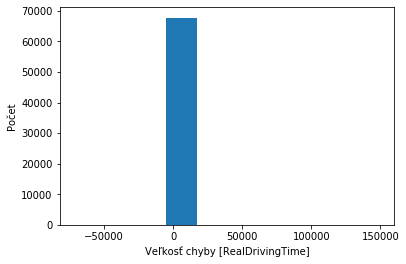

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 194.22 RealDrivingTime 
Testing set Mean Sqrt Error: 106172.42 RealDrivingTime 
Testing set Root Mean Sqrt Error: 325.84 RealDrivingTime 


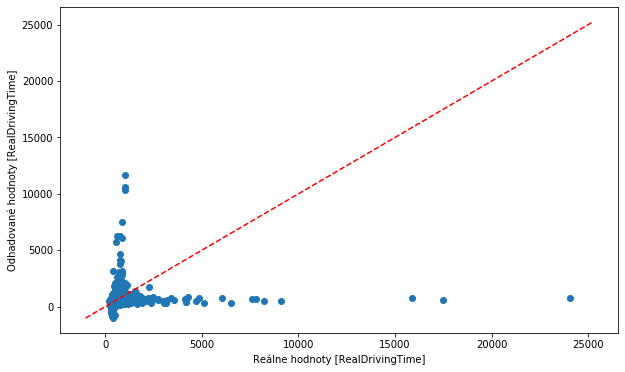

Najväčšia chyba:10662.6025390625
Najväčšia chyba v zápornom smere:-23289.072265625
% približne správnych odhadov: 0.412420516453305


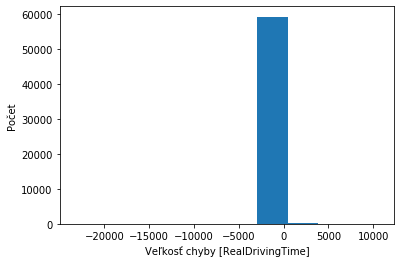

In [115]:
CreateAndFitModel("BASE",  0.001, 120, "SKBASESeasons6OneHot",test3OneHot,"96-64-64-32-32-32")

# FILTER 1 Seasons OneHot

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 15)
Veľkosť testovacej množniy: (59289, 15)

....................
....................
....................
....................
....................
....................

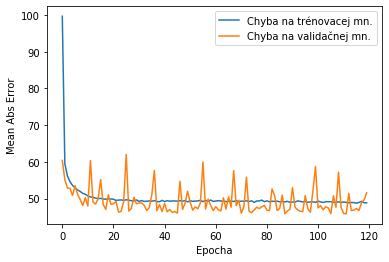

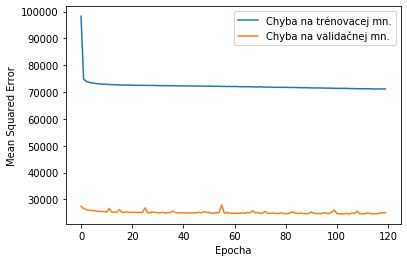

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 204.69 RealDrivingTime 
Testing set Mean Sqrt Error: 3154139.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1775.99 RealDrivingTime 


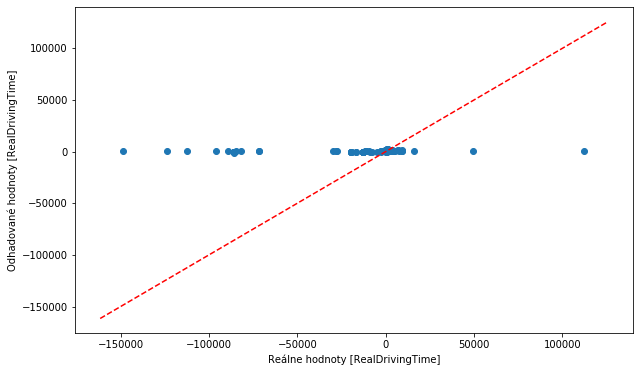

Najväčšia chyba:149307.453125
Najväčšia chyba v zápornom smere:-111643.4375
% približne správnych odhadov: 0.5229294195737149


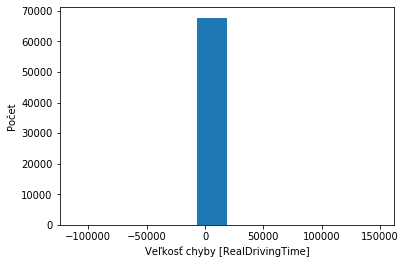

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 47.22 RealDrivingTime 
Testing set Mean Sqrt Error: 31987.68 RealDrivingTime 
Testing set Root Mean Sqrt Error: 178.85 RealDrivingTime 


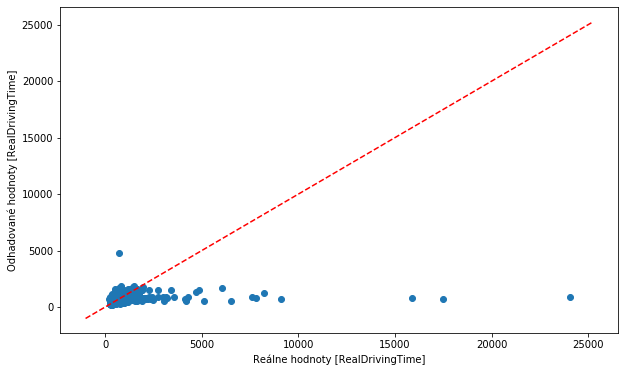

Najväčšia chyba:4083.84521484375
Najväčšia chyba v zápornom smere:-23195.609375
% približne správnych odhadov: 0.9188888326671052


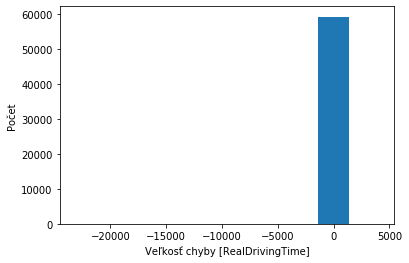

In [116]:
CreateAndFitModel("FILTER1",  0.001, 120, "SKFILTER1Seasons2OneHot",test3OneHot)

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 15)
Veľkosť testovacej množniy: (59289, 15)

....................
....................
...................

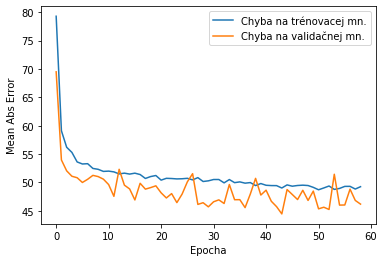

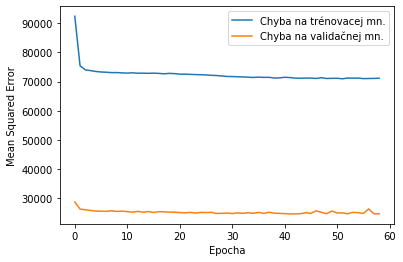

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 193.59 RealDrivingTime 
Testing set Mean Sqrt Error: 3235727.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1798.81 RealDrivingTime 


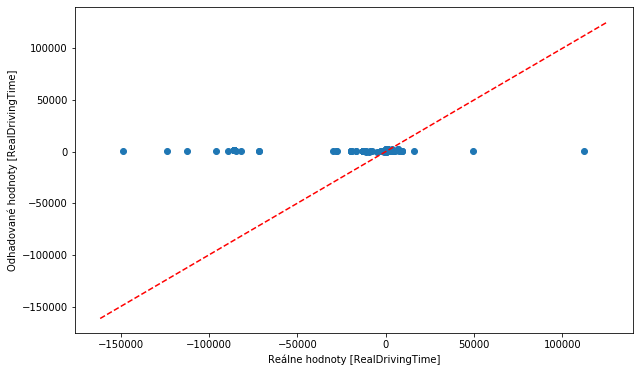

Najväčšia chyba:149146.1875
Najväčšia chyba v zápornom smere:-111753.4921875
% približne správnych odhadov: 0.6649162917619293


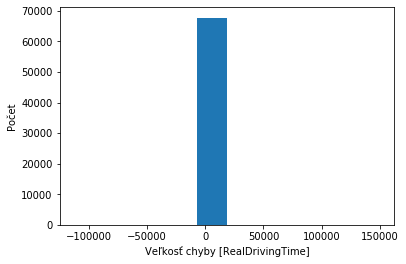

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 46.83 RealDrivingTime 
Testing set Mean Sqrt Error: 31586.39 RealDrivingTime 
Testing set Root Mean Sqrt Error: 177.73 RealDrivingTime 


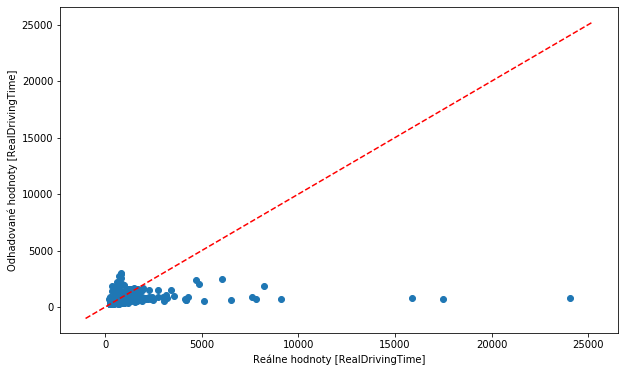

Najväčšia chyba:2189.45263671875
Najväčšia chyba v zápornom smere:-23218.36328125
% približne správnych odhadov: 0.9200694901246437


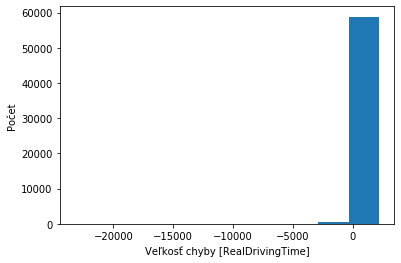

In [117]:
CreateAndFitModel("FILTER1",  0.001, 120, "SKFILTER1Seasons3OneHot",test3OneHot,"128-64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 15)
Veľkosť testovacej množniy: (59289, 15)

....................
....................
..................

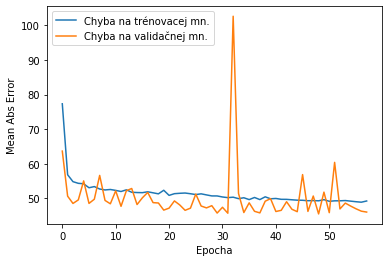

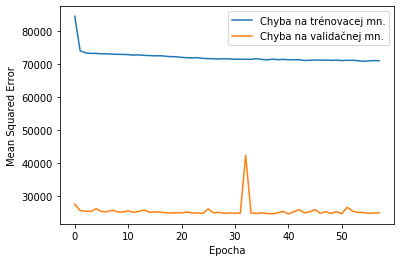

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 203.17 RealDrivingTime 
Testing set Mean Sqrt Error: 3601589.75 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1897.79 RealDrivingTime 


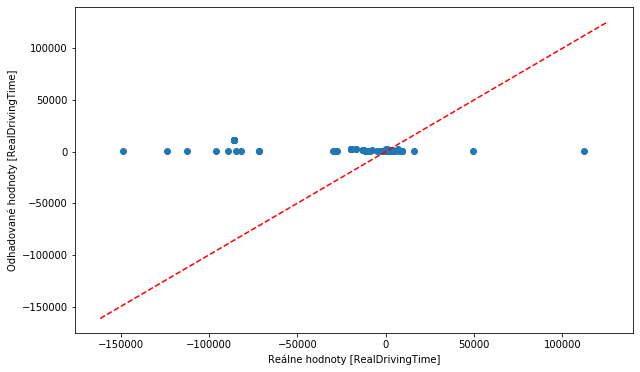

Najväčšia chyba:149223.828125
Najväčšia chyba v zápornom smere:-112049.4765625
% približne správnych odhadov: 0.6862305479755144


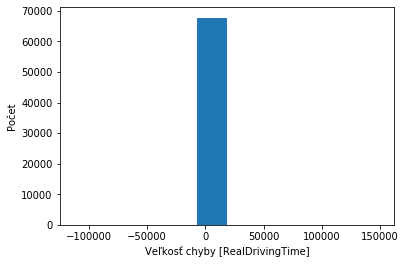

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 46.29 RealDrivingTime 
Testing set Mean Sqrt Error: 31784.88 RealDrivingTime 
Testing set Root Mean Sqrt Error: 178.28 RealDrivingTime 


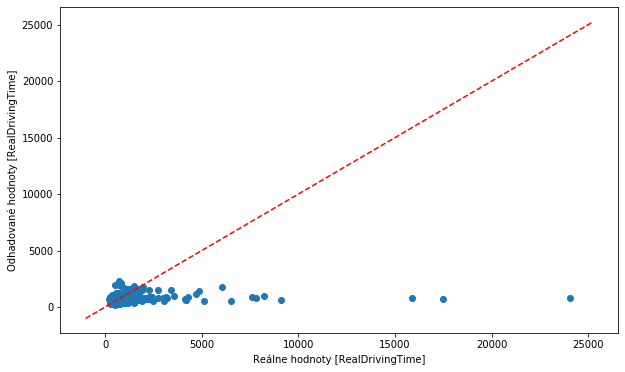

Najväčšia chyba:1568.03515625
Najväčšia chyba v zápornom smere:-23233.431640625
% približne správnych odhadov: 0.9236957951727977


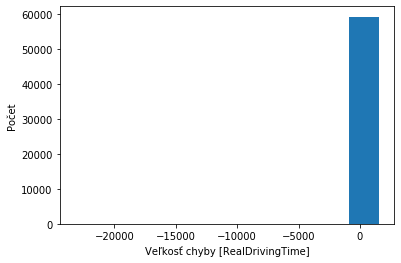

In [118]:
CreateAndFitModel("FILTER1",  0.001, 120, "SKFILTER1Seasons4OneHot",test3OneHot,"96-64-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 15)
Veľkosť testovacej množniy: (59289, 15)

....................
..................

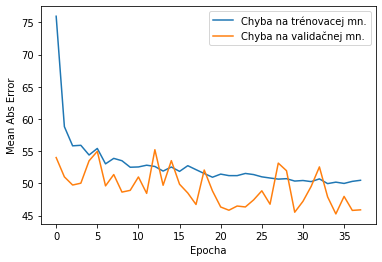

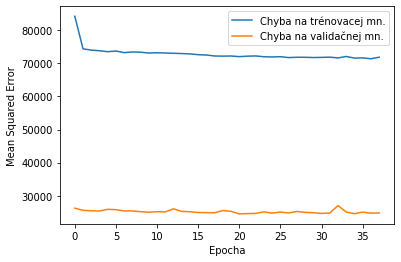

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 190.46 RealDrivingTime 
Testing set Mean Sqrt Error: 3320431.50 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1822.21 RealDrivingTime 


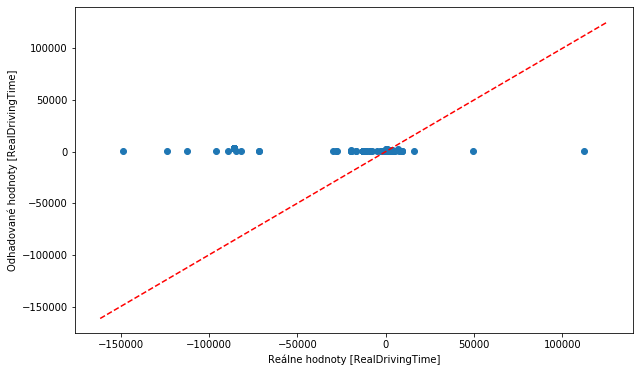

Najväčšia chyba:149247.140625
Najväčšia chyba v zápornom smere:-111870.5234375
% približne správnych odhadov: 0.6889003613835829


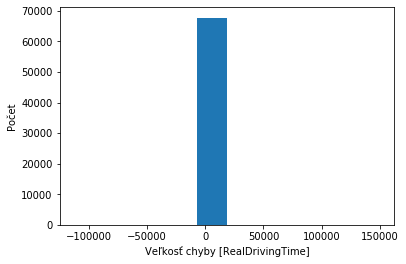

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 46.46 RealDrivingTime 
Testing set Mean Sqrt Error: 31595.71 RealDrivingTime 
Testing set Root Mean Sqrt Error: 177.75 RealDrivingTime 


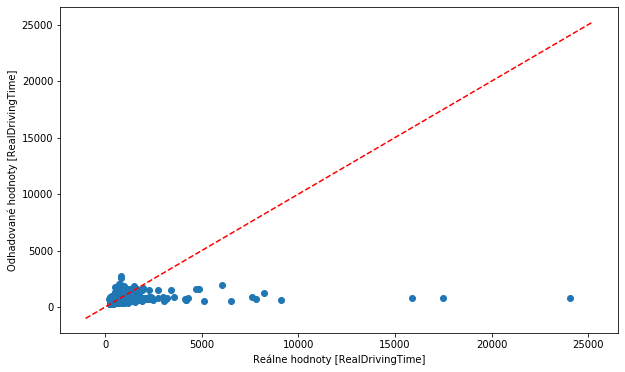

Najväčšia chyba:1893.5966796875
Najväčšia chyba v zápornom smere:-23233.353515625
% približne správnych odhadov: 0.9230548668387053


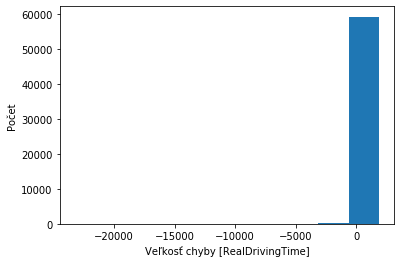

In [119]:
CreateAndFitModel("FILTER1",  0.001, 120, "SKFILTER1Seasons6OneHot",test3OneHot,"96-64-64-32-32-32")

### JAR

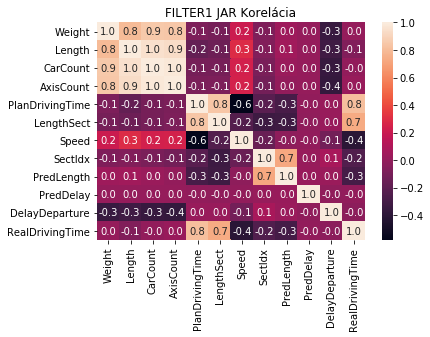

In [122]:
cor = jar[test3].corr()
plt.title("FILTER1 JAR Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

Veľkosť trénovacej množniy: (59272, 11)
Veľkosť testovacej množniy: (14818, 11)

....................
....................
....................
....................
..........

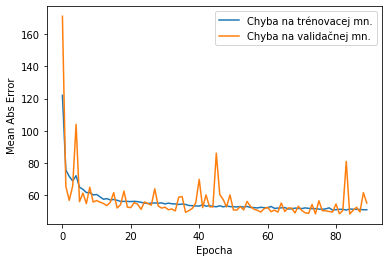

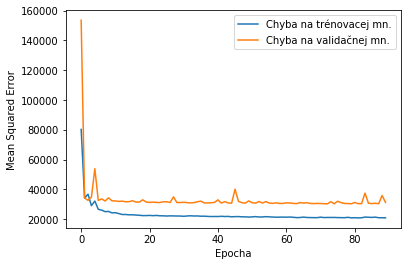

Testing set Mean Abs Error: 50.78 RealDrivingTime 
Testing set Mean Sqrt Error: 40073.95 RealDrivingTime 
Testing set Root Mean Sqrt Error: 200.18 RealDrivingTime 


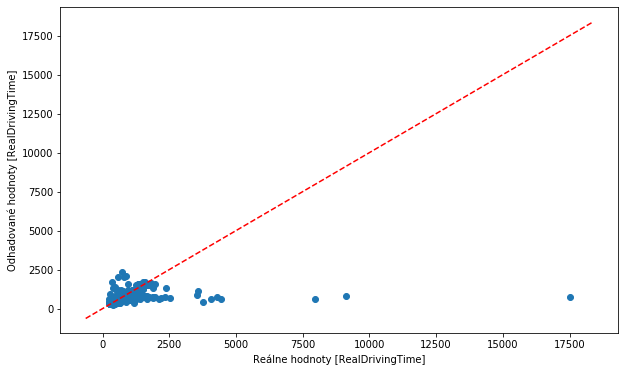

Najväčšia chyba:1643.767333984375
Najväčšia chyba v zápornom smere:-16796.46875
% približne správnych odhadov: 0.919692266162775


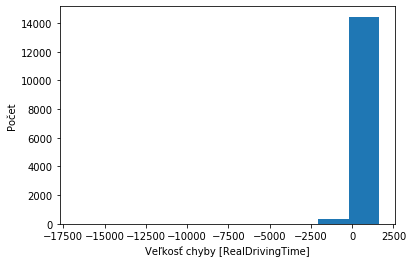

In [123]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons2Jar", jar, test3, "64-64")

Veľkosť trénovacej množniy: (59272, 11)
Veľkosť testovacej množniy: (14818, 11)

....................
....................
....................
....................
....................
....................
......

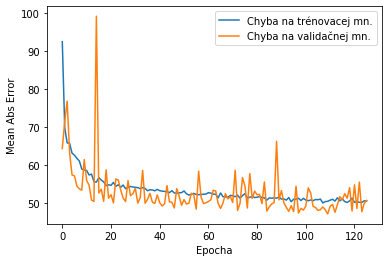

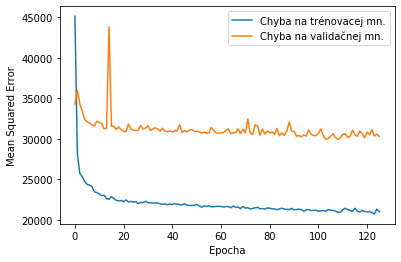

Testing set Mean Abs Error: 50.38 RealDrivingTime 
Testing set Mean Sqrt Error: 39285.92 RealDrivingTime 
Testing set Root Mean Sqrt Error: 198.21 RealDrivingTime 


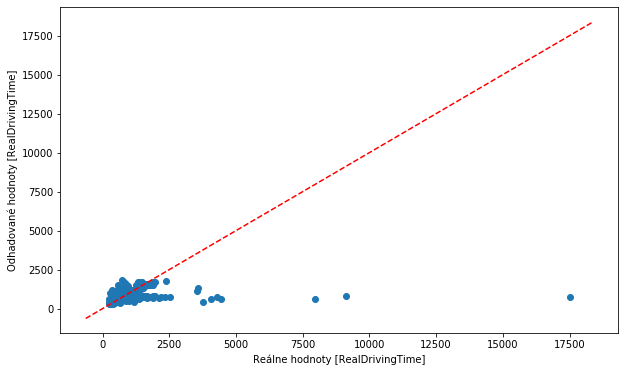

Najväčšia chyba:1110.5672607421875
Najväčšia chyba v zápornom smere:-16781.330078125
% približne správnych odhadov: 0.9261033877716291


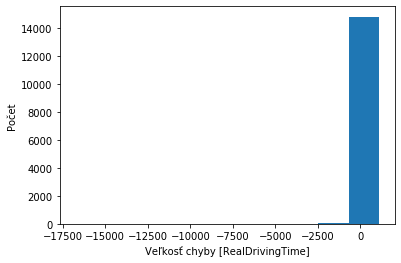

In [124]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons3Jar", jar, test3, "128-64-64")

Veľkosť trénovacej množniy: (59272, 11)
Veľkosť testovacej množniy: (14818, 11)

....................
....................
....................
..........

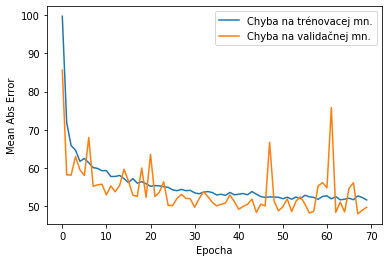

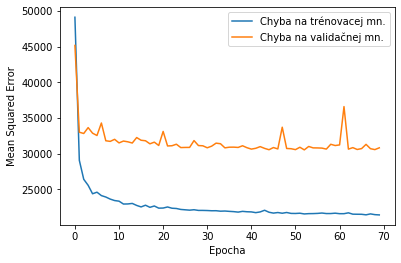

Testing set Mean Abs Error: 50.51 RealDrivingTime 
Testing set Mean Sqrt Error: 39180.06 RealDrivingTime 
Testing set Root Mean Sqrt Error: 197.94 RealDrivingTime 


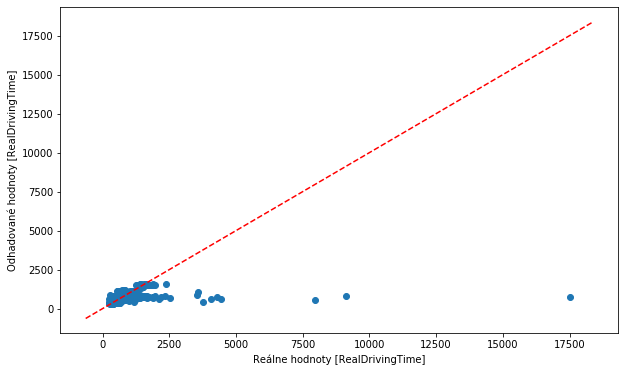

Najväčšia chyba:613.233642578125
Najväčšia chyba v zápornom smere:-16755.939453125
% približne správnych odhadov: 0.9161830206505601


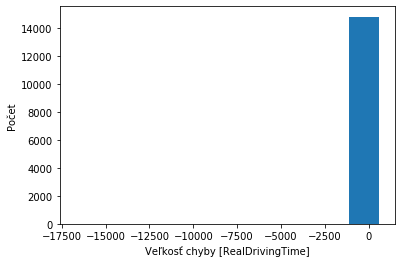

In [125]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons4Jar", jar, test3, "96-64-32-32")

Veľkosť trénovacej množniy: (59272, 11)
Veľkosť testovacej množniy: (14818, 11)

....................
....................
....................
....................
.......

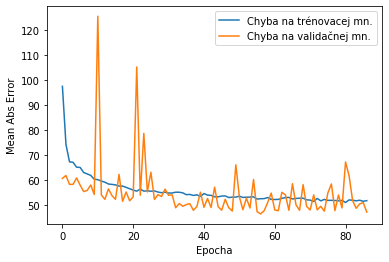

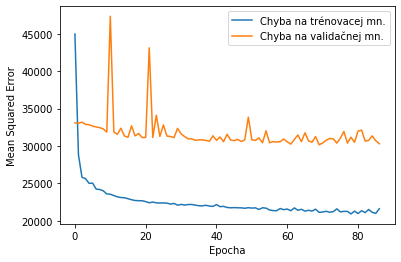

Testing set Mean Abs Error: 51.44 RealDrivingTime 
Testing set Mean Sqrt Error: 39319.42 RealDrivingTime 
Testing set Root Mean Sqrt Error: 198.29 RealDrivingTime 


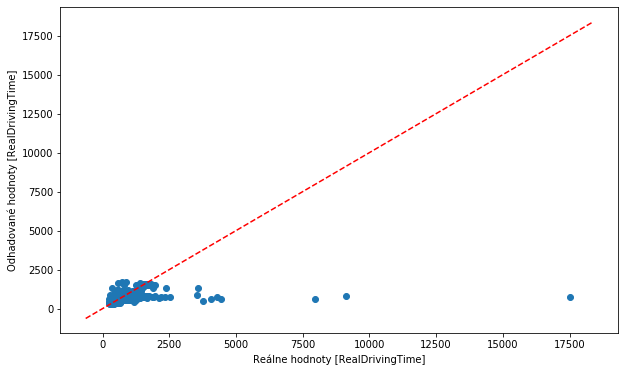

Najväčšia chyba:1065.1942138671875
Najväčšia chyba v zápornom smere:-16774.83984375
% približne správnych odhadov: 0.9148333108381698


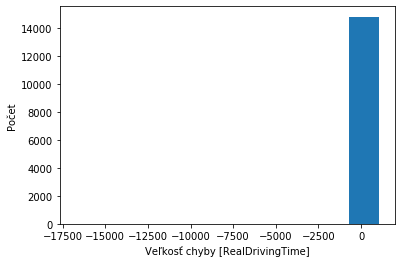

In [126]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons6Jar", jar, test3, "96-64-64-32-32-32")

### LETO

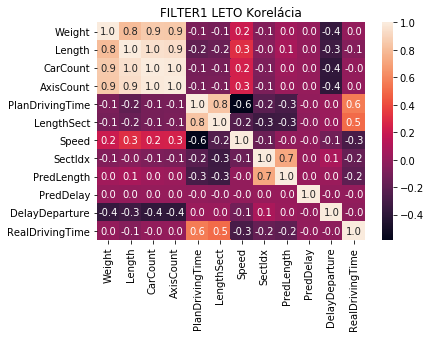

In [127]:
cor = leto[test3].corr()
plt.title("FILTER1 LETO Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

Veľkosť trénovacej množniy: (57248, 11)
Veľkosť testovacej množniy: (14312, 11)

....................
....................
....................
....................
....................
....................
....

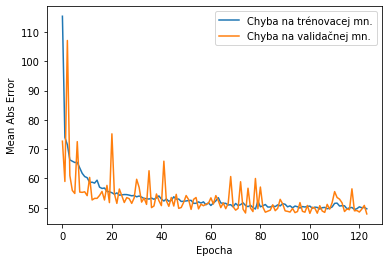

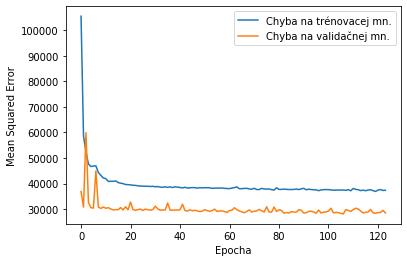

Testing set Mean Abs Error: 52.93 RealDrivingTime 
Testing set Mean Sqrt Error: 534746.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 731.26 RealDrivingTime 


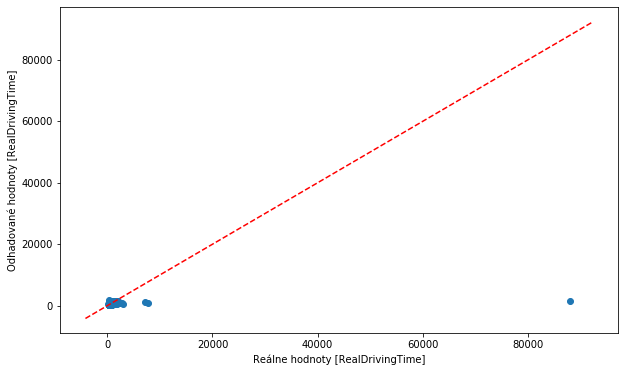

Najväčšia chyba:1546.1396484375
Najväčšia chyba v zápornom smere:-86360.9375
% približne správnych odhadov: 0.9266349916154276


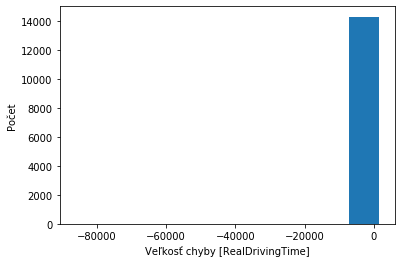

In [128]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons2Leto", leto, test3, "64-64")

Veľkosť trénovacej množniy: (57248, 11)
Veľkosť testovacej množniy: (14312, 11)

....................
....................
....................
.............

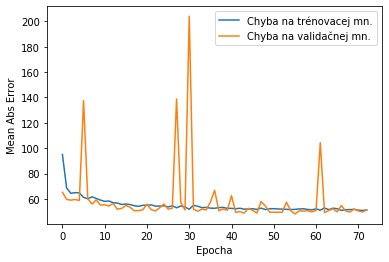

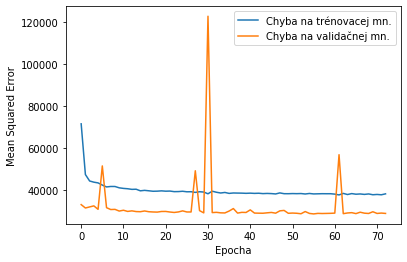

Testing set Mean Abs Error: 52.63 RealDrivingTime 
Testing set Mean Sqrt Error: 535260.69 RealDrivingTime 
Testing set Root Mean Sqrt Error: 731.62 RealDrivingTime 


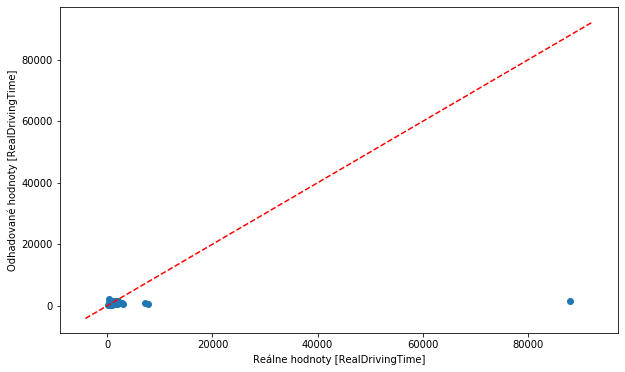

Najväčšia chyba:1819.64794921875
Najväčšia chyba v zápornom smere:-86373.375
% približne správnych odhadov: 0.92572666294019


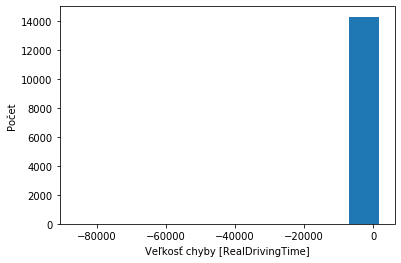

In [129]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons3Leto", leto, test3, "128-64-64")

Veľkosť trénovacej množniy: (57248, 11)
Veľkosť testovacej množniy: (14312, 11)

....................
....................
....................
....................
....................
....................
..........

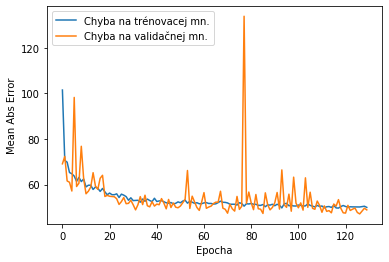

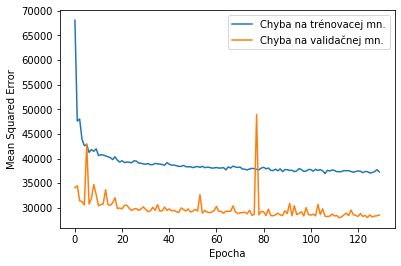

Testing set Mean Abs Error: 52.66 RealDrivingTime 
Testing set Mean Sqrt Error: 534636.88 RealDrivingTime 
Testing set Root Mean Sqrt Error: 731.19 RealDrivingTime 


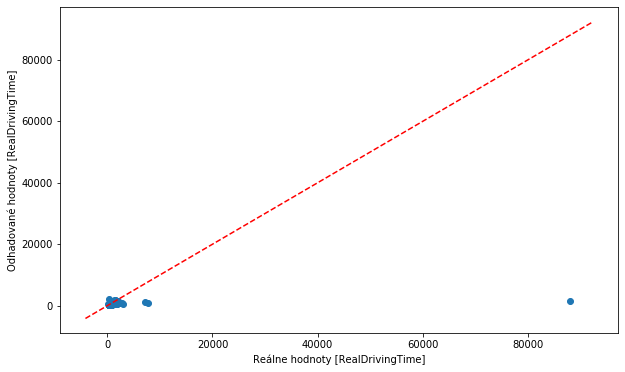

Najväčšia chyba:1894.156005859375
Najväčšia chyba v zápornom smere:-86361.9609375
% približne správnych odhadov: 0.9241196198993852


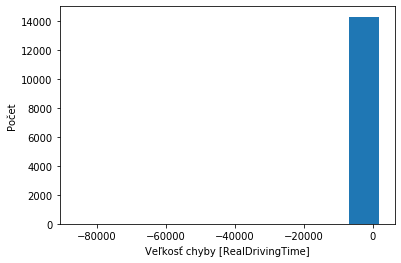

In [130]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons4Leto", leto, test3, "96-64-32-32")

Veľkosť trénovacej množniy: (57248, 11)
Veľkosť testovacej množniy: (14312, 11)

....................
....................
....................
....................
................

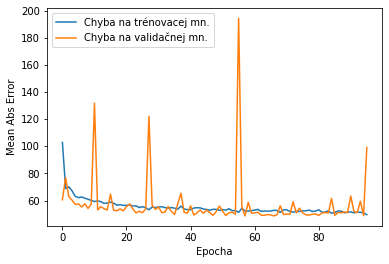

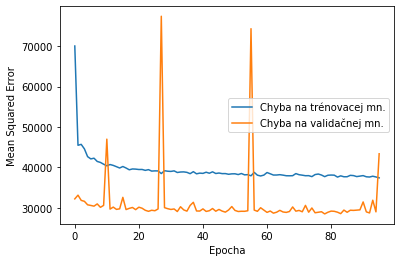

Testing set Mean Abs Error: 54.07 RealDrivingTime 
Testing set Mean Sqrt Error: 534869.50 RealDrivingTime 
Testing set Root Mean Sqrt Error: 731.35 RealDrivingTime 


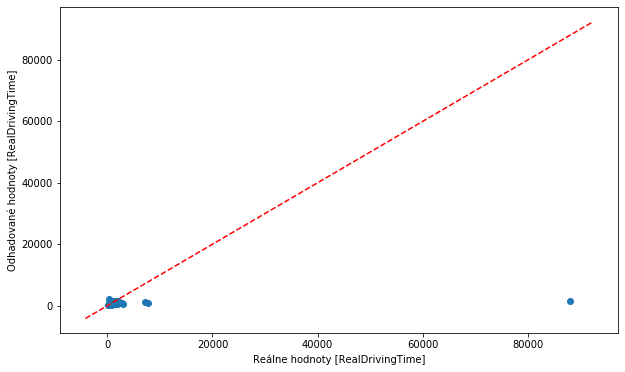

Najväčšia chyba:1947.944091796875
Najväčšia chyba v zápornom smere:-86357.4296875
% približne správnych odhadov: 0.9246087199552823


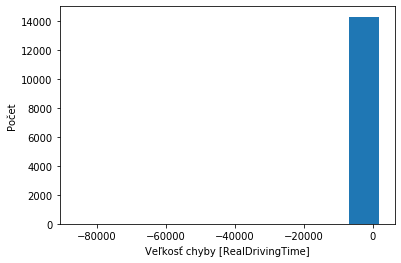

In [131]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons6Leto", leto, test3, "96-64-64-32-32-32")

### JESEŇ

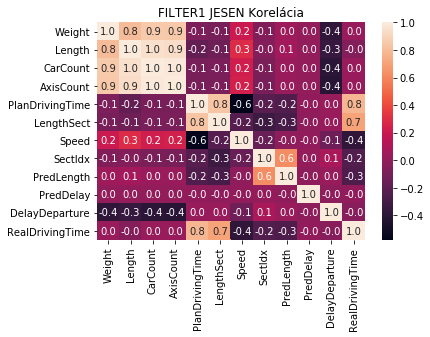

In [132]:
cor = jesen[test3].corr()
plt.title("FILTER1 JESEN Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

Veľkosť trénovacej množniy: (57496, 11)
Veľkosť testovacej množniy: (14374, 11)

....................
....................
....................
....................
...................

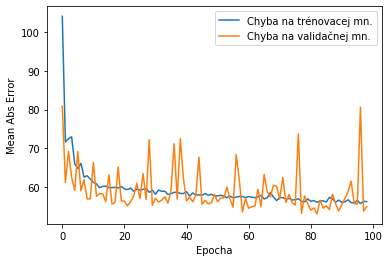

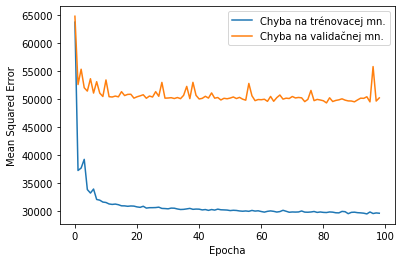

Testing set Mean Abs Error: 55.40 RealDrivingTime 
Testing set Mean Sqrt Error: 32977.27 RealDrivingTime 
Testing set Root Mean Sqrt Error: 181.60 RealDrivingTime 


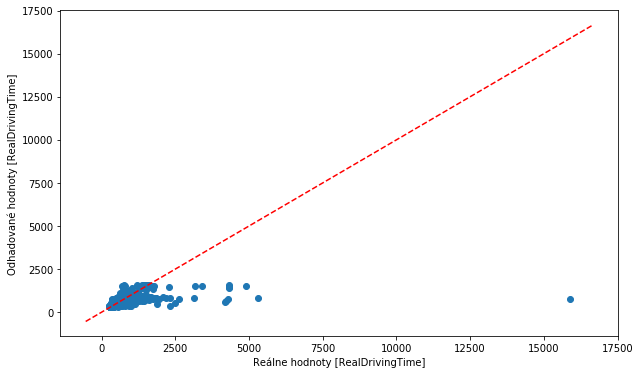

Najväčšia chyba:855.2174072265625
Najväčšia chyba v zápornom smere:-15104.275390625
% približne správnych odhadov: 0.9049673020731877


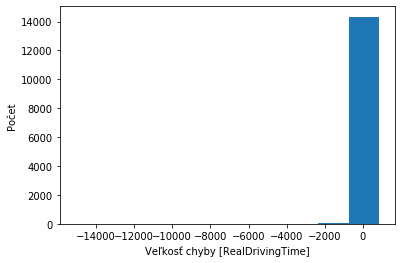

In [133]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons2Jesen", jesen, test3, "64-64")

Veľkosť trénovacej množniy: (57496, 11)
Veľkosť testovacej množniy: (14374, 11)

....................
....................
....................
....................
.............

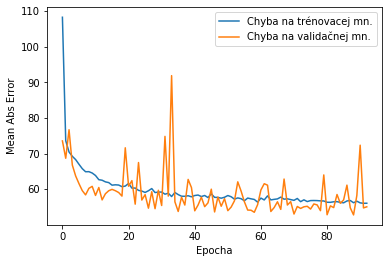

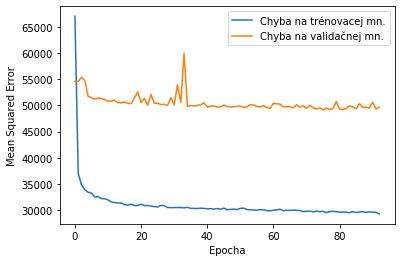

Testing set Mean Abs Error: 55.08 RealDrivingTime 
Testing set Mean Sqrt Error: 32620.44 RealDrivingTime 
Testing set Root Mean Sqrt Error: 180.61 RealDrivingTime 


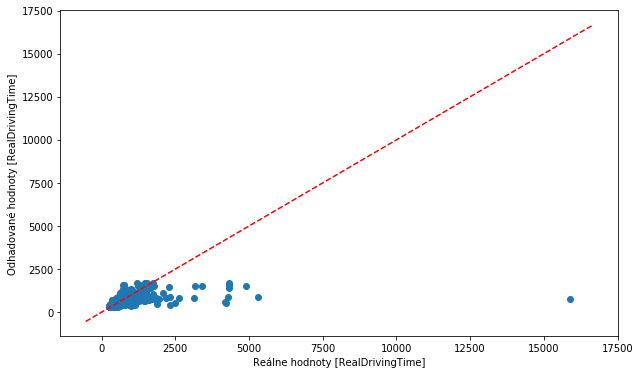

Najväčšia chyba:856.0828857421875
Najväčšia chyba v zápornom smere:-15094.685546875
% približne správnych odhadov: 0.9012105189926256


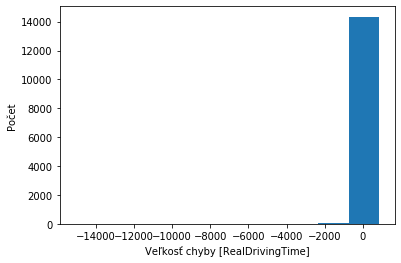

In [134]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons3Jesen", jesen, test3, "128-64-64")

Veľkosť trénovacej množniy: (57496, 11)
Veľkosť testovacej množniy: (14374, 11)

....................
....................
....................
..

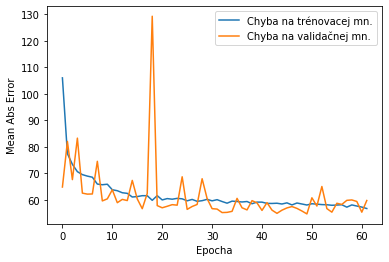

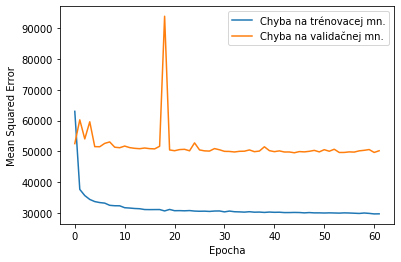

Testing set Mean Abs Error: 56.59 RealDrivingTime 
Testing set Mean Sqrt Error: 33023.05 RealDrivingTime 
Testing set Root Mean Sqrt Error: 181.72 RealDrivingTime 


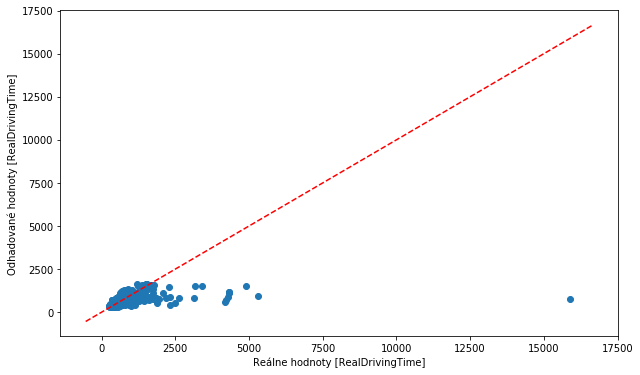

Najväčšia chyba:550.2554931640625
Najväčšia chyba v zápornom smere:-15118.970703125
% približne správnych odhadov: 0.9023236399053848


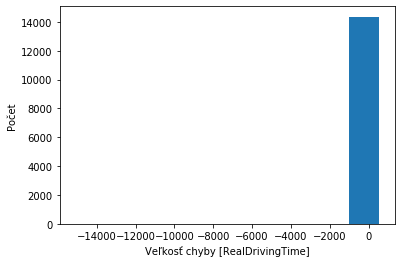

In [135]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons4Jesen", jesen, test3, "96-64-32-32")

Veľkosť trénovacej množniy: (57496, 11)
Veľkosť testovacej množniy: (14374, 11)

....................
....................
....................
....................
....................
....................
..............

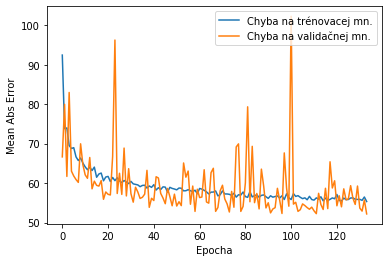

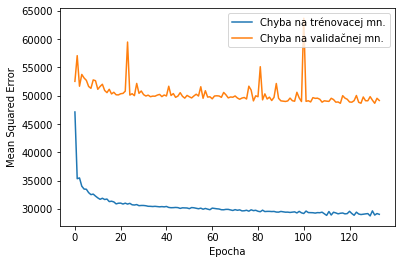

Testing set Mean Abs Error: 54.27 RealDrivingTime 
Testing set Mean Sqrt Error: 32166.82 RealDrivingTime 
Testing set Root Mean Sqrt Error: 179.35 RealDrivingTime 


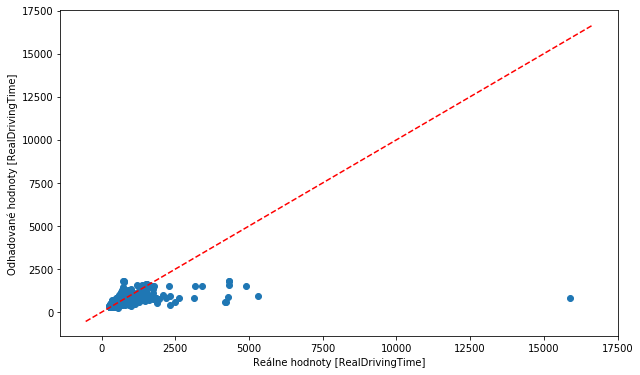

Najväčšia chyba:1085.30419921875
Najväčšia chyba v zápornom smere:-15070.6748046875
% približne správnych odhadov: 0.8979407263113955


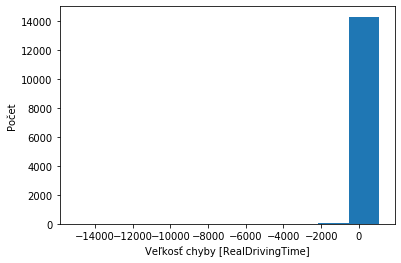

In [136]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons6Jesen", jesen, test3, "96-64-64-32-32-32")

### ZIMA

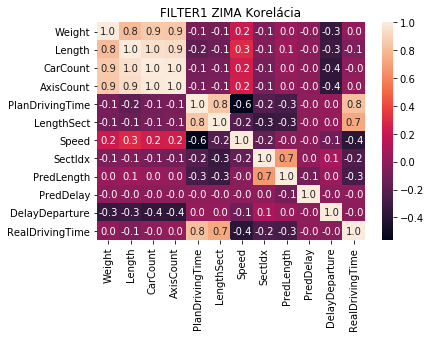

In [137]:
cor = zima[test3].corr()
plt.title("FILTER1 ZIMA Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

Veľkosť trénovacej množniy: (63140, 11)
Veľkosť testovacej množniy: (15785, 11)

....................
....................
....................
....................
....................
.........

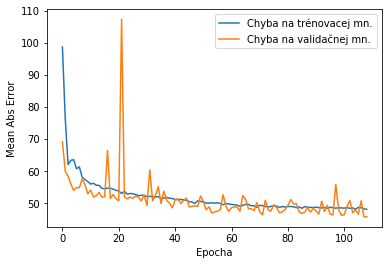

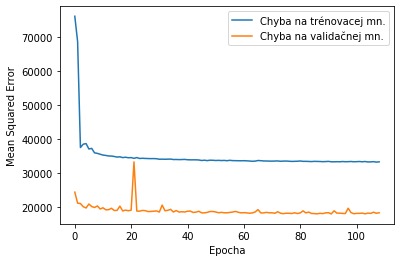

Testing set Mean Abs Error: 47.59 RealDrivingTime 
Testing set Mean Sqrt Error: 22989.65 RealDrivingTime 
Testing set Root Mean Sqrt Error: 151.62 RealDrivingTime 


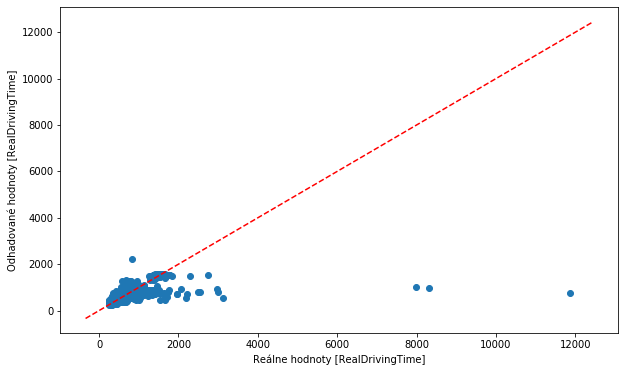

Najväčšia chyba:1381.91357421875
Najväčšia chyba v zápornom smere:-11102.3935546875
% približne správnych odhadov: 0.9254355400696864


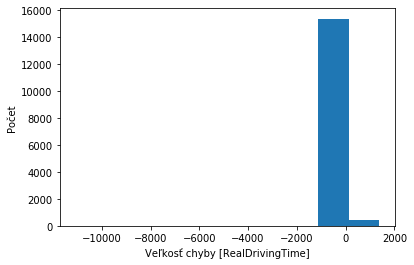

In [138]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons2Zima", zima, test3, "64-64")

Veľkosť trénovacej množniy: (63140, 11)
Veľkosť testovacej množniy: (15785, 11)

....................
....................
....................
.......

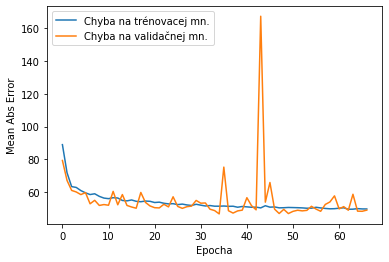

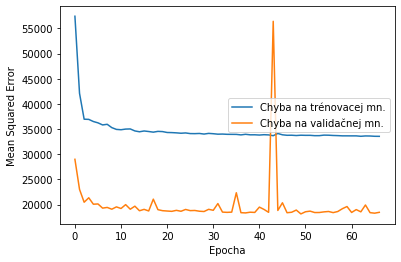

Testing set Mean Abs Error: 48.40 RealDrivingTime 
Testing set Mean Sqrt Error: 23085.83 RealDrivingTime 
Testing set Root Mean Sqrt Error: 151.94 RealDrivingTime 


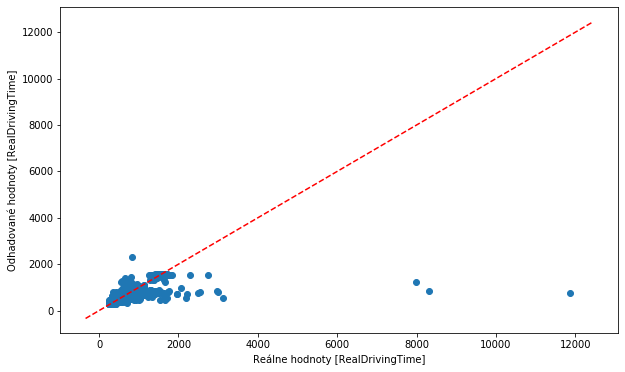

Najväčšia chyba:1491.20361328125
Najväčšia chyba v zápornom smere:-11119.6884765625
% približne správnych odhadov: 0.9267659170098195


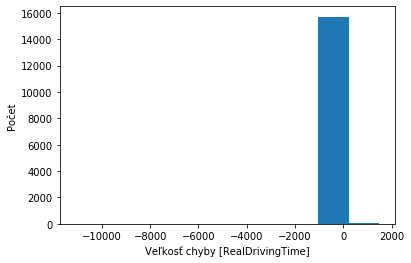

In [139]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons3Zima", zima, test3, "128-64-64")

Veľkosť trénovacej množniy: (63140, 11)
Veľkosť testovacej množniy: (15785, 11)

....................
....................
....................
....................
....................
....................
...................

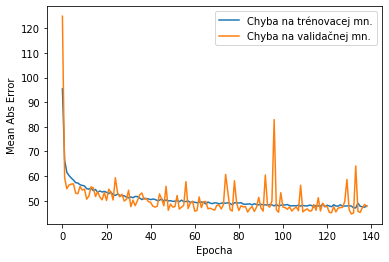

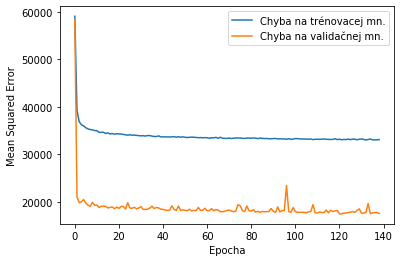

Testing set Mean Abs Error: 46.51 RealDrivingTime 
Testing set Mean Sqrt Error: 22585.62 RealDrivingTime 
Testing set Root Mean Sqrt Error: 150.29 RealDrivingTime 


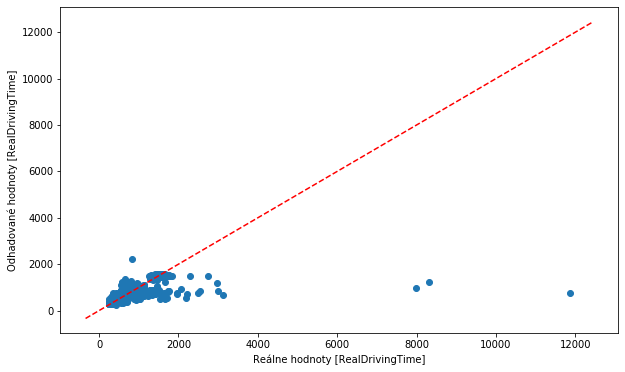

Najväčšia chyba:1372.61279296875
Najväčšia chyba v zápornom smere:-11102.9169921875
% približne správnych odhadov: 0.9259423503325942


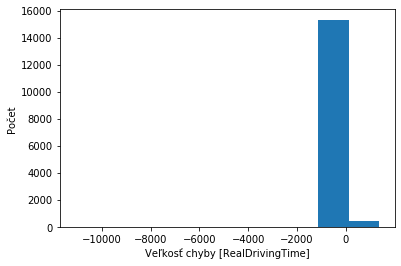

In [140]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons4Zima", zima, test3, "96-64-32-32")

Veľkosť trénovacej množniy: (63140, 11)
Veľkosť testovacej množniy: (15785, 11)

....................
....................
....................
....................
....................
....................
.

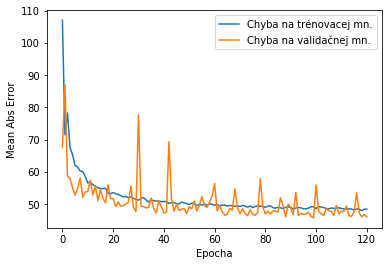

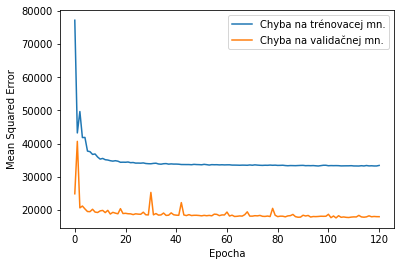

Testing set Mean Abs Error: 48.08 RealDrivingTime 
Testing set Mean Sqrt Error: 22729.36 RealDrivingTime 
Testing set Root Mean Sqrt Error: 150.76 RealDrivingTime 


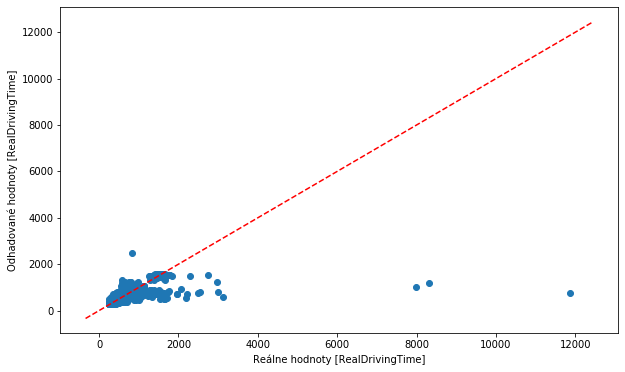

Najväčšia chyba:1635.067138671875
Najväčšia chyba v zápornom smere:-11097.6533203125
% približne správnych odhadov: 0.9269559708584099


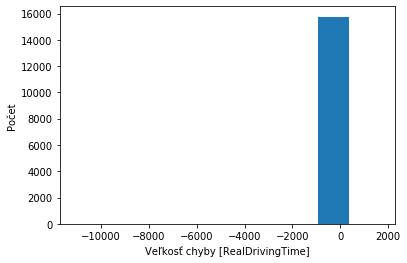

In [141]:
CreateAndFitModelDATA(0.001, "SKFILTER1Seasons6Zima", zima, test3, "96-65-64-32-32-32")

# Vyhodnotenie

## OneHot

### BASE


### FILTER1




# Test 4 - vplyv obdobia dňa na jazdné doby 
Predpokladám, že vlaky v čase rána častejšie meškajú práve pre väčší počet spojov a cestujúcich. Do modelu pridávam vlastnosti
- Ráno
- Obed
- Večer
- Noc

In [142]:
test4 = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
            'SectIdx', 'PredLength','PredDelay', 'DelayDeparture',
            'RealDrivingTime']
test4OneHot = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
            'SectIdx', 'PredLength','PredDelay', 'DelayDeparture',
            'Rano','Obed','Vecer','Noc',
            'RealDrivingTime']

In [143]:
used_attributes = test4
label = used_attributes[-1]

In [144]:
rano = DFFILTER1[(DFFILTER1['DayTime'] == 'Rano')]
obed = DFFILTER1[(DFFILTER1['DayTime'] == 'Obed')]
vecer = DFFILTER1[(DFFILTER1['DayTime'] == 'Vecer')]
noc = DFFILTER1[(DFFILTER1['DayTime'] == 'Noc')]

In [145]:
type = DFBASE['DayTime']
for daytime in daytime_types:
    DFBASE[daytime] = (type == daytime)*1.0
    
type = DFFILTER1['DayTime']
for daytime in daytime_types:
    DFFILTER1[daytime] = (type == daytime)*1.0

Počet vlakov pre každé obdobie:
Vecer: 70510
Obed: 88590
Noc: 64133
Rano: 73212


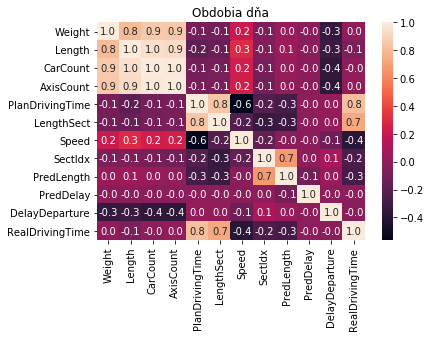

In [146]:
plt.title("Obdobia dňa")
sns.heatmap(cor, annot = True, fmt='.1f')    

print("Počet vlakov pre každé obdobie:")
for obdobie in daytime_types:
    print(obdobie + ": " + str(len(DFFILTER1[(DFFILTER1[obdobie] == 1.0)])))

## BASE DayTime OneHot

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 15)
Veľkosť testovacej množniy: (67795, 15)

....................
....................
....................
....................
........

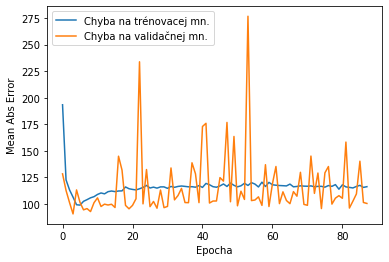

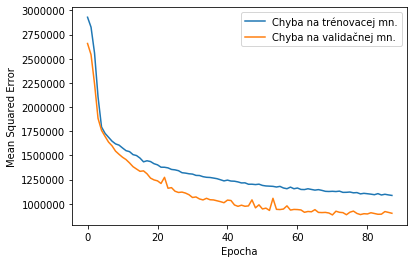

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 98.62 RealDrivingTime 
Testing set Mean Sqrt Error: 1272623.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1128.11 RealDrivingTime 


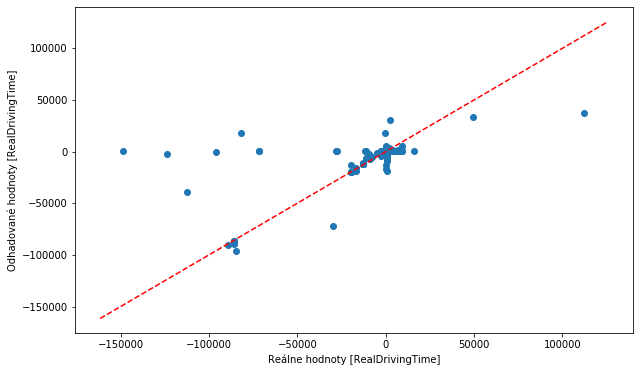

Najväčšia chyba:149502.765625
Najväčšia chyba v zápornom smere:-75231.8671875
% približne správnych odhadov: 0.8126115495243013


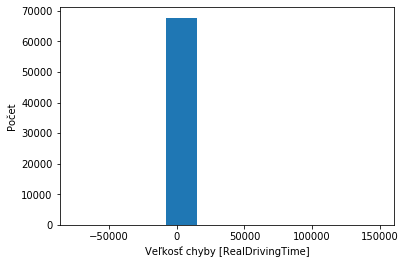

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 569.09 RealDrivingTime 
Testing set Mean Sqrt Error: 1474576.75 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1214.32 RealDrivingTime 


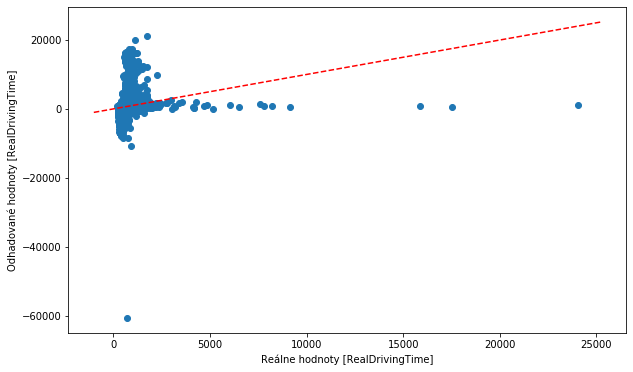

Najväčšia chyba:19401.82421875
Najväčšia chyba v zápornom smere:-61554.8984375
% približne správnych odhadov: 0.23258951913508408


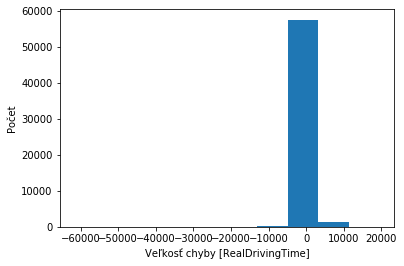

In [147]:
CreateAndFitModel("BASE", 0.001, 120, "SKBASEDayTime2OneHot", test4OneHot,"64-64")

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 15)
Veľkosť testovacej množniy: (67795, 15)

....................
....................
....................
.

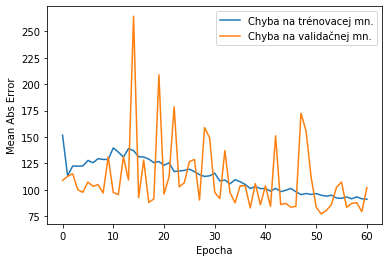

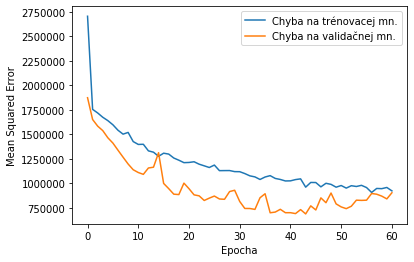

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 87.46 RealDrivingTime 
Testing set Mean Sqrt Error: 1255383.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1120.44 RealDrivingTime 


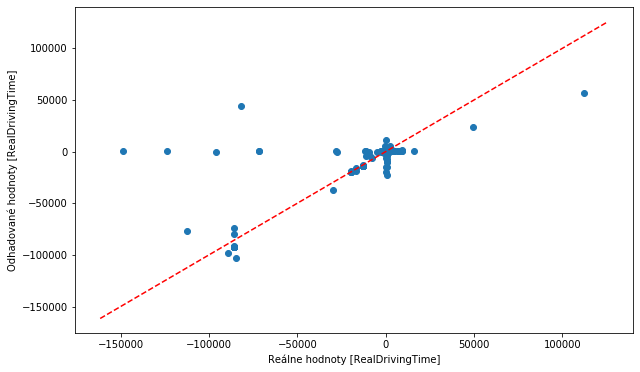

Najväčšia chyba:149176.484375
Najväčšia chyba v zápornom smere:-55356.36328125
% približne správnych odhadov: 0.8490154141160853


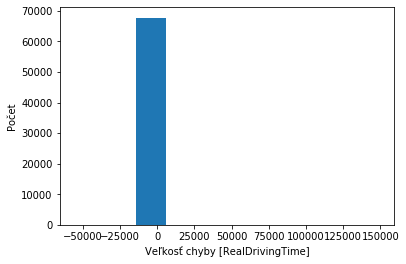

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 195.18 RealDrivingTime 
Testing set Mean Sqrt Error: 273952.09 RealDrivingTime 
Testing set Root Mean Sqrt Error: 523.40 RealDrivingTime 


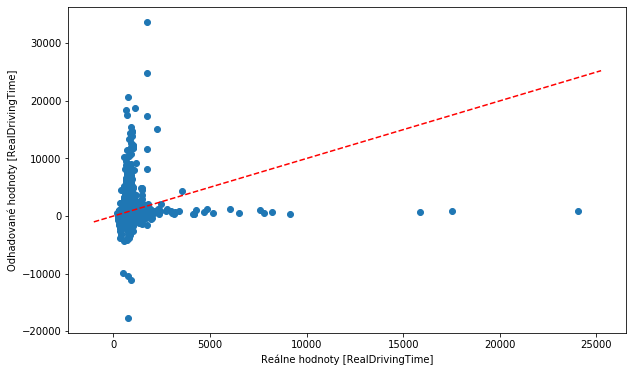

Najväčšia chyba:31955.30078125
Najväčšia chyba v zápornom smere:-23196.5390625
% približne správnych odhadov: 0.5001264990133077


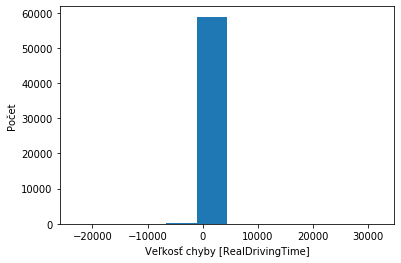

In [148]:
CreateAndFitModel("BASE", 0.001, 120, "SKBASEDayTime3OneHot", test4OneHot,"128-64-64")

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 15)
Veľkosť testovacej množniy: (67795, 15)

....................
....................
...

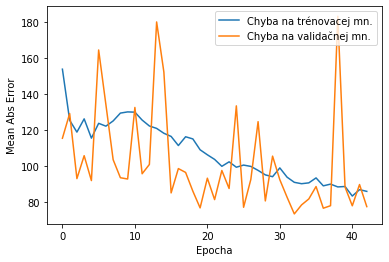

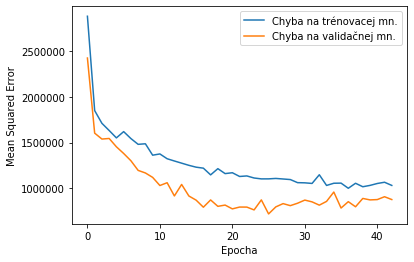

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 79.46 RealDrivingTime 
Testing set Mean Sqrt Error: 1266204.38 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1125.26 RealDrivingTime 


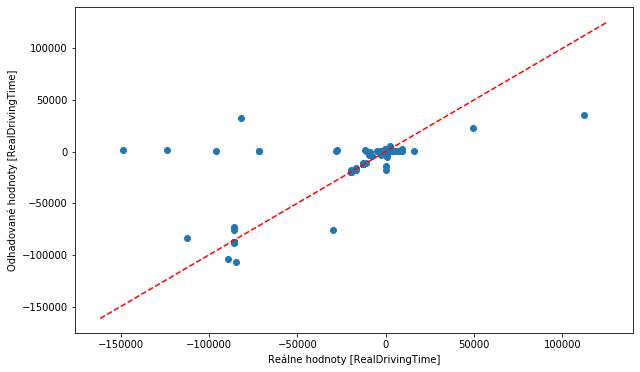

Najväčšia chyba:149636.375
Najväčšia chyba v zápornom smere:-77250.171875
% približne správnych odhadov: 0.8616712146913489


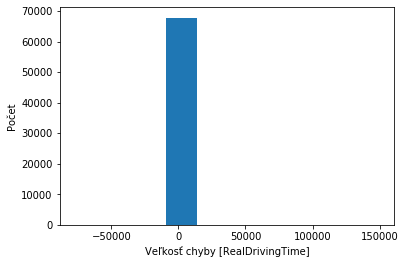

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 173.07 RealDrivingTime 
Testing set Mean Sqrt Error: 134173.70 RealDrivingTime 
Testing set Root Mean Sqrt Error: 366.30 RealDrivingTime 


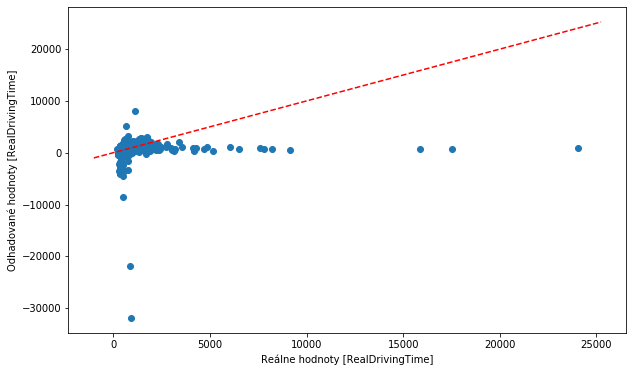

Najväčšia chyba:6939.2978515625
Najväčšia chyba v zápornom smere:-32899.8671875
% približne správnych odhadov: 0.49833864629189223


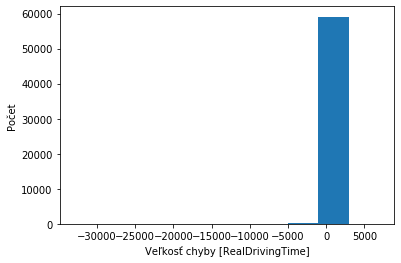

In [149]:
CreateAndFitModel("BASE", 0.001, 120, "SKBASEDayTime4OneHot", test4OneHot,"96-64-32-32")

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (271178, 15)
Veľkosť testovacej množniy: (67795, 15)

....................
....................
....................
....................
....................
....................
....................
..........

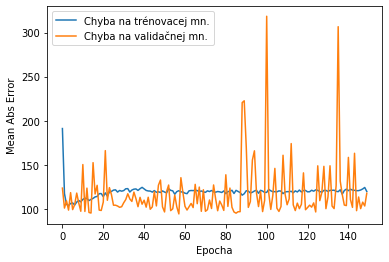

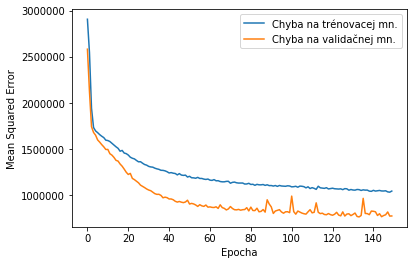

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 101.40 RealDrivingTime 
Testing set Mean Sqrt Error: 1242082.62 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1114.49 RealDrivingTime 


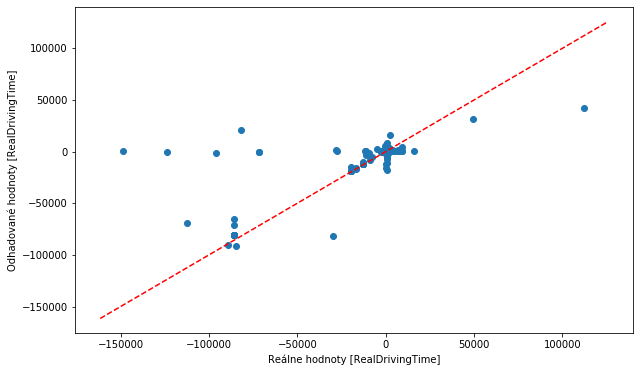

Najväčšia chyba:149538.625
Najväčšia chyba v zápornom smere:-70712.1953125
% približne správnych odhadov: 0.8050888708606829


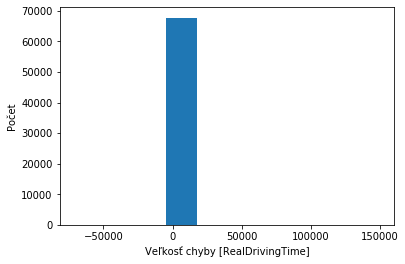

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 444.97 RealDrivingTime 
Testing set Mean Sqrt Error: 730792.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 854.86 RealDrivingTime 


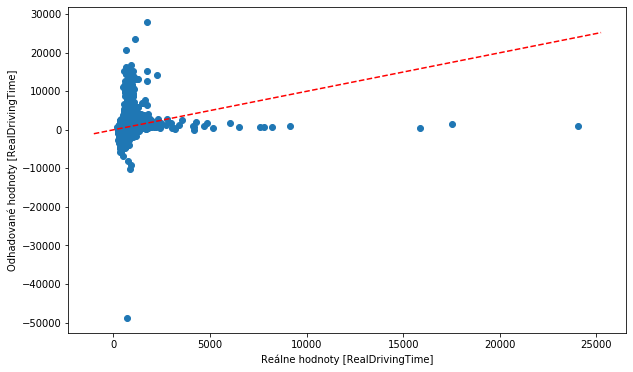

Najväčšia chyba:26251.265625
Najväčšia chyba v zápornom smere:-49662.97265625
% približne správnych odhadov: 0.22864274991988395


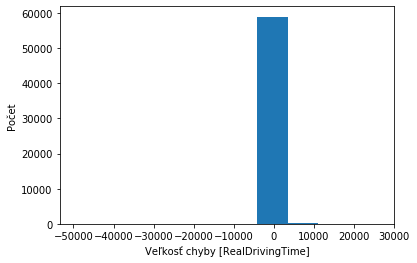

In [150]:
CreateAndFitModel("BASE", 0.001, 120, "SKBASEDayTime6OneHot", test4OneHot, "96-64-64-32-32")

## FILTER1 DayTime OneHot

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 15)
Veľkosť testovacej množniy: (59289, 15)

....................
....................
....................
....................
..

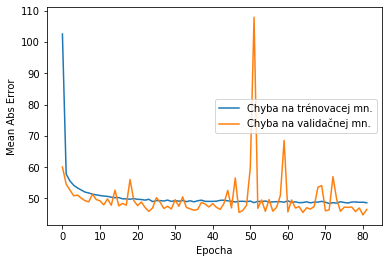

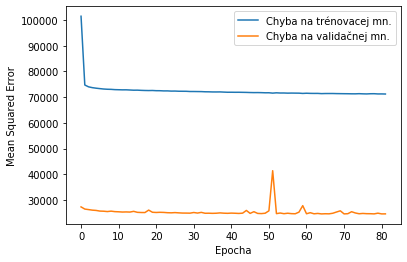

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 174.70 RealDrivingTime 
Testing set Mean Sqrt Error: 2994006.50 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1730.32 RealDrivingTime 


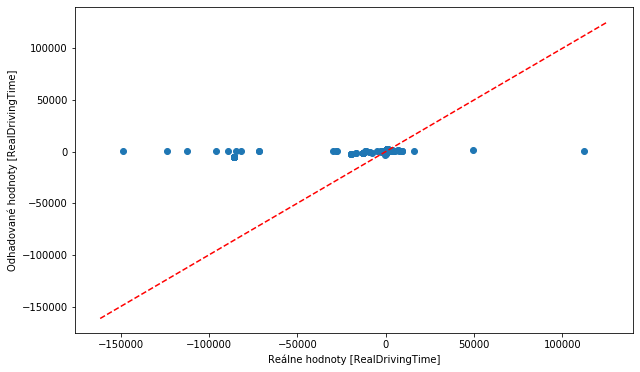

Najväčšia chyba:149260.8125
Najväčšia chyba v zápornom smere:-111671.59375
% približne správnych odhadov: 0.6814809351722103


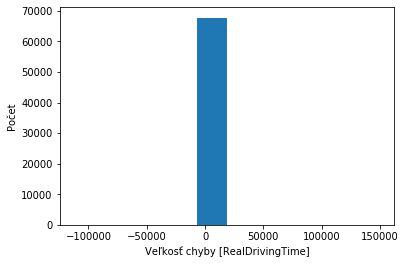

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 45.74 RealDrivingTime 
Testing set Mean Sqrt Error: 31838.23 RealDrivingTime 
Testing set Root Mean Sqrt Error: 178.43 RealDrivingTime 


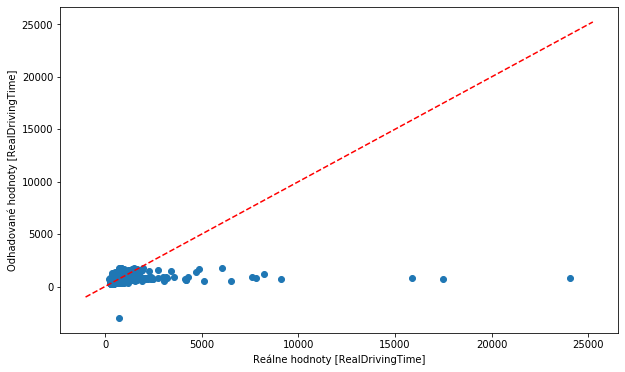

Najväčšia chyba:1037.5274658203125
Najväčšia chyba v zápornom smere:-23251.884765625
% približne správnych odhadov: 0.9266137057464285


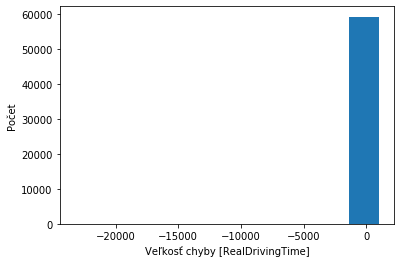

In [151]:
CreateAndFitModel("FILTER1", 0.001, 120, "SKFILTER1EDayTime2OneHot", test4OneHot,"64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 15)
Veľkosť testovacej množniy: (59289, 15)

....................
....................
....................
..

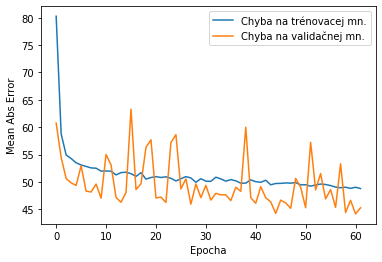

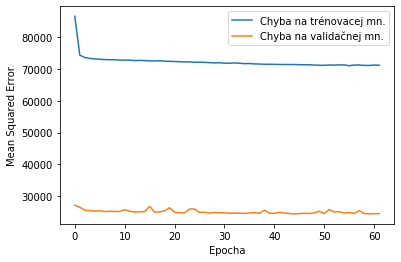

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 208.13 RealDrivingTime 
Testing set Mean Sqrt Error: 3206115.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1790.56 RealDrivingTime 


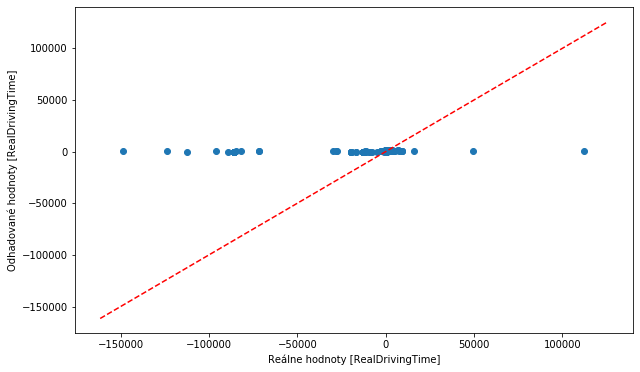

Najväčšia chyba:149262.296875
Najväčšia chyba v zápornom smere:-111832.15625
% približne správnych odhadov: 0.6365661184453131


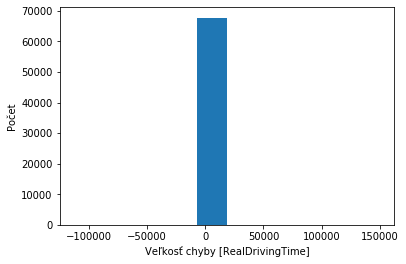

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 44.41 RealDrivingTime 
Testing set Mean Sqrt Error: 31440.80 RealDrivingTime 
Testing set Root Mean Sqrt Error: 177.32 RealDrivingTime 


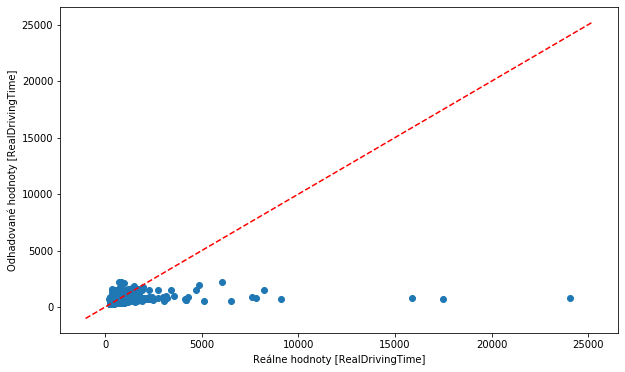

Najväčšia chyba:1527.366455078125
Najväčšia chyba v zápornom smere:-23258.83984375
% približne správnych odhadov: 0.9287220226348901


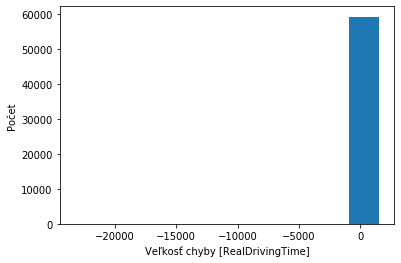

In [152]:
CreateAndFitModel("FILTER1", 0.001, 120, "SKFILTER1DayTime3OneHot", test4OneHot,"128-64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 15)
Veľkosť testovacej množniy: (59289, 15)

....................
....................
.

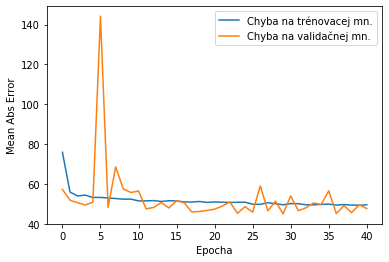

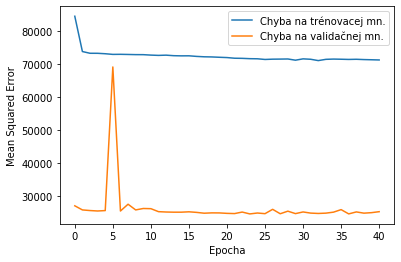

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 198.14 RealDrivingTime 
Testing set Mean Sqrt Error: 3203325.75 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1789.78 RealDrivingTime 


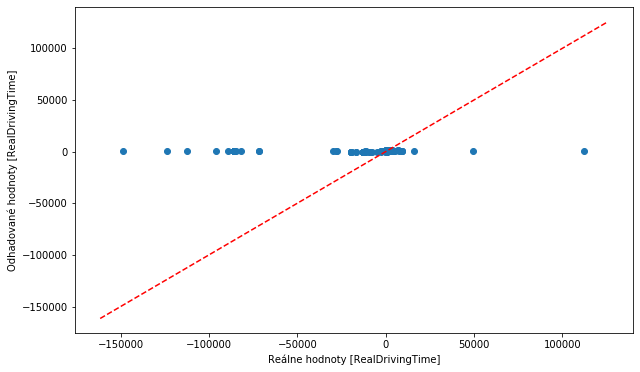

Najväčšia chyba:149236.765625
Najväčšia chyba v zápornom smere:-111855.2421875
% približne správnych odhadov: 0.6714654473043735


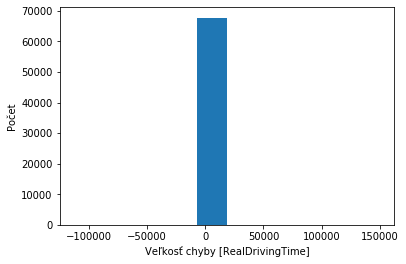

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 45.37 RealDrivingTime 
Testing set Mean Sqrt Error: 31506.15 RealDrivingTime 
Testing set Root Mean Sqrt Error: 177.50 RealDrivingTime 


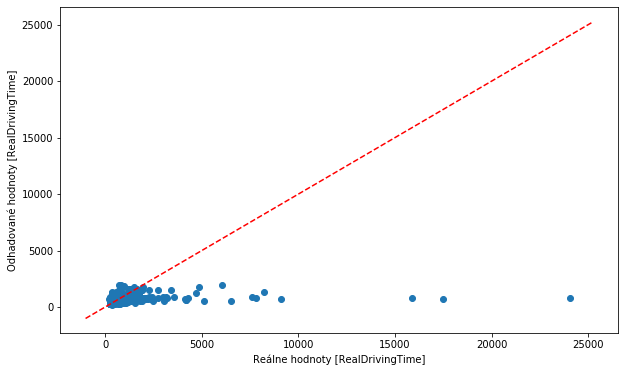

Najväčšia chyba:1208.8848876953125
Najväčšia chyba v zápornom smere:-23270.505859375
% približne správnych odhadov: 0.9262763750442746


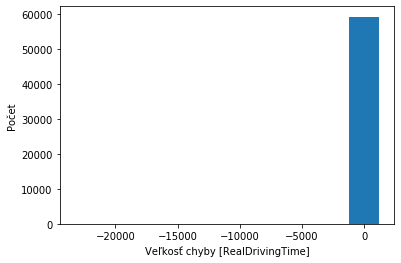

In [153]:
CreateAndFitModel("FILTER1", 0.001, 120, "SKFILTER1DayTime4OneHot", test4OneHot,"96-64-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (237156, 15)
Veľkosť testovacej množniy: (59289, 15)

....................
....................
....................
....................
....................
...............

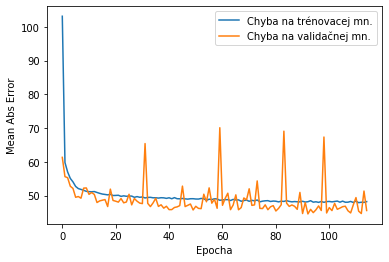

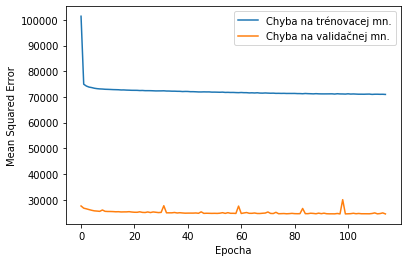

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 197.74 RealDrivingTime 
Testing set Mean Sqrt Error: 2531627.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1591.11 RealDrivingTime 


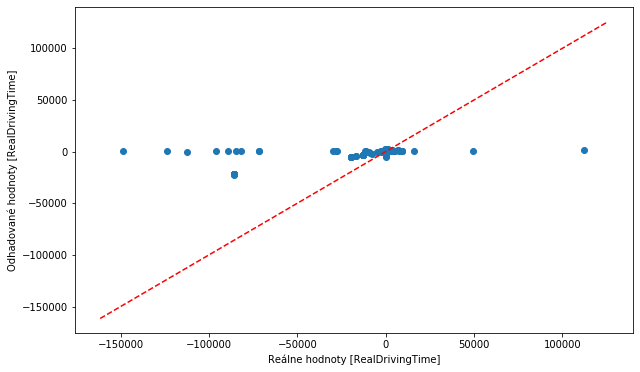

Najväčšia chyba:149185.671875
Najväčšia chyba v zápornom smere:-111383.0
% približne správnych odhadov: 0.5962534110185117


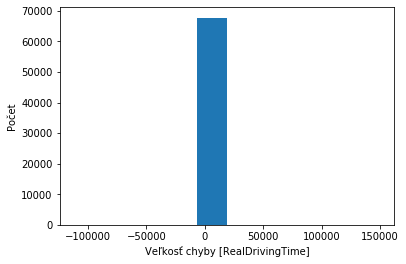

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 45.64 RealDrivingTime 
Testing set Mean Sqrt Error: 31751.69 RealDrivingTime 
Testing set Root Mean Sqrt Error: 178.19 RealDrivingTime 


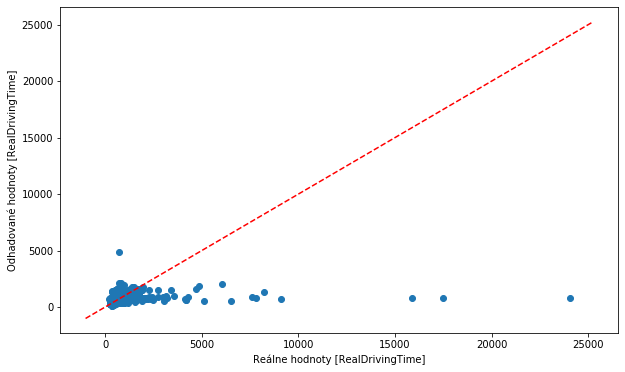

Najväčšia chyba:4120.55078125
Najväčšia chyba v zápornom smere:-23241.4453125
% približne správnych odhadov: 0.9224476715748284


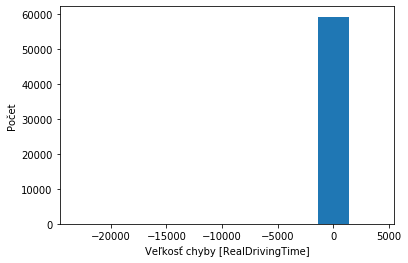

In [154]:
CreateAndFitModel("FILTER1", 0.001, 120, "SKFILTER1DayTime6OneHot", test4OneHot, "96-64-64-32-32")

# FILTER1 DayTime 

### RANO

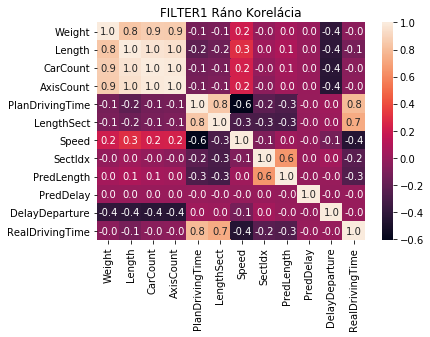

In [155]:
cor = rano[test4].corr()
plt.title("FILTER1 Ráno Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

Veľkosť trénovacej množniy: (58570, 11)
Veľkosť testovacej množniy: (14642, 11)

....................
....................
....................
....................
....................
...........

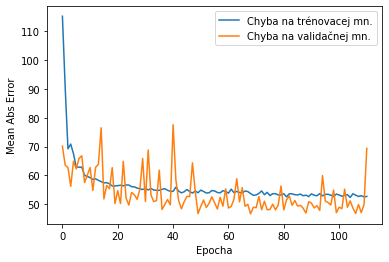

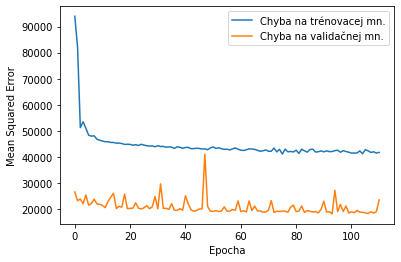

Testing set Mean Abs Error: 49.32 RealDrivingTime 
Testing set Mean Sqrt Error: 30489.29 RealDrivingTime 
Testing set Root Mean Sqrt Error: 174.61 RealDrivingTime 


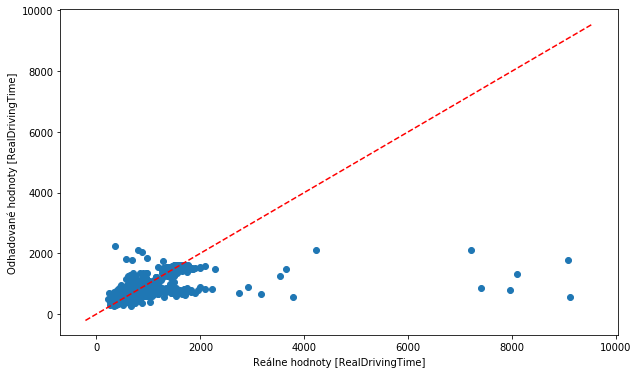

Najväčšia chyba:1889.23046875
Najväčšia chyba v zápornom smere:-8562.125
% približne správnych odhadov: 0.9222100805900834


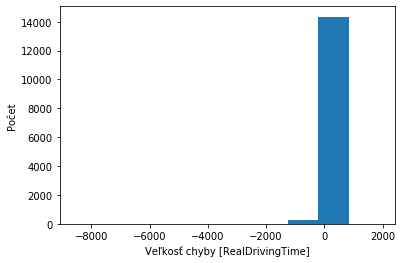

In [156]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime2Rano", rano, test4, "64-64")

Veľkosť trénovacej množniy: (58570, 11)
Veľkosť testovacej množniy: (14642, 11)

....................
....................
...........

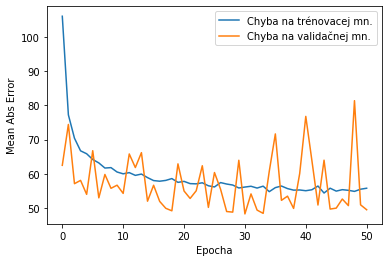

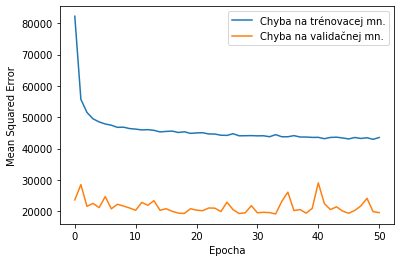

Testing set Mean Abs Error: 49.81 RealDrivingTime 
Testing set Mean Sqrt Error: 31798.39 RealDrivingTime 
Testing set Root Mean Sqrt Error: 178.32 RealDrivingTime 


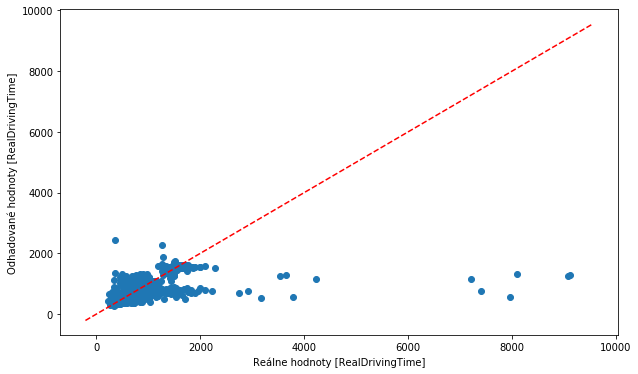

Najväčšia chyba:2086.6708984375
Najväčšia chyba v zápornom smere:-7831.7333984375
% približne správnych odhadov: 0.9296544187952466


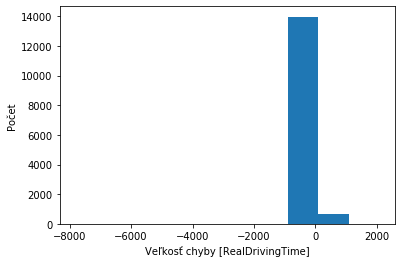

In [157]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime3Rano", rano, test4, "128-64-64")

Veľkosť trénovacej množniy: (58570, 11)
Veľkosť testovacej množniy: (14642, 11)

....................
....................
....................
....................
....................

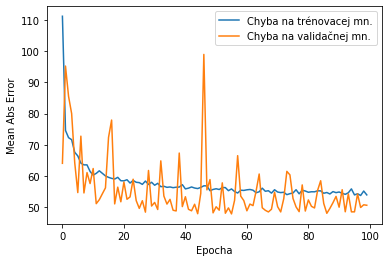

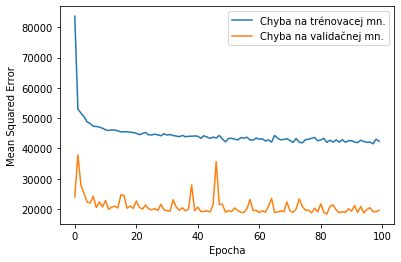

Testing set Mean Abs Error: 51.13 RealDrivingTime 
Testing set Mean Sqrt Error: 31230.39 RealDrivingTime 
Testing set Root Mean Sqrt Error: 176.72 RealDrivingTime 


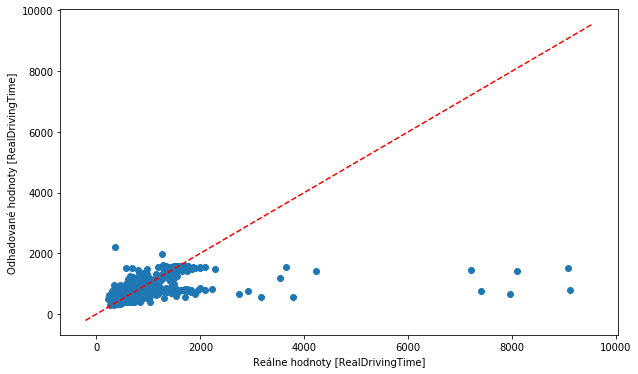

Najväčšia chyba:1833.050048828125
Najväčšia chyba v zápornom smere:-8320.0361328125
% približne správnych odhadov: 0.9248053544597733


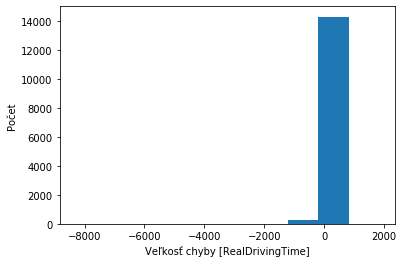

In [158]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime4Rano", rano, test4, "96-64-32-32")

Veľkosť trénovacej množniy: (58570, 11)
Veľkosť testovacej množniy: (14642, 11)

....................
....................
....................
....................
.

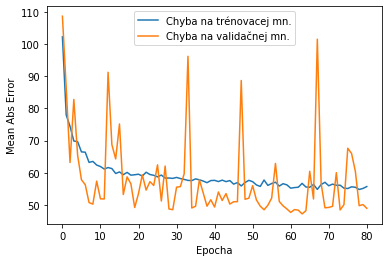

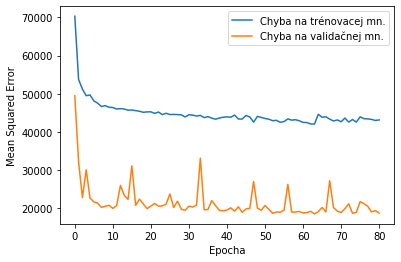

Testing set Mean Abs Error: 48.52 RealDrivingTime 
Testing set Mean Sqrt Error: 30006.47 RealDrivingTime 
Testing set Root Mean Sqrt Error: 173.22 RealDrivingTime 


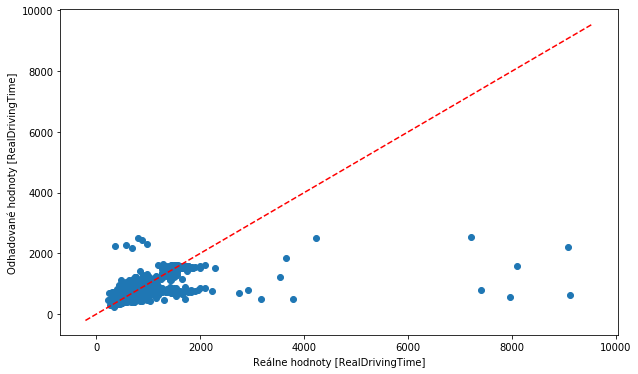

Najväčšia chyba:1894.13671875
Najväčšia chyba v zápornom smere:-8499.3837890625
% približne správnych odhadov: 0.9286982652643082


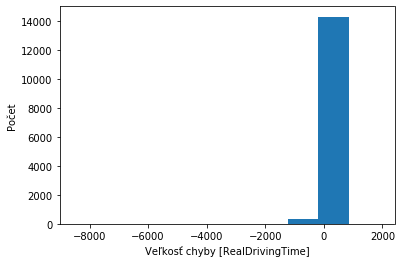

In [159]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime6Rano", rano, test4, "96-64-64-32-32-32")

### OBED

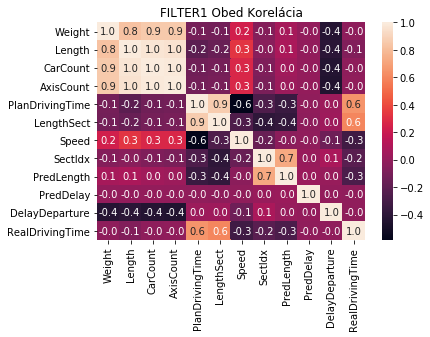

In [160]:
cor = obed[test4].corr()
plt.title("FILTER1 Obed Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

Veľkosť trénovacej množniy: (70872, 11)
Veľkosť testovacej množniy: (17718, 11)

....................
....................
....................
.

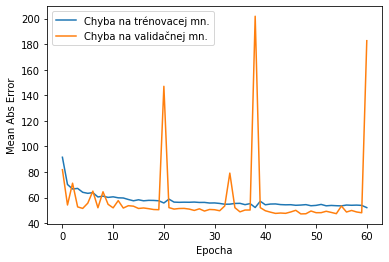

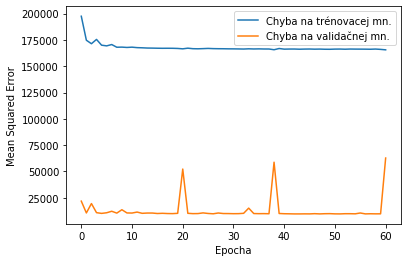

Testing set Mean Abs Error: 47.32 RealDrivingTime 
Testing set Mean Sqrt Error: 10618.77 RealDrivingTime 
Testing set Root Mean Sqrt Error: 103.05 RealDrivingTime 


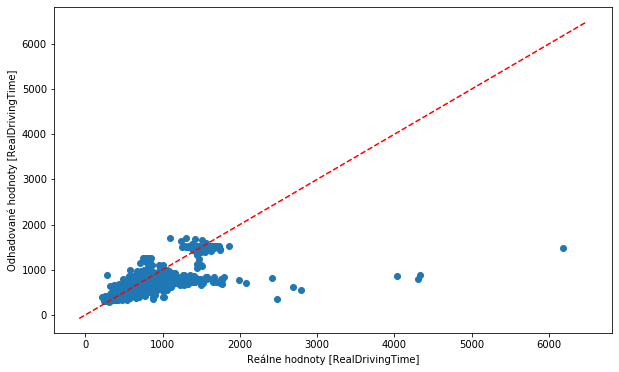

Najväčšia chyba:600.05029296875
Najväčšia chyba v zápornom smere:-4698.92919921875
% približne správnych odhadov: 0.9343605373066938


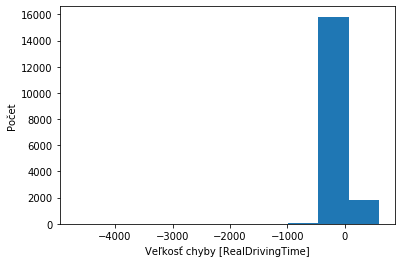

In [161]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime2Obed", obed, test4, "64-64")

Veľkosť trénovacej množniy: (70872, 11)
Veľkosť testovacej množniy: (17718, 11)

....................
....................
....................
....................
......

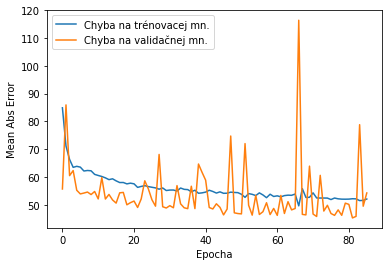

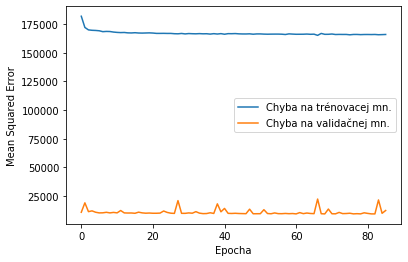

Testing set Mean Abs Error: 45.33 RealDrivingTime 
Testing set Mean Sqrt Error: 10266.51 RealDrivingTime 
Testing set Root Mean Sqrt Error: 101.32 RealDrivingTime 


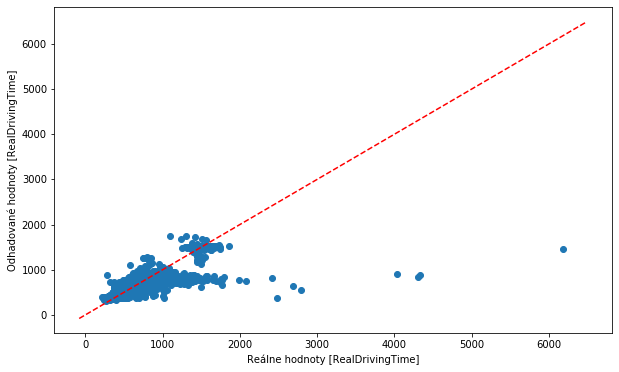

Najväčšia chyba:637.89990234375
Najväčšia chyba v zápornom smere:-4736.0927734375
% približne správnych odhadov: 0.9385370809346427


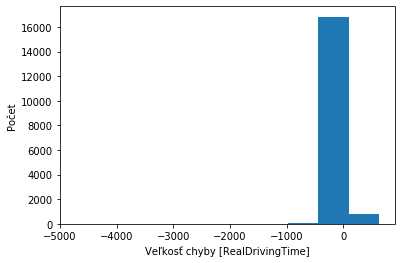

In [162]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime3Obed", obed, test4, "128-64-64")

Veľkosť trénovacej množniy: (70872, 11)
Veľkosť testovacej množniy: (17718, 11)

....................
....................
................

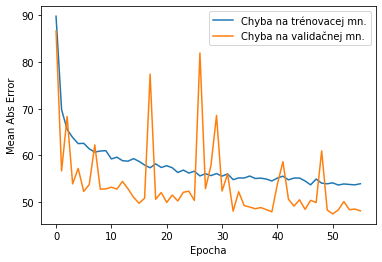

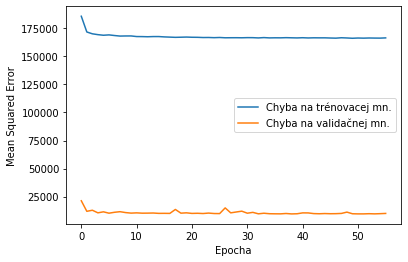

Testing set Mean Abs Error: 47.59 RealDrivingTime 
Testing set Mean Sqrt Error: 10588.35 RealDrivingTime 
Testing set Root Mean Sqrt Error: 102.90 RealDrivingTime 


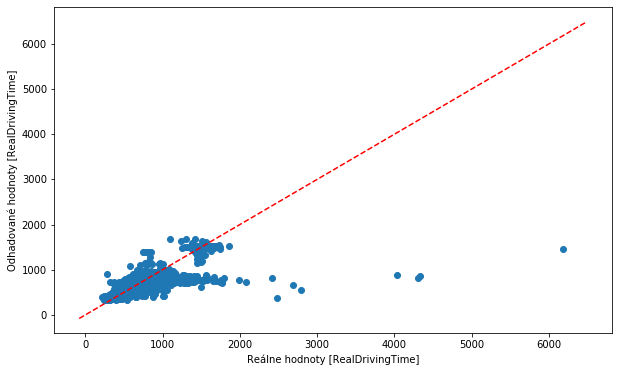

Najväčšia chyba:634.2965087890625
Najväčšia chyba v zápornom smere:-4723.990234375
% približne správnych odhadov: 0.934529856642962


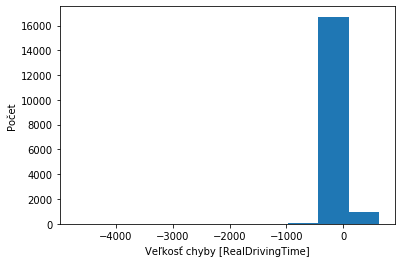

In [163]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime4Obed", obed, test4, "96-64-32-32")

Veľkosť trénovacej množniy: (70872, 11)
Veľkosť testovacej množniy: (17718, 11)

....................
....................
....................
.........

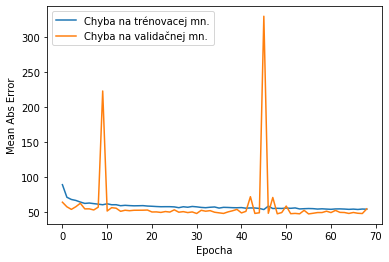

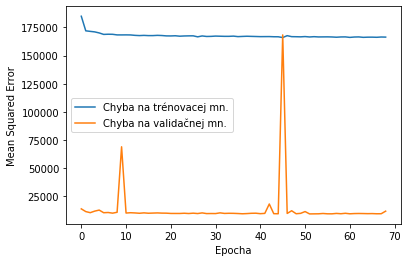

Testing set Mean Abs Error: 47.02 RealDrivingTime 
Testing set Mean Sqrt Error: 10508.08 RealDrivingTime 
Testing set Root Mean Sqrt Error: 102.51 RealDrivingTime 


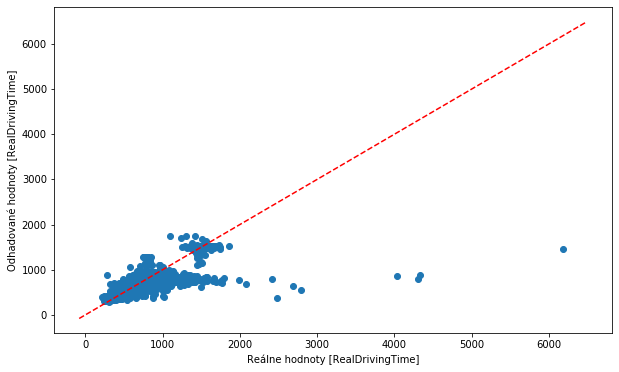

Najväčšia chyba:651.7576904296875
Najväčšia chyba v zápornom smere:-4721.73828125
% približne správnych odhadov: 0.9355457726605712


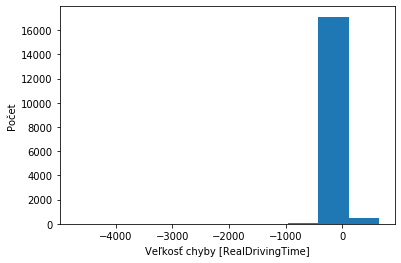

In [164]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime6Obed", obed, test4, "96-64-64-32-32-32")

### VECER

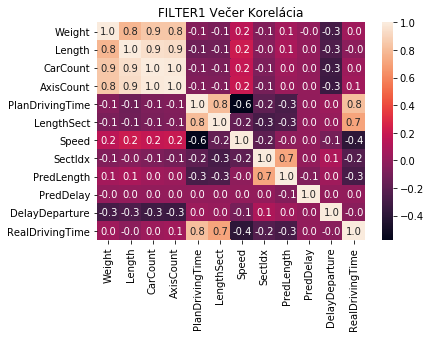

In [165]:
cor = vecer[test4].corr()
plt.title("FILTER1 Večer Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

Veľkosť trénovacej množniy: (56408, 11)
Veľkosť testovacej množniy: (14102, 11)

....................
....................
....................
....................
.......

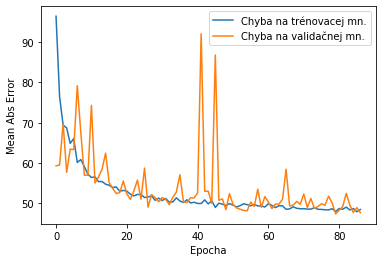

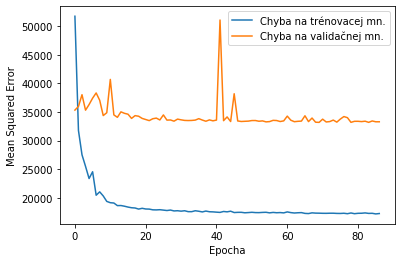

Testing set Mean Abs Error: 47.37 RealDrivingTime 
Testing set Mean Sqrt Error: 7960.06 RealDrivingTime 
Testing set Root Mean Sqrt Error: 89.22 RealDrivingTime 


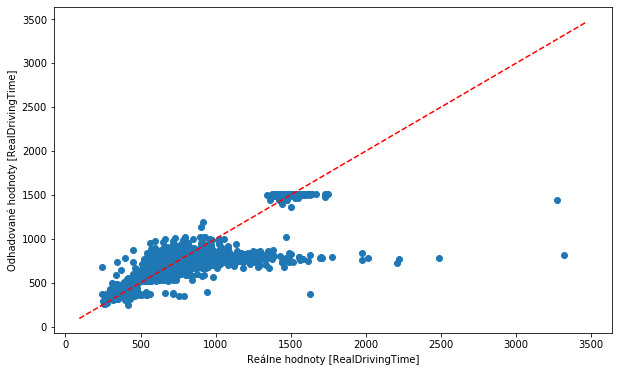

Najväčšia chyba:436.228515625
Najväčšia chyba v zápornom smere:-2503.120361328125
% približne správnych odhadov: 0.9224932633668983


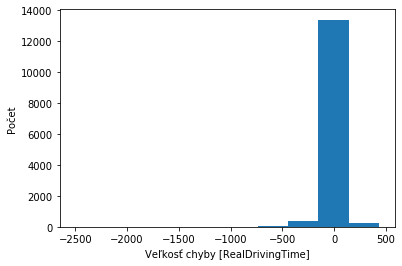

In [166]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime2Vecer", vecer, test4, "64-64")

Veľkosť trénovacej množniy: (56408, 11)
Veľkosť testovacej množniy: (14102, 11)

....................
....................
....................
....................
................

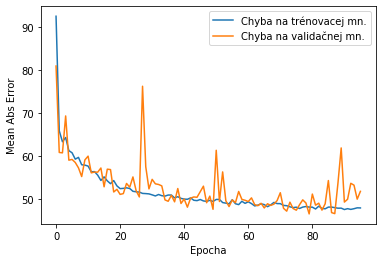

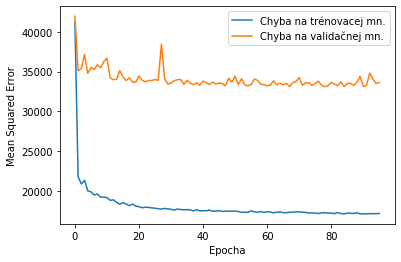

Testing set Mean Abs Error: 46.56 RealDrivingTime 
Testing set Mean Sqrt Error: 7882.09 RealDrivingTime 
Testing set Root Mean Sqrt Error: 88.78 RealDrivingTime 


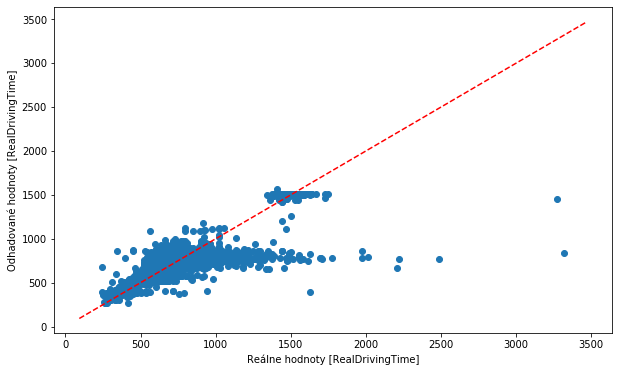

Najväčšia chyba:521.1219482421875
Najväčšia chyba v zápornom smere:-2482.902587890625
% približne správnych odhadov: 0.9205786413274712


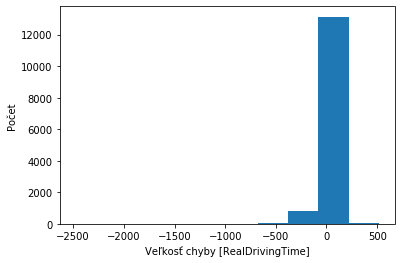

In [167]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime3Vecer", vecer, test4, "128-64-64")

Veľkosť trénovacej množniy: (56408, 11)
Veľkosť testovacej množniy: (14102, 11)

....................
....................
....................
....................
....................
....................

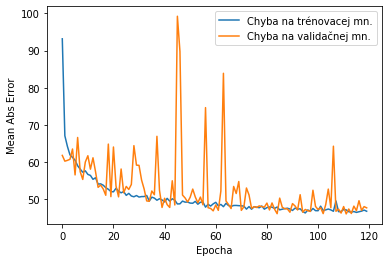

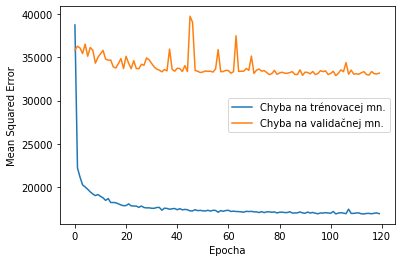

Testing set Mean Abs Error: 43.93 RealDrivingTime 
Testing set Mean Sqrt Error: 7723.86 RealDrivingTime 
Testing set Root Mean Sqrt Error: 87.89 RealDrivingTime 


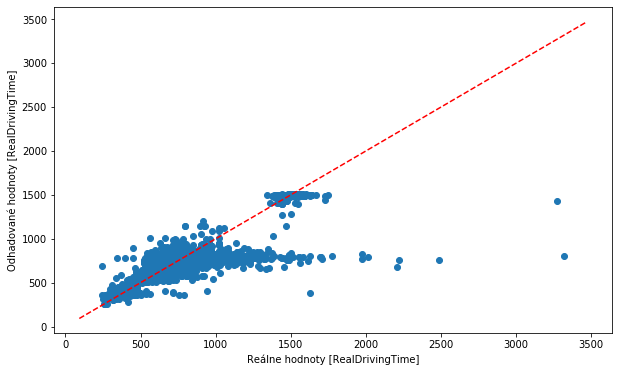

Najväčšia chyba:446.41766357421875
Najväčšia chyba v zápornom smere:-2508.6572265625
% približne správnych odhadov: 0.9258261239540491


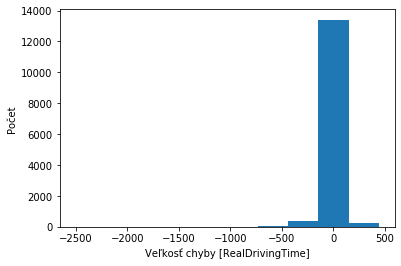

In [168]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime4Vecer", vecer, test4, "96-64-32-32")

Veľkosť trénovacej množniy: (56408, 11)
Veľkosť testovacej množniy: (14102, 11)

....................
....................
....................
....................
..................

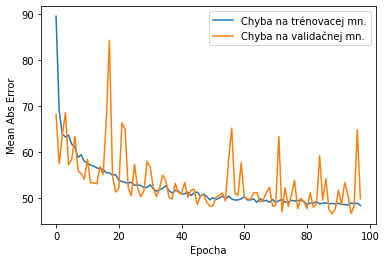

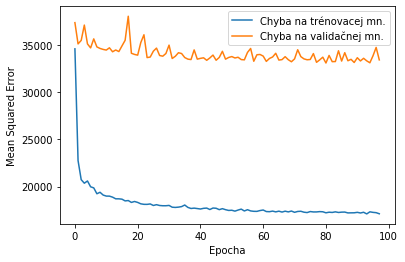

Testing set Mean Abs Error: 45.46 RealDrivingTime 
Testing set Mean Sqrt Error: 7853.29 RealDrivingTime 
Testing set Root Mean Sqrt Error: 88.62 RealDrivingTime 


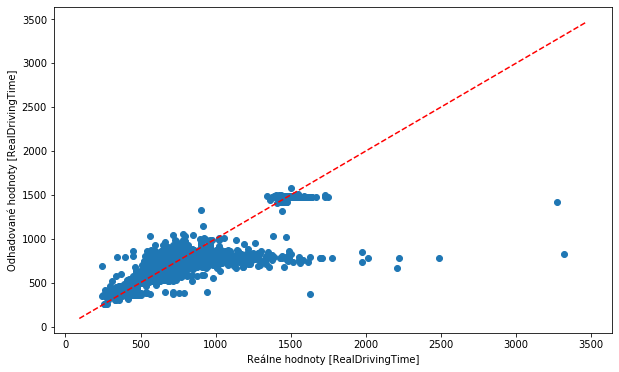

Najväčšia chyba:462.125732421875
Najväčšia chyba v zápornom smere:-2485.14111328125
% približne správnych odhadov: 0.9245497092610977


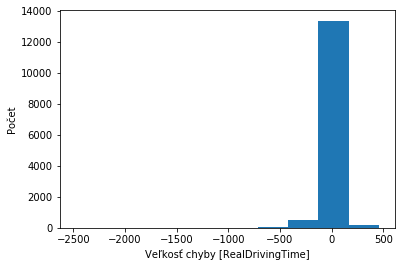

In [169]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime6Vecer", vecer, test4, "96-64-64-32-32-32")

### NOC

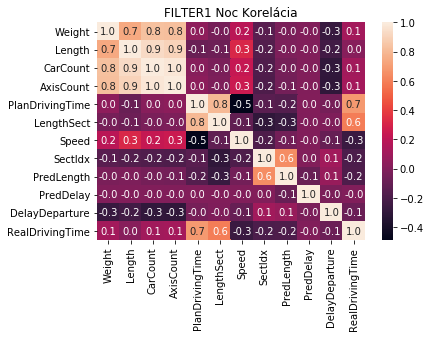

In [170]:
cor = noc[test4].corr()
plt.title("FILTER1 Noc Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

Veľkosť trénovacej množniy: (51306, 11)
Veľkosť testovacej množniy: (12827, 11)

....................
....................
....................
....................
...................

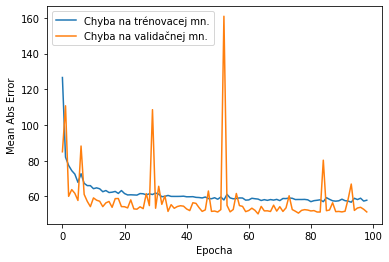

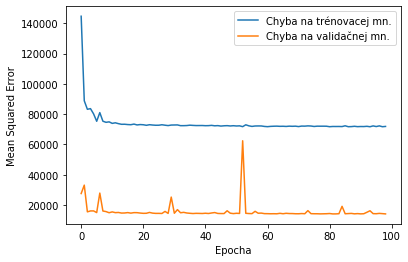

Testing set Mean Abs Error: 54.39 RealDrivingTime 
Testing set Mean Sqrt Error: 21433.69 RealDrivingTime 
Testing set Root Mean Sqrt Error: 146.40 RealDrivingTime 


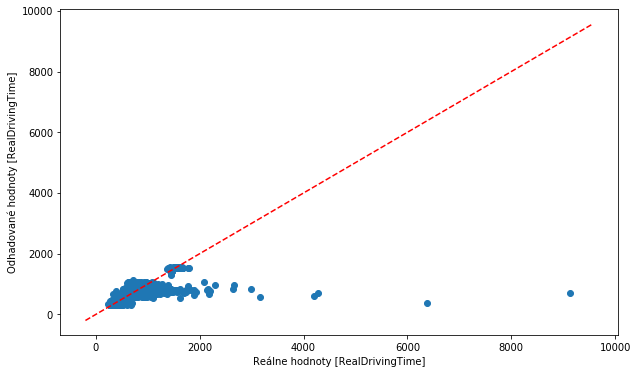

Najväčšia chyba:441.8746337890625
Najväčšia chyba v zápornom smere:-8415.548828125
% približne správnych odhadov: 0.9063693770951898


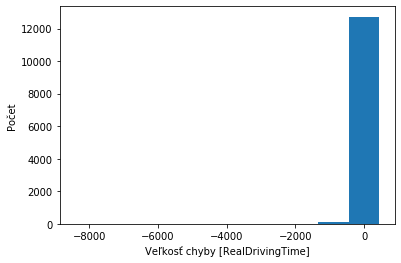

In [171]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime2Noc", noc, test4, "64-64")

Veľkosť trénovacej množniy: (51306, 11)
Veľkosť testovacej množniy: (12827, 11)

....................
....................
....................
....................
....................

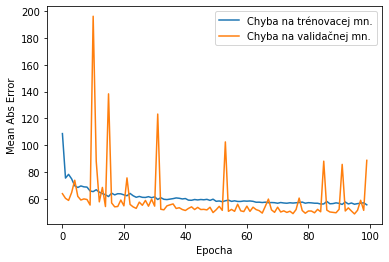

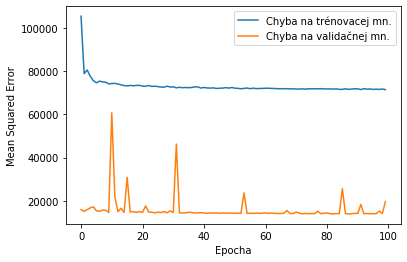

Testing set Mean Abs Error: 52.38 RealDrivingTime 
Testing set Mean Sqrt Error: 21412.01 RealDrivingTime 
Testing set Root Mean Sqrt Error: 146.33 RealDrivingTime 


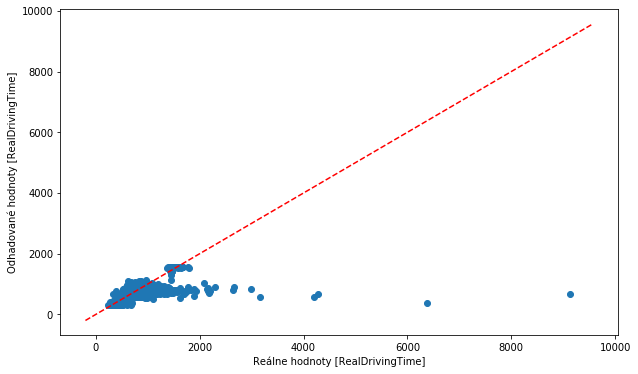

Najväčšia chyba:468.2950439453125
Najväčšia chyba v zápornom smere:-8434.017578125
% približne správnych odhadov: 0.909253917517736


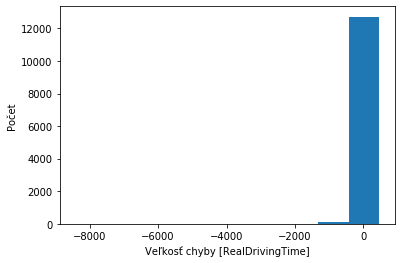

In [172]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime3Noc", noc, test4, "128-64-64")

Veľkosť trénovacej množniy: (51306, 11)
Veľkosť testovacej množniy: (12827, 11)

....................
....................
....................
....................
....................
....................
.........

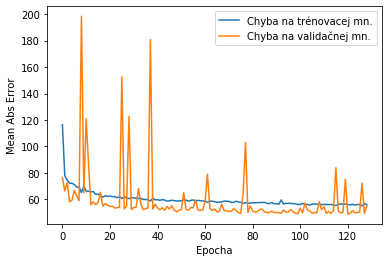

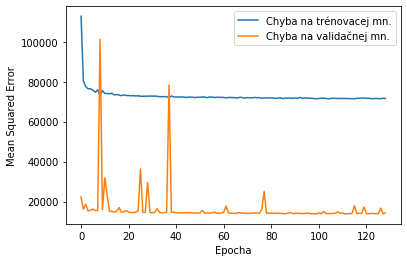

Testing set Mean Abs Error: 51.94 RealDrivingTime 
Testing set Mean Sqrt Error: 21334.44 RealDrivingTime 
Testing set Root Mean Sqrt Error: 146.06 RealDrivingTime 


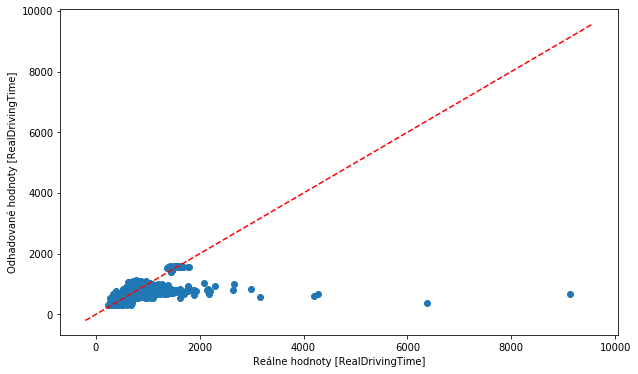

Najväčšia chyba:465.7855224609375
Najväčšia chyba v zápornom smere:-8445.2646484375
% približne správnych odhadov: 0.9122943790442036


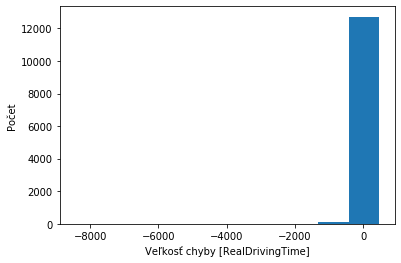

In [173]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime4Noc", noc, test4, "96-64-32-32")

Veľkosť trénovacej množniy: (51306, 11)
Veľkosť testovacej množniy: (12827, 11)

....................
....................
....................
....................
............

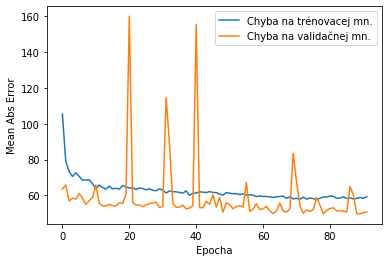

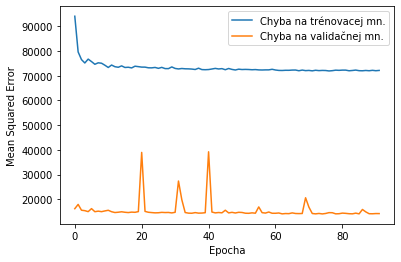

Testing set Mean Abs Error: 53.55 RealDrivingTime 
Testing set Mean Sqrt Error: 21497.13 RealDrivingTime 
Testing set Root Mean Sqrt Error: 146.62 RealDrivingTime 


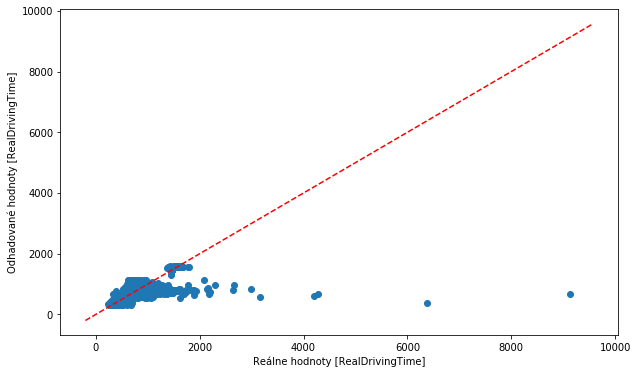

Najväčšia chyba:517.0548095703125
Najväčšia chyba v zápornom smere:-8460.1572265625
% približne správnych odhadov: 0.9003664145942153


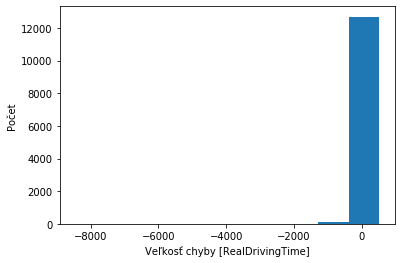

In [174]:
CreateAndFitModelDATA(0.001, "SKFILTER1DayTime6Noc", noc, test4, "96-64-64-32-32-32")

# /////////////////////////////////////////////////////

## Výsledky

### BASE 

### FILTER1


# TEST 5 - pridanie lokality odkial a kam vlak smeruje
Chcem týmto donútiť model sa pretrénovať na trénvacích dátach, keďže vlaky často jazdia tú istú trasu a na danej trase sa často správajú podľa nejakého vzoru

In [550]:
test5 = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'Speed',
        'SectIdx', 'PredLength','PredDelay', 'DelayDeparture',
        'RealDrivingTime']
test5BASEOneHot = test5.copy()
test5FILTER1OneHot = test5.copy()

In [ ]:
paryDFBASE = DFBASE[['FromName','ToName']].drop_duplicates()
display(pary)

In [539]:
paryDFFILTER = DFFILTER1[['FromName','ToName']].drop_duplicates()
display(pary)

,FromName,ToName
1,Odb Skalka,Hranice mìsto
2,Ostrava-Svinov,Polanka n. O.
3,Polanka n. O.,Jistebník
4,Jistebník,Studénka
5,Studénka,Suchdol nad Odr.
...,...,...
2694096,Ostrava-Svinov,Jistebník
2901033,Výh Dluhonice,Odb Skalka
2992902,Ostrava-Svinov,Ostrava-Svinov
3007580,Studénka,Prosenice


In [542]:
lokalityDFFILTER = {}

for FromName, ToName in paryDFFILTER.values:
    subset = DFFILTER1[((DFFILTER1['FromName'] == FromName) & (DFFILTER1['ToName'] == ToName))]
    lokalityDFFILTER[FromName + " " + ToName] = subset

In [ ]:
lokalityDFBASE = {}

for FromName, ToName in paryDFBASE.values:
    subset = DFFILTER1[((DFFILTER1['FromName'] == FromName) & (DFFILTER1['ToName'] == ToName))]
    lokalityDFBASE[FromName + " " + ToName] = subset

## Vidím, že mnoho trás je iba vo veľmi malej miere reprezentovaných jazdami, preto sa na tieto trasy nezameriam

In [543]:
for key,item in lokalityDFFILTER.items():
    print(key)
    print(len(item))

Odb Skalka Hranice mìsto
30648
Ostrava-Svinov Polanka n. O.
124820
Polanka n. O. Jistebník
132538
Jistebník Studénka
132580
Studénka Suchdol nad Odr.
107516
Suchdol nad Odr. Polom
117902
Polom Hranice na Mor.
117814
Hranice na Mor. Drahotue
136994
Drahotue Lipník nad Beèv.
136631
Lipník nad Beèv. Prosenice
137526
Prosenice Pøerov os.n.
76414
Výh Dluhonice Prosenice
55980
Prosenice Lipník nad Beèv.
127844
Lipník nad Beèv. Drahotue
126948
Drahotue Hranice na Mor.
127334
Hranice na Mor. Polom
110145
Polom Suchdol nad Odr.
110250
Suchdol nad Odr. Studénka
111406
Studénka Jistebník
124786
Jistebník Polanka n. O.
124731
Polanka n. O. Ostrava-Svinov
119379
Prosenice Výh Dluhonice
61645
Sedl.-Bartoovice Studénka
26337
Hranice na Mor. Odb Skalka
32320
Pøerov os.n. Prosenice
72505
Hranice mìsto Odb Skalka
32450
Odb Skalka Hranice na Mor.
34167
Studénka Sedl.-Bartoovice
27273
Ostrava-Vítkovice Odb.Odra
50823
Odb.Odra Ostrava-Svinov
39245
Odb.Odra Polanka n. O.
11586
Ostrava-Svinov Odb.Odra


In [ ]:
for key,item in lokalityDFBASE.items():
    print(key)
    print(len(item))

In [545]:
lokKop = lokalityDFFILTER.copy()
for key,item in lokKop.items():
    if len(item) < 10:
        del lokalityDFFILTER[key]
        
del lokKop

In [ ]:
lokKop = lokalityDFBASE.copy()
for key,item in lokKop.items():
    if len(item) < 10:
        del lokalityDFBASE[key]
        
del lokKop

In [ ]:
len(lokalityDFFILTER)

In [ ]:
len(lokalityDFBASE)

In [350]:
# BASE
type = DFBASE['FromName']
for zastavka in DFBASE.FromName.unique():
    test5BASEOneHot.append("From" + zastavka)
    DFBASE["From" + zastavka] = (type == zastavka)*1.0
type = DFBASE['ToName']
for zastavka in DFBASE.ToName.unique():
    test5BASEOneHot.append("To" + zastavka)
    DFBASE["To" + zastavka] = (type == zastavka)*1.0
    
test5BASEOneHot.append("RealDrivingTime")

# FILTER1
type = DFFILTER1['FromName']
for zastavka in DFFILTER1.FromName.unique():
    test5FILTER1OneHot.append("From" + zastavka)
    DFFILTER1["From" + zastavka] = (type == zastavka)*1.0
type = DFFILTER1['ToName']
for zastavka in DFFILTER1.ToName.unique():
    test5FILTER1OneHot.append("To" + zastavka)
    DFFILTER1["To" + zastavka] = (type == zastavka)*1.0
    
test5FILTER1OneHot.append("RealDrivingTime")

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## BASE Locations OneHot

In [ ]:
CreateAndFitModelLocations("BASE", 0.001, 120, "SKBASELocations2OneHot", test5BASEOneHot,"64-64") 

In [ ]:
CreateAndFitModelLocations("BASE", 0.001, 120, "SKBASELocations3OneHot", test5BASEOneHot,"128-64-64") 

In [ ]:
CreateAndFitModelLocations("BASE", 0.001, 120, "SKBASELocations4OneHot", test5BASEOneHot,"96-64-32-32") 

In [ ]:
CreateAndFitModelLocations("BASE", 0.001, 120, "SKBASELocations6OneHot", test5BASEOneHot,"96-64-64-32-32-32") 

## FILTER 1 Locations OneHot

In [ ]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "SKFILTER1Locations2OneHot", test5FILTER1OneHot,"64-64") 

In [ ]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "SKFILTER1Locations3OneHot", test5FILTER1OneHot,"128-64-64") 

In [ ]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "SKFILTER1Locations4OneHot", test5FILTER1OneHot,"96-64-32-32") 

In [ ]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "SKFILTER1Locations6OneHot", test5FILTER1OneHot,"96-64-64-32-32-32") 

## FILTER 1 Locations 1 Trasa

In [ ]:
index = 1
for key,item in lokality.items():
    print("------------------------------- " + str(index) + ". " + key + "------------------------------")
    
    cor = lokality[key][test5].corr()
    plt.title("FILTER1 " + key + " Korelácia")
    sns.heatmap(cor, annot = True, fmt='.1f')    
    plt.show()
    
    CreateAndFitModelDATA(0.001,  "SKFILTER1Locations2_" + str(index), lokality[key], test5, "64-64")
    index = index + 1

In [ ]:
cor = vecer[test4].corr()
plt.title("FILTER1 Večer Korelácia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

In [ ]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelVecer", vecer, test4, "64-64")

Odstránenie všetkých príznakov, ktoré sú príliš málo početné. Keď je príznak málo početný, tak ho nedokážeme normovať.

Keďže nie všetky filtre obsahujú všetky zastávky, tak pre každý filter vytvoríme jeho vlastný zoznam atribútov.
Toto však má ale aj výrazný dopad na to, že jednotlivé filtre môžem porovnávať z hľadiska presnosti iba s rezervou. 
Pretože model dostane aj dáta z iných filtrov, ktoré obsahujú príznaky, na ktorých model netrénoval.

## Vyhodnotenie

### BASE 

#### ------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 44.65 RealDrivingTime [-12,91]
- Testing set Mean Sqrt Error: 249243.69 RealDrivingTime [-141 808‬]
- Testing set Root Mean Sqrt Error: 499.24 RealDrivingTime [-126‬]



### FILTER1

------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 101.38 RealDrivingTime
- Testing set Mean Sqrt Error: 1671351.00 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1292.81 RealDrivingTime

#### ------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 34.43 RealDrivingTime [-1,47]
- Testing set Mean Sqrt Error: 24282.11 RealDrivingTime [-210]
- Testing set Root Mean Sqrt Error: 155.83 RealDrivingTime [-0,67]



Pridanie lokálít výrazne pomohlo presnosti modelu. Priamo zlepšilo všetky sledované metriky a hlavne najdôležitejšiu MSE. Ďalej teda využijem tento filter a pokúsim sa nájsť vhodnú kombináciu parametrov, ktoré ma privedú k čo najpresnejšiemu modelu.

# Kombinácia Filtrov DayTime a Locations 
ich kombináciou budeme dúfať vo vzájomné zlepšienie presnosti

In [356]:
DTLOCBASE = ['Weight', 'PlanDrivingTime', 'Speed', 
             'LengthSect', 'SectIdx', 'DelayDepartureReduced',
             'RealDrivingTime'] 

label = 'RealDrivingTime'
DTLOCFILTER1 = DTLOCBASE.copy()
DTLOCFILTER2 = DTLOCBASE.copy()
DTLOCFILTER3 = DTLOCBASE.copy()

Odstránenie všetkých príznakov, ktoré sú príliš málo početné. Keď je príznak málo početný, tak ho nedokážeme normovať.

Keďže nie všetky filtre obsahujú všetky zastávky, tak pre každý filter vytvoríme jeho vlastný zoznam atribútov.
Toto však má ale aj výrazný dopad na to, že jednotlivé filtre môžem porovnávať z hľadiska presnosti iba s rezervou. 
Pretože model dostane aj dáta z iných filtrov, ktoré obsahujú príznaky, na ktorých model netrénoval.

In [357]:
# BASE
type = DFBASE['FromName']
for zastavka in DFBASE.FromName.unique():
    DTLOCBASE.append("From" + zastavka)
    DFBASE["From" + zastavka] = (type == zastavka)*1.0
type = DFBASE['ToName']
for zastavka in DFBASE.ToName.unique():
    DTLOCBASE.append("To" + zastavka)
    DFBASE["To" + zastavka] = (type == zastavka)*1.0
    
DTLOCBASE.append("RealDrivingTime")

# FILTER1
type = DFFILTER1['FromName']
for zastavka in DFFILTER1.FromName.unique():
    DTLOCFILTER1.append("From" + zastavka)
    DFFILTER1["From" + zastavka] = (type == zastavka)*1.0
type = DFFILTER1['ToName']
for zastavka in DFFILTER1.ToName.unique():
    DTLOCFILTER1.append("To" + zastavka)
    DFFILTER1["To" + zastavka] = (type == zastavka)*1.0
    
DTLOCFILTER1.append("RealDrivingTime")

#FILTER2
type = DFFILTER2['FromName']
for zastavka in DFFILTER2.FromName.unique():
    DTLOCFILTER2.append("From" + zastavka)
    DFFILTER2["From" + zastavka] = (type == zastavka)*1.0
type = DFFILTER2['ToName']
for zastavka in DFFILTER2.ToName.unique():
    DTLOCFILTER2.append("To" + zastavka)
    DFFILTER2["To" + zastavka] = (type == zastavka)*1.0
    
DTLOCFILTER2.append("RealDrivingTime")

# FILTER3
type = DFFILTER3['FromName']
for zastavka in DFFILTER3.FromName.unique():
    DTLOCFILTER3.append("From" + zastavka)
    DFFILTER3["From" + zastavka] = (type == zastavka)*1.0
type = DFFILTER3['ToName']
for zastavka in DFFILTER3.ToName.unique():
    DTLOCFILTER3.append("To" + zastavka)
    DFFILTER3["To" + zastavka] = (type == zastavka)*1.0
    
DTLOCFILTER3.append("RealDrivingTime")

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [358]:
type = DFBASE['DayTime']
for daytime in daytime_types:
    DFBASE[daytime] = (type == daytime)*1.0
    
type = DFFILTER1['DayTime']
for daytime in daytime_types:
    DFFILTER1[daytime] = (type == daytime)*1.0
    
type = DFFILTER2['DayTime']
for daytime in daytime_types:
    DFFILTER2[daytime] = (type == daytime)*1.0
    
type = DFFILTER3['DayTime']
for daytime in daytime_types:
    DFFILTER3[daytime] = (type == daytime)*1.0

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


###  DTLOC BASE 64-64

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (2485460, 56)
Veľkosť testovacej množniy: (621365, 56)

....................
....................
....................
....

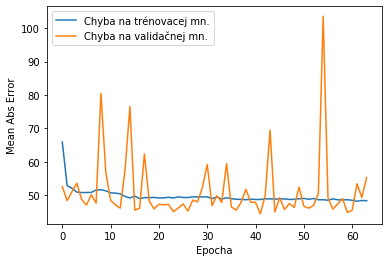

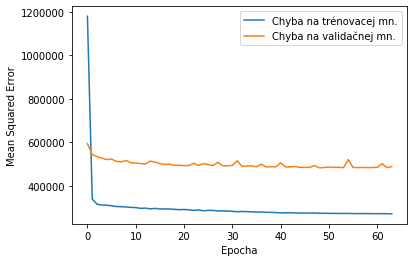

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 45.72 RealDrivingTime 
Testing set Mean Sqrt Error: 249900.08 RealDrivingTime 
Testing set Root Mean Sqrt Error: 499.90 RealDrivingTime 


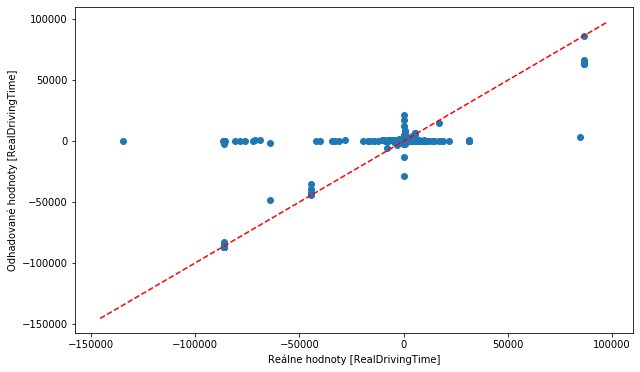

Najväčšia chyba:134402.84375
Najväčšia chyba v zápornom smere:-81543.7890625
% približne správnych odhadov: 0.9446396240534951


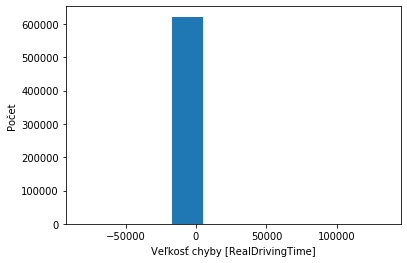

In [202]:
CreateAndFitModelLocations("BASE", 0.001, 120, "NewBASEModelDTLOC", DTLOCBASE,"64-64") 

###  DTLOC BASE 128-64-64

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (2485460, 56)
Veľkosť testovacej množniy: (621365, 56)

....................
...............

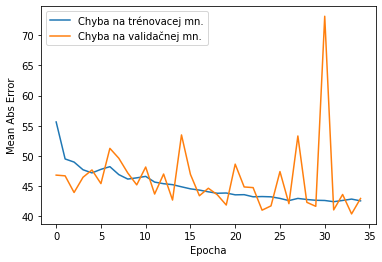

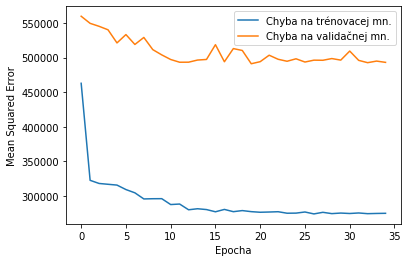

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 41.08 RealDrivingTime 
Testing set Mean Sqrt Error: 253261.05 RealDrivingTime 
Testing set Root Mean Sqrt Error: 503.25 RealDrivingTime 


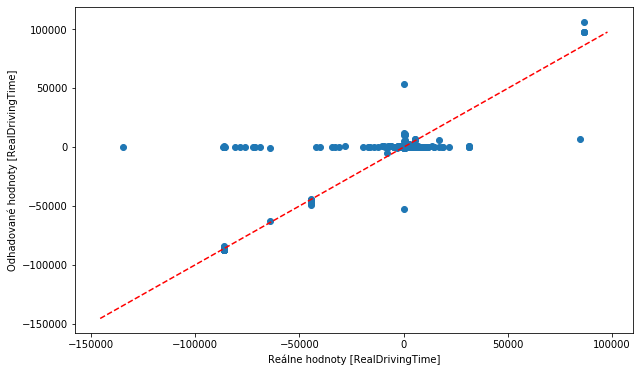

Najväčšia chyba:134804.171875
Najväčšia chyba v zápornom smere:-77971.2734375
% približne správnych odhadov: 0.9549556218969527


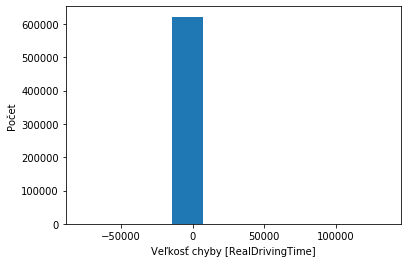

In [359]:
CreateAndFitModelLocations("BASE", 0.001, 120, "New3BASEModelDTLOC", DTLOCBASE,"128-64-64") 

###  DTLOC FILTER1 96-64-64-32-32-32
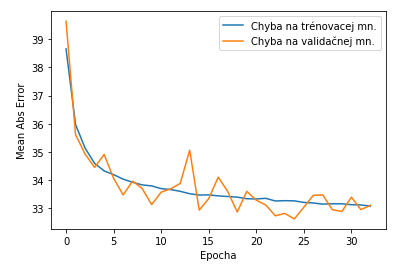
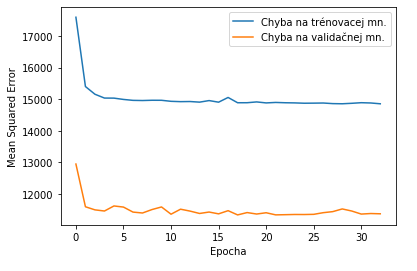

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 55)
Veľkosť testovacej množniy: (518160, 55)

....................
.............

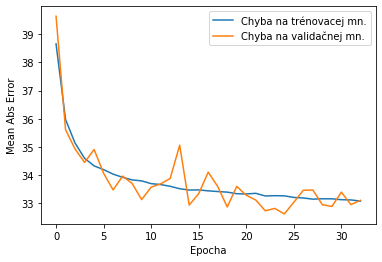

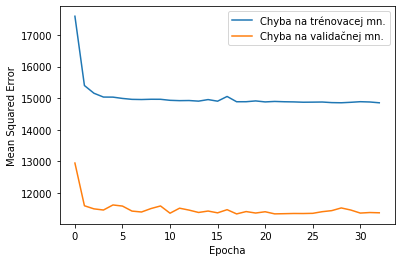

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 33.11 RealDrivingTime 
Testing set Mean Sqrt Error: 6992.60 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.62 RealDrivingTime 


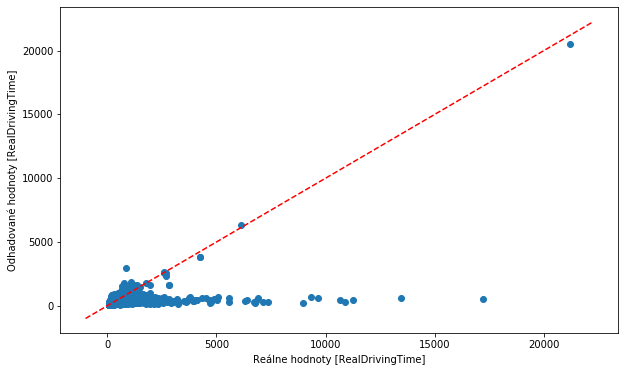

Najväčšia chyba:2134.34033203125
Najväčšia chyba v zápornom smere:-16659.55859375
% približne správnych odhadov: 0.9612224023467655


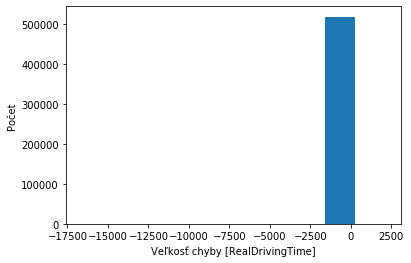

In [298]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "New6FILTER1ModelDTLOC", DTLOCFILTER1,"96-64-64-32-32-32") 

###  DTLOC FILTER1 96-64-32-32
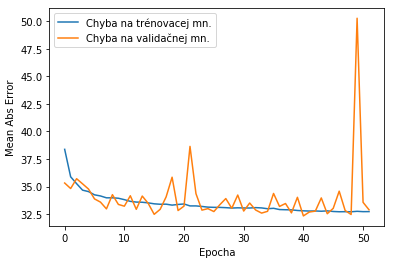
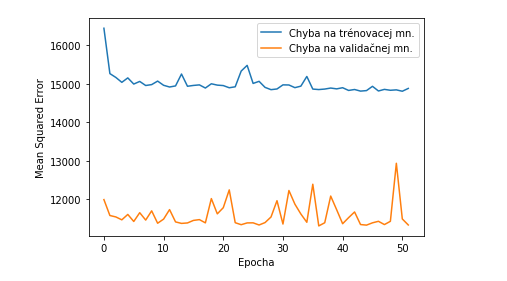


-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 55)
Veľkosť testovacej množniy: (518160, 55)

....................
....................
............

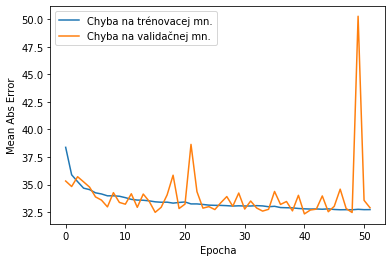

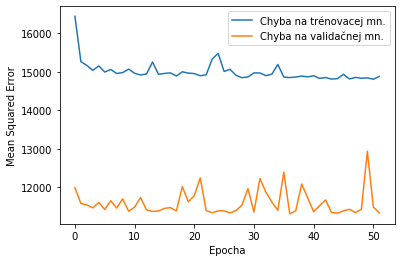

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.69 RealDrivingTime 
Testing set Mean Sqrt Error: 6951.31 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.37 RealDrivingTime 


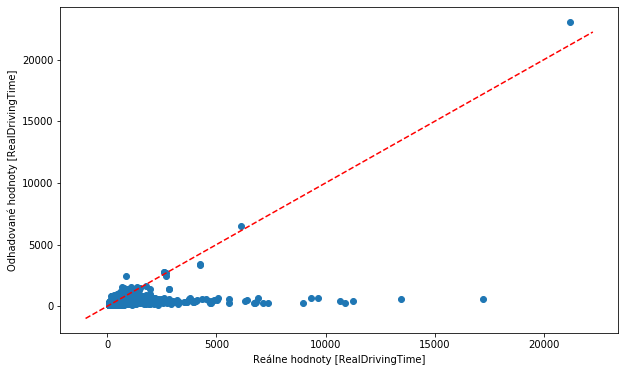

Najväčšia chyba:1871.517578125
Najväčšia chyba v zápornom smere:-16644.712890625
% približne správnych odhadov: 0.9618554114559209


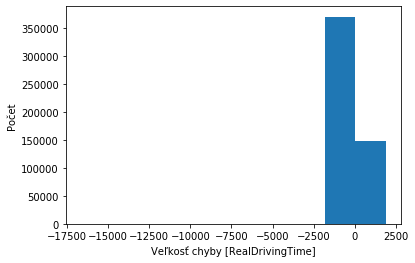

In [299]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "New4FILTER1ModelDTLOC", DTLOCFILTER1,"96-64-32-32") 

###  DTLOC FILTER1 128-64-64
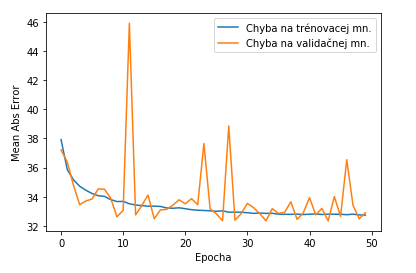
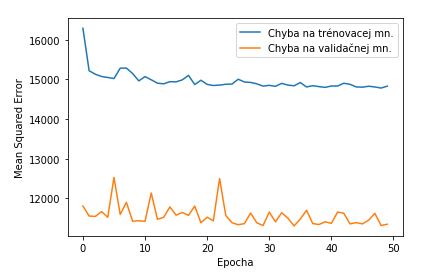

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 55)
Veľkosť testovacej množniy: (518160, 55)

....................
....................
..........

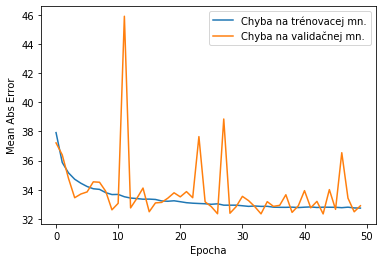

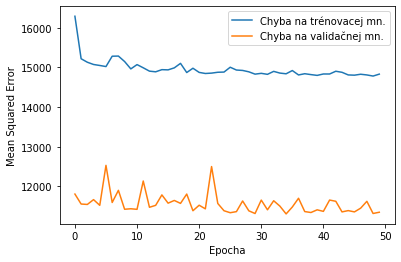

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.67 RealDrivingTime 
Testing set Mean Sqrt Error: 6946.11 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.34 RealDrivingTime 


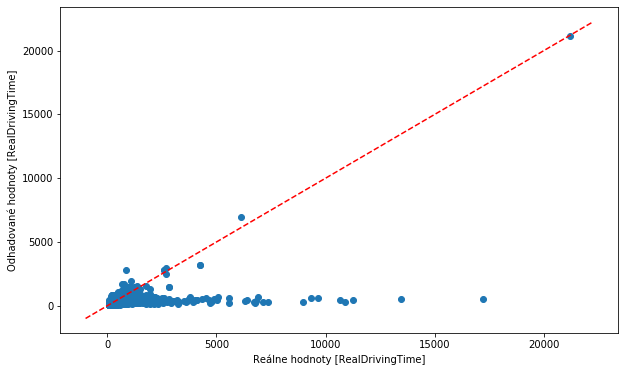

Najväčšia chyba:1951.442138671875
Najväčšia chyba v zápornom smere:-16671.46875
% približne správnych odhadov: 0.9625173691523854


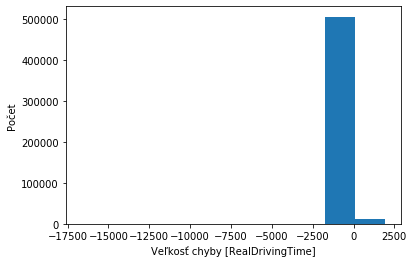

In [300]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "New3FILTER1ModelDTLOC", DTLOCFILTER1,"128-64-64") 

###  DTLOC FILTER1 64-64

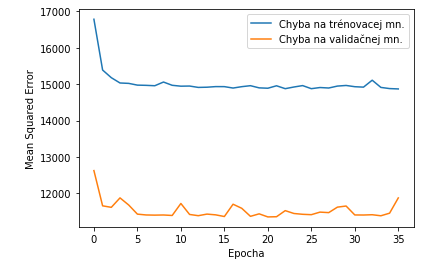
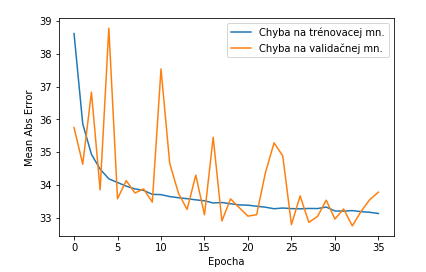

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 55)
Veľkosť testovacej množniy: (518160, 55)

....................
................

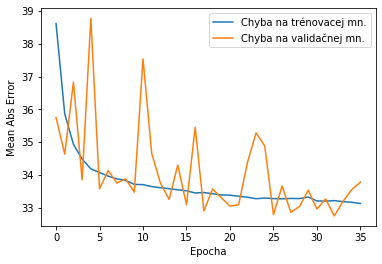

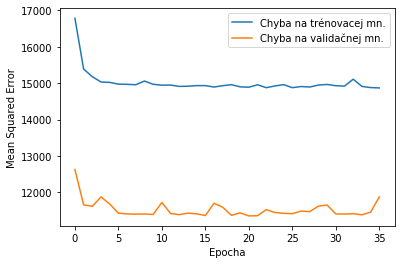

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.55 RealDrivingTime 
Testing set Mean Sqrt Error: 6983.62 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.57 RealDrivingTime 


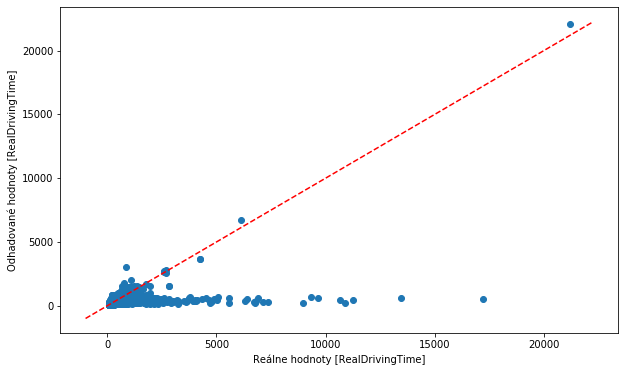

Najväčšia chyba:2199.0458984375
Najväčšia chyba v zápornom smere:-16677.185546875
% približne správnych odhadov: 0.9614327620812104


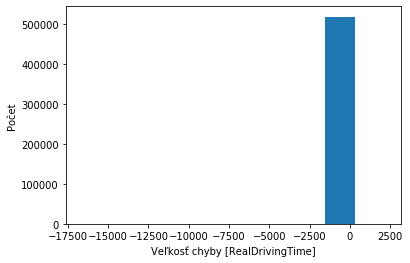

In [203]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "NewFILTER1ModelDTLOC", DTLOCFILTER1,"64-64") 

-----------------------------FILTER2---------------------------------
Veľkosť trénovacej množniy: (2072574, 55)
Veľkosť testovacej množniy: (518143, 55)

....................
....................
....................
....................
...........

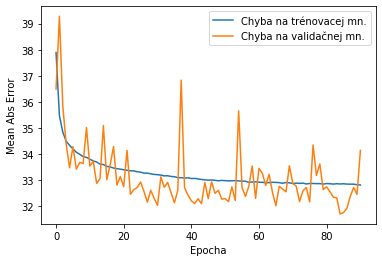

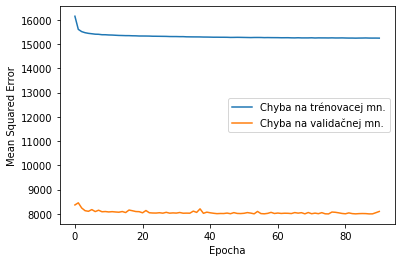

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.76 RealDrivingTime 
Testing set Mean Sqrt Error: 7225.30 RealDrivingTime 
Testing set Root Mean Sqrt Error: 85.00 RealDrivingTime 


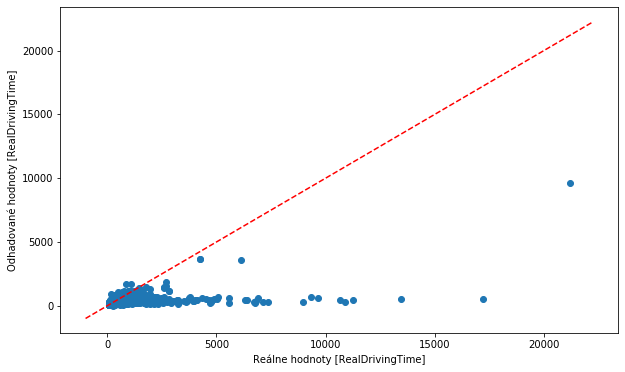

Najväčšia chyba:848.36669921875
Najväčšia chyba v zápornom smere:-16653.45703125
% približne správnych odhadov: 0.962227883279296


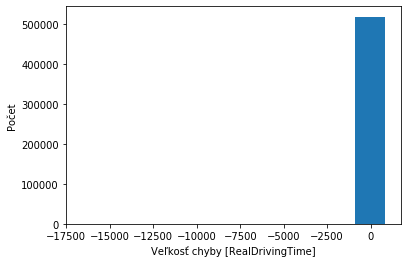

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 32.48 RealDrivingTime 
Testing set Mean Sqrt Error: 8799.91 RealDrivingTime 
Testing set Root Mean Sqrt Error: 93.81 RealDrivingTime 


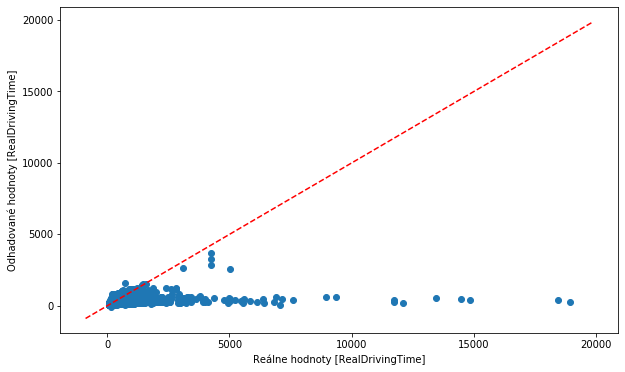

Najväčšia chyba:827.548583984375
Najväčšia chyba v zápornom smere:-18630.41796875
% približne správnych odhadov: 0.9614990456302603


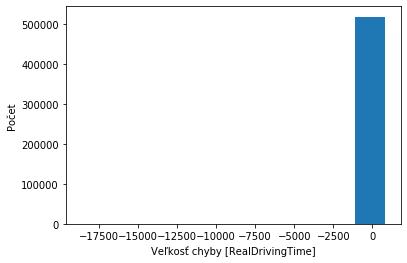

In [204]:
CreateAndFitModelLocations("FILTER2", 0.001, 120, "NewFILTER2ModelDTLOC", DTLOCFILTER2,"64-64") 

-----------------------------FILTER2---------------------------------
Veľkosť trénovacej množniy: (2072574, 55)
Veľkosť testovacej množniy: (518143, 55)

....................
....................
....................
...................

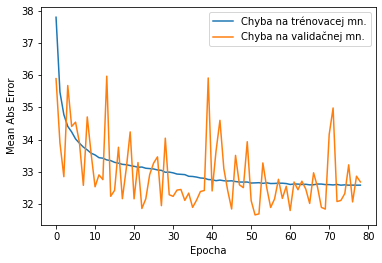

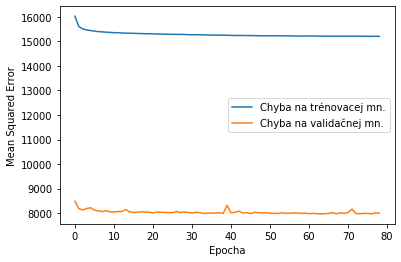

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 149.51 RealDrivingTime 
Testing set Mean Sqrt Error: 1614550.38 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1270.65 RealDrivingTime 


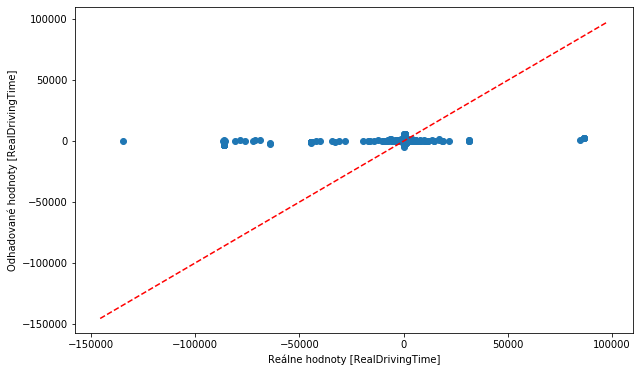

Najväčšia chyba:134776.203125
Najväčšia chyba v zápornom smere:-84496.046875
% približne správnych odhadov: 0.6826857000313825


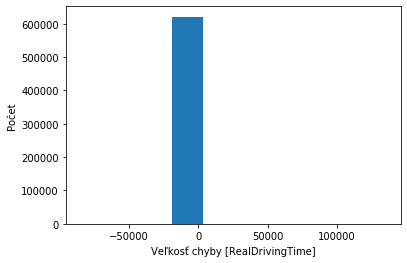

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 33.30 RealDrivingTime 
Testing set Mean Sqrt Error: 7403.52 RealDrivingTime 
Testing set Root Mean Sqrt Error: 86.04 RealDrivingTime 


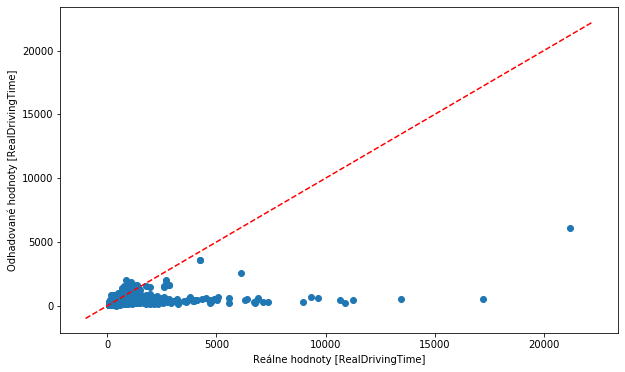

Najväčšia chyba:1132.8072509765625
Najväčšia chyba v zápornom smere:-16656.33984375
% približne správnych odhadov: 0.962891770881581


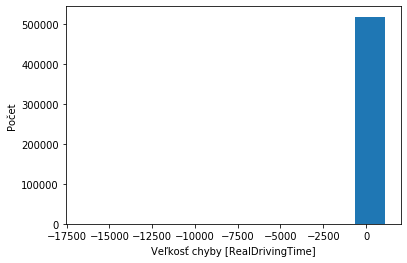

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 33.01 RealDrivingTime 
Testing set Mean Sqrt Error: 8768.80 RealDrivingTime 
Testing set Root Mean Sqrt Error: 93.64 RealDrivingTime 


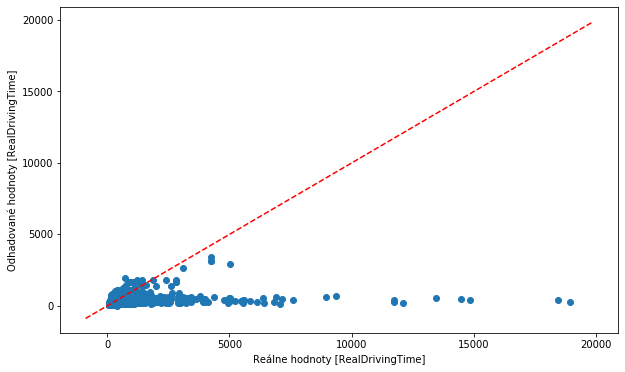

Najväčšia chyba:1191.228759765625
Najväčšia chyba v zápornom smere:-18637.451171875
% približne správnych odhadov: 0.9620954060944565


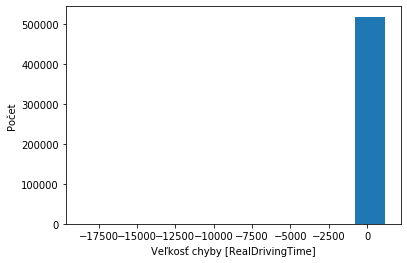

In [360]:
CreateAndFitModelLocations("FILTER2", 0.001, 120, "New3FILTER2ModelDTLOC", DTLOCFILTER2,"128-64-64") 

-----------------------------FILTER3---------------------------------
Veľkosť trénovacej množniy: (1940374, 52)
Veľkosť testovacej množniy: (485094, 52)

....................
....................
....................
.......

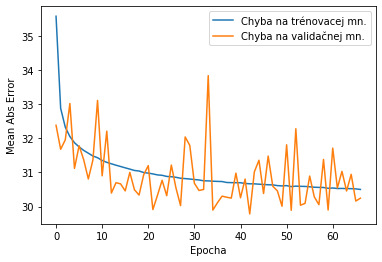

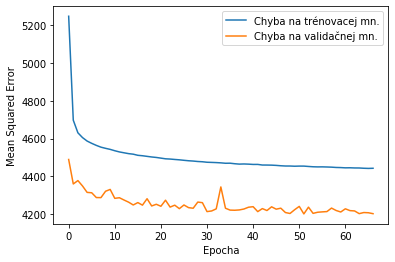

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 45.00 RealDrivingTime 
Testing set Mean Sqrt Error: 14222.39 RealDrivingTime 
Testing set Root Mean Sqrt Error: 119.26 RealDrivingTime 


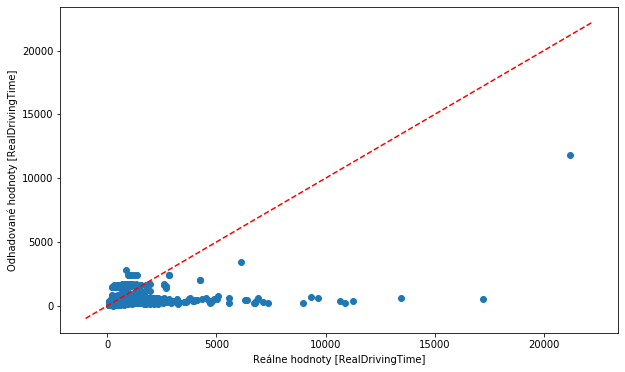

Najväčšia chyba:1937.12841796875
Najväčšia chyba v zápornom smere:-16664.5078125
% približne správnych odhadov: 0.9379207194688899


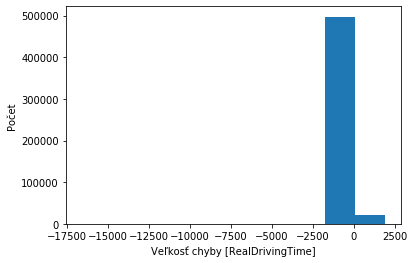

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 44.94 RealDrivingTime 
Testing set Mean Sqrt Error: 15891.52 RealDrivingTime 
Testing set Root Mean Sqrt Error: 126.06 RealDrivingTime 


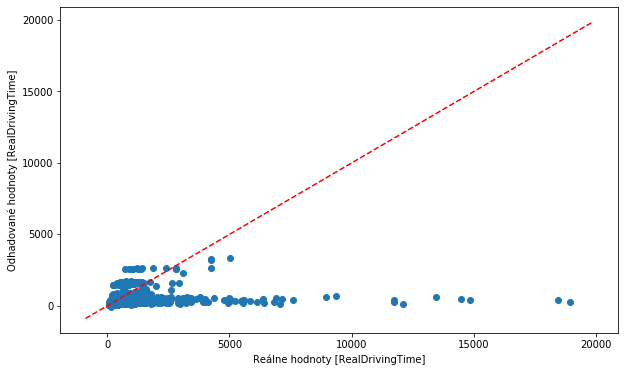

Najväčšia chyba:1841.59033203125
Najväčšia chyba v zápornom smere:-18655.388671875
% približne správnych odhadov: 0.9412845488600637


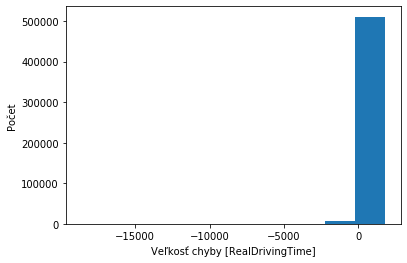

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 29.98 RealDrivingTime 
Testing set Mean Sqrt Error: 4333.32 RealDrivingTime 
Testing set Root Mean Sqrt Error: 65.83 RealDrivingTime 


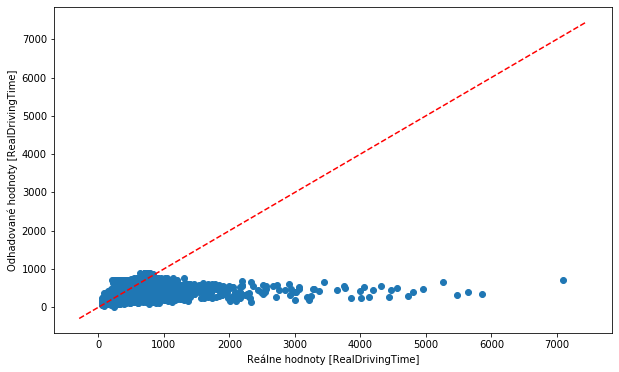

Najväčšia chyba:489.65069580078125
Najväčšia chyba v zápornom smere:-6394.90234375
% približne správnych odhadov: 0.966711606410304


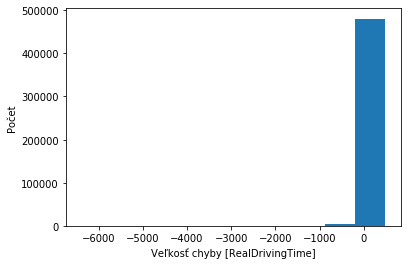

In [205]:
CreateAndFitModelLocations("FILTER3", 0.001, 120, "NewFILTER3ModelDTLOC", DTLOCFILTER3,"64-64") 

In [361]:
CreateAndFitModelLocations("FILTER3", 0.001, 120, "New3FILTER3ModelDTLOC", DTLOCFILTER3,"128-64-64") 

-----------------------------FILTER3---------------------------------
Veľkosť trénovacej množniy: (1940374, 52)
Veľkosť testovacej množniy: (485094, 52)

....................
....................
.

KeyboardInterrupt: 

## Vyhodnotenie - Kombinácia Locations a DayTime

Vidím, že táto kombinácia nepriniesla dodatočnú presnosť ktorú model potrebuje.

### BASE 

#### ------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 47.24 RealDrivingTime [2,59‬]
- Testing set Mean Sqrt Error: 255245.27 RealDrivingTime [6 002‬]
- Testing set Root Mean Sqrt Error: 505.22 RealDrivingTime [6]

### FILTER1

------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 99.45 RealDrivingTime
- Testing set Mean Sqrt Error: 1651114.62 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1284.96 RealDrivingTime

#### ------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 33.69 RealDrivingTime [-0,74]
- Testing set Mean Sqrt Error: 24330.54 RealDrivingTime [+48]
- Testing set Root Mean Sqrt Error: 155.98 RealDrivingTime [+0,15]

### FILTER2

------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 99.39 RealDrivingTime
- Testing set Mean Sqrt Error: 1663787.25 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1289.88 RealDrivingTime

------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 35.37 RealDrivingTime
- Testing set Mean Sqrt Error: 24359.82 RealDrivingTime
- Testing set Root Mean Sqrt Error: 156.08 RealDrivingTime

#### ------Presnosť na FILTER2 dátach-------- 
- Testing set Mean Abs Error: 34.47 RealDrivingTime [+0,78]
- Testing set Mean Sqrt Error: 24715.10 RealDrivingTime [-21]
- Testing set Root Mean Sqrt Error: 157.21 RealDrivingTime [-0,07]

### FILTER3

------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 104.16 RealDrivingTime
- Testing set Mean Sqrt Error: 1610430.62 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1269.03 RealDrivingTime

------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 55.42 RealDrivingTime
- Testing set Mean Sqrt Error: 48186.06 RealDrivingTime
- Testing set Root Mean Sqrt Error: 219.51 RealDrivingTime

------Presnosť na FILTER2 dátach-------- 
- Testing set Mean Abs Error: 55.06 RealDrivingTime
- Testing set Mean Sqrt Error: 42565.75 RealDrivingTime
- Testing set Root Mean Sqrt Error: 206.31 RealDrivingTime

#### ------Presnosť na FILTER3 dátach-------- 
- Testing set Mean Abs Error: 30.79 RealDrivingTime [-0,53‬]
- Testing set Mean Sqrt Error: 4190.26 RealDrivingTime [-68‬]
- Testing set Root Mean Sqrt Error: 64.73 RealDrivingTime [-0,53]



# Kombinácia Locations a Seasons

In [ ]:
SELOCBASE = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed',
             'LengthSect', 'SectIdx', 'DelayDepartureReduced',
            'Jar','Leto','Jesen','Zima'] 

label = 'RealDrivingTime'

SELOCFILTER1 = SELOCBASE.copy()
SELOCFILTER2 = SELOCBASE.copy()
SELOCFILTER3 = SELOCBASE.copy()

Odstránenie všetkých príznakov, ktoré sú príliš málo početné. Keď je príznak málo početný, tak ho nedokážeme normovať.

Keďže nie všetky filtre obsahujú všetky zastávky, tak pre každý filter vytvoríme jeho vlastný zoznam atribútov.
Toto však má ale aj výrazný dopad na to, že jednotlivé filtre môžem porovnávať z hľadiska presnosti iba s rezervou. 
Pretože model dostane aj dáta z iných filtrov, ktoré obsahujú príznaky, na ktorých model netrénoval.

In [ ]:
# BASE
type = DFBASE['FromName']
for zastavka in DFBASE.FromName.unique():
    SELOCBASE.append("From" + zastavka)
    DFBASE["From" + zastavka] = (type == zastavka)*1.0
type = DFBASE['ToName']
for zastavka in DFBASE.ToName.unique():
    SELOCBASE.append("To" + zastavka)
    DFBASE["To" + zastavka] = (type == zastavka)*1.0
    
SELOCBASE.append("RealDrivingTime")

# FILTER1
type = DFFILTER1['FromName']
for zastavka in DFFILTER1.FromName.unique():
    SELOCFILTER1.append("From" + zastavka)
    DFFILTER1["From" + zastavka] = (type == zastavka)*1.0
type = DFFILTER1['ToName']
for zastavka in DFFILTER1.ToName.unique():
    SELOCFILTER1.append("To" + zastavka)
    DFFILTER1["To" + zastavka] = (type == zastavka)*1.0
    
SELOCFILTER1.append("RealDrivingTime")

#FILTER2
type = DFFILTER2['FromName']
for zastavka in DFFILTER2.FromName.unique():
    SELOCFILTER2.append("From" + zastavka)
    DFFILTER2["From" + zastavka] = (type == zastavka)*1.0
type = DFFILTER2['ToName']
for zastavka in DFFILTER2.ToName.unique():
    SELOCFILTER2.append("To" + zastavka)
    DFFILTER2["To" + zastavka] = (type == zastavka)*1.0
    
SELOCFILTER2.append("RealDrivingTime")

# FILTER3
type = DFFILTER3['FromName']
for zastavka in DFFILTER3.FromName.unique():
    SELOCFILTER3.append("From" + zastavka)
    DFFILTER3["From" + zastavka] = (type == zastavka)*1.0
type = DFFILTER3['ToName']
for zastavka in DFFILTER3.ToName.unique():
    SELOCFILTER3.append("To" + zastavka)
    DFFILTER3["To" + zastavka] = (type == zastavka)*1.0
    
SELOCFILTER3.append("RealDrivingTime")

In [ ]:
season = DFBASE['Season']
for seas in season_types:
    DFBASE[seas] = (season == seas)*1.0
    
season = DFFILTER1['Season']
for seas in season_types:
    DFFILTER1[seas] = (season == seas)*1.0
    
season = DFFILTER2['Season']
for seas in season_types:
    DFFILTER2[seas] = (season == seas)*1.0
    
season = DFFILTER3['Season']
for seas in season_types:
    DFFILTER3[seas] = (season == seas)*1.0

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (2485460, 56)
Veľkosť testovacej množniy: (621365, 56)

....................
....................
....................
......

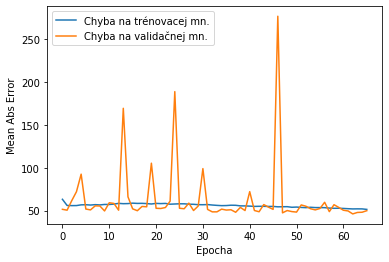

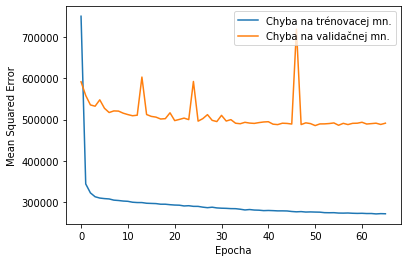

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 47.34 RealDrivingTime 
Testing set Mean Sqrt Error: 250109.02 RealDrivingTime 
Testing set Root Mean Sqrt Error: 500.11 RealDrivingTime 


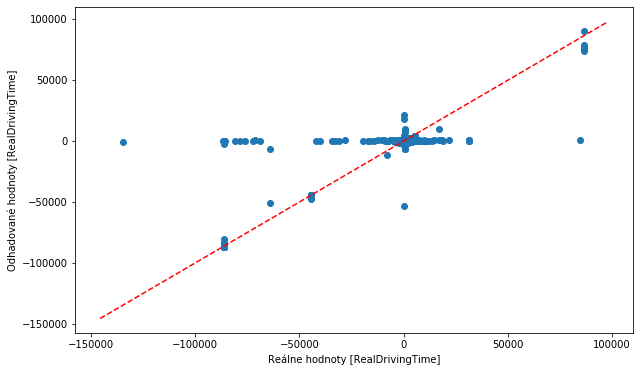

Najväčšia chyba:134077.203125
Najväčšia chyba v zápornom smere:-83709.4140625
% približne správnych odhadov: 0.9389457082391187


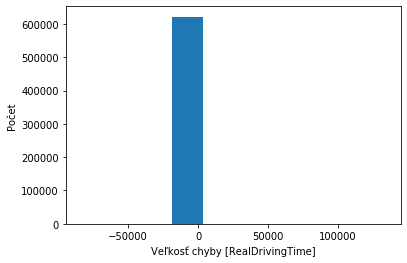

In [210]:
CreateAndFitModelLocations("BASE", 0.001, 120, "NewBASEModelSELOC", SELOCBASE,"64-64") 

In [ ]:
CreateAndFitModelLocations("BASE", 0.001, 120, "New3BASEModelSELOC", SELOCBASE,"128-64-64") 

### SELOC FILTER1 96-64-64-32-32-32
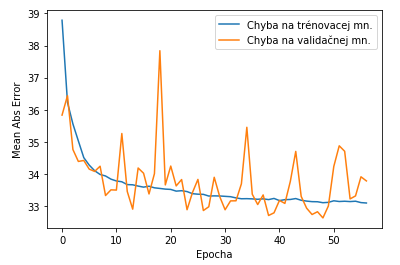
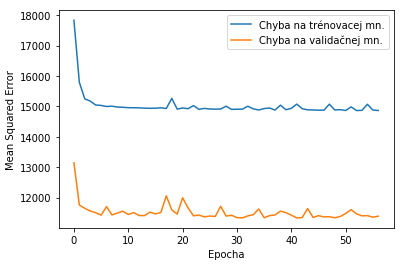


-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 55)
Veľkosť testovacej množniy: (518160, 55)

....................
....................
.................

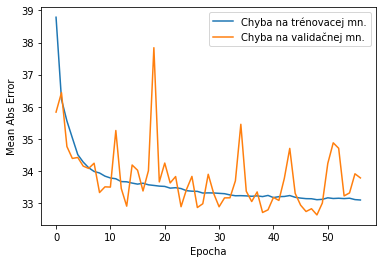

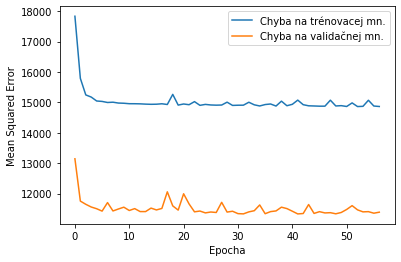

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.64 RealDrivingTime 
Testing set Mean Sqrt Error: 6993.56 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.63 RealDrivingTime 


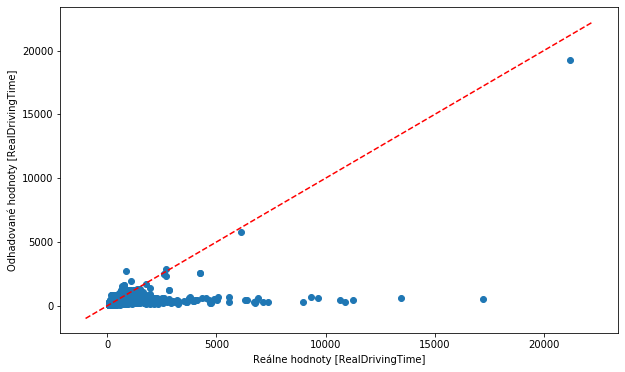

Najväčšia chyba:1883.997314453125
Najväčšia chyba v zápornom smere:-16658.16796875
% približne správnych odhadov: 0.961415392928825


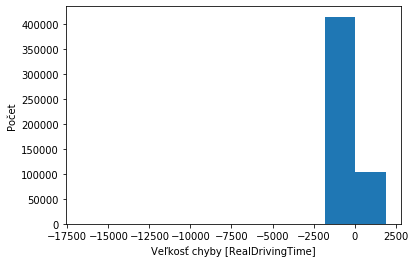

In [301]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "New6FILTER1ModelSELOC", SELOCFILTER1,"96-64-64-32-32-32") 

### SELOC FILTER1 96-64-32-32
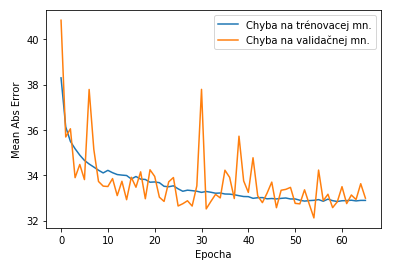
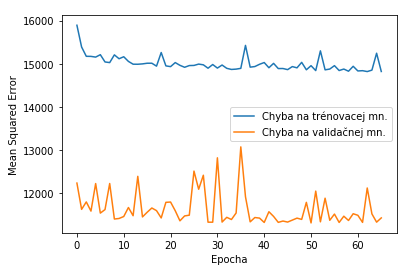


-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 55)
Veľkosť testovacej množniy: (518160, 55)

....................
....................
....................
......

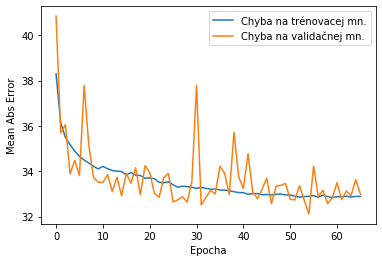

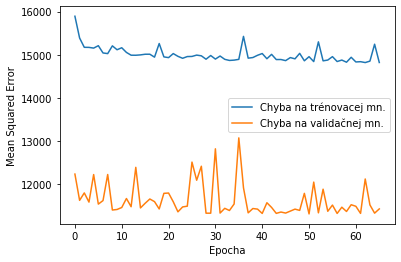

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.28 RealDrivingTime 
Testing set Mean Sqrt Error: 6953.63 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.39 RealDrivingTime 


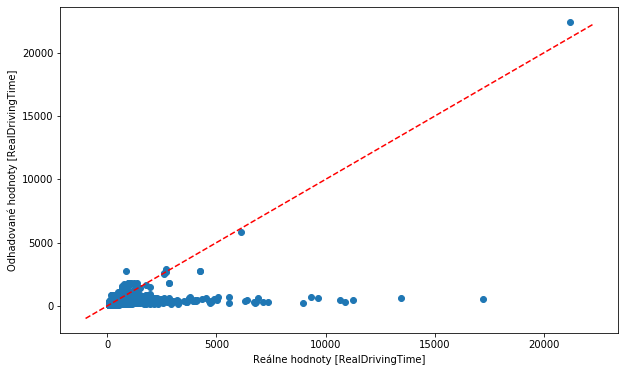

Najväčšia chyba:1908.85693359375
Najväčšia chyba v zápornom smere:-16648.380859375
% približne správnych odhadov: 0.9607186969275899


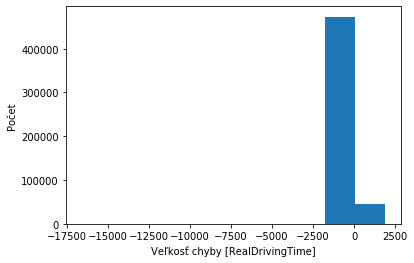

In [302]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "New4FILTER1ModelSELOC", SELOCFILTER1,"96-64-32-32") 

### SELOC FILTER1 128-64-64
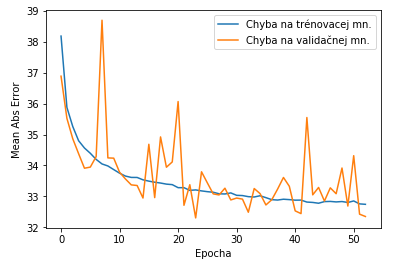
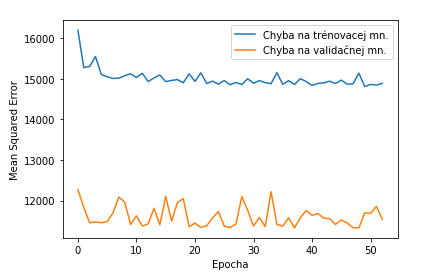


-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 55)
Veľkosť testovacej množniy: (518160, 55)

....................
....................
.............

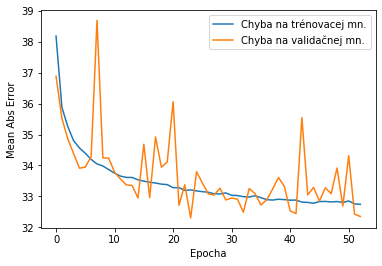

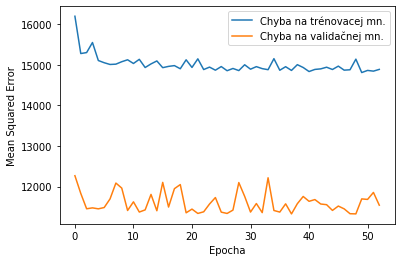

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.75 RealDrivingTime 
Testing set Mean Sqrt Error: 6952.10 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.38 RealDrivingTime 


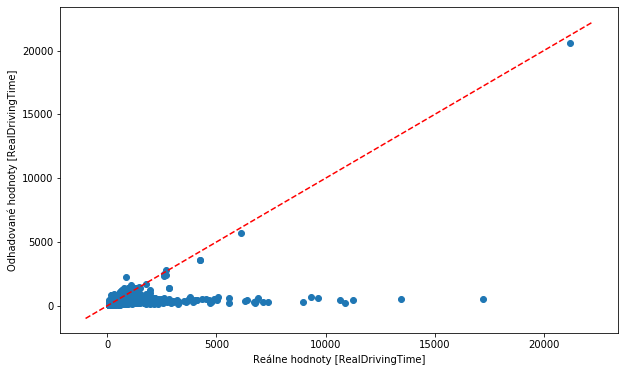

Najväčšia chyba:1395.022705078125
Najväčšia chyba v zápornom smere:-16636.90234375
% približne správnych odhadov: 0.9631503782615408


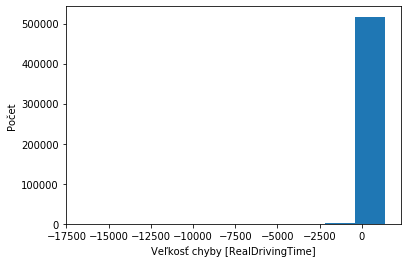

In [303]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "New3FILTER1ModelSELOC", SELOCFILTER1,"128-64-64") 

### SELOC FILTER1 64-64
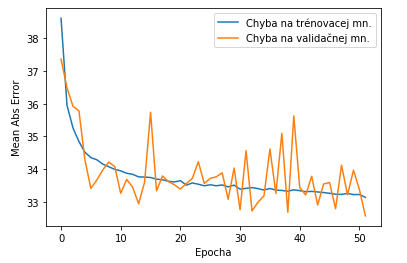
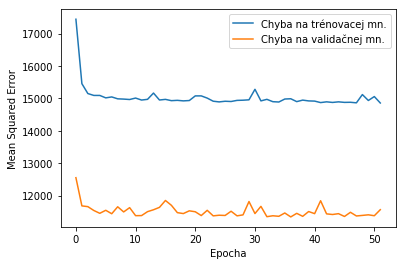

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 55)
Veľkosť testovacej množniy: (518160, 55)

....................
....................
............

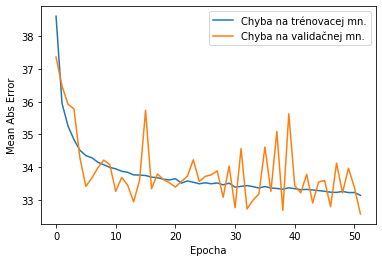

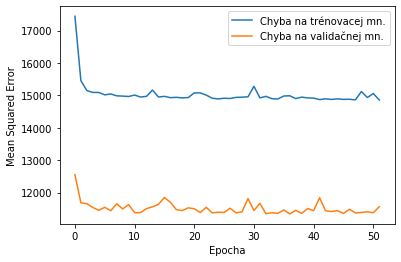

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.77 RealDrivingTime 
Testing set Mean Sqrt Error: 6985.44 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.58 RealDrivingTime 


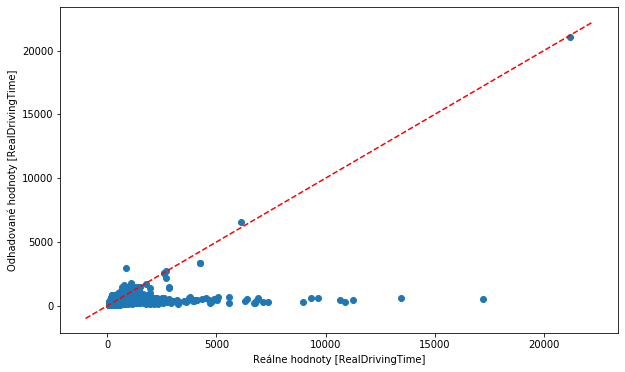

Najväčšia chyba:2077.069580078125
Najväčšia chyba v zápornom smere:-16663.443359375
% približne správnych odhadov: 0.9618090937162267


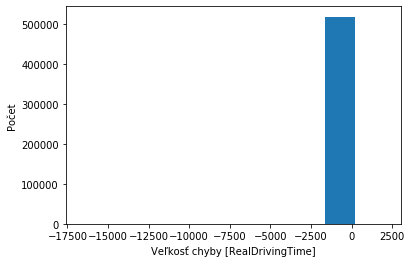

In [211]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "NewFILTER1ModelSELOC", SELOCFILTER1,"64-64") 

-----------------------------FILTER2---------------------------------
Veľkosť trénovacej množniy: (2072574, 55)
Veľkosť testovacej množniy: (518143, 55)

....................
....................
....................
...................

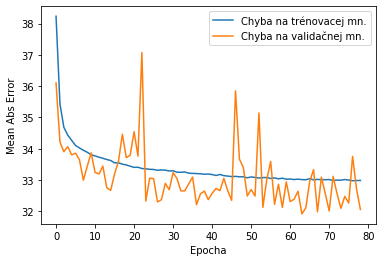

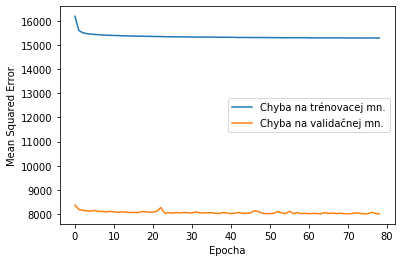

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.87 RealDrivingTime 
Testing set Mean Sqrt Error: 7119.39 RealDrivingTime 
Testing set Root Mean Sqrt Error: 84.38 RealDrivingTime 


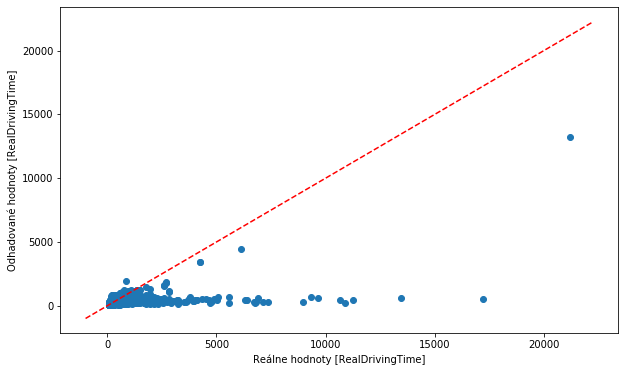

Najväčšia chyba:1060.0311279296875
Najväčšia chyba v zápornom smere:-16662.88671875
% približne správnych odhadov: 0.9618071638104061


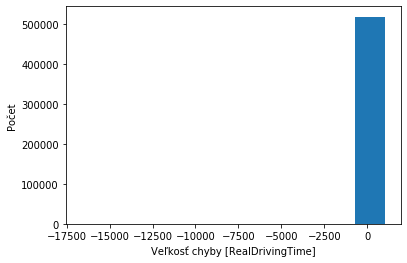

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 32.21 RealDrivingTime 
Testing set Mean Sqrt Error: 8806.75 RealDrivingTime 
Testing set Root Mean Sqrt Error: 93.84 RealDrivingTime 


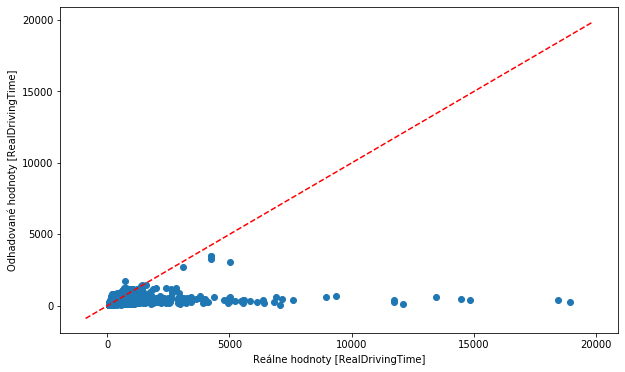

Najväčšia chyba:983.7398681640625
Najväčšia chyba v zápornom smere:-18647.447265625
% približne správnych odhadov: 0.9611111218331619


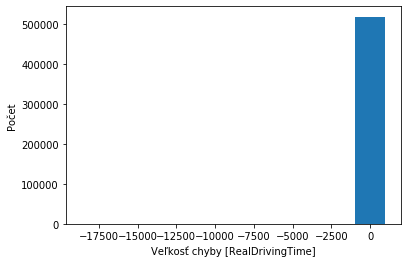

In [212]:
CreateAndFitModelLocations("FILTER2", 0.001, 120, "NewFILTER2ModelSELOC", SELOCFILTER2,"64-64") 

In [ ]:
CreateAndFitModelLocations("FILTER2", 0.001, 120, "New3FILTER2ModelSELOC", SELOCFILTER2,"128-64-64") 

-----------------------------FILTER3---------------------------------
Veľkosť trénovacej množniy: (1940374, 52)
Veľkosť testovacej množniy: (485094, 52)

....................
....................
....................
............

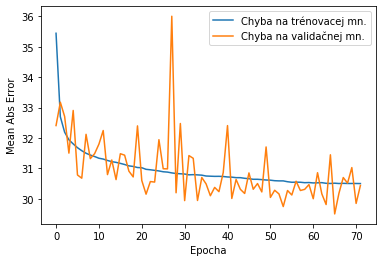

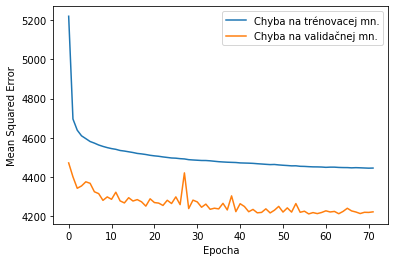

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 42.92 RealDrivingTime 
Testing set Mean Sqrt Error: 11610.52 RealDrivingTime 
Testing set Root Mean Sqrt Error: 107.75 RealDrivingTime 


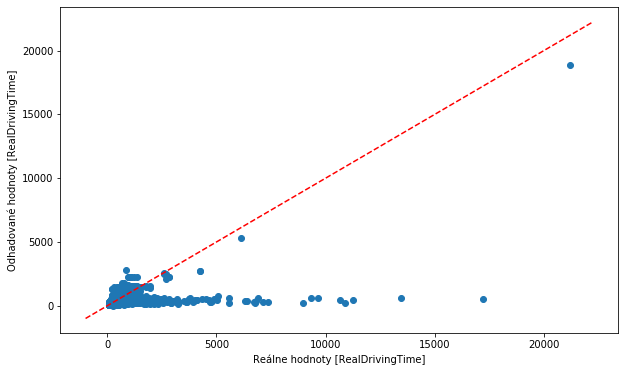

Najväčšia chyba:1966.9052734375
Najväčšia chyba v zápornom smere:-16650.36328125
% približne správnych odhadov: 0.9385324996140189


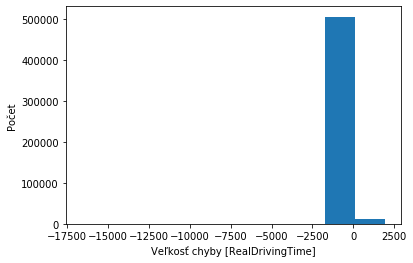

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 42.78 RealDrivingTime 
Testing set Mean Sqrt Error: 13368.21 RealDrivingTime 
Testing set Root Mean Sqrt Error: 115.62 RealDrivingTime 


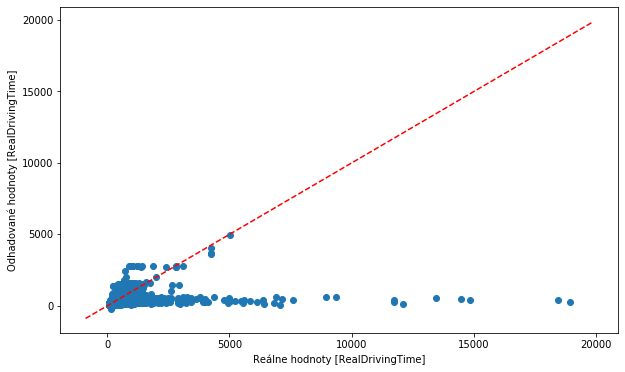

Najväčšia chyba:1871.948974609375
Najväčšia chyba v zápornom smere:-18654.671875
% približne správnych odhadov: 0.9383645055515563


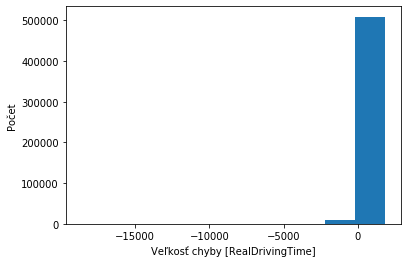

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 30.66 RealDrivingTime 
Testing set Mean Sqrt Error: 4335.43 RealDrivingTime 
Testing set Root Mean Sqrt Error: 65.84 RealDrivingTime 


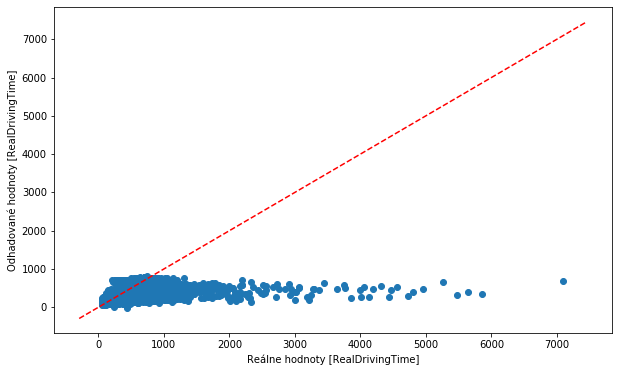

Najväčšia chyba:492.56317138671875
Najväčšia chyba v zápornom smere:-6397.8076171875
% približne správnych odhadov: 0.9672558308286642


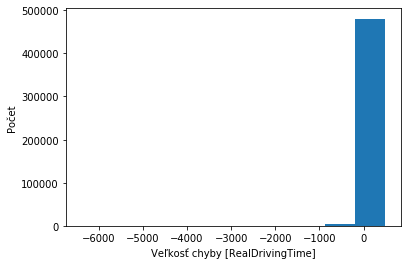

In [213]:
CreateAndFitModelLocations("FILTER3", 0.001, 120, "NewFILTER3ModelSELOC", SELOCFILTER3,"64-64") 

In [ ]:
CreateAndFitModelLocations("FILTER3", 0.001, 120, "New3FILTER3ModelSELOC", SELOCFILTER3,"128-64-64") 

# Vyhodnotenie - Kombinácia Seasons a Locations

### BASE 

#### ------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 47.98 RealDrivingTime
- Testing set Mean Sqrt Error: 247598.25 RealDrivingTime
- Testing set Root Mean Sqrt Error: 497.59 RealDrivingTime

### FILTER1

------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 105.45 RealDrivingTime
- Testing set Mean Sqrt Error: 1576803.12 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1255.71 RealDrivingTime

#### ------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 34.41 RealDrivingTime
- Testing set Mean Sqrt Error: 24325.76 RealDrivingTime
- Testing set Root Mean Sqrt Error: 155.97 RealDrivingTime

### FILTER2

------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 97.86 RealDrivingTime
- Testing set Mean Sqrt Error: 1636531.62 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1279.27 RealDrivingTime

------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 34.92 RealDrivingTime
- Testing set Mean Sqrt Error: 24359.94 RealDrivingTime
- Testing set Root Mean Sqrt Error: 156.08 RealDrivingTime

#### ------Presnosť na FILTER2 dátach-------- 
- Testing set Mean Abs Error: 34.16 RealDrivingTime
- Testing set Mean Sqrt Error: 24720.53 RealDrivingTime
- Testing set Root Mean Sqrt Error: 157.23 RealDrivingTime

### FILTER3

------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 102.00 RealDrivingTime
- Testing set Mean Sqrt Error: 1613984.62 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1270.43 RealDrivingTime

------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 50.83 RealDrivingTime
- Testing set Mean Sqrt Error: 39147.72 RealDrivingTime
- Testing set Root Mean Sqrt Error: 197.86 RealDrivingTime

------Presnosť na FILTER2 dátach-------- 
- Testing set Mean Abs Error: 50.63 RealDrivingTime
- Testing set Mean Sqrt Error: 38768.57 RealDrivingTime
- Testing set Root Mean Sqrt Error: 196.90 RealDrivingTime

#### ------Presnosť na FILTER3 dátach-------- 
- Testing set Mean Abs Error: 30.97 RealDrivingTime
- Testing set Mean Sqrt Error: 4213.16 RealDrivingTime
- Testing set Root Mean Sqrt Error: 64.91 RealDrivingTime

# Kombinácia  TrainTypes  a Locations = TTLOC

In [215]:
TTLOCBASE = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed','LengthSect', 'SectIdx', 'DelayDeparture']

label = 'RealDrivingTime'

TTLOCFILTER1 = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed','LengthSect', 'SectIdx', 'DelayDepartureReduced']
TTLOCFILTER2 = TTLOCFILTER1.copy()
TTLOCFILTER3 = TTLOCFILTER1.copy()

Odstránenie všetkých príznakov, ktoré sú príliš málo početné. Keď je príznak málo početný, tak ho nedokážeme normovať.

Keďže nie všetky filtre obsahujú všetky zastávky, tak pre každý filter vytvoríme jeho vlastný zoznam atribútov.
Toto však má ale aj výrazný dopad na to, že jednotlivé filtre môžem porovnávať z hľadiska presnosti iba s rezervou. 
Pretože model dostane aj dáta z iných filtrov, ktoré obsahujú príznaky, na ktorých model netrénoval.

In [216]:
# BASE
type = DFBASE['FromName']
for zastavka in DFBASE.FromName.unique():
    TTLOCBASE.append("From" + zastavka)
    DFBASE["From" + zastavka] = (type == zastavka)*1.0
    
type = DFBASE['ToName']
for zastavka in DFBASE.ToName.unique():
    TTLOCBASE.append("To" + zastavka)
    DFBASE["To" + zastavka] = (type == zastavka)*1.0
    
type = DFBASE['TrainType']
for typ in DFBASE.TrainType.unique():
    TTLOCBASE.append(typ)
    DFBASE[typ] = (type == typ)*1.0
    


# FILTER1
type = DFFILTER1['FromName']
for zastavka in DFFILTER1.FromName.unique():
    TTLOCFILTER1.append("From" + zastavka)
    DFFILTER1["From" + zastavka] = (type == zastavka)*1.0
    
type = DFFILTER1['ToName']
for zastavka in DFFILTER1.ToName.unique():
    TTLOCFILTER1.append("To" + zastavka)
    DFFILTER1["To" + zastavka] = (type == zastavka)*1.0

type = DFFILTER1['TrainType']
for typ in DFFILTER1.TrainType.unique():
    TTLOCFILTER1.append(typ)
    DFFILTER1[typ] = (type == typ)*1.0
    


#FILTER2
type = DFFILTER2['FromName']
for zastavka in DFFILTER2.FromName.unique():
    TTLOCFILTER2.append("From" + zastavka)
    DFFILTER2["From" + zastavka] = (type == zastavka)*1.0
    
type = DFFILTER2['ToName']
for zastavka in DFFILTER2.ToName.unique():
    TTLOCFILTER2.append("To" + zastavka)
    DFFILTER2["To" + zastavka] = (type == zastavka)*1.0

type = DFFILTER2['TrainType']
for typ in DFFILTER2.TrainType.unique():
    TTLOCFILTER2.append(typ)
    DFFILTER2[typ] = (type == typ)*1.0
    


# FILTER3
type = DFFILTER3['FromName']
for zastavka in DFFILTER3.FromName.unique():
    TTLOCFILTER3.append("From" + zastavka)
    DFFILTER3["From" + zastavka] = (type == zastavka)*1.0
    
type = DFFILTER3['ToName']
for zastavka in DFFILTER3.ToName.unique():
    TTLOCFILTER3.append("To" + zastavka)
    DFFILTER3["To" + zastavka] = (type == zastavka)*1.0
    
type = DFFILTER3['TrainType']
for typ in DFFILTER3.TrainType.unique():
    TTLOCFILTER3.append(typ)
    DFFILTER3[typ] = (type == typ)*1.0
    


D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

In [217]:
TTLOCBASE.append("RealDrivingTime")
TTLOCFILTER1.append("RealDrivingTime")
TTLOCFILTER2.append("RealDrivingTime")
TTLOCFILTER3.append("RealDrivingTime")

-----------------------------BASE---------------------------------
Veľkosť trénovacej množniy: (2485460, 62)
Veľkosť testovacej množniy: (621365, 62)

....................
....................
....................
..................------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 50.55 RealDrivingTime
Testing set Mean Sqrt Error: 245074.62 RealDrivingTime
Testing set Root Mean Sqrt Error: 495.05 RealDrivingTime


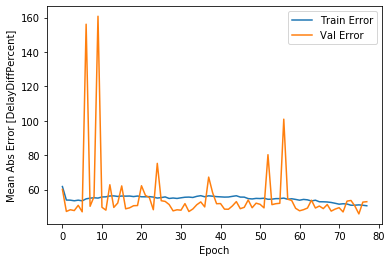

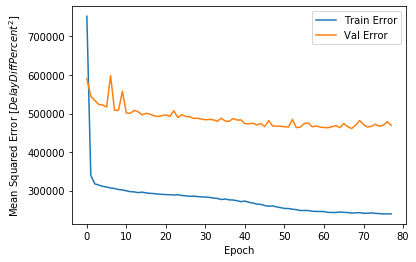

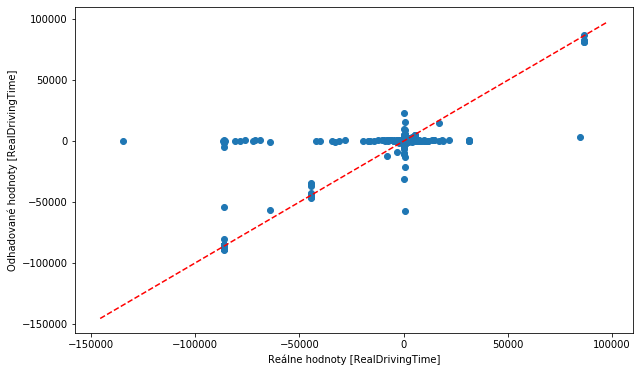

Najväčšia chyba:134731.03125
Najväčšia chyba v zápornom smere:-81490.2265625
% približne správnych odhadov: 0.919795933147184


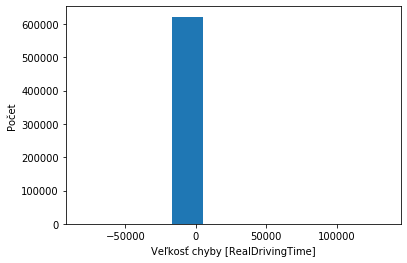

In [85]:
CreateAndFitModelLocations("BASE", 0.001, 120, "NewBASEModelTTLOC", TTLOCBASE,0,"64-64") 

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 62)
Veľkosť testovacej množniy: (518160, 62)

....................
....................
.........

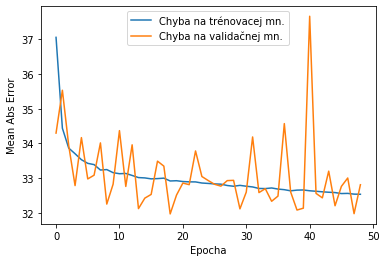

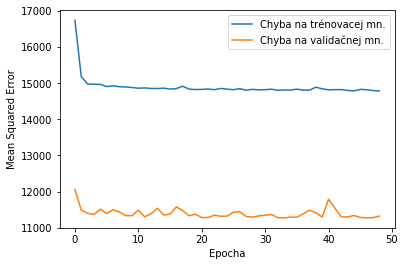

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.18 RealDrivingTime 
Testing set Mean Sqrt Error: 6885.88 RealDrivingTime 
Testing set Root Mean Sqrt Error: 82.98 RealDrivingTime 


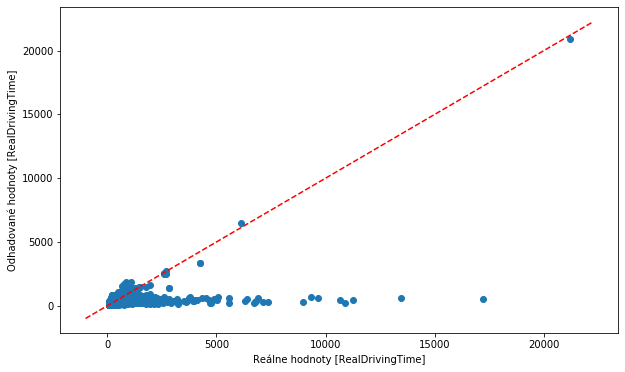

Najväčšia chyba:1027.5599365234375
Najväčšia chyba v zápornom smere:-16654.03515625
% približne správnych odhadov: 0.9630693222170758


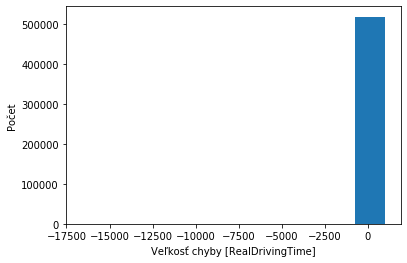

In [222]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "New2layerFILTER1ModelTTLOC", TTLOCFILTER1,1,"64-64") 

Oznacenie malo byt New3FILTER1ModelTTLOC pre 3 vrstvy 128-64-64

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 62)
Veľkosť testovacej množniy: (518160, 62)

....................
....................
....................
.........

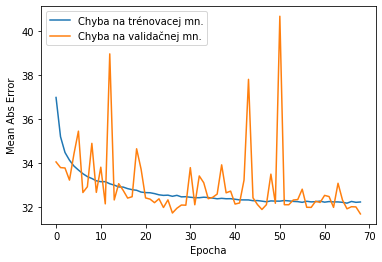

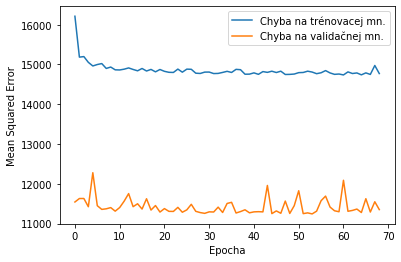

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 31.81 RealDrivingTime 
Testing set Mean Sqrt Error: 6870.15 RealDrivingTime 
Testing set Root Mean Sqrt Error: 82.89 RealDrivingTime 


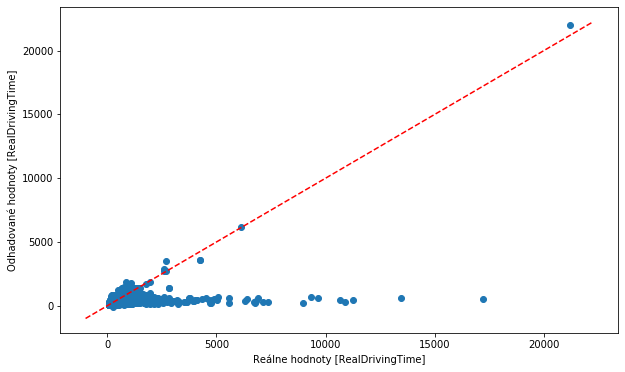

Najväčšia chyba:1007.267578125
Najväčšia chyba v zápornom smere:-16675.40234375
% približne správnych odhadov: 0.962843523236066


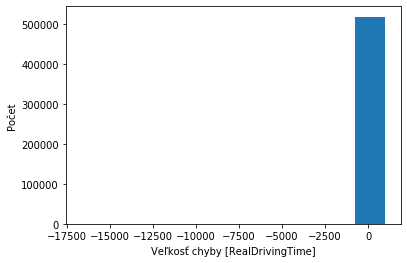

In [218]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "NewFILTER1ModelTTLOC", TTLOCFILTER1,1,"128-64-64") 

zistit ci je chyba 6 vrstiev, alebo naozaj

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 62)
Veľkosť testovacej množniy: (518160, 62)

....................
....................

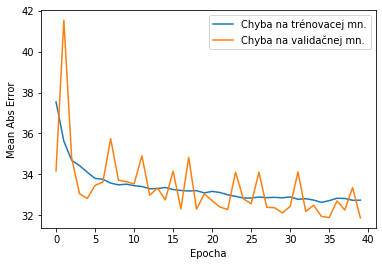

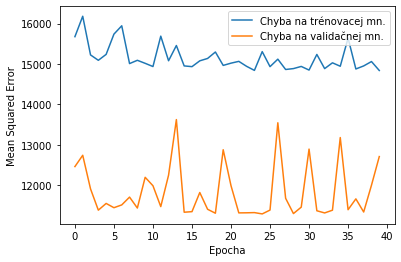

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.29 RealDrivingTime 
Testing set Mean Sqrt Error: 6917.77 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.17 RealDrivingTime 


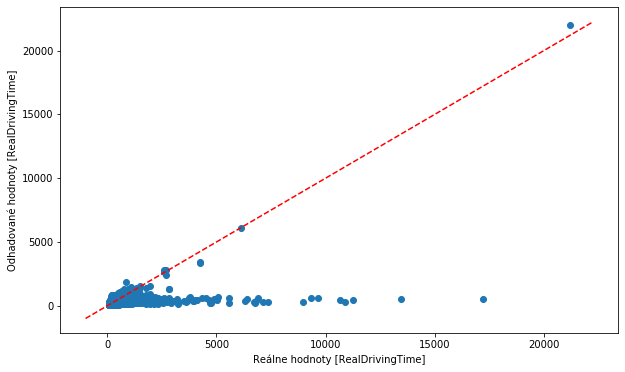

Najväčšia chyba:968.6981201171875
Najväčšia chyba v zápornom smere:-16654.95703125
% približne správnych odhadov: 0.9622877103597345


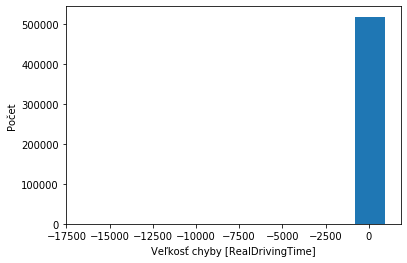

In [220]:
CreateAndFitModelLocations("FILTER1", 0.001, 120, "New6LayerFILTER1ModelTTLOC", TTLOCFILTER1,1,"64-64") 

-----------------------------FILTER2---------------------------------
Veľkosť trénovacej množniy: (2072574, 62)
Veľkosť testovacej množniy: (518143, 62)

....................
....................
................

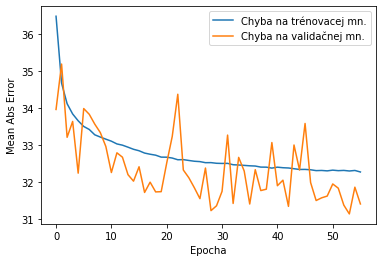

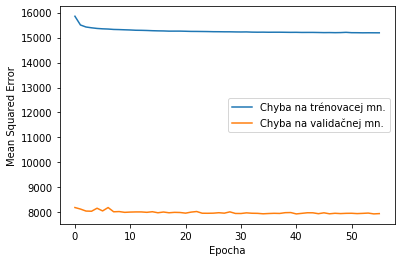

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.75 RealDrivingTime 
Testing set Mean Sqrt Error: 7072.98 RealDrivingTime 
Testing set Root Mean Sqrt Error: 84.10 RealDrivingTime 


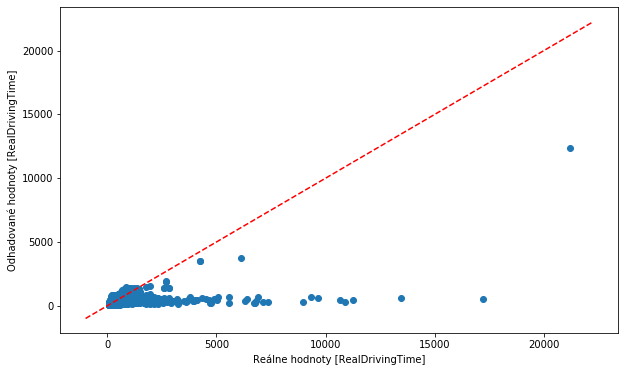

Najväčšia chyba:621.7552490234375
Najväčšia chyba v zápornom smere:-16667.375
% približne správnych odhadov: 0.9630442334414081


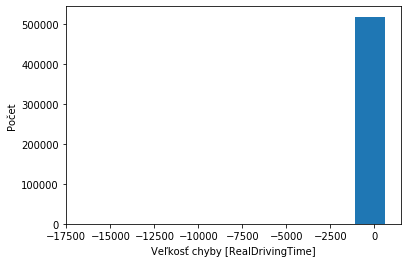

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 32.17 RealDrivingTime 
Testing set Mean Sqrt Error: 8742.21 RealDrivingTime 
Testing set Root Mean Sqrt Error: 93.50 RealDrivingTime 


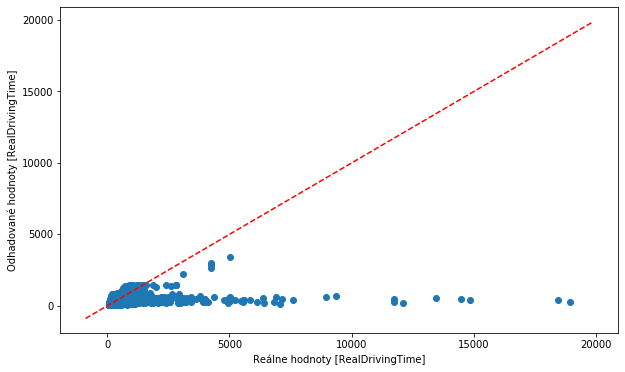

Najväčšia chyba:673.8380126953125
Najväčšia chyba v zápornom smere:-18661.41796875
% približne správnych odhadov: 0.9625450889040285


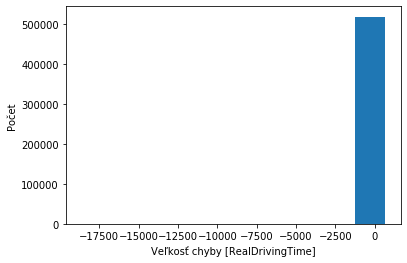

In [230]:
CreateAndFitModelLocations("FILTER2", 0.001, 120, "NewFILTER2ModelTTLOC", TTLOCFILTER2,1,"64-64") 

-----------------------------FILTER3---------------------------------
Veľkosť trénovacej množniy: (1940374, 59)
Veľkosť testovacej množniy: (485094, 59)

....................
....................
....................
....................
....................
.................

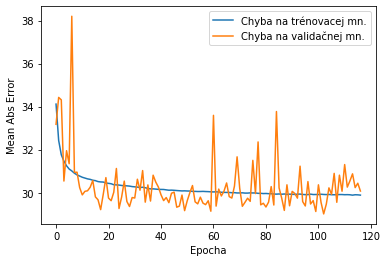

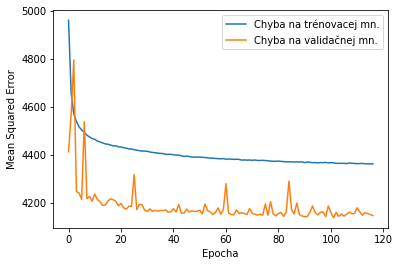

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 50.74 RealDrivingTime 
Testing set Mean Sqrt Error: 17482.12 RealDrivingTime 
Testing set Root Mean Sqrt Error: 132.22 RealDrivingTime 


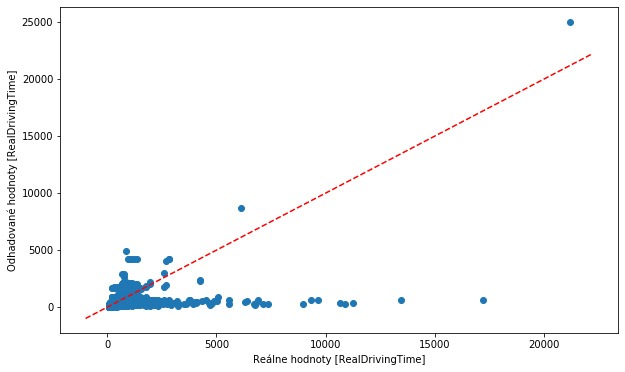

Najväčšia chyba:4033.8837890625
Najväčšia chyba v zápornom smere:-16602.4765625
% približne správnych odhadov: 0.9349911224332252


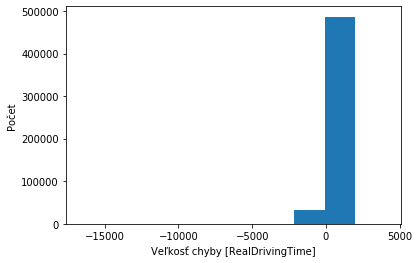

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 51.66 RealDrivingTime 
Testing set Mean Sqrt Error: 20267.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 142.36 RealDrivingTime 


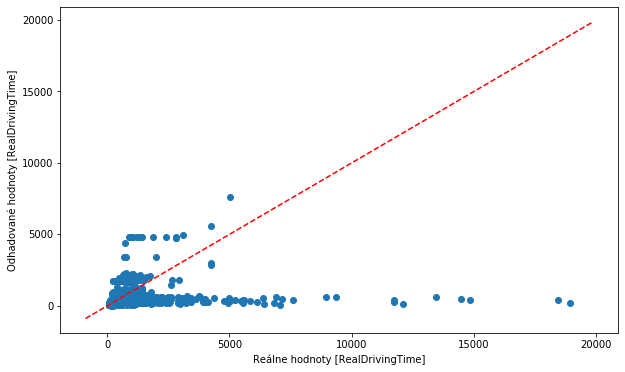

Najväčšia chyba:3912.17138671875
Najväčšia chyba v zápornom smere:-18686.765625
% približne správnych odhadov: 0.9338117083507834


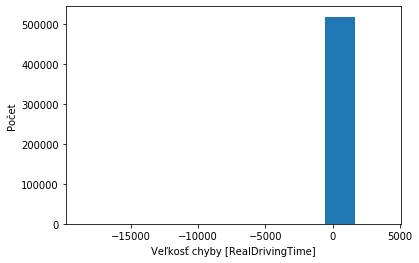

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 29.61 RealDrivingTime 
Testing set Mean Sqrt Error: 4265.62 RealDrivingTime 
Testing set Root Mean Sqrt Error: 65.31 RealDrivingTime 


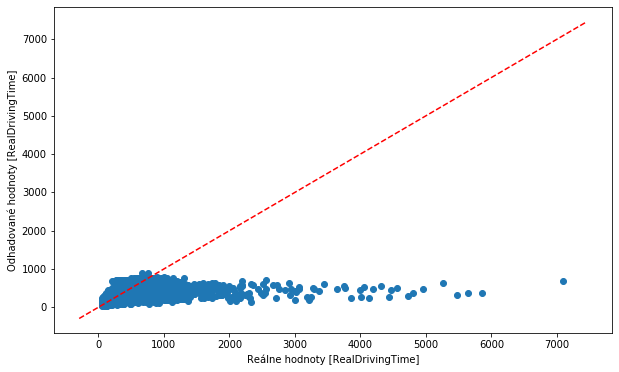

Najväčšia chyba:481.9156494140625
Najväčšia chyba v zápornom smere:-6405.04296875
% približne správnych odhadov: 0.9682989276305211


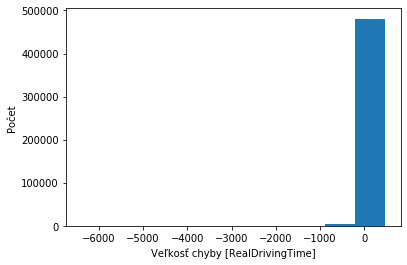

In [231]:
CreateAndFitModelLocations("FILTER3", 0.001, 120, "NewFILTER3ModelTTLOC", TTLOCFILTER3,1,"64-64") 

# Kombinácia DayTime a Seasons = DTSEAS

In [ ]:
DTSEASBASE = ['Weight', 'PlanDrivingTime', 'Speed', 'LengthSect', 'SectIdx', 'DelayDepartureReduced',
              'RealDrivingTime']

In [569]:
jarRano = jar[(jar['DayTime'] == 'Rano')]
jarObed = jar[(jar['DayTime'] == 'Obed')]
jarVecer = jar[(jar['DayTime'] == 'Vecer')]
jarNoc = jar[(jar['DayTime'] == 'Noc')]

letoRano = leto[(leto['DayTime'] == 'Rano')]
letoObed = leto[(leto['DayTime'] == 'Obed')]
letoVecer = leto[(leto['DayTime'] == 'Vecer')]
letoNoc = leto[(leto['DayTime'] == 'Noc')]

jesenRano = jesen[(jesen['DayTime'] == 'Rano')]
jesenObed = jesen[(jesen['DayTime'] == 'Obed')]
jesenVecer = jesen[(jesen['DayTime'] == 'Vecer')]
jesenNoc = jesen[(jesen['DayTime'] == 'Noc')]

zimaRano = zima[(zima['DayTime'] == 'Rano')]
zimaObed = zima[(zima['DayTime'] == 'Obed')]
zimaVecer = zima[(zima['DayTime'] == 'Vecer')]
zimaNoc = zima[(zima['DayTime'] == 'Noc')]

# ////////////////////////////////////////////////////////////////////////////////////

## JAR

Veľkosť trénovacej množniy: (155069, 6)
Veľkosť testovacej množniy: (38767, 6)

....................
....................
....................
.................

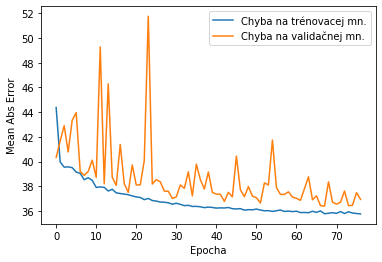

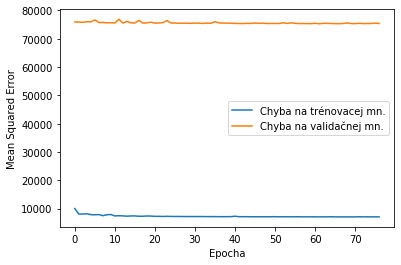

Testing set Mean Abs Error: 35.62 RealDrivingTime 
Testing set Mean Sqrt Error: 5835.97 RealDrivingTime 
Testing set Root Mean Sqrt Error: 76.39 RealDrivingTime 


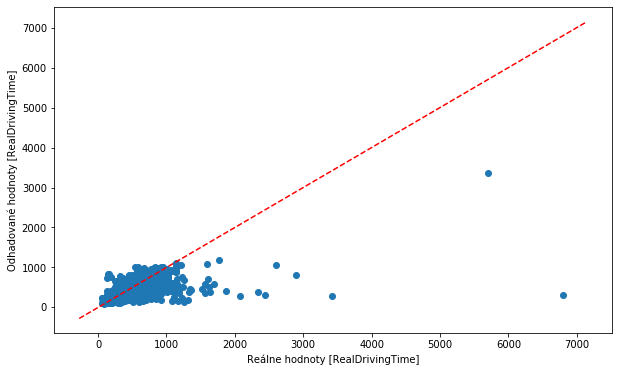

Najväčšia chyba:693.2764892578125
Najväčšia chyba v zápornom smere:-6485.265625
% približne správnych odhadov: 0.9568705342172467


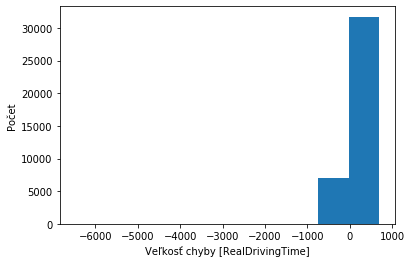

In [570]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelJarRano", jarRano, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (171582, 6)
Veľkosť testovacej množniy: (42896, 6)

..................

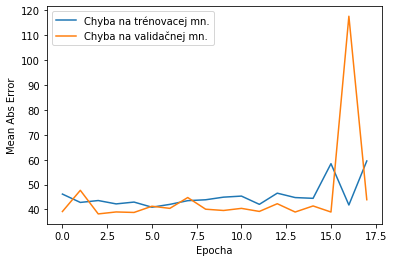

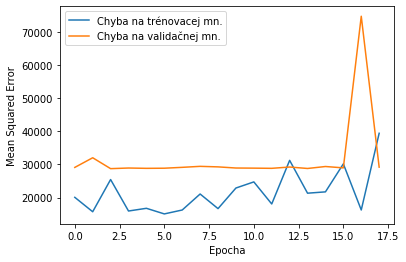

Testing set Mean Abs Error: 38.55 RealDrivingTime 
Testing set Mean Sqrt Error: 25441.35 RealDrivingTime 
Testing set Root Mean Sqrt Error: 159.50 RealDrivingTime 


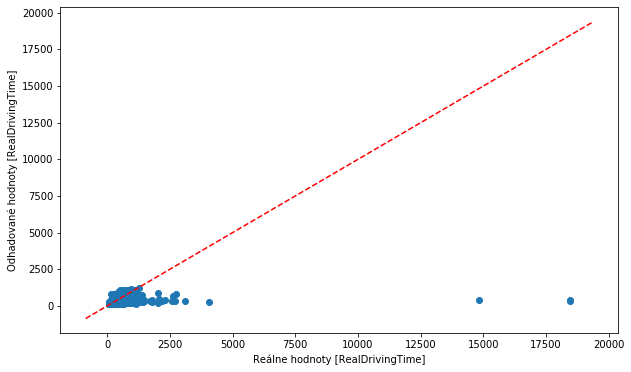

Najväčšia chyba:696.2556762695312
Najväčšia chyba v zápornom smere:-18084.6328125
% približne správnych odhadov: 0.9531191719507647


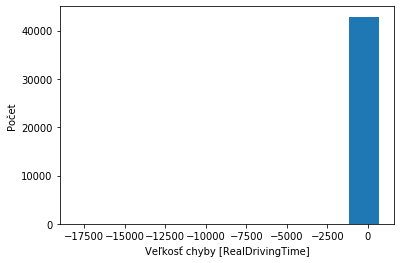

In [571]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelJarObed", jarObed, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (169081, 6)
Veľkosť testovacej množniy: (42270, 6)

....................
..

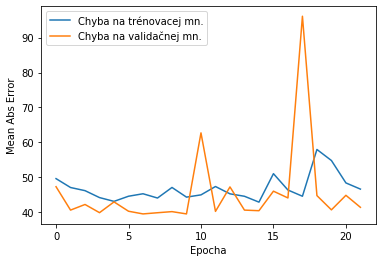

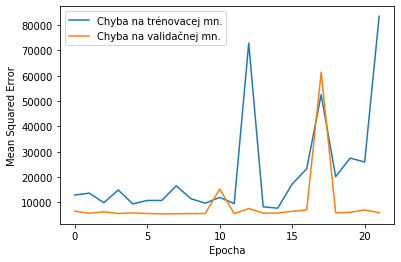

Testing set Mean Abs Error: 40.21 RealDrivingTime 
Testing set Mean Sqrt Error: 7834.47 RealDrivingTime 
Testing set Root Mean Sqrt Error: 88.51 RealDrivingTime 


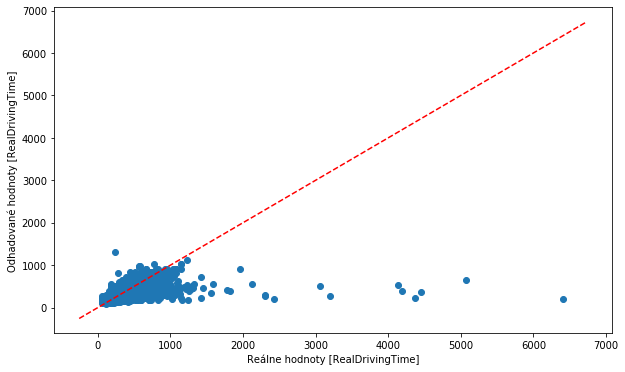

Najväčšia chyba:1062.038818359375
Najväčšia chyba v zápornom smere:-6204.91259765625
% približne správnych odhadov: 0.9480009462976106


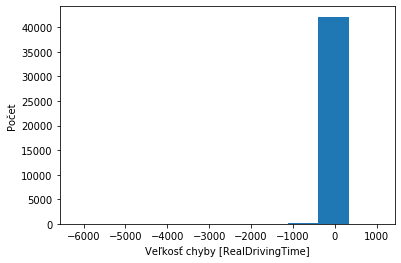

In [572]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelJarVecer", jarVecer, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (107249, 6)
Veľkosť testovacej množniy: (26812, 6)

....................
......

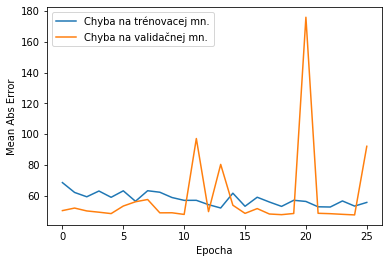

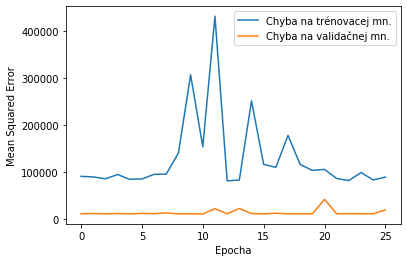

Testing set Mean Abs Error: 47.02 RealDrivingTime 
Testing set Mean Sqrt Error: 11021.79 RealDrivingTime 
Testing set Root Mean Sqrt Error: 104.98 RealDrivingTime 


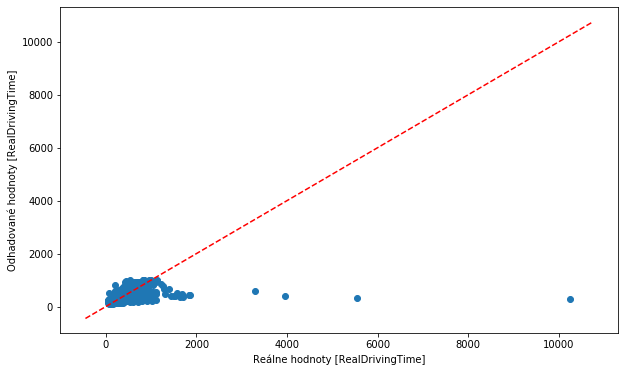

Najväčšia chyba:589.3546752929688
Najväčšia chyba v zápornom smere:-9966.50390625
% približne správnych odhadov: 0.9226465761599284


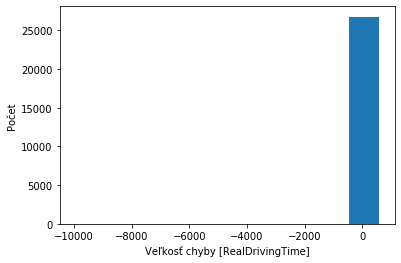

In [573]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelJarNoc", jarNoc, DTSEASBASE, "64-64")

## LETO

Veľkosť trénovacej množniy: (179549, 6)
Veľkosť testovacej množniy: (44887, 6)

....................
...

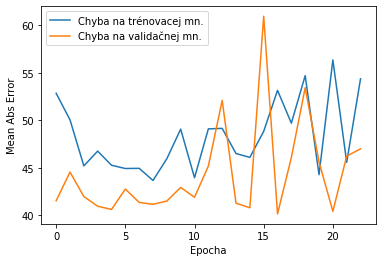

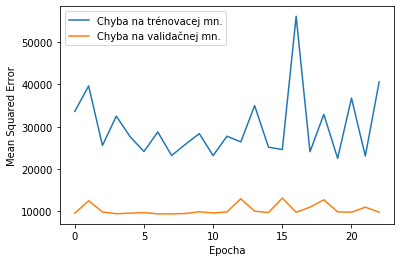

Testing set Mean Abs Error: 41.07 RealDrivingTime 
Testing set Mean Sqrt Error: 9681.05 RealDrivingTime 
Testing set Root Mean Sqrt Error: 98.39 RealDrivingTime 


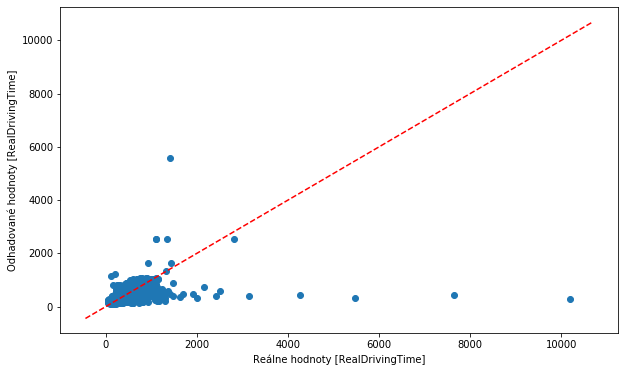

Najväčšia chyba:4180.3388671875
Najväčšia chyba v zápornom smere:-9907.111328125
% približne správnych odhadov: 0.9440818054225054


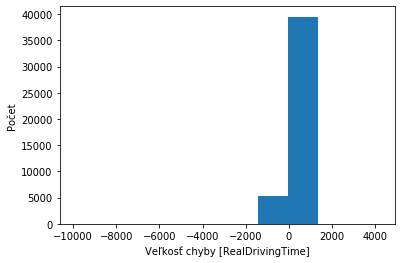

In [574]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelLetoRano", letoRano, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (196783, 6)
Veľkosť testovacej množniy: (49196, 6)

....................
........

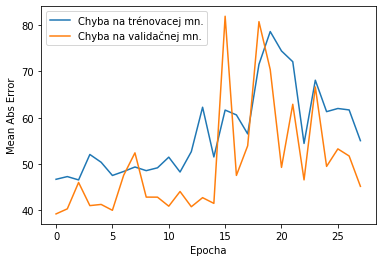

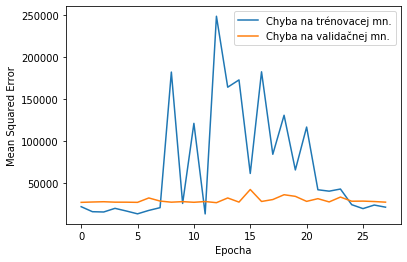

Testing set Mean Abs Error: 41.31 RealDrivingTime 
Testing set Mean Sqrt Error: 18414.94 RealDrivingTime 
Testing set Root Mean Sqrt Error: 135.70 RealDrivingTime 


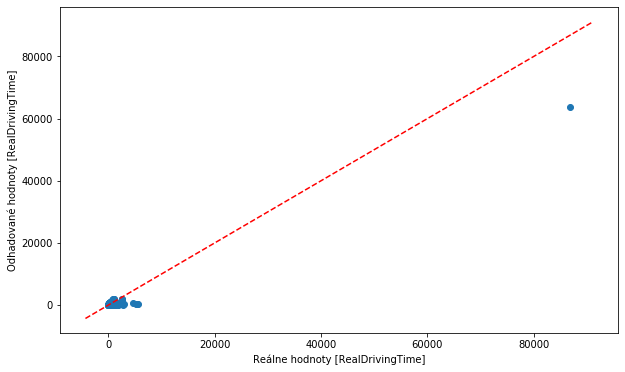

Najväčšia chyba:1162.393310546875
Najväčšia chyba v zápornom smere:-22871.95703125
% približne správnych odhadov: 0.9444263761281405


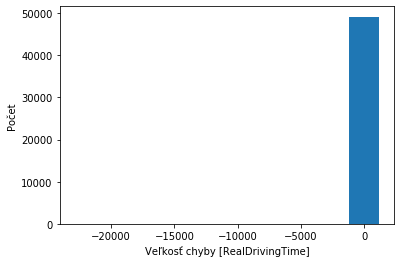

In [575]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelLetoObed", letoObed, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (198328, 6)
Veľkosť testovacej množniy: (49582, 6)

................

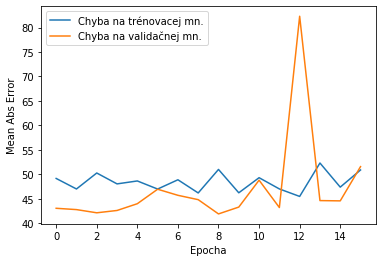

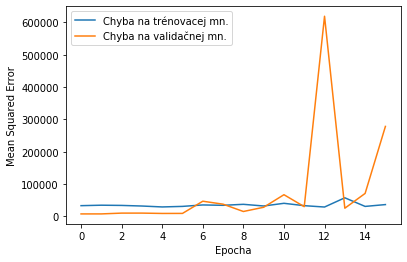

Testing set Mean Abs Error: 43.16 RealDrivingTime 
Testing set Mean Sqrt Error: 10219.55 RealDrivingTime 
Testing set Root Mean Sqrt Error: 101.09 RealDrivingTime 


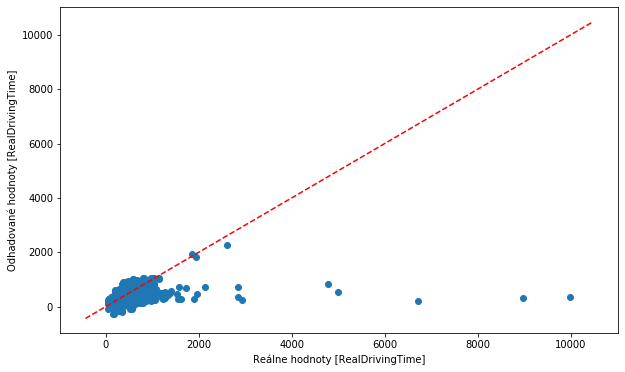

Najväčšia chyba:530.7207641601562
Najväčšia chyba v zápornom smere:-9629.857421875
% približne správnych odhadov: 0.9384252349643015


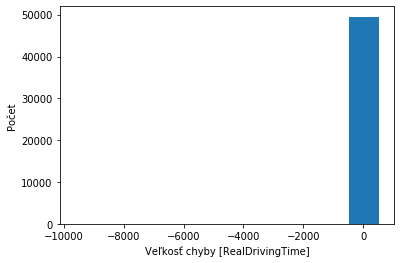

In [576]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelLetoVecer", letoVecer, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (123742, 6)
Veľkosť testovacej množniy: (30935, 6)

....................
....

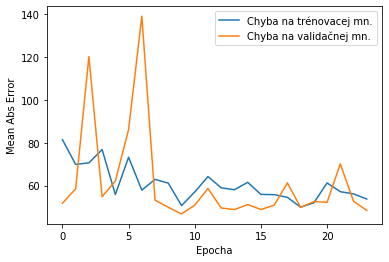

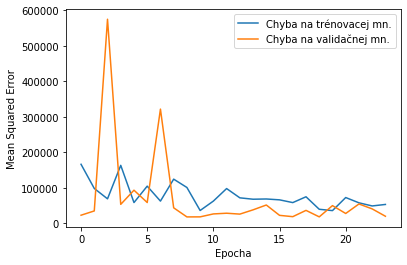

Testing set Mean Abs Error: 50.73 RealDrivingTime 
Testing set Mean Sqrt Error: 78936.61 RealDrivingTime 
Testing set Root Mean Sqrt Error: 280.96 RealDrivingTime 


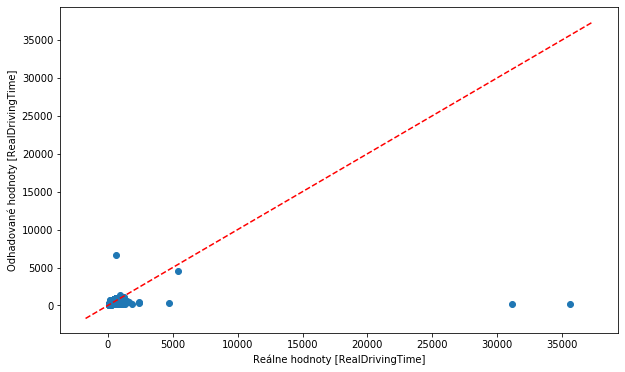

Najväčšia chyba:5962.36181640625
Najväčšia chyba v zápornom smere:-35363.4375
% približne správnych odhadov: 0.923452400193955


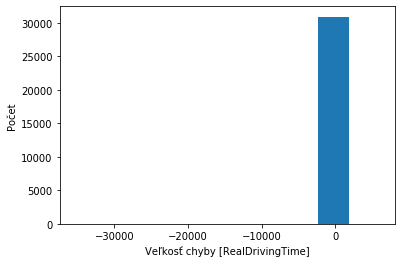

In [577]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelLetoNoc", letoNoc, DTSEASBASE, "64-64")

## JESEN

Veľkosť trénovacej množniy: (166182, 6)
Veľkosť testovacej množniy: (41546, 6)

....................
.......

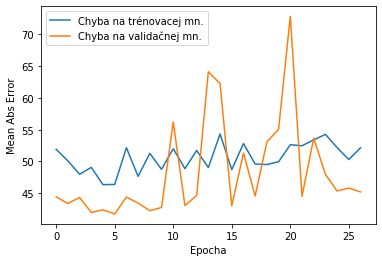

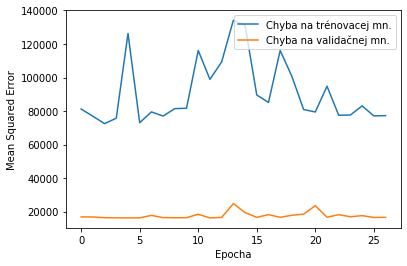

Testing set Mean Abs Error: 41.90 RealDrivingTime 
Testing set Mean Sqrt Error: 4978.48 RealDrivingTime 
Testing set Root Mean Sqrt Error: 70.56 RealDrivingTime 


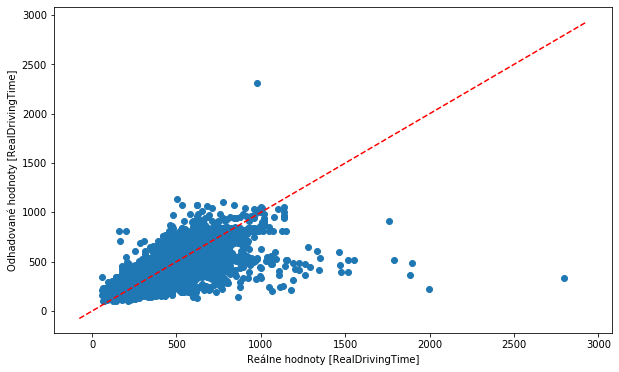

Najväčšia chyba:1332.725830078125
Najväčšia chyba v zápornom smere:-2455.16943359375
% približne správnych odhadov: 0.9430029365041159


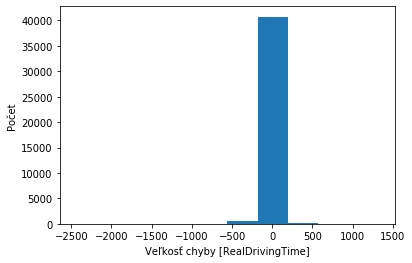

In [578]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelJesenRano", jesenRano, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (184435, 6)
Veľkosť testovacej množniy: (46109, 6)

....................
....................
....................
....................
...........

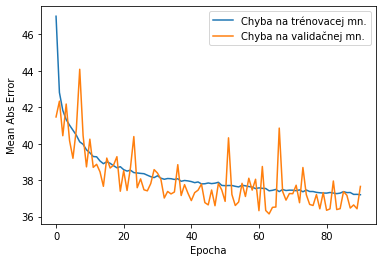

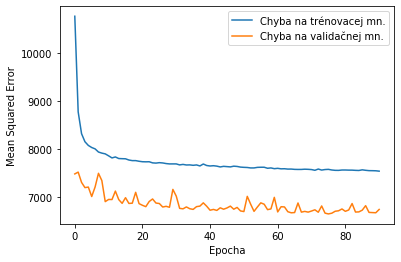

Testing set Mean Abs Error: 37.99 RealDrivingTime 
Testing set Mean Sqrt Error: 69981.33 RealDrivingTime 
Testing set Root Mean Sqrt Error: 264.54 RealDrivingTime 


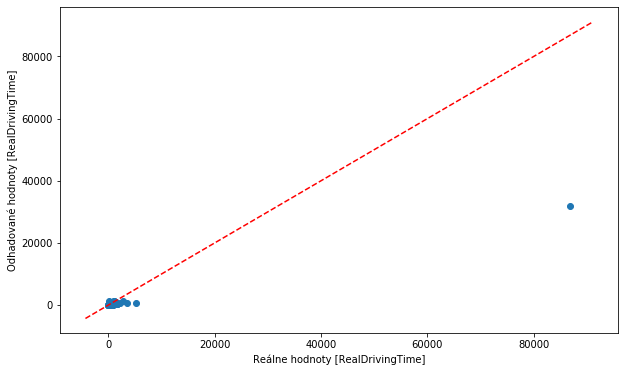

Najväčšia chyba:1252.57958984375
Najväčšia chyba v zápornom smere:-54890.78125
% približne správnych odhadov: 0.9517014031967729


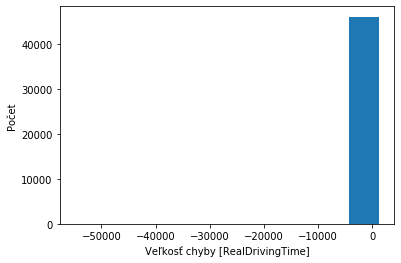

In [579]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelJesenObed", jesenObed, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (183496, 6)
Veľkosť testovacej množniy: (45874, 6)

...................

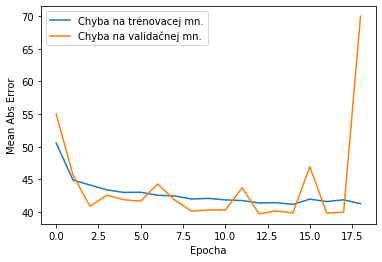

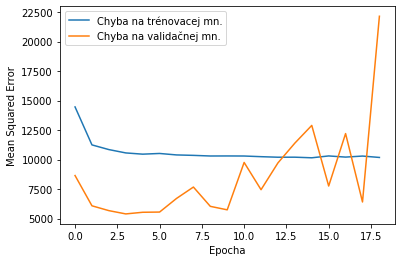

Testing set Mean Abs Error: 42.98 RealDrivingTime 
Testing set Mean Sqrt Error: 9780.06 RealDrivingTime 
Testing set Root Mean Sqrt Error: 98.89 RealDrivingTime 


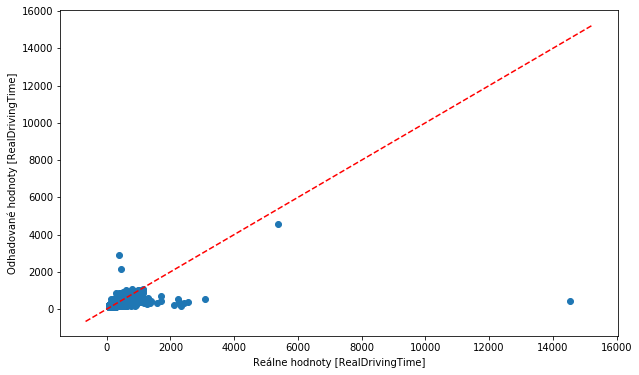

Najväčšia chyba:2495.656005859375
Najväčšia chyba v zápornom smere:-14120.830078125
% približne správnych odhadov: 0.9413829184287396


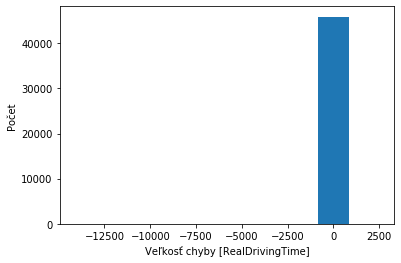

In [580]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelJesenVecer", jesenVecer, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (117494, 6)
Veľkosť testovacej množniy: (29374, 6)

....................
...........

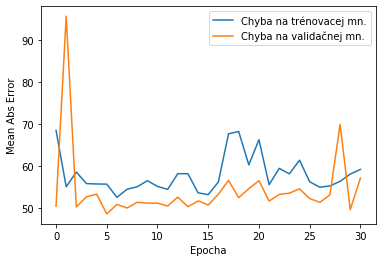

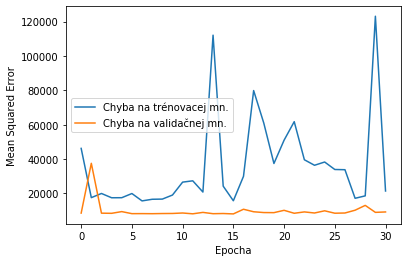

Testing set Mean Abs Error: 52.14 RealDrivingTime 
Testing set Mean Sqrt Error: 45061.99 RealDrivingTime 
Testing set Root Mean Sqrt Error: 212.28 RealDrivingTime 


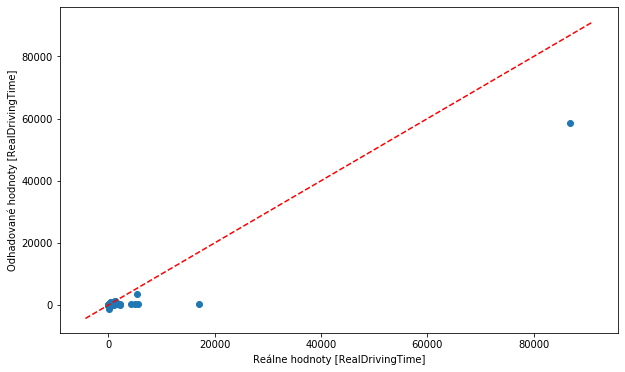

Najväčšia chyba:497.40582275390625
Najväčšia chyba v zápornom smere:-28258.328125
% približne správnych odhadov: 0.923129298018656


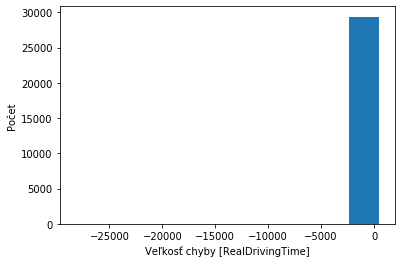

In [581]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelJesenNoc", jesenNoc, DTSEASBASE, "64-64")

## ZIMA

Veľkosť trénovacej množniy: (113630, 6)
Veľkosť testovacej množniy: (28408, 6)

....................
....................
...............

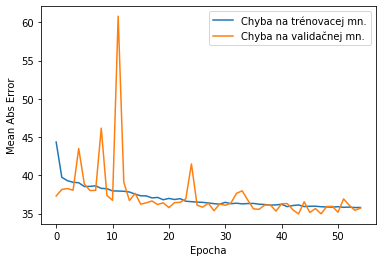

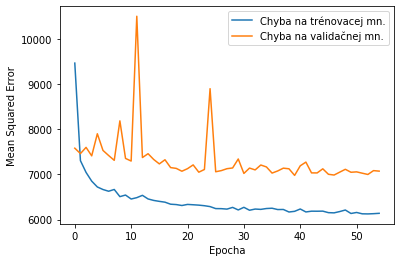

Testing set Mean Abs Error: 34.67 RealDrivingTime 
Testing set Mean Sqrt Error: 4670.63 RealDrivingTime 
Testing set Root Mean Sqrt Error: 68.34 RealDrivingTime 


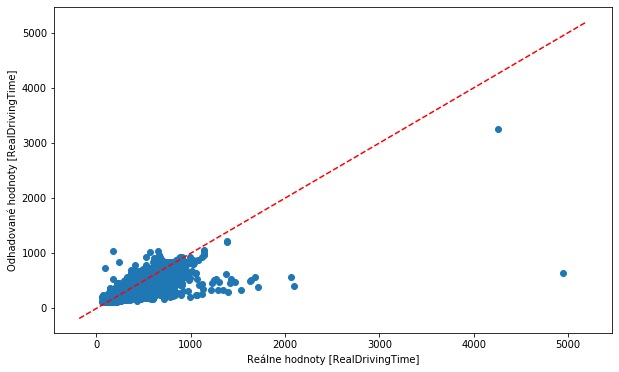

Najväčšia chyba:854.473876953125
Najväčšia chyba v zápornom smere:-4311.14111328125
% približne správnych odhadov: 0.9564911292593635


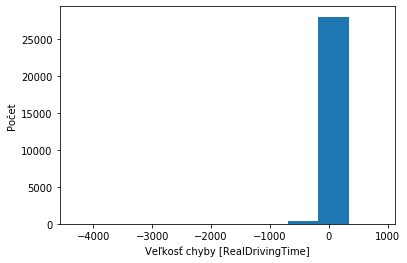

In [582]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelZimaRano", zimaRano, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (125430, 6)
Veľkosť testovacej množniy: (31358, 6)

....................
....................
....................
....................
.........

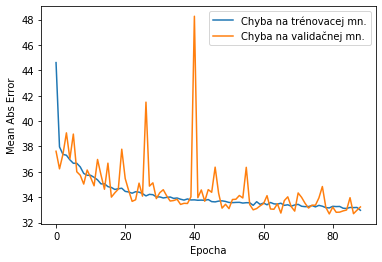

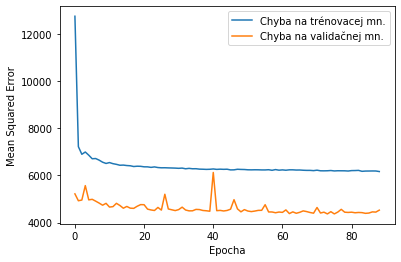

Testing set Mean Abs Error: 32.79 RealDrivingTime 
Testing set Mean Sqrt Error: 3942.68 RealDrivingTime 
Testing set Root Mean Sqrt Error: 62.79 RealDrivingTime 


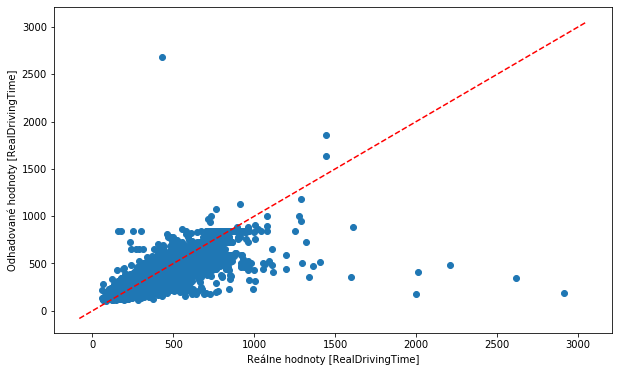

Najväčšia chyba:2248.44775390625
Najväčšia chyba v zápornom smere:-2717.238525390625
% približne správnych odhadov: 0.9621149307991581


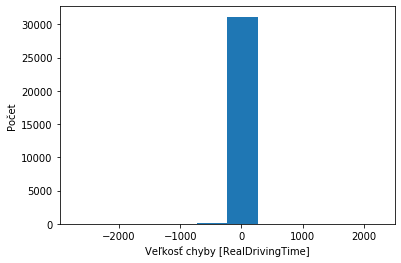

In [583]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelZimaObed", zimaObed, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (123802, 6)
Veľkosť testovacej množniy: (30951, 6)

....................
....................
....................
....................
....................
....................
...............

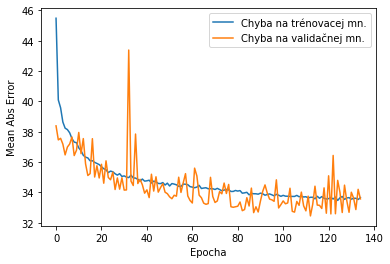

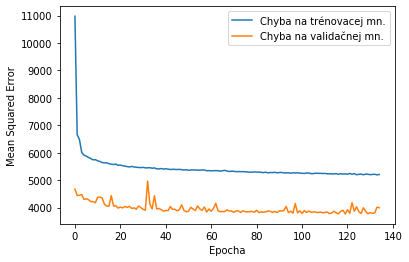

Testing set Mean Abs Error: 33.32 RealDrivingTime 
Testing set Mean Sqrt Error: 4758.79 RealDrivingTime 
Testing set Root Mean Sqrt Error: 68.98 RealDrivingTime 


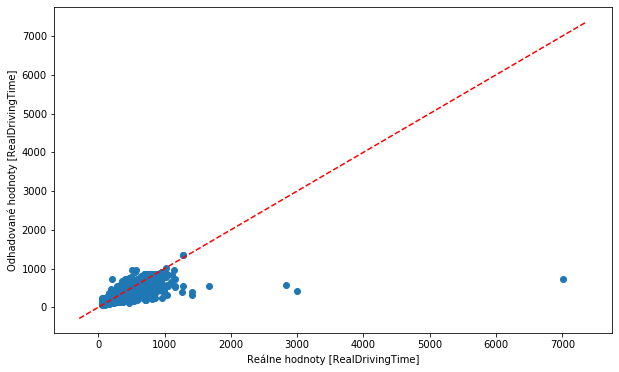

Najväčšia chyba:526.8155517578125
Najväčšia chyba v zápornom smere:-6277.07568359375
% približne správnych odhadov: 0.9597428192950147


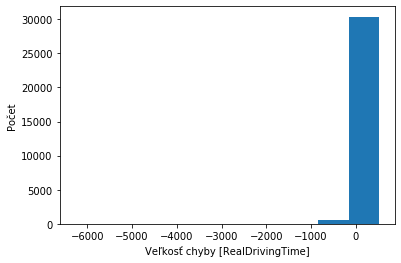

In [584]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelZimaVecer", zimaVecer, DTSEASBASE, "64-64")

Veľkosť trénovacej množniy: (75770, 6)
Veľkosť testovacej množniy: (18943, 6)

....................
...............

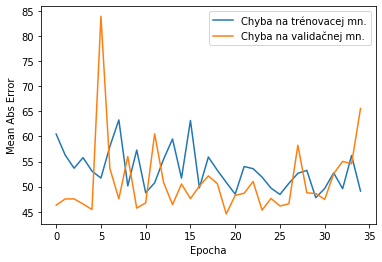

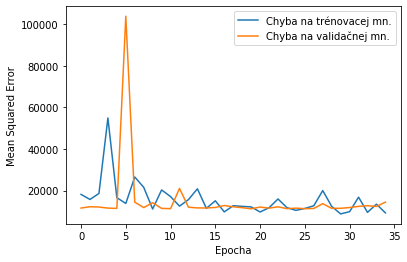

Testing set Mean Abs Error: 44.24 RealDrivingTime 
Testing set Mean Sqrt Error: 5350.98 RealDrivingTime 
Testing set Root Mean Sqrt Error: 73.15 RealDrivingTime 


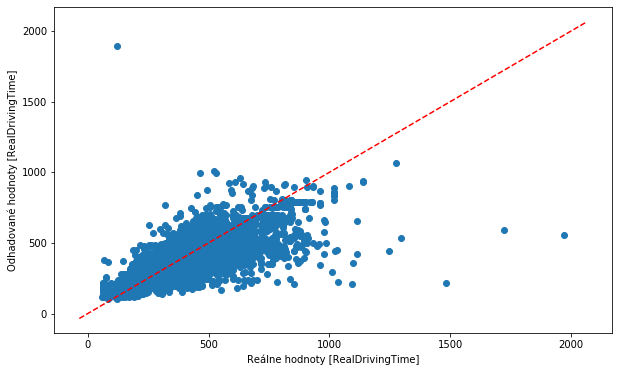

Najväčšia chyba:1775.955078125
Najväčšia chyba v zápornom smere:-1413.04931640625
% približne správnych odhadov: 0.9274138204085942


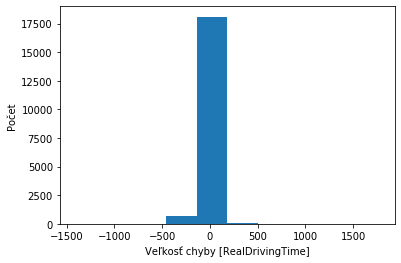

In [585]:
CreateAndFitModelDATA(0.001, "4New2FILTER1ModelZimaNoc", zimaNoc, DTSEASBASE, "64-64")

# ////////////////////////////////////////////////////////////////////////////////////

In [234]:
type = DFBASE['DayTime']
for daytime in daytime_types:
    DFBASE[daytime] = (type == daytime)*1.0
    
type = DFFILTER1['DayTime']
for daytime in daytime_types:
    DFFILTER1[daytime] = (type == daytime)*1.0
    
type = DFFILTER2['DayTime']
for daytime in daytime_types:
    DFFILTER2[daytime] = (type == daytime)*1.0
    
type = DFFILTER3['DayTime']
for daytime in daytime_types:
    DFFILTER3[daytime] = (type == daytime)*1.0

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [235]:
season = DFBASE['Season']
for seas in season_types:
    DFBASE[seas] = (season == seas)*1.0
    
season = DFFILTER1['Season']
for seas in season_types:
    DFFILTER1[seas] = (season == seas)*1.0
    
season = DFFILTER2['Season']
for seas in season_types:
    DFFILTER2[seas] = (season == seas)*1.0
    
season = DFFILTER3['Season']
for seas in season_types:
    DFFILTER3[seas] = (season == seas)*1.0

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [ ]:
CreateAndFitModel("BASE", 0.001, 120, "NewBASEModelDTSEAS",DTSEASBASE,1,"96-64-32-32")

In [ ]:
CreateAndFitModel("FILTER1", 0.001, 120, "New6FILTER1ModelDTSEAS",DTSEASFILTER,1,"96-64-64-32-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 17)
Veľkosť testovacej množniy: (518160, 17)

....................
....................
........

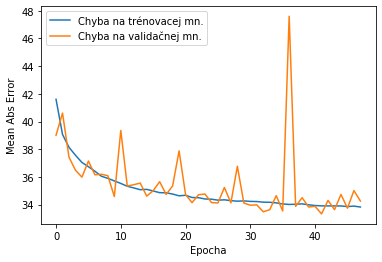

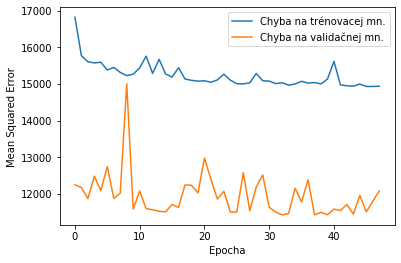

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.98 RealDrivingTime 
Testing set Mean Sqrt Error: 7050.80 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.97 RealDrivingTime 


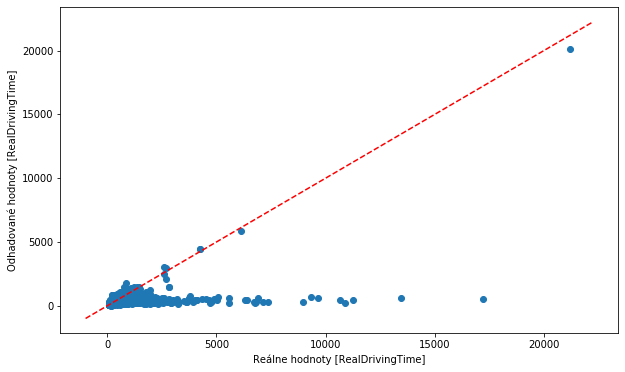

Najväčšia chyba:909.177978515625
Najväčšia chyba v zápornom smere:-16663.26171875
% približne správnych odhadov: 0.9605025474756832


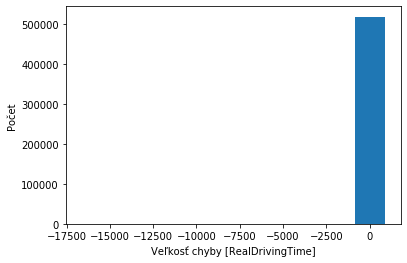

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 34.64 RealDrivingTime 
Testing set Mean Sqrt Error: 8991.56 RealDrivingTime 
Testing set Root Mean Sqrt Error: 94.82 RealDrivingTime 


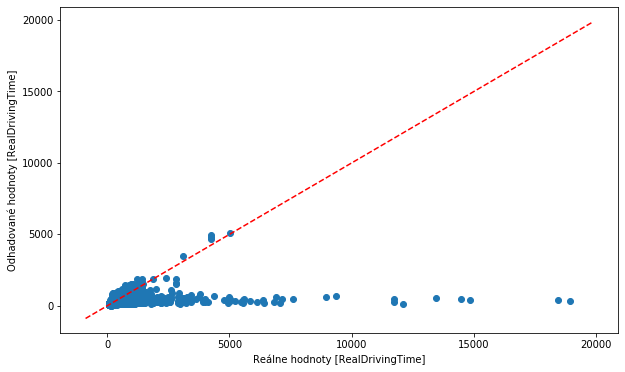

Najväčšia chyba:726.2698974609375
Najväčšia chyba v zápornom smere:-18612.564453125
% približne správnych odhadov: 0.9580521207465893


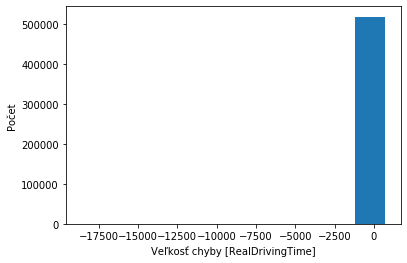

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 37.80 RealDrivingTime 
Testing set Mean Sqrt Error: 5010.21 RealDrivingTime 
Testing set Root Mean Sqrt Error: 70.78 RealDrivingTime 


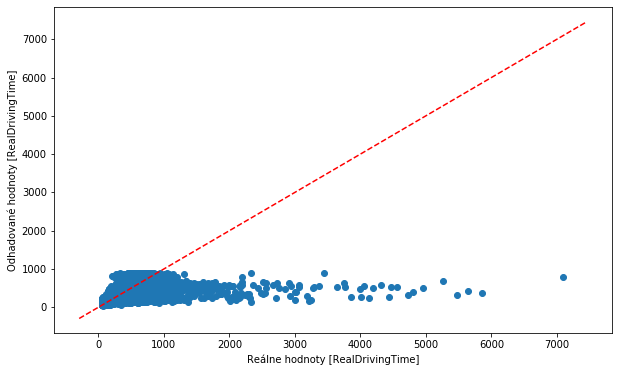

Najväčšia chyba:600.4088134765625
Najväčšia chyba v zápornom smere:-6298.6396484375
% približne správnych odhadov: 0.9505662819989528


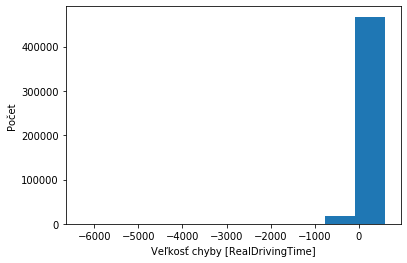

In [240]:
CreateAndFitModel("FILTER1", 0.001, 120, "New4FILTER1ModelDTSEAS",DTSEASFILTER,1,"96-64-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 17)
Veľkosť testovacej množniy: (518160, 17)

....................
....................
............

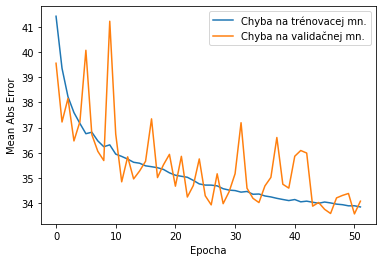

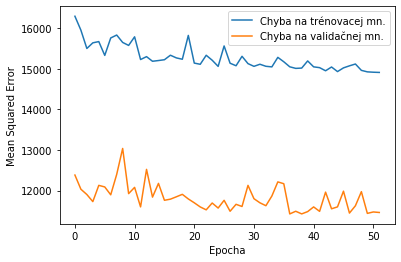

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 34.56 RealDrivingTime 
Testing set Mean Sqrt Error: 7067.03 RealDrivingTime 
Testing set Root Mean Sqrt Error: 84.07 RealDrivingTime 


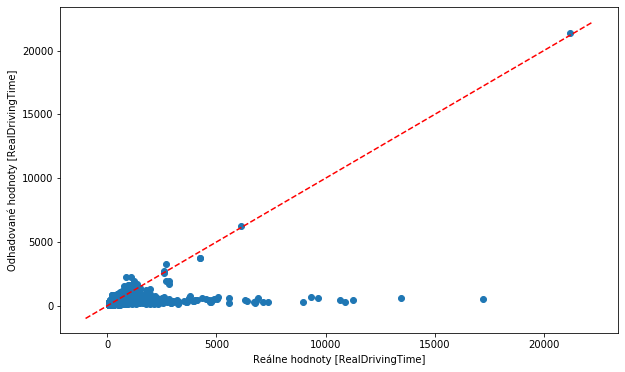

Najväčšia chyba:1380.698974609375
Najväčšia chyba v zápornom smere:-16645.91796875
% približne správnych odhadov: 0.9602709587772117


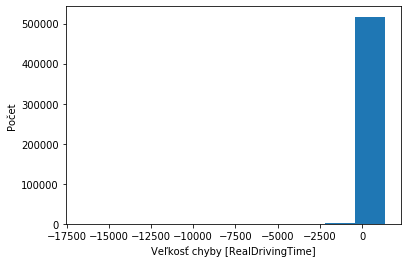

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 36.04 RealDrivingTime 
Testing set Mean Sqrt Error: 9020.10 RealDrivingTime 
Testing set Root Mean Sqrt Error: 94.97 RealDrivingTime 


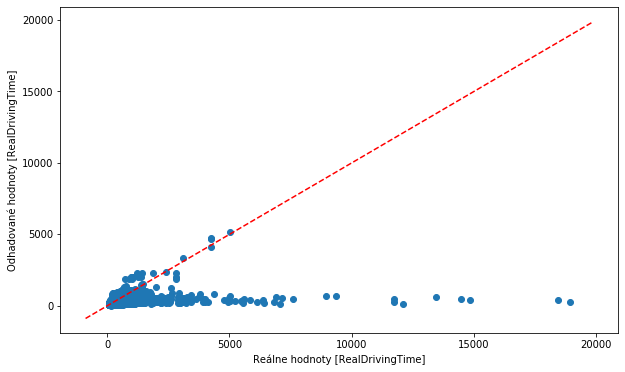

Najväčšia chyba:1168.19970703125
Najväčšia chyba v zápornom smere:-18616.82421875
% približne správnych odhadov: 0.9575580486468022


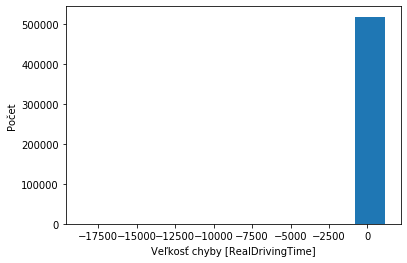

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 39.66 RealDrivingTime 
Testing set Mean Sqrt Error: 5141.96 RealDrivingTime 
Testing set Root Mean Sqrt Error: 71.71 RealDrivingTime 


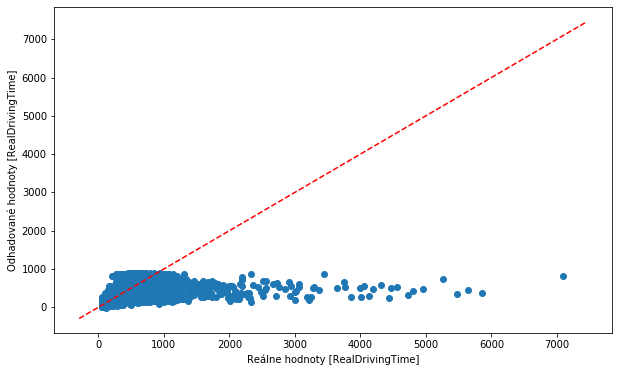

Najväčšia chyba:607.5220947265625
Najväčšia chyba v zápornom smere:-6292.8828125
% približne správnych odhadov: 0.947884327573625


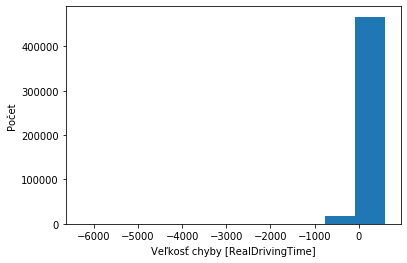

In [241]:
CreateAndFitModel("FILTER1", 0.001, 120, "New3FILTER1ModelDTSEAS",DTSEASFILTER,1,"128-64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 17)
Veľkosť testovacej množniy: (518160, 17)

....................
....................
....................
....................
..

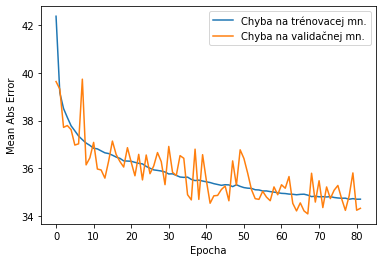

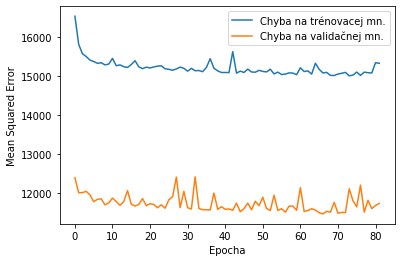

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 33.76 RealDrivingTime 
Testing set Mean Sqrt Error: 7111.41 RealDrivingTime 
Testing set Root Mean Sqrt Error: 84.33 RealDrivingTime 


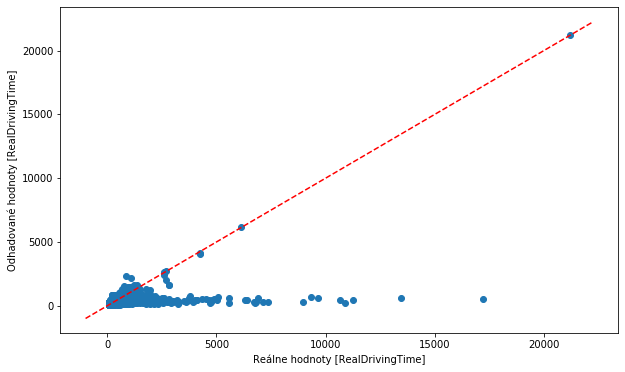

Najväčšia chyba:1445.9951171875
Najväčšia chyba v zápornom smere:-16665.0078125
% približne správnych odhadov: 0.9597190057125212


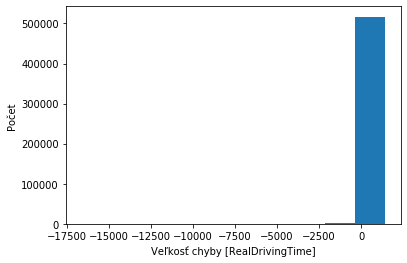

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 35.53 RealDrivingTime 
Testing set Mean Sqrt Error: 9080.12 RealDrivingTime 
Testing set Root Mean Sqrt Error: 95.29 RealDrivingTime 


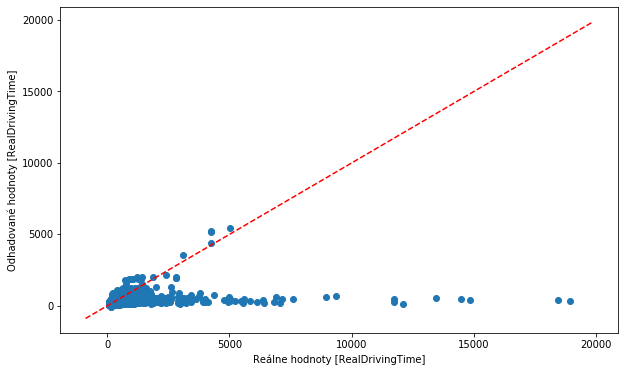

Najväčšia chyba:1039.4710693359375
Najväčšia chyba v zápornom smere:-18614.044921875
% približne správnych odhadov: 0.9572762731523923


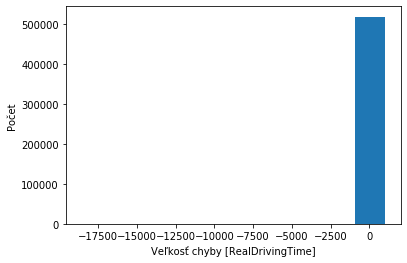

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 39.69 RealDrivingTime 
Testing set Mean Sqrt Error: 5198.93 RealDrivingTime 
Testing set Root Mean Sqrt Error: 72.10 RealDrivingTime 


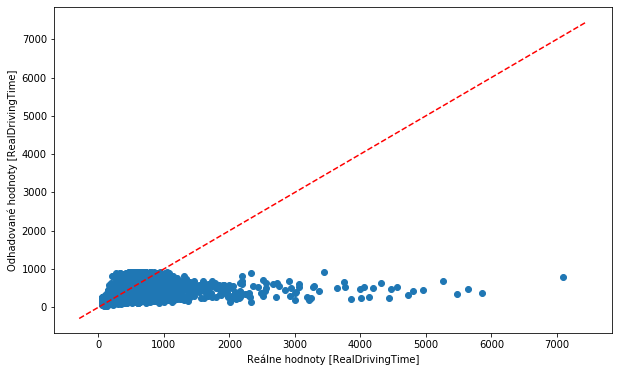

Najväčšia chyba:621.728759765625
Najväčšia chyba v zápornom smere:-6301.13037109375
% približne správnych odhadov: 0.9480224451343451


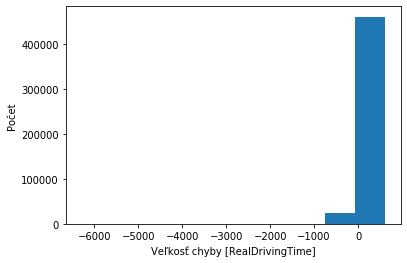

In [242]:
CreateAndFitModel("FILTER1", 0.001, 120, "New2FILTER1ModelDTSEAS",DTSEASFILTER,1,"64-64")

In [ ]:
CreateAndFitModel("FILTER2", 0.001, 120, "NewFILTER2ModelDTSEAS",DTSEASFILTER,1,"96-64-32-32")

In [ ]:
CreateAndFitModel("FILTER3", 0.001, 120, "NewFILTER3ModelDTSEAS",DTSEASFILTER,1,"96-64-32-32")

## Vyhodnotenie - Kombinácia DayTime a Season

### BASE
#### ------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 55.14 RealDrivingTime [+6,34‬]
- Testing set Mean Sqrt Error: 340339.66 RealDrivingTime [+43 975‬]
- Testing set Root Mean Sqrt Error: 583.39 RealDrivingTime [+39‬]

------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 369.70 RealDrivingTime
- Testing set Mean Sqrt Error: 496101.81 RealDrivingTime
- Testing set Root Mean Sqrt Error: 704.34 RealDrivingTime

------Presnosť na FILTER2 dátach-------- 
- Testing set Mean Abs Error: 411.62 RealDrivingTime
- Testing set Mean Sqrt Error: 621458.50 RealDrivingTime
- Testing set Root Mean Sqrt Error: 788.33 RealDrivingTime

------Presnosť na FILTER3 dátach-------- 
- Testing set Mean Abs Error: 441.32 RealDrivingTime
- Testing set Mean Sqrt Error: 594020.62 RealDrivingTime
- Testing set Root Mean Sqrt Error: 770.73 RealDrivingTime

### FILTER1
------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 105.97 RealDrivingTime
- Testing set Mean Sqrt Error: 1519922.75 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1232.85 RealDrivingTime

#### ------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 35.54 RealDrivingTime [-1,35]
- Testing set Mean Sqrt Error: 17849.01 RealDrivingTime [-163]
- Testing set Root Mean Sqrt Error: 133.60 RealDrivingTime[-1]

------Presnosť na FILTER2 dátach-------- 
- Testing set Mean Abs Error: 36.85 RealDrivingTime
- Testing set Mean Sqrt Error: 19665.07 RealDrivingTime
- Testing set Root Mean Sqrt Error: 140.23 RealDrivingTime

------Presnosť na FILTER3 dátach-------- 
- Testing set Mean Abs Error: 42.25 RealDrivingTime
- Testing set Mean Sqrt Error: 5213.32 RealDrivingTime
- Testing set Root Mean Sqrt Error: 72.20 RealDrivingTime

### FILTER2
------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 106.37 RealDrivingTime
- Testing set Mean Sqrt Error: 1350886.50 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1162.28 RealDrivingTime

------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 36.77 RealDrivingTime
- Testing set Mean Sqrt Error: 17904.89 RealDrivingTime
- Testing set Root Mean Sqrt Error: 133.81 RealDrivingTime

#### ------Presnosť na FILTER2 dátach-------- 
- Testing set Mean Abs Error: 34.71 RealDrivingTime [-2,04‬]
- Testing set Mean Sqrt Error: 19503.80 RealDrivingTime [-142‬]
- Testing set Root Mean Sqrt Error: 139.66 RealDrivingTime [-1]

------Presnosť na FILTER3 dátach-------- 
- Testing set Mean Abs Error: 38.75 RealDrivingTime
- Testing set Mean Sqrt Error: 4799.19 RealDrivingTime
- Testing set Root Mean Sqrt Error: 69.28 RealDrivingTime

### FILTER3
------Presnosť na BASE dátach-------- 
- Testing set Mean Abs Error: 108.08 RealDrivingTime
- Testing set Mean Sqrt Error: 1637910.00 RealDrivingTime
- Testing set Root Mean Sqrt Error: 1279.81 RealDrivingTime

------Presnosť na FILTER1 dátach-------- 
- Testing set Mean Abs Error: 42.26 RealDrivingTime
- Testing set Mean Sqrt Error: 19036.10 RealDrivingTime
- Testing set Root Mean Sqrt Error: 137.97 RealDrivingTime

------Presnosť na FILTER2 dátach-------- 
- Testing set Mean Abs Error: 39.47 RealDrivingTime
- Testing set Mean Sqrt Error: 20966.60 RealDrivingTime
- Testing set Root Mean Sqrt Error: 144.80 RealDrivingTime

#### ------Presnosť na FILTER3 dátach-------- 
- Testing set Mean Abs Error: 32.61 RealDrivingTime [-0.38]
- Testing set Mean Sqrt Error: 4379.90 RealDrivingTime [-78‬]
- Testing set Root Mean Sqrt Error: 66.18 RealDrivingTime [-0,58]

# Kombinácia DayTimes a TrainTypes = DTTT

In [248]:
DTTTBASE = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed',
            'LengthSect', 'SectIdx', 'DelayDeparture',
            'Rano','Obed','Vecer','Noc']

In [249]:
DTTTFILTER1 = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed',
                          'LengthSect', 'SectIdx', 'DelayDepartureReduced',
                           'Rano','Obed','Vecer','Noc']
DTTTFILTER2 = DTTTFILTER1.copy()
DTTTFILTER3 = DTTTFILTER1.copy()

In [250]:
type = DFBASE['TrainType']
for typ in DFBASE.TrainType.unique():
    DTTTBASE.append(typ)
    DFBASE[typ] = (type == typ)*1.0
    
type = DFFILTER1['TrainType']
for typ in DFFILTER1.TrainType.unique():
    DTTTFILTER1.append(typ)
    DFFILTER1[typ] = (type == typ)*1.0

type = DFFILTER2['TrainType']
for typ in DFFILTER2.TrainType.unique():
    DTTTFILTER2.append(typ)
    DFFILTER2[typ] = (type == typ)*1.0

type = DFFILTER3['TrainType']
for typ in DFFILTER3.TrainType.unique():
    DTTTFILTER3.append(typ)
    DFFILTER3[typ] = (type == typ)*1.0

DTTTBASE.append('RealDrivingTime')    
DTTTFILTER1.append('RealDrivingTime')
DTTTFILTER2.append('RealDrivingTime')
DTTTFILTER3.append('RealDrivingTime')

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [251]:
type = DFBASE['DayTime']
for daytime in daytime_types:
    DFBASE[daytime] = (type == daytime)*1.0
    
type = DFFILTER1['DayTime']
for daytime in daytime_types:
    DFFILTER1[daytime] = (type == daytime)*1.0
    
type = DFFILTER2['DayTime']
for daytime in daytime_types:
    DFFILTER2[daytime] = (type == daytime)*1.0
    
type = DFFILTER3['DayTime']
for daytime in daytime_types:
    DFFILTER3[daytime] = (type == daytime)*1.0

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [ ]:
CreateAndFitModel("BASE", 0.001, 120, "NewBASEModelDTTT", DTTTBASE,0,"96-64-32-32")

In [ ]:
CreateAndFitModel("FILTER1", 0.001, 120, "New6FILTER1ModelDTTT",DTTTFILTER1,1,"96-64-64-32-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 24)
Veľkosť testovacej množniy: (518160, 24)

....................
....................
....................
....................
............

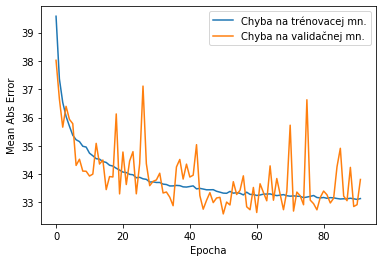

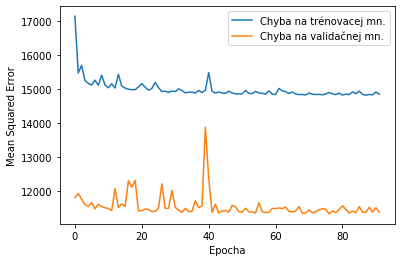

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.58 RealDrivingTime 
Testing set Mean Sqrt Error: 6947.75 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.35 RealDrivingTime 


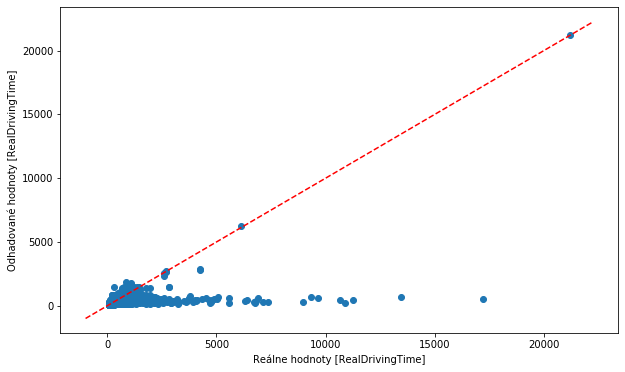

Najväčšia chyba:1190.004638671875
Najväčšia chyba v zápornom smere:-16668.755859375
% približne správnych odhadov: 0.9618090937162267


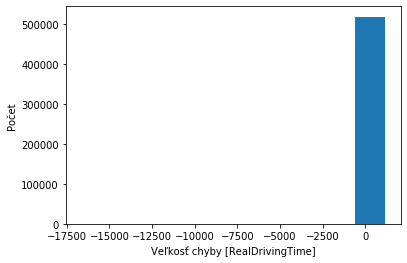

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 34.46 RealDrivingTime 
Testing set Mean Sqrt Error: 8906.67 RealDrivingTime 
Testing set Root Mean Sqrt Error: 94.38 RealDrivingTime 


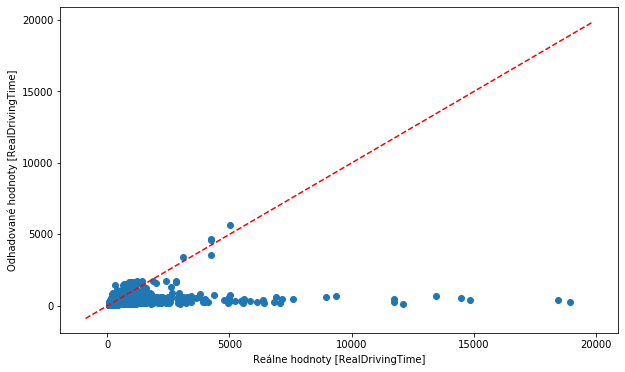

Najväčšia chyba:1182.704345703125
Najväčšia chyba v zápornom smere:-18631.541015625
% približne správnych odhadov: 0.9590614946067012


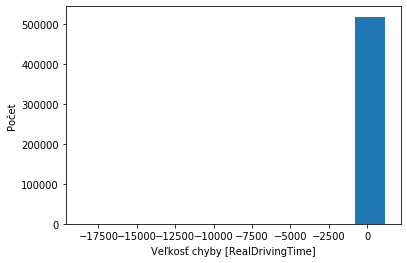

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 40.65 RealDrivingTime 
Testing set Mean Sqrt Error: 5281.12 RealDrivingTime 
Testing set Root Mean Sqrt Error: 72.67 RealDrivingTime 


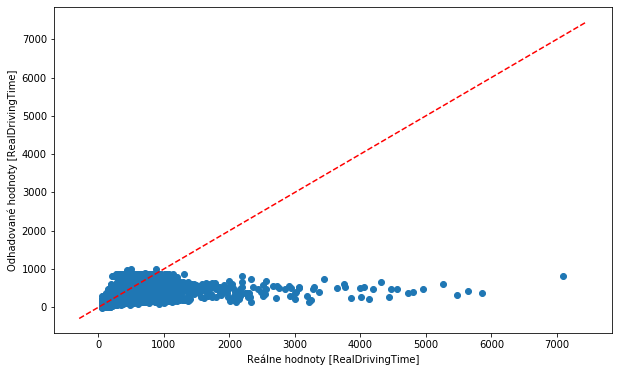

Najväčšia chyba:612.1347045898438
Najväčšia chyba v zápornom smere:-6291.138671875
% približne správnych odhadov: 0.9503951811401502


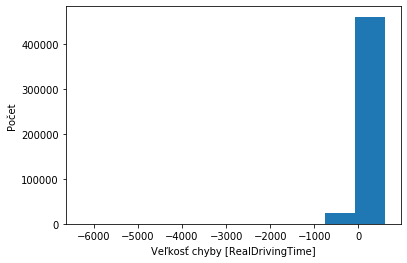

In [252]:
CreateAndFitModel("FILTER1", 0.001, 120, "New4FILTER1ModelDTTT",DTTTFILTER1,1,"96-64-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 24)
Veľkosť testovacej množniy: (518160, 24)

....................
....................
....................
........

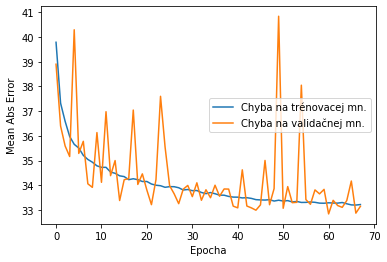

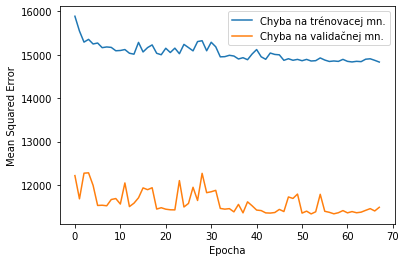

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.76 RealDrivingTime 
Testing set Mean Sqrt Error: 6949.14 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.36 RealDrivingTime 


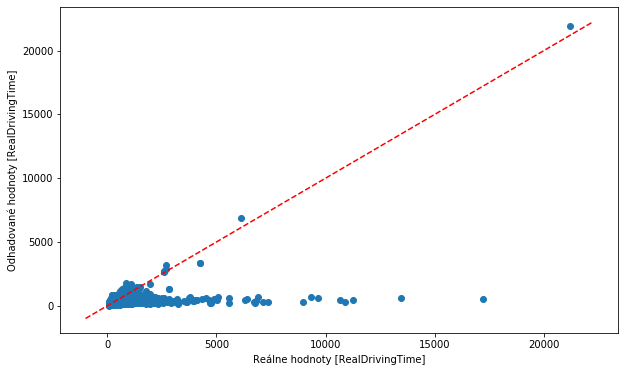

Najväčšia chyba:922.9962158203125
Najväčšia chyba v zápornom smere:-16664.890625
% približne správnych odhadov: 0.9616855797437085


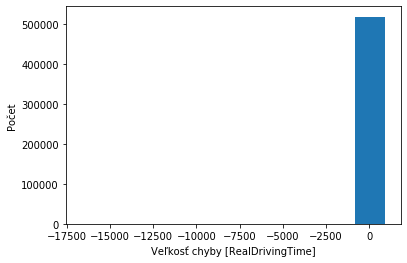

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 34.21 RealDrivingTime 
Testing set Mean Sqrt Error: 8899.60 RealDrivingTime 
Testing set Root Mean Sqrt Error: 94.34 RealDrivingTime 


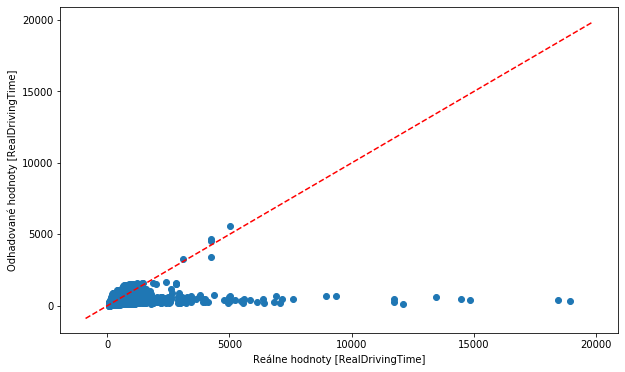

Najväčšia chyba:798.8148193359375
Najväčšia chyba v zápornom smere:-18605.08984375
% približne správnych odhadov: 0.9590383349770237


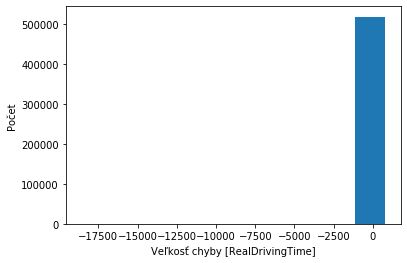

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 39.57 RealDrivingTime 
Testing set Mean Sqrt Error: 5087.23 RealDrivingTime 
Testing set Root Mean Sqrt Error: 71.32 RealDrivingTime 


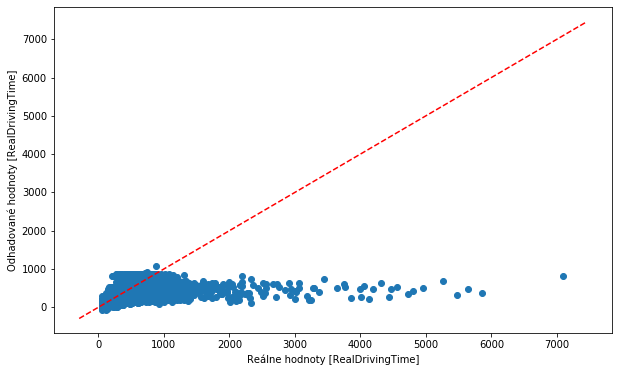

Najväčšia chyba:612.1930541992188
Najväčšia chyba v zápornom smere:-6289.63134765625
% približne správnych odhadov: 0.9522051396224237


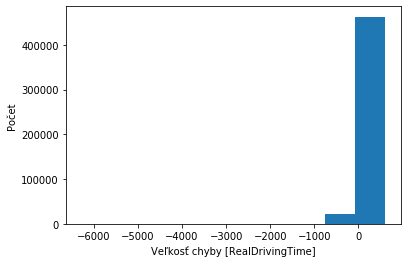

In [253]:
CreateAndFitModel("FILTER1", 0.001, 120, "New3FILTER1ModelDTTT",DTTTFILTER1,1,"128-64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 24)
Veľkosť testovacej množniy: (518160, 24)

....................
....................
....................
.........

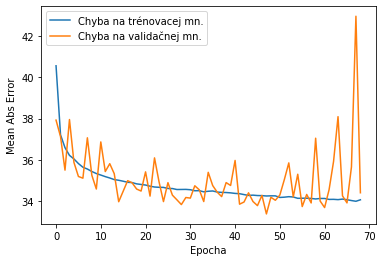

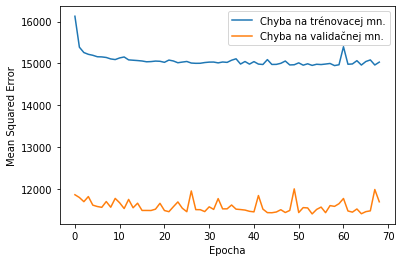

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 33.75 RealDrivingTime 
Testing set Mean Sqrt Error: 7033.94 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.87 RealDrivingTime 


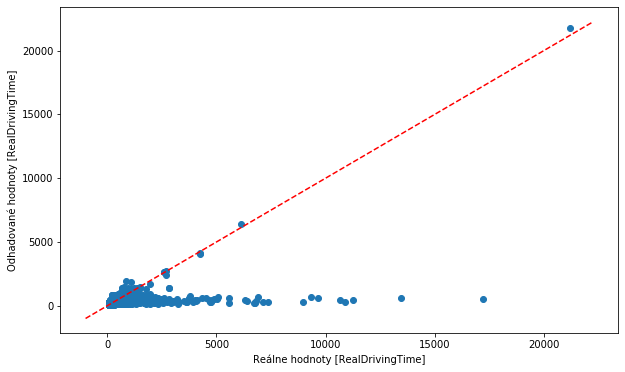

Najväčšia chyba:1082.3157958984375
Najväčšia chyba v zápornom smere:-16660.24609375
% približne správnych odhadov: 0.960489038134939


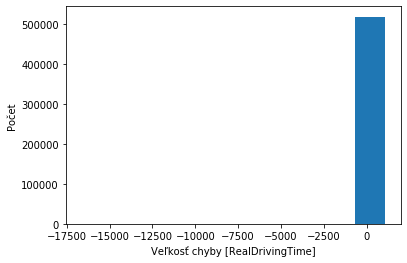

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 35.16 RealDrivingTime 
Testing set Mean Sqrt Error: 8978.55 RealDrivingTime 
Testing set Root Mean Sqrt Error: 94.76 RealDrivingTime 


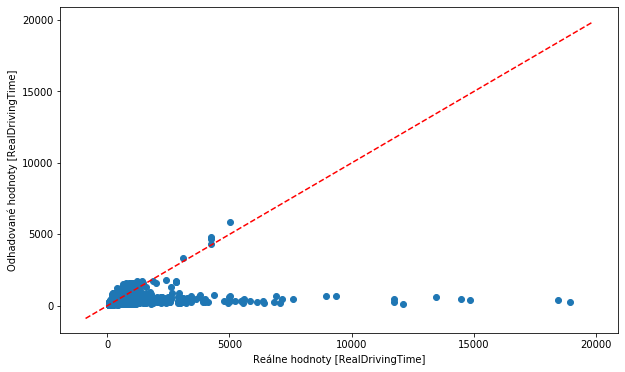

Najväčšia chyba:906.0115966796875
Najväčšia chyba v zápornom smere:-18638.474609375
% približne správnych odhadov: 0.958399515191752


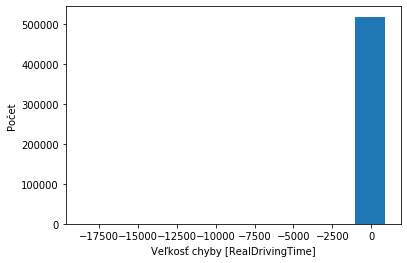

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 38.45 RealDrivingTime 
Testing set Mean Sqrt Error: 5009.26 RealDrivingTime 
Testing set Root Mean Sqrt Error: 70.78 RealDrivingTime 


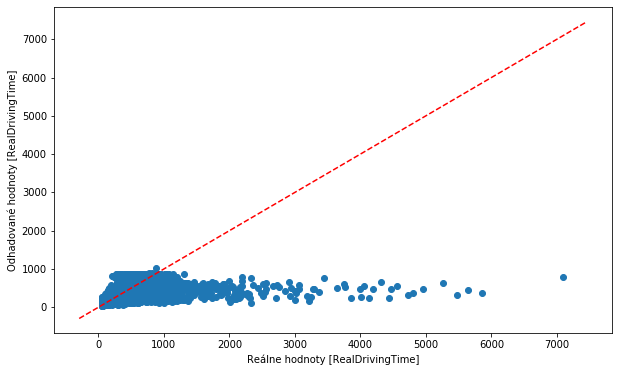

Najväčšia chyba:608.73583984375
Najväčšia chyba v zápornom smere:-6301.654296875
% približne správnych odhadov: 0.9531534094422937


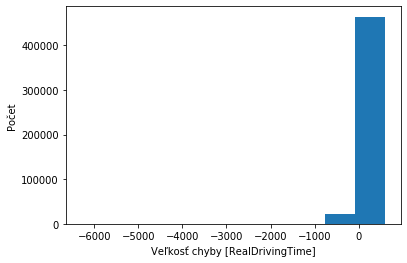

In [254]:
CreateAndFitModel("FILTER1", 0.001, 120, "New2FILTER1ModelDTTT",DTTTFILTER1,1,"64-64")

In [ ]:
CreateAndFitModel("FILTER2", 0.001, 120, "NewFILTER2ModelDTTT",DTTTFILTER2,1,"96-64-32-32")

In [ ]:
CreateAndFitModel("FILTER3", 0.001, 120, "NewFILTER3ModelDTTT",DTTTFILTER3,1,"96-64-32-32")

## Vyhodnotenie DTTT

### BASE
------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 57.89 RealDrivingTime 
Testing set Mean Sqrt Error: 319028.12 RealDrivingTime 
Testing set Root Mean Sqrt Error: 564.83 RealDrivingTime 

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 739.07 RealDrivingTime 
Testing set Mean Sqrt Error: 1906836.12 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1380.88 RealDrivingTime 

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 775.65 RealDrivingTime 
Testing set Mean Sqrt Error: 2018261.25 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1420.66 RealDrivingTime 

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 966.46 RealDrivingTime 
Testing set Mean Sqrt Error: 2584831.75 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1607.74 RealDrivingTime

### FILTER1

------Presnosť na BASE dátach-------- 
Testing set Mean Abs Error: 109.19 RealDrivingTime 
Testing set Mean Sqrt Error: 1572586.00 RealDrivingTime 
Testing set Root Mean Sqrt Error: 1254.03 RealDrivingTime 

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 35.40 RealDrivingTime 
Testing set Mean Sqrt Error: 24356.39 RealDrivingTime 
Testing set Root Mean Sqrt Error: 156.07 RealDrivingTime

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 36.45 RealDrivingTime 
Testing set Mean Sqrt Error: 24874.42 RealDrivingTime 
Testing set Root Mean Sqrt Error: 157.72 RealDrivingTime 

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 42.48 RealDrivingTime 
Testing set Mean Sqrt Error: 5116.78 RealDrivingTime 
Testing set Root Mean Sqrt Error: 71.53 RealDrivingTime 


# Kombinácia Seasons a TrainTypes = SETT

In [255]:
SETTBASE = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed',
            'LengthSect', 'SectIdx', 'DelayDeparture',
            'Jar','Leto','Jesen','Zima']

In [256]:
SETTFILTER1 = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed',
            'LengthSect', 'SectIdx', 'DelayDepartureReduced',
            'Jar','Leto','Jesen','Zima']
SETTFILTER2 = SETTFILTER1.copy()
SETTFILTER3 = SETTFILTER1.copy()

In [257]:
type = DFBASE['TrainType']
for typ in DFBASE.TrainType.unique():
    SETTBASE.append(typ)
    DFBASE[typ] = (type == typ)*1.0
    
type = DFFILTER1['TrainType']
for typ in DFFILTER1.TrainType.unique():
    SETTFILTER1.append(typ)
    DFFILTER1[typ] = (type == typ)*1.0

type = DFFILTER2['TrainType']
for typ in DFFILTER2.TrainType.unique():
    SETTFILTER2.append(typ)
    DFFILTER2[typ] = (type == typ)*1.0

type = DFFILTER3['TrainType']
for typ in DFFILTER3.TrainType.unique():
    SETTFILTER3.append(typ)
    DFFILTER3[typ] = (type == typ)*1.0

SETTBASE.append('RealDrivingTime')    
SETTFILTER1.append('RealDrivingTime')
SETTFILTER2.append('RealDrivingTime')
SETTFILTER3.append('RealDrivingTime')

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [258]:
type = DFBASE['Season']
for season in season_types:
    DFBASE[season] = (type == season)*1.0
    
type = DFFILTER1['Season']
for season in season_types:
    DFFILTER1[season] = (type == season)*1.0
    
type = DFFILTER2['Season']
for season in season_types:
    DFFILTER2[season] = (type == season)*1.0
    
type = DFFILTER3['Season']
for season in season_types:
    DFFILTER3[season] = (type == season)*1.0

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


In [499]:
#OSOBNE VLAKY
osobneJar = osobne[(osobne['Season'] == 'Jar')]
osobneLeto = osobne[(osobne['Season'] == 'Leto')]
osobneJesen = osobne[(osobne['Season'] == 'Jesen')]
osobneZima = osobne[(osobne['Season'] == 'Zima')]

#NAKLADNE VLAKY
nakladneJar = nakladne[(nakladne['Season'] == 'Jar')]
nakladneLeto = nakladne[(nakladne['Season'] == 'Leto')]
nakladneJesen = nakladne[(nakladne['Season'] == 'Jesen')]
nakladneZima = nakladne[(nakladne['Season'] == 'Zima')]

#OSTATNE VLAKY
ostatneJar = ostatne[(ostatne['Season'] == 'Jar')]
ostatneLeto = ostatne[(ostatne['Season'] == 'Leto')]
ostatneJesen = ostatne[(ostatne['Season'] == 'Jesen')]
ostatneZima = ostatne[(ostatne['Season'] == 'Zima')]

In [500]:
print(len(osobneJar))
print(len(osobneLeto ))
print(len(osobneJesen))
print(len(osobneZima))
#NAKLADNE VLAKY
print(len(nakladneJar ))
print(len(nakladneLeto))
print(len(nakladneJesen ))
print(len(nakladneZima))

#OSTATNE VLAKY
print(len(ostatneJar))
print(len(ostatneLeto))
print(len(ostatneJesen))
print(len(ostatneZima))

437378
509172
473883
325800
270145
308891
286554
189040
46203
54939
54073
33452


In [ ]:
CreateAndFitModel("BASE", 0.0001, 120, "NewBASEModelSETT", SETTBASE)

In [ ]:
CreateAndFitModel("FILTER1", 0.001, 120, "New6FILTER1ModelSETT",SETTFILTER1,1,"96-64-64-32-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 24)
Veľkosť testovacej množniy: (518160, 24)

....................
....................
.............

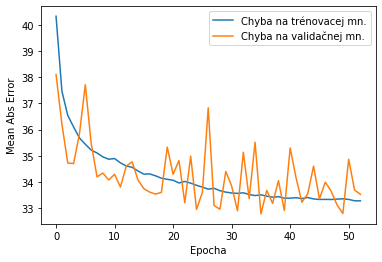

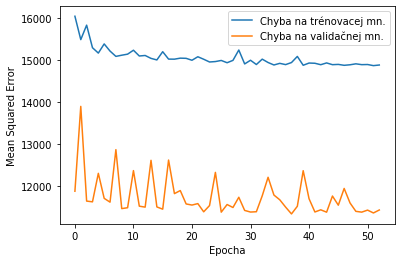

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.68 RealDrivingTime 
Testing set Mean Sqrt Error: 6965.21 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.46 RealDrivingTime 


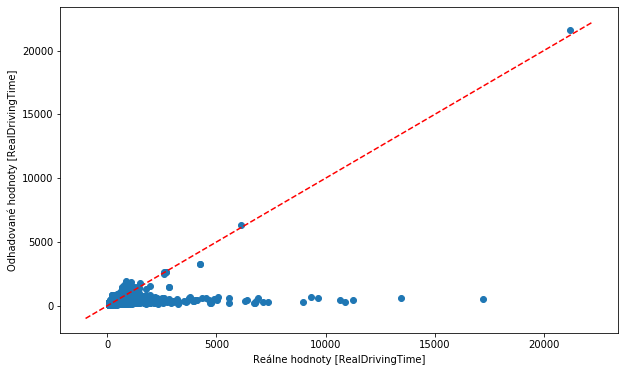

Najväčšia chyba:1089.8499755859375
Najväčšia chyba v zápornom smere:-16657.576171875
% približne správnych odhadov: 0.9624922803767176


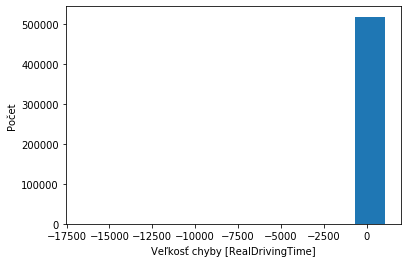

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 33.86 RealDrivingTime 
Testing set Mean Sqrt Error: 8885.97 RealDrivingTime 
Testing set Root Mean Sqrt Error: 94.27 RealDrivingTime 


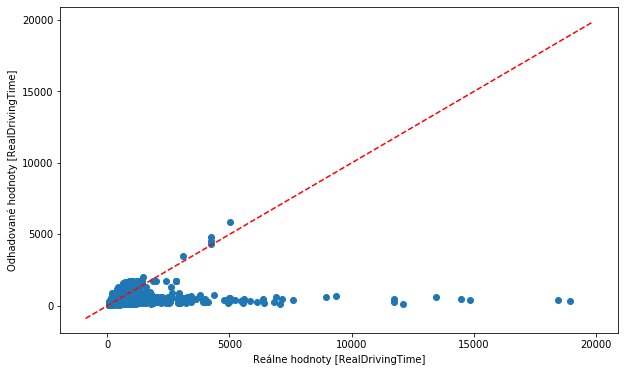

Najväčšia chyba:929.5762939453125
Najväčšia chyba v zápornom smere:-18587.224609375
% približne správnych odhadov: 0.9608100466473541


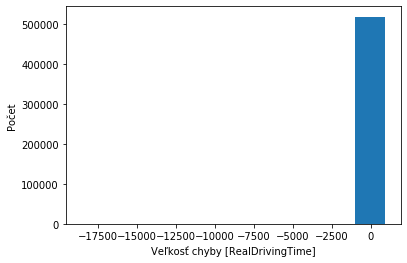

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 36.95 RealDrivingTime 
Testing set Mean Sqrt Error: 4847.57 RealDrivingTime 
Testing set Root Mean Sqrt Error: 69.62 RealDrivingTime 


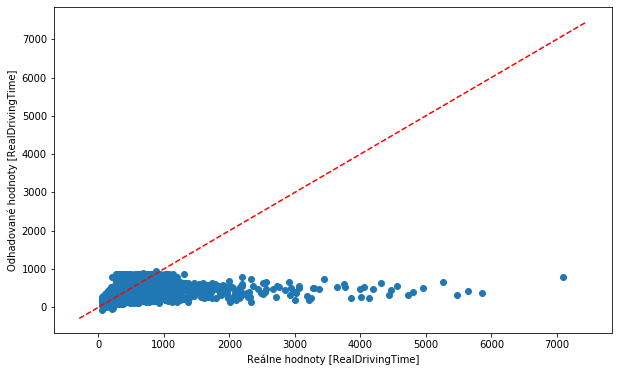

Najväčšia chyba:599.3468017578125
Najväčšia chyba v zápornom smere:-6304.3046875
% približne správnych odhadov: 0.95622085616396


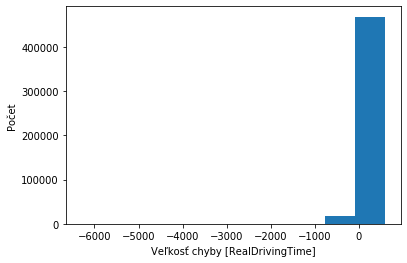

In [259]:
CreateAndFitModel("FILTER1", 0.001, 120, "New4FILTER1ModelSETT",SETTFILTER1,1,"96-64-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 24)
Veľkosť testovacej množniy: (518160, 24)

....................
....................
....................
..............

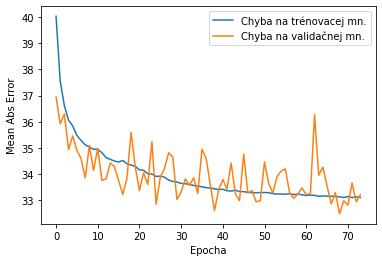

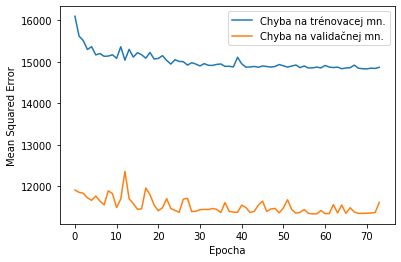

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 32.73 RealDrivingTime 
Testing set Mean Sqrt Error: 6974.73 RealDrivingTime 
Testing set Root Mean Sqrt Error: 83.51 RealDrivingTime 


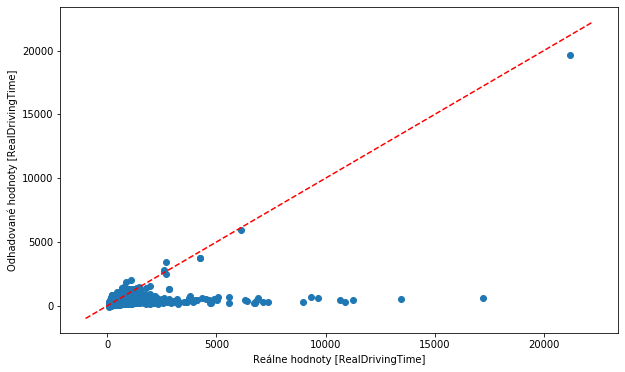

Najväčšia chyba:977.564697265625
Najväčšia chyba v zápornom smere:-16619.826171875
% približne správnych odhadov: 0.9616276825690906


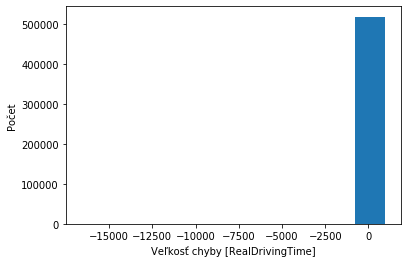

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 34.59 RealDrivingTime 
Testing set Mean Sqrt Error: 8934.69 RealDrivingTime 
Testing set Root Mean Sqrt Error: 94.52 RealDrivingTime 


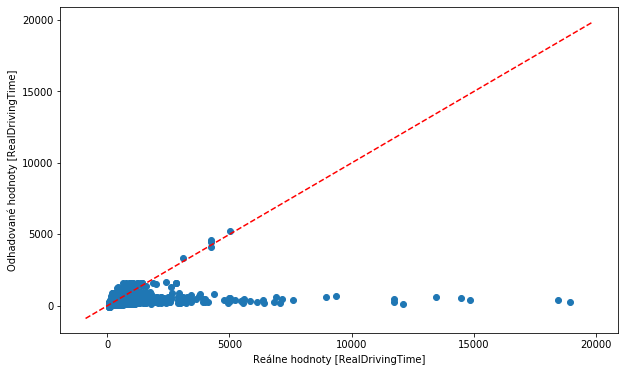

Najväčšia chyba:939.3427734375
Najväčšia chyba v zápornom smere:-18620.85546875
% približne správnych odhadov: 0.9589669261188514


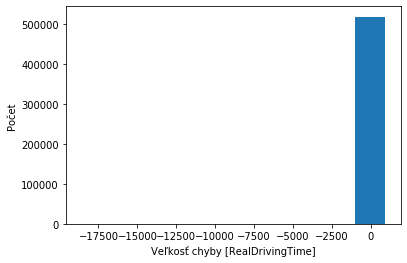

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 39.48 RealDrivingTime 
Testing set Mean Sqrt Error: 5097.79 RealDrivingTime 
Testing set Root Mean Sqrt Error: 71.40 RealDrivingTime 


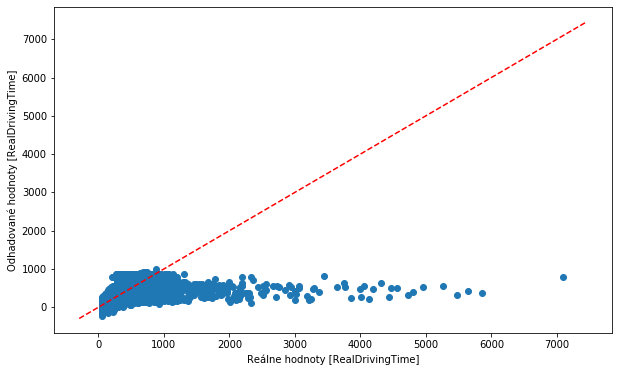

Najväčšia chyba:612.8653564453125
Najväčšia chyba v zápornom smere:-6302.34375
% približne správnych odhadov: 0.9527019505497903


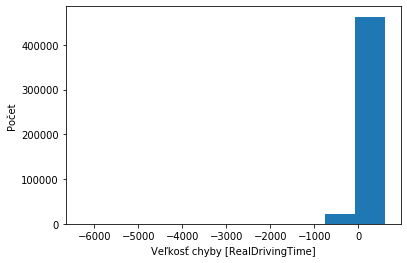

In [260]:
CreateAndFitModel("FILTER1", 0.001, 120, "New3FILTER1ModelSETT",SETTFILTER1,1,"128-64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 24)
Veľkosť testovacej množniy: (518160, 24)

....................
.........

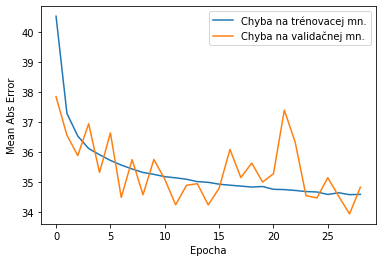

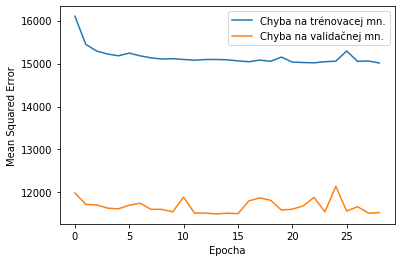

------Presnosť na FILTER1 dátach-------- 
Testing set Mean Abs Error: 34.47 RealDrivingTime 
Testing set Mean Sqrt Error: 7118.66 RealDrivingTime 
Testing set Root Mean Sqrt Error: 84.37 RealDrivingTime 


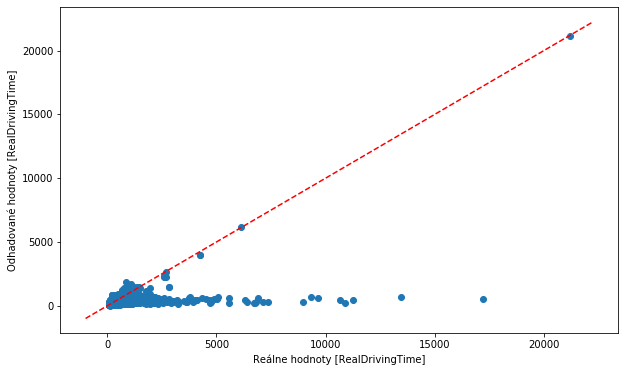

Najväčšia chyba:1017.566650390625
Najväčšia chyba v zápornom smere:-16670.240234375
% približne správnych odhadov: 0.9603635942566002


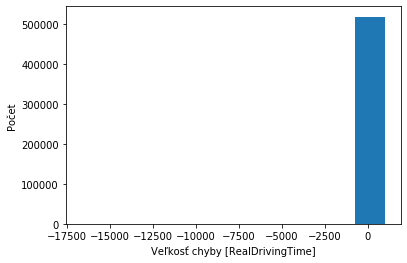

------Presnosť na FILTER2 dátach-------- 
Testing set Mean Abs Error: 35.54 RealDrivingTime 
Testing set Mean Sqrt Error: 9072.93 RealDrivingTime 
Testing set Root Mean Sqrt Error: 95.25 RealDrivingTime 


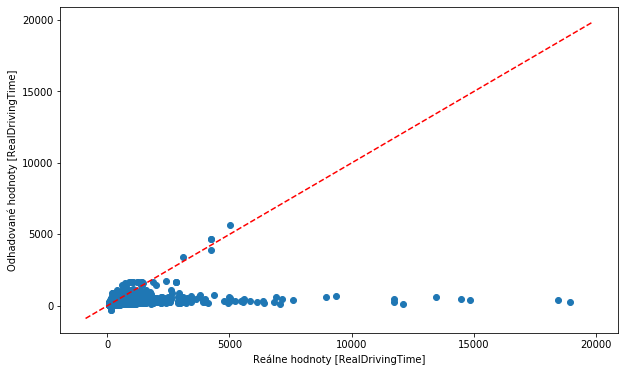

Najväčšia chyba:872.547607421875
Najväčšia chyba v zápornom smere:-18634.322265625
% približne správnych odhadov: 0.9583609158089562


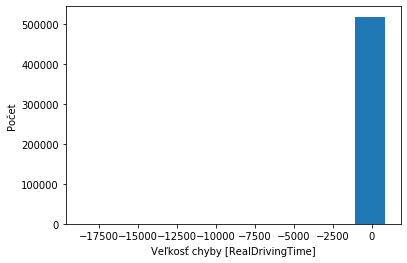

------Presnosť na FILTER3 dátach-------- 
Testing set Mean Abs Error: 38.20 RealDrivingTime 
Testing set Mean Sqrt Error: 5053.16 RealDrivingTime 
Testing set Root Mean Sqrt Error: 71.09 RealDrivingTime 


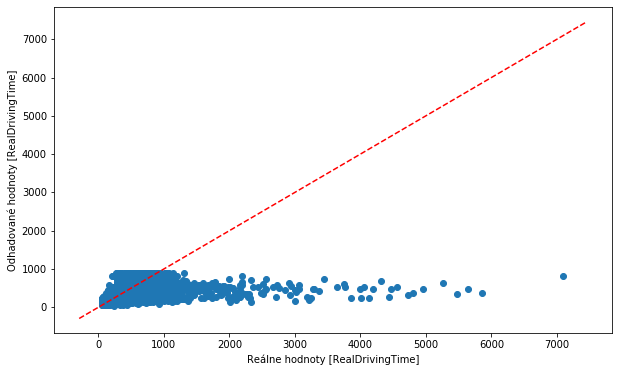

Najväčšia chyba:621.7476806640625
Najväčšia chyba v zápornom smere:-6285.958984375
% približne správnych odhadov: 0.9517846025718727


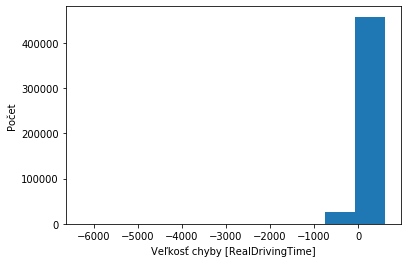

In [261]:
CreateAndFitModel("FILTER1", 0.001, 120, "New2FILTER1ModelSETT",SETTFILTER1,1,"64-64")

In [ ]:
CreateAndFitModel("FILTER2", 0.001, 120, "NewFILTER2ModelSETT",SETTFILTER2)

In [ ]:
CreateAndFitModel("FILTER3", 0.0001, 120, "NewFILTER3ModelSETT",SETTFILTER3)

# Úvaha
Uvedomujem si, že nejväčším vplyvom na reálnu jazdnú dobu má práve plánovaná doba trasy, keďže v ideálnom prípade, sa reálna jazdná doba zhoduje s plánovanou. Vtedy môže nastať situácia, že model bude odhadovať jazdnú dobu iba tým, že vyhlási, že úsek nemá žiadne meškanie, a štatistiky modelu by preukázali, že tento model nieje veľmi nepresný. Preto ak chcem skúmať vplyv vlastností ako ročné obdobie, alebo obdobie dňa tak sa musím sledovať inú premennú. Na začiatok by sme mali sledovať vplyv vlastností na meškanie, ktoré vypočítame ako RealDrivingTime - PlanDrivingTime. Už teraz tuším, že najväčší vplyv na veľkosť meškania bude mať časová dĺžka trasy, pretože na dhlších tratiach sa meškania akumulujú rýchlejšie. Preto našu sledovanú premennú uvediem ako pomer meškania k časovej dĺžke trasy. Pri vypočítaní týchto meškaní potom jednoducho získame jazdné doby vynásobením premennou PlanDrivingTime a jej pripočítaním. 

- DelayDiff = Rozdiel medzi reálnym trvaním trasy a plánovaným trvaním trasy
    - DelayDiff = RealDrivingTime - PlanDrivingTime
- DelayDiffPercent = podiel meškania ku plánovanému časovému trvaniu trasy
    - DelayDiffPercent = DelayDiff / PlanDrivingTime

In [262]:
def getDrivingTime(a,b):  
    return a * b + b

# Test 1 Alternatíva skúmanie vplyvu parametrov vlaku na jeho meškanie v pomere k plánovanému trvaniu trasy

In [296]:
test1Alt = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed',
            'LengthSect', 'SectIdx', 'DelayDeparture',
            'DelayDiffPercent']
test1AltFILTER = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed',
            'LengthSect', 'SectIdx', 'DelayDepartureReduced',
            'DelayDiffPercent']
test1AltFILTERNoDelay = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed',
            'LengthSect', 'SectIdx',
            'DelayDiffPercent']

In [264]:
label = test1AltFILTER[-1]

koreláčná matica ukazuje veľmi malý lineárny vplyv atribútov na meškanie.

In [265]:
print(test1AltFILTER)
cor = DFFILTER1[test1AltFILTER].corr()
print(cor[label].sort_values(ascending=False))

['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'Speed', 'LengthSect', 'SectIdx', 'DelayDepartureReduced', 'DelayDiffPercent']
DelayDiffPercent         1.000000
Speed                    0.070299
CarCount                 0.052344
AxisCount                0.051627
Weight                   0.049759
Length                   0.045038
LengthSect              -0.031641
DelayDepartureReduced   -0.035442
SectIdx                 -0.048219
PlanDrivingTime         -0.078651
Name: DelayDiffPercent, dtype: float64


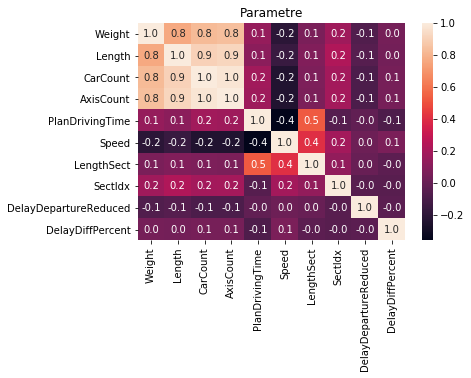

In [266]:
plt.title("Parametre")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

In [295]:
import math
def eval_Model_Percent(filter_type, testModel, attribute_list, margin):
    
    if filter_type == "BASE":
        dfCut = DFBASE[attribute_list]
    elif filter_type == "FILTER1":
        dfCut = DFFILTER1[attribute_list]
    elif filter_type == "FILTER2":
        dfCut = DFFILTER2[attribute_list]
    elif filter_type == "FILTER3":
        dfCut = DFFILTER3[attribute_list]
    else:
        print("ERROR")
        return
    
    label = attribute_list[-1]
    
    train_dataset = dfCut.sample(frac=0.8, random_state=0)
    test_dataset = dfCut.drop(train_dataset.index)

    train_labels = train_dataset.pop(label)
    test_labels = test_dataset.pop(label)

    train_stats = train_dataset.describe()
    train_stats = train_stats.transpose() 

    normed_train_data = (train_dataset-train_stats['mean']) / train_stats['std']
    normed_test_data = (test_dataset-train_stats['mean']) / train_stats['std']
    
    # -------------PREDIKCIE--------------------------
    predictions = testModel.predict(normed_test_data).flatten()
    
    predictions = getDrivingTime(predictions,test_dataset['PlanDrivingTime'])
    test_labels = getDrivingTime(test_labels,test_dataset['PlanDrivingTime'])

    # -------------ERRORS - chyby--------------------- 
    error = predictions - test_labels
    print("PRESNOST NA " + filter_type + " dátach:")
    
    # mae
    mae = sum(abs(error)) / len(error)
    print("MAE:")
    print(mae)
    # mse, loss 
    mse = sum(np.square(error)) / len(error)
    print("MSE:")
    print(mse)
    # RMSE 
    rmse = math.sqrt(mse)
    print("RMSE:")  
    print(rmse)
    
    f, ax = plt.subplots(figsize=(10, 6))
    ax.scatter(test_labels, predictions)
    plt.xlabel('Reálne hodnoty [' + label + ']')
    plt.ylabel('Odhadované hodnoty [' + label + ']')
    
    ax.plot(ax.get_xlim(), ax.get_xlim(), ls="--", c="r")
    plt.show()
    

    print("Najväčšia chyba:" + str(max(error)))
    print("Najväčšia chyba v zápornom smere:" + str(min(error)))

    smallErrors = error[abs(error) < margin] 
    bigErrors = error[abs(error) > 10000] 
    print("% približne správnych odhadov: " + str(len(smallErrors)/len(error)))

    plt.hist(error)
    plt.xlabel('Veľkosť chyby ['+label+']')
    plt.ylabel("Počet")
    plt.show()

In [274]:
def CreateAndFitModelPercent(filter_type,learning_rate, margin, name, attributes_list, noBase = 0,topo="64-64"):       
    if filter_type == "BASE":
        dfCut = DFBASE[attributes_list]
    elif filter_type == "FILTER1":
        dfCut = DFFILTER1[attributes_list]
    elif filter_type == "FILTER2":
        dfCut = DFFILTER2[attributes_list]
    elif filter_type == "FILTER3":
        dfCut = DFFILTER3[attributes_list]
    else:
        print("ERROR")
        return
    label = attributes_list[-1]
    
    train_dataset = dfCut.sample(frac=0.8, random_state=0)
    test_dataset = dfCut.drop(train_dataset.index)

    train_labels = train_dataset.pop(label)
    test_labels = test_dataset.pop(label)

    print("-----------------------------" + filter_type + "---------------------------------")
    print("Veľkosť trénovacej množniy: " + str(train_dataset.shape))
    print("Veľkosť testovacej množniy: " + str(test_dataset.shape))

    train_stats = train_dataset.describe()
    train_stats = train_stats.transpose() 
    
    normed_train_data = (train_dataset-train_stats['mean']) / train_stats['std']
    normed_test_data = (test_dataset-train_stats['mean']) / train_stats['std']
    
    #tvorba modelu
    if topo == "128-64-64" :
        # 3 vrstvy
        testModel = keras.Sequential([
            layers.Dense(128, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    elif topo == "96-64-32-32":
        # 4 vrstvy
        testModel = keras.Sequential([
            layers.Dense(96, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    elif topo == "96-64-64-32-32-32":
        # 6 vrstiev
        testModel = keras.Sequential([
            layers.Dense(96, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(32, activation=tf.nn.relu),
            layers.Dense(1)
        ])
    else :
        # 2 vrstvy
        testModel = keras.Sequential([
            layers.Dense(64, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
            layers.Dense(64, activation=tf.nn.relu),
            layers.Dense(1)
        ])

    optimizer = tf.keras.optimizers.Adam(learning_rate)

    testModel.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=['mae','mse'])
    
    testModelHistory = testModel.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop,save_best_model(name + ".h5"), PrintDot()])
    
    testModel = load_model(name + ".h5")
        
    plot_history(testModelHistory)
    
    if noBase == 0:
        eval_Model_Percent("BASE", testModel, attributes_list, margin)
    eval_Model_Percent("FILTER1", testModel, attributes_list, margin)
    eval_Model_Percent("FILTER2", testModel, attributes_list, margin)
    eval_Model_Percent("FILTER3", testModel, attributes_list, margin)

In [ ]:
CreateAndFitModelPercent("BASE",0.001, 120, "NewBASEDelayDiffModel", test1Alt,0,topo="64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 9)
Veľkosť testovacej množniy: (518160, 9)

....................
....................
.......

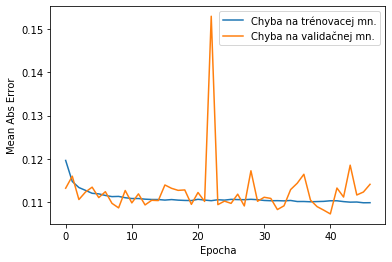

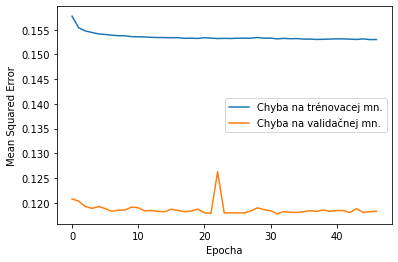

MAE:
33.606930636122804
MSE:
7077.265480910926
RMSE:
84.12648501459529


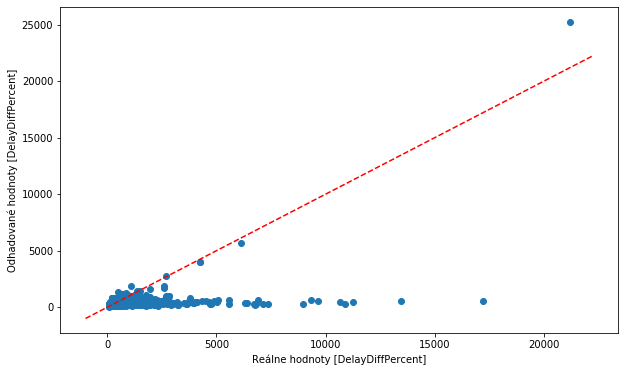

Najväčšia chyba:4047.84765625
Najväčšia chyba v zápornom smere:-16661.21661376953
% približne správnych odhadov: 0.9611066079975297


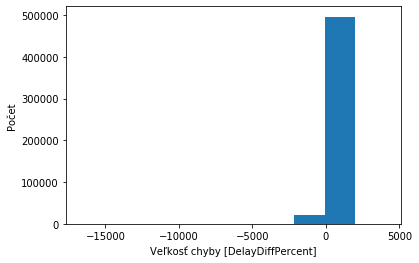

MAE:
34.102691775298524
MSE:
8934.946281015316
RMSE:
94.52484478175734


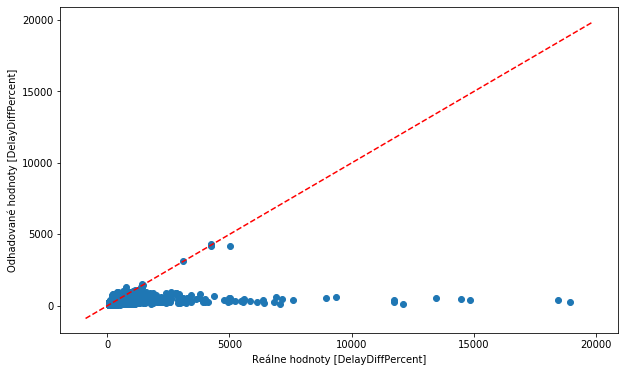

Najväčšia chyba:623.2736206054688
Najväčšia chyba v zápornom smere:-18625.06069946289
% približne správnych odhadov: 0.9611613010307966


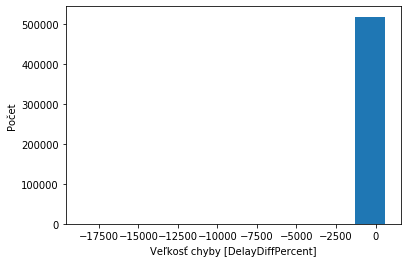

MAE:
33.29874479747118
MSE:
4651.378733353835
RMSE:
68.20101709911543


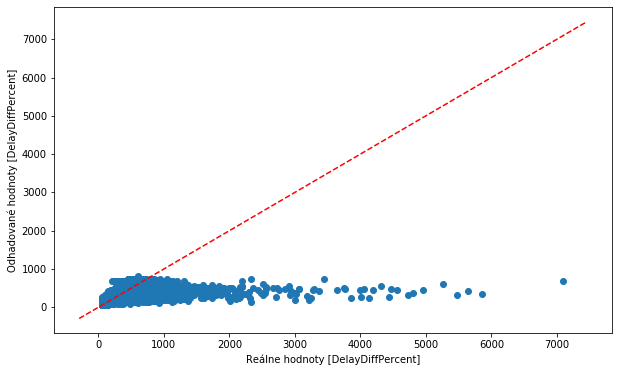

Najväčšia chyba:472.7139892578125
Najväčšia chyba v zápornom smere:-6413.8492431640625
% približne správnych odhadov: 0.9638399980210021


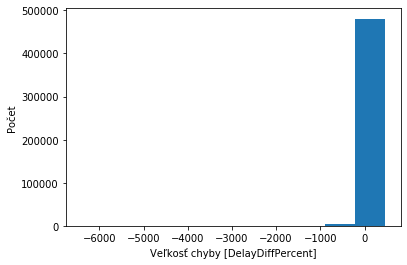

In [280]:
CreateAndFitModelPercent("FILTER1",0.001, 120, "New6FILTER1DelayDiffModel", test1AltFILTER,1,topo="96-64-64-32-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 9)
Veľkosť testovacej množniy: (518160, 9)

....................
....................
...........

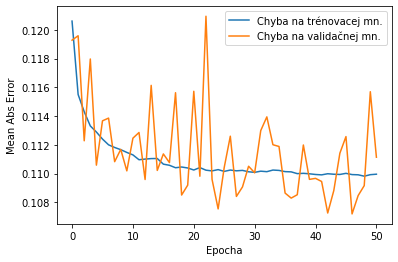

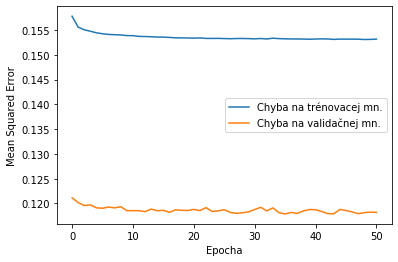

NameError: name 'attribute_list' is not defined

In [270]:
CreateAndFitModelPercent("FILTER1",0.001, 120, "New4FILTER1DelayDiffModel", test1AltFILTER,1,topo="96-64-32-32")

MAE:
32.87513822206877
MSE:
7144.186074498788
RMSE:
84.52328717281875


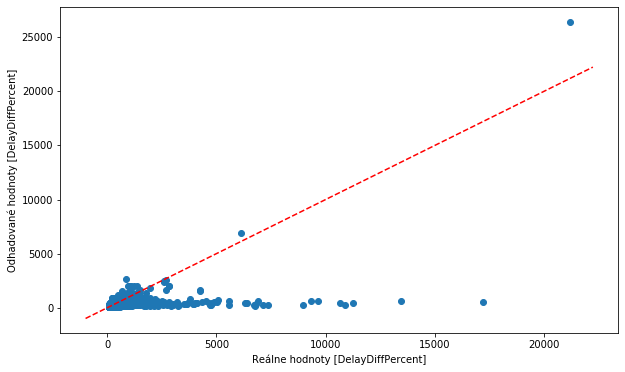

Najväčšia chyba:5230.31640625
Najväčšia chyba v zápornom smere:-16663.473083496094
% približne správnych odhadov: 0.9595935618341825


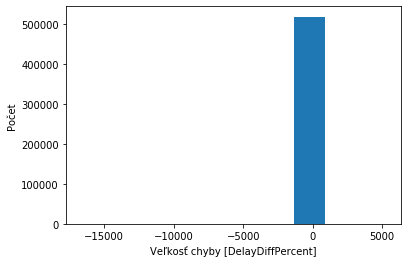

In [279]:
testModel = load_model("New4FILTER1DelayDiffModel.h5")
eval_Model_Percent("FILTER1", testModel, test1AltFILTER, 120)

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 9)
Veľkosť testovacej množniy: (518160, 9)

....................
....................

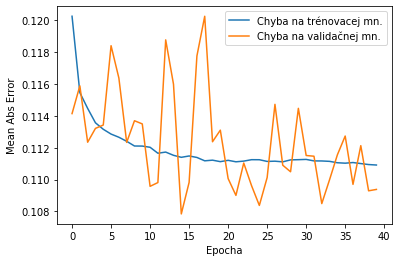

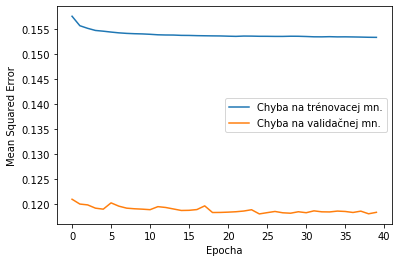

MAE:
32.91348431090873
MSE:
7097.615708632816
RMSE:
84.24734837745824


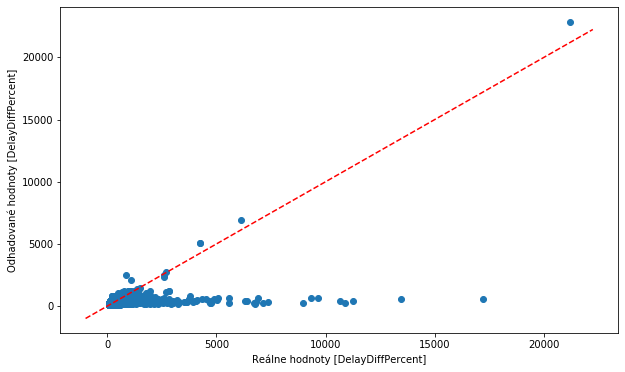

Najväčšia chyba:1660.814453125
Najväčšia chyba v zápornom smere:-16660.311157226562
% približne správnych odhadov: 0.9596283001389532


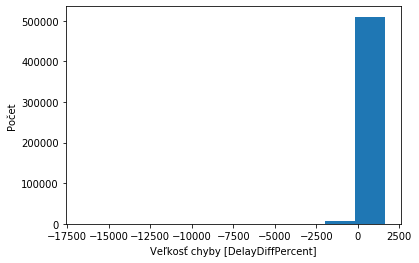

MAE:
34.60969320059186
MSE:
9177.116547709995
RMSE:
95.79726795535453


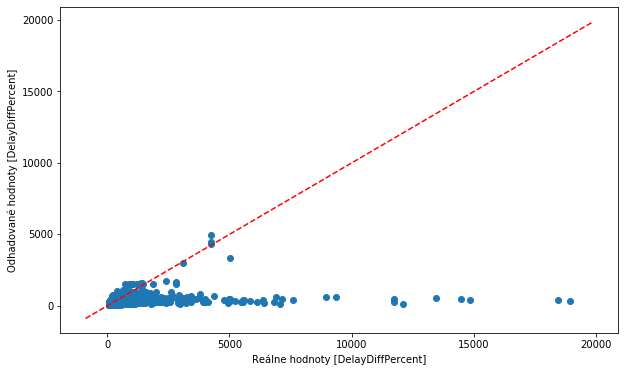

Najväčšia chyba:789.9598388671875
Najväčšia chyba v zápornom smere:-18611.955993652344
% približne správnych odhadov: 0.9532735171564607


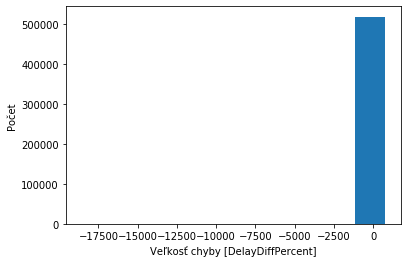

MAE:
33.0839329727537
MSE:
4753.732392834818
RMSE:
68.94731606694214


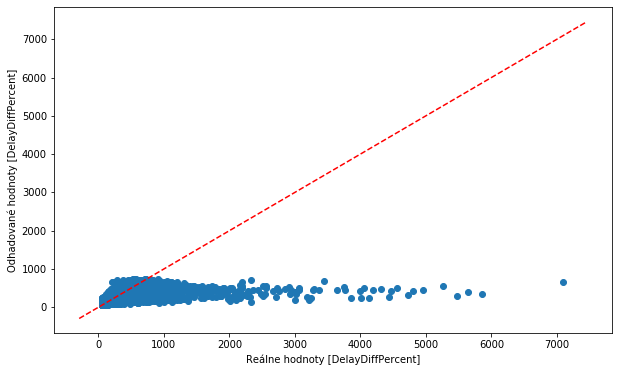

Najväčšia chyba:462.0311279296875
Najväčšia chyba v zápornom smere:-6424.624084472656
% približne správnych odhadov: 0.9613394517351276


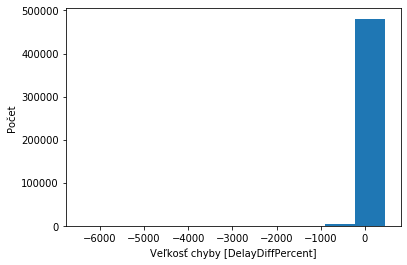

In [281]:
CreateAndFitModelPercent("FILTER1",0.001, 120, "New3FILTER1DelayDiffModel", test1AltFILTER,1,topo="128-64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 8)
Veľkosť testovacej množniy: (518160, 8)

....................
....................
...................

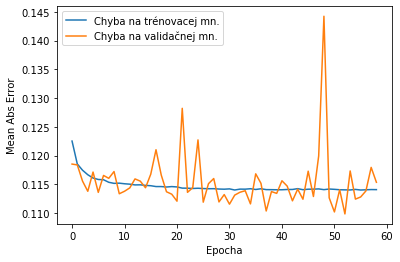

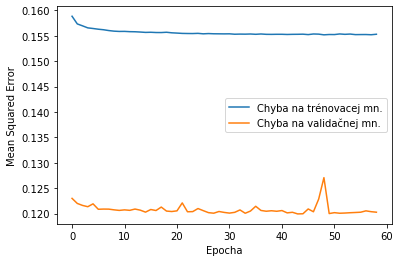

PRESNOST NA FILTER1 dátach:
MAE:
34.59829644865325
MSE:
7293.92026787345
RMSE:
85.40445110106059


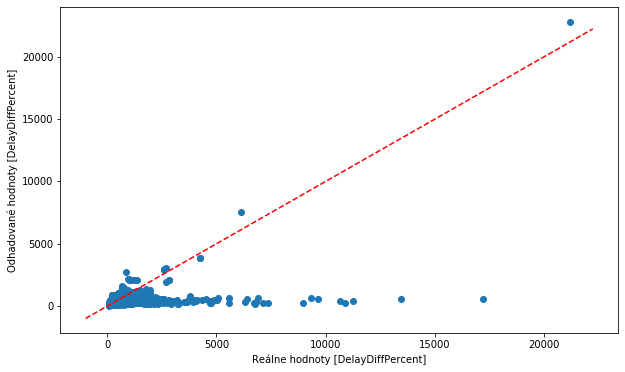

Najväčšia chyba:1875.675537109375
Najväčšia chyba v zápornom smere:-16665.520080566406
% približne správnych odhadov: 0.957924193299367


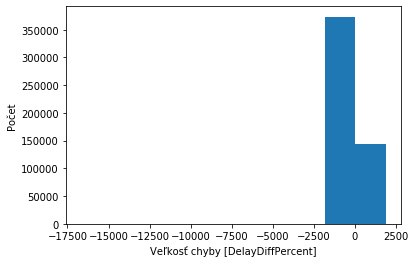

PRESNOST NA FILTER2 dátach:
MAE:
35.169328936383515
MSE:
9183.818201884102
RMSE:
95.83223988765003


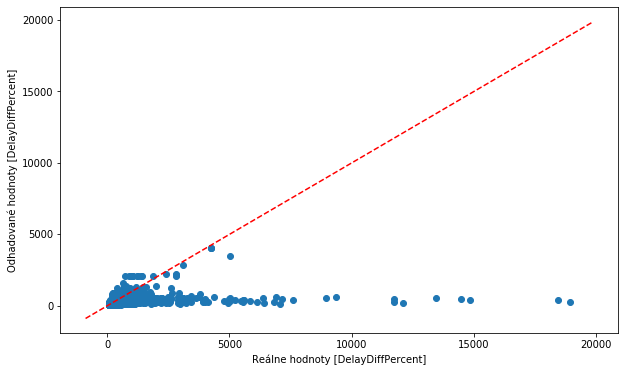

Najväčšia chyba:1322.47509765625
Najväčšia chyba v zápornom smere:-18616.674407958984
% približne správnych odhadov: 0.9574403205292747


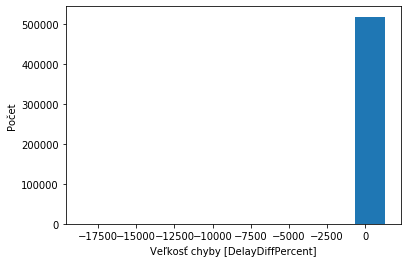

PRESNOST NA FILTER3 dátach:
MAE:
34.67174625530021
MSE:
4899.888096940326
RMSE:
69.99920068786733


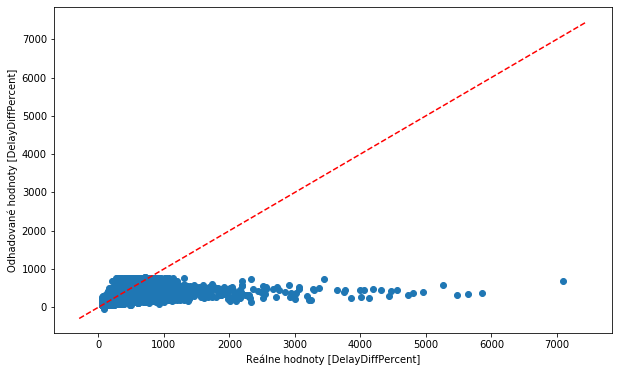

Najväčšia chyba:503.23077392578125
Najväčšia chyba v zápornom smere:-6413.4522705078125
% približne správnych odhadov: 0.9608447022638911


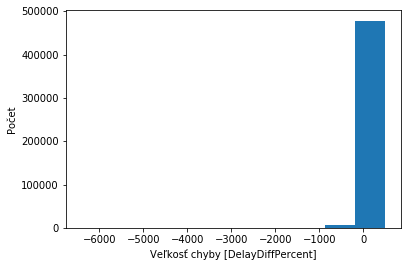

In [297]:
CreateAndFitModelPercent("FILTER1",0.001, 120, "New3FILTER1DelayDiffModelNODtest1AltFILTERtFILTERNoDelay,1,topo="128-64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 9)
Veľkosť testovacej množniy: (518160, 9)

....................
....................
.............

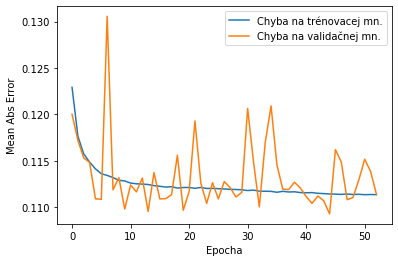

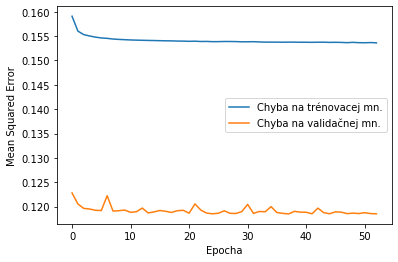

MAE:
34.05544362326583
MSE:
7150.246620511288
RMSE:
84.5591309115183


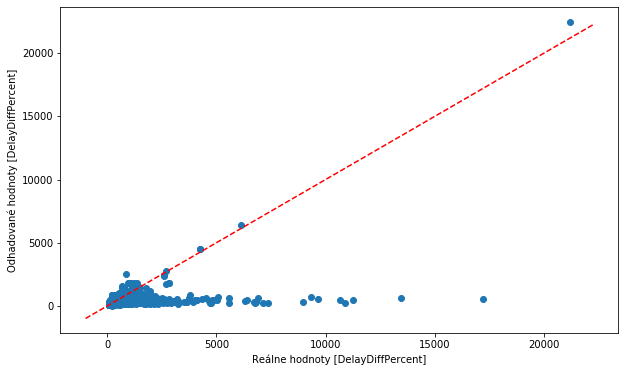

Najväčšia chyba:1668.83740234375
Najväčšia chyba v zápornom smere:-16657.990600585938
% približne správnych odhadov: 0.958798440636097


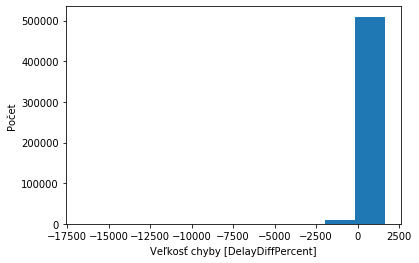

MAE:
34.40720055600681
MSE:
9038.914642559115
RMSE:
95.07320675436964


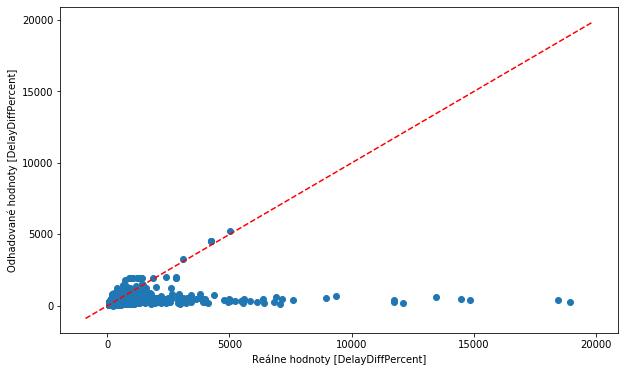

Najväčšia chyba:1065.0523681640625
Najväčšia chyba v zápornom smere:-18630.66339111328
% približne správnych odhadov: 0.9587700692665925


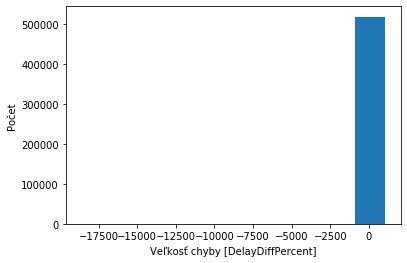

MAE:
34.14497231448847
MSE:
4797.646581175558
RMSE:
69.26504588301056


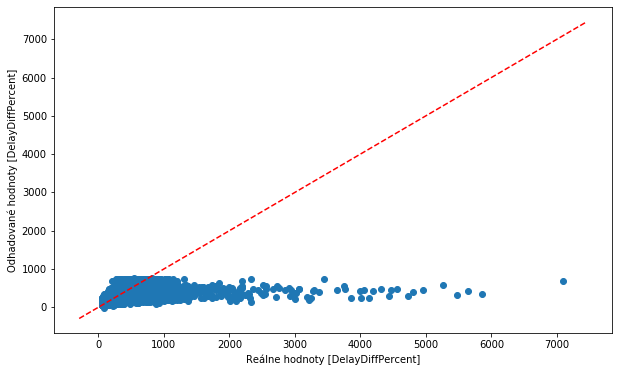

Najväčšia chyba:479.9619140625
Najväčšia chyba v zápornom smere:-6408.665100097656
% približne správnych odhadov: 0.9612734851389627


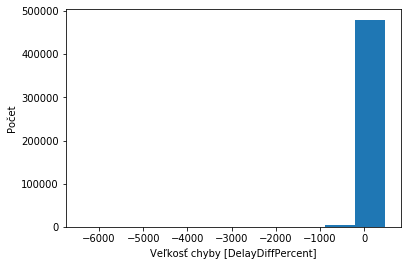

In [282]:
CreateAndFitModelPercent("FILTER1",0.001, 120, "New2FILTER1DelayDiffModel", test1AltFILTER,1,topo="64-64")

In [ ]:
CreateAndFitModelPercent("FILTER2",0.001, 120, "NewFILTER2DelayDiffModel", test1AltFILTER,1)

In [ ]:
CreateAndFitModelPercent("FILTER3",0.001, 120, "NewFILTER3DelayDiffModel", test1AltFILTER,1)

# Test 2 Alternatíva - skúmanie vplyvu typu vlaku na percento meškania


In [283]:
test2AltBASE = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 
            'Speed','LengthSect', 'SectIdx']
test2AltFILTER1 = test2AltBASE.copy()
test2AltFILTER2 = test2AltBASE.copy()
test2AltFILTER3 = test2AltBASE.copy()

In [284]:
label = 'DelayDiffPercent'

Vidím, že teraz majú jednotlivé typy nižšiu koreláciu, čo je však v poriadku. V predošlých pokusoch vyššia korelácia znamenala, že isté typy vlakov majú dlhšie reálne jazdné doby, čo môže znamenať to, že aj ich plánované jazdné doby sú dlhé. Napríklad nákladné vlaky a rýchliky ukazovali vyššiu koreláciu, pretože nákladné vlaky jazdia často dlhé trate bez zastávok, zatiaľ čo rýchliky sú rýchlejšie a majú v trase mnoho zastávok. Teraz model ukazuje vplyv typu vlaku na meškanie a vidím, že nákladné vlaky na svojej trase viac meškajú ako iné vlaky. Naopak rýchliky a expresy málokedy meškajú.

In [285]:
type = DFBASE['TrainType']
for typ in DFBASE.TrainType.unique():
    test2AltBASE.append(typ)
    DFBASE[typ] = (type == typ)*1.0

type = DFFILTER1['TrainType']
for typ in DFFILTER1.TrainType.unique():
    test2AltFILTER1.append(typ)
    DFFILTER1[typ] = (type == typ)*1.0    

type = DFFILTER2['TrainType']
for typ in DFFILTER2.TrainType.unique():
    test2AltFILTER2.append(typ)
    DFFILTER2[typ] = (type == typ)*1.0
    
type = DFFILTER3['TrainType']
for typ in DFFILTER3.TrainType.unique():
    test2AltFILTER3.append(typ)
    DFFILTER3[typ] = (type == typ)*1.0
    
test2AltBASE.append('DelayDiffPercent')
test2AltFILTER1.append('DelayDiffPercent')
test2AltFILTER2.append('DelayDiffPercent')
test2AltFILTER3.append('DelayDiffPercent')

D:\Programs\Anaconda\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [288]:
cor_vlastnosti = DFFILTER1.TrainType.unique()
cor_vlastnosti= np.append(cor_vlastnosti,[label])
print(cor_vlastnosti)

cor = DFFILTER1[cor_vlastnosti].corr()
print(cor[label].sort_values(ascending=False))

['Ex' 'Pn' 'Os' 'R' 'Nex' 'Sp' 'Sv' 'Mn' 'Lv' 'Sluz' 'Vlec'
 'DelayDiffPercent']
DelayDiffPercent    1.000000
Pn                  0.048512
Os                  0.010160
Lv                  0.005213
Nex                 0.004201
Sluz               -0.001477
Sv                 -0.002801
Sp                 -0.004051
Mn                 -0.009891
Vlec               -0.016570
Ex                 -0.029914
R                  -0.035268
Name: DelayDiffPercent, dtype: float64


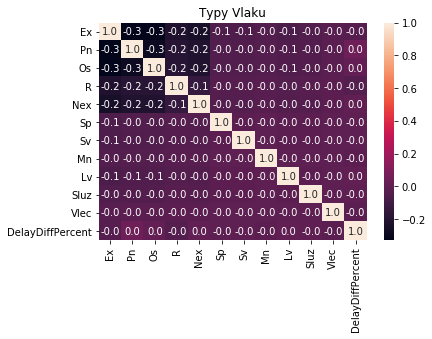

In [289]:
plt.title("Typy Vlaku")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

In [ ]:
CreateAndFitModelPercent("BASE",0.001, 120, "NewBASEDelayDiffModelTEST2", test2AltBASE,0,topo="64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 19)
Veľkosť testovacej množniy: (518160, 19)

....................
....................
.......

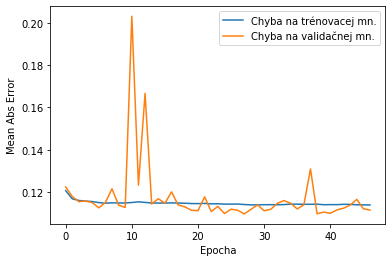

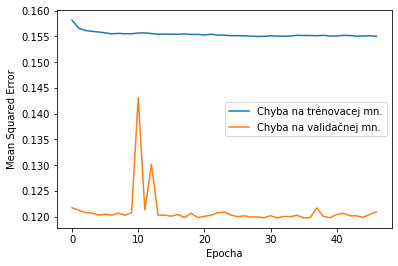

MAE:
33.75161658196201
MSE:
7346.906990043977
RMSE:
85.71410029886552


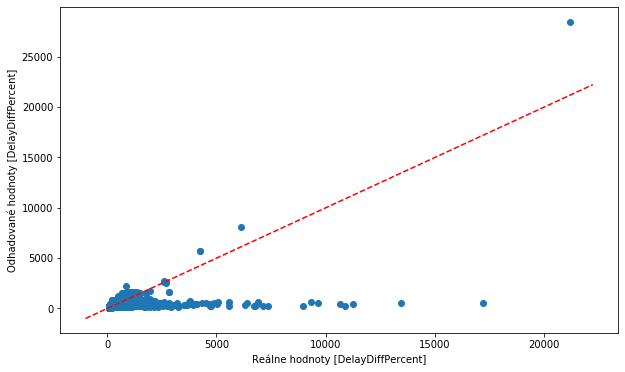

Najväčšia chyba:7283.0625
Najväčšia chyba v zápornom smere:-16648.9697265625
% približne správnych odhadov: 0.9585282538212135


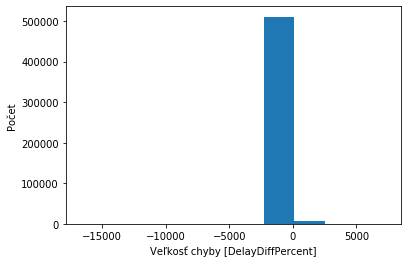

MAE:
34.345568974401765
MSE:
9147.491847808036
RMSE:
95.64252112846061


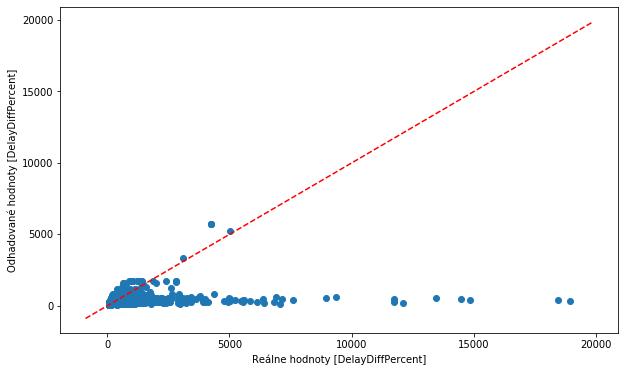

Najväčšia chyba:1464.865234375
Najväčšia chyba v zápornom smere:-18598.186553955078
% približne správnych odhadov: 0.9572897829363708


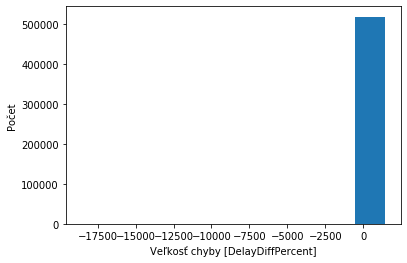

MAE:
34.142094358894425
MSE:
4982.541462148967
RMSE:
70.58711966179784


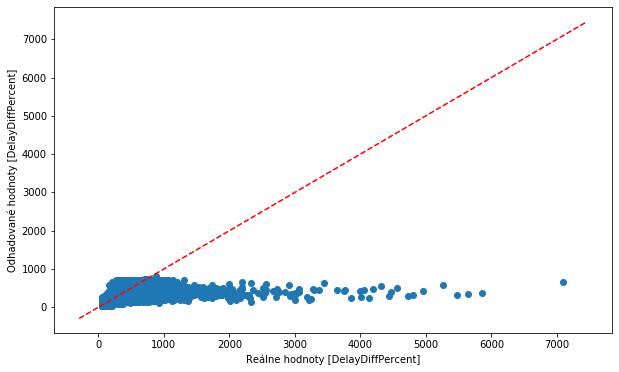

Najväčšia chyba:454.59478759765625
Najväčšia chyba v zápornom smere:-6432.607116699219
% približne správnych odhadov: 0.9575030818769146


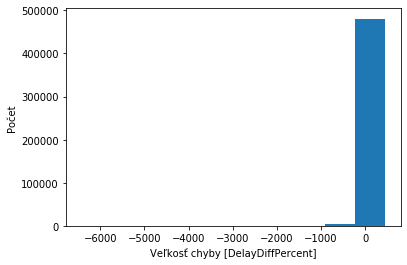

In [291]:
CreateAndFitModelPercent("FILTER1",0.001, 120, "New6FILTER1DelayDiffModelTEST2", test2AltFILTER1,1,topo="96-64-64-32-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 19)
Veľkosť testovacej množniy: (518160, 19)

....................
....................
....................

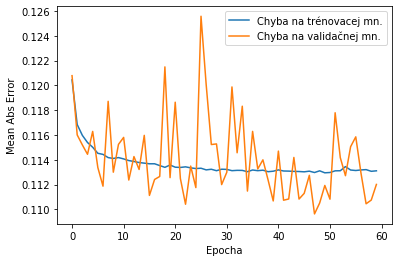

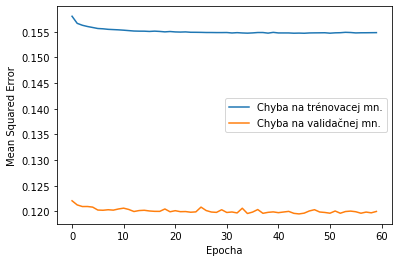

MAE:
33.49807282770713
MSE:
7204.967574311503
RMSE:
84.88208040753656


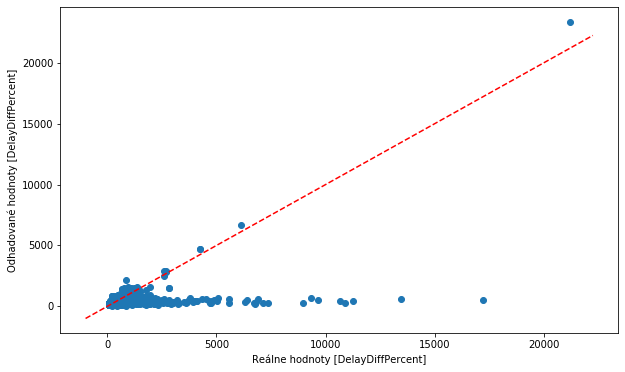

Najväčšia chyba:2162.20703125
Najväčšia chyba v zápornom smere:-16653.14959716797
% približne správnych odhadov: 0.9595125057897175


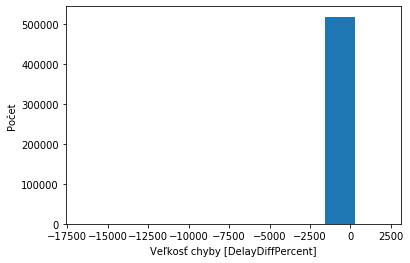

MAE:
34.10322026029768
MSE:
9083.476417293828
RMSE:
95.30727368513816


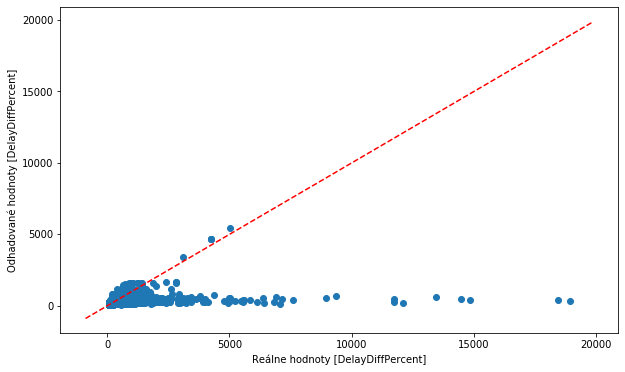

Najväčšia chyba:804.095458984375
Najväčšia chyba v zápornom smere:-18590.37384033203
% približne správnych odhadov: 0.9586484812107854


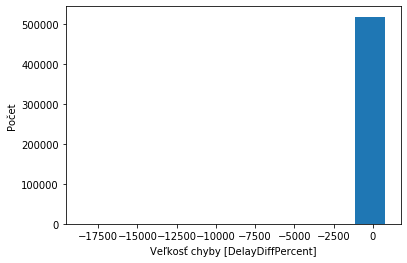

MAE:
35.35282253723732
MSE:
5102.382058720754
RMSE:
71.43096008539122


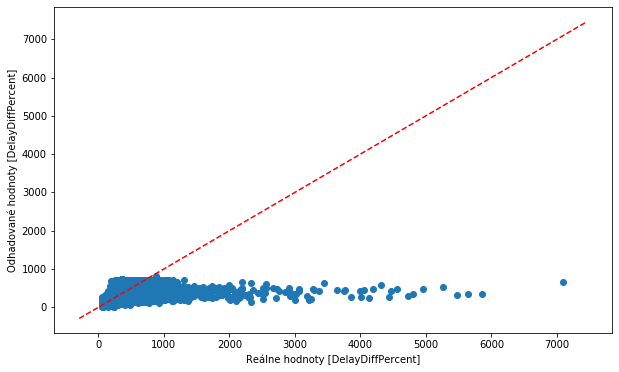

Najväčšia chyba:498.9754638671875
Najväčšia chyba v zápornom smere:-6438.077087402344
% približne správnych odhadov: 0.957453606929791


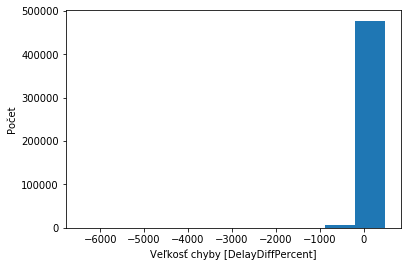

In [292]:
CreateAndFitModelPercent("FILTER1",0.001, 120, "New4FILTER1DelayDiffModelTEST2", test2AltFILTER1,1,topo="96-64-32-32")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 19)
Veľkosť testovacej množniy: (518160, 19)

....................
....................
....................
..........

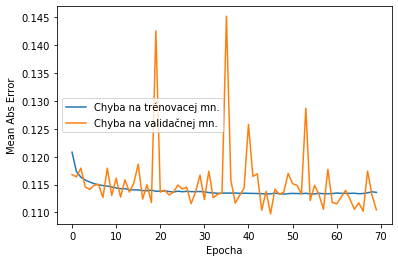

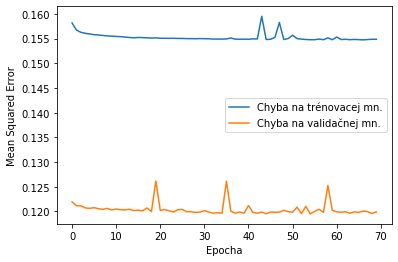

MAE:
34.055951138744206
MSE:
7235.057072766063
RMSE:
85.05913867872201


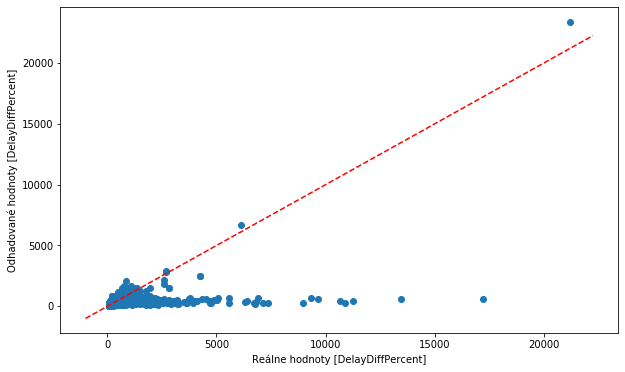

Najväčšia chyba:2182.57421875
Najväčšia chyba v zápornom smere:-16639.696350097656
% približne správnych odhadov: 0.9588312490350471


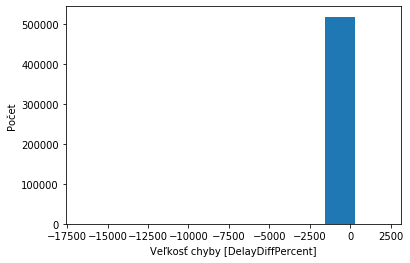

MAE:
34.61230788577833
MSE:
9119.626339491033
RMSE:
95.4967347059104


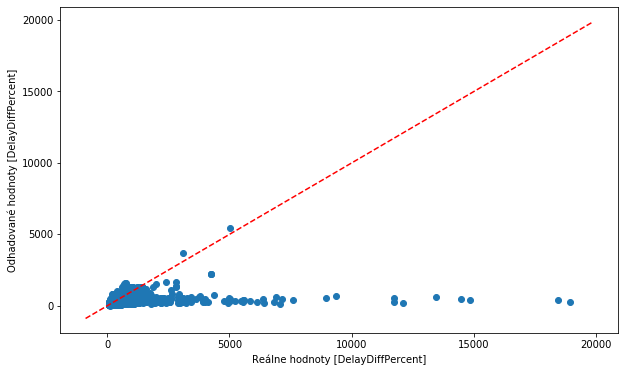

Najväčšia chyba:859.3150634765625
Najväčšia chyba v zápornom smere:-18624.998443603516
% približne správnych odhadov: 0.958306876673042


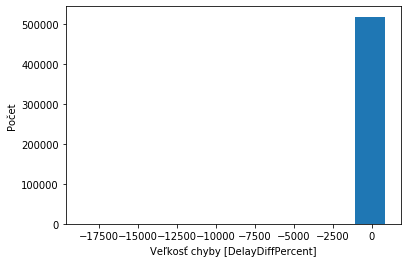

MAE:
37.78147943471044
MSE:
5263.958934766937
RMSE:
72.5531455883681


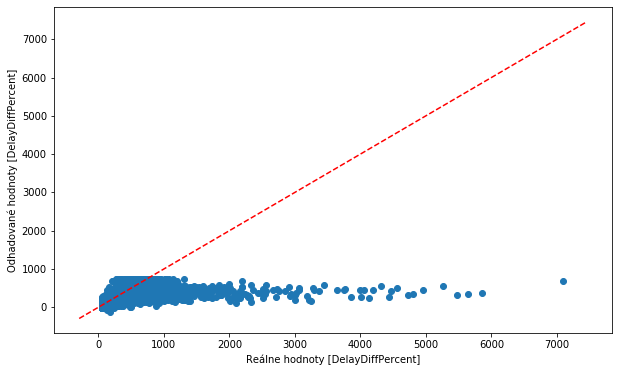

Najväčšia chyba:471.961669921875
Najväčšia chyba v zápornom smere:-6420.5533447265625
% približne správnych odhadov: 0.9526442297781461


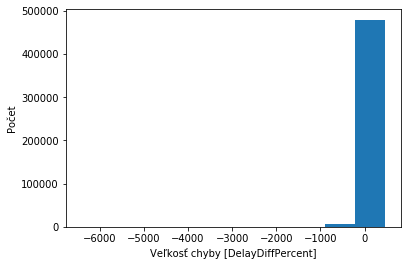

In [293]:
CreateAndFitModelPercent("FILTER1",0.001, 120, "New3FILTER1DelayDiffModelTEST2", test2AltFILTER1,1,topo="128-64-64")

-----------------------------FILTER1---------------------------------
Veľkosť trénovacej množniy: (2072642, 19)
Veľkosť testovacej množniy: (518160, 19)

....................
..................

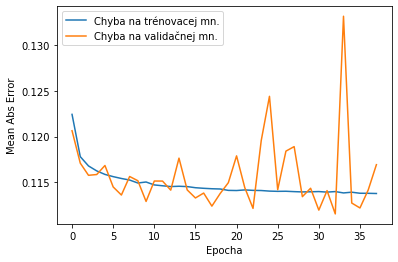

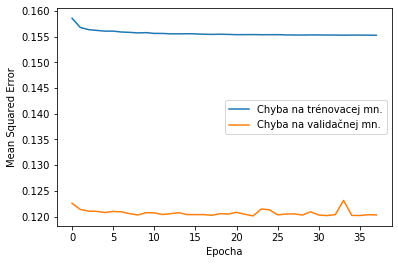

MAE:
34.1741225951576
MSE:
7288.835622212849
RMSE:
85.37467787472377


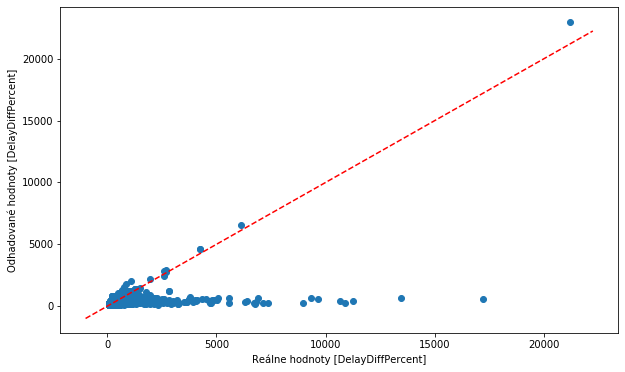

Najväčšia chyba:1786.103515625
Najväčšia chyba v zápornom smere:-16652.531372070312
% približne správnych odhadov: 0.957078894549946


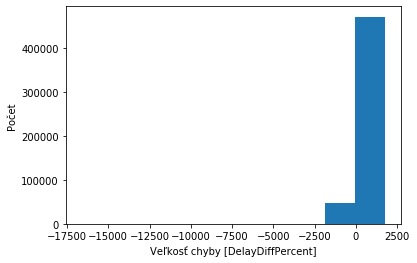

MAE:
34.65590837941992
MSE:
9168.380078247537
RMSE:
95.75165835768871


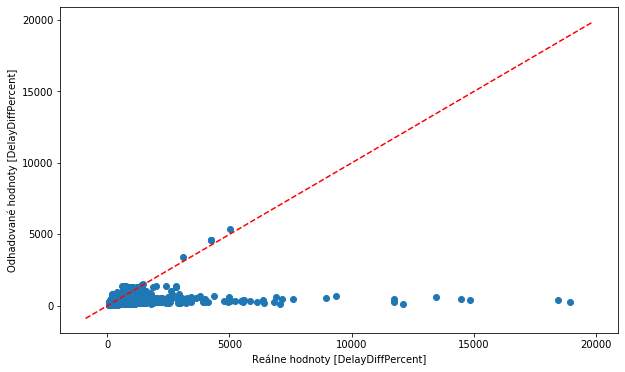

Najväčšia chyba:808.2049560546875
Najväčšia chyba v zápornom smere:-18642.48291015625
% približne správnych odhadov: 0.9569365985837887


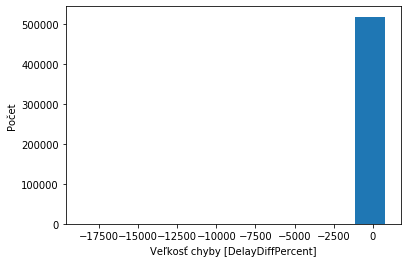

MAE:
34.78251681198283
MSE:
4947.0922711514695
RMSE:
70.33556903268409


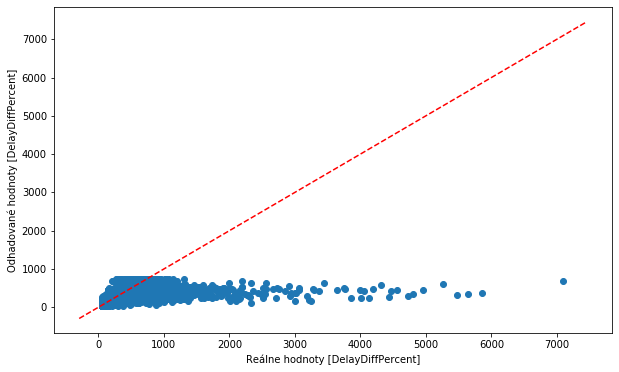

Najväčšia chyba:472.0006103515625
Najväčšia chyba v zápornom smere:-6420.773742675781
% približne správnych odhadov: 0.9590800958164809


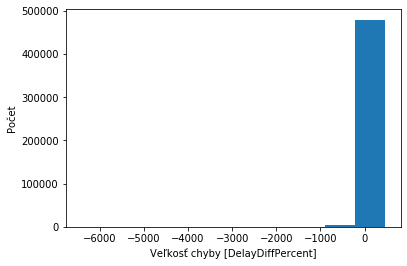

In [294]:
CreateAndFitModelPercent("FILTER1",0.001, 120, "New2FILTER1DelayDiffModelTEST2", test2AltFILTER1,1,topo="64-64")

In [ ]:
CreateAndFitModelPercent("FILTER2",0.001, 120, "NewFILTER2DelayDiffModelTEST2", test2AltFILTER2,1)

In [ ]:
CreateAndFitModelPercent("FILTER3",0.001, 120, "NewFILTER3DelayDiffModelTEST2", test2AltFILTER3,1)

# Test 3 Alternatíva - skúmanie vplyvu ročného obdobia na percento meškania


In [106]:
test3Alt = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 
            'Speed','LengthSect', 'SectIdx',
             'Jar','Leto', 'Jesen', 'Zima',
             'DelayDiffPercent']

In [107]:
used_attributes = test3Alt
label = used_attributes[-1]

Vidím, že teraz majú jednotlivé typy nižšiu koreláciu, čo je však v poriadku. V predošlých pokusoch vyššia korelácia znamenala, že isté typy vlakov majú dlhšie reálne jazdné doby, čo môže znamenať to, že aj ich plánované jazdné doby sú dlhé. Napríklad nákladné vlaky a rýchliky ukazovali vyššiu koreláciu, pretože nákladné vlaky jazdia často dlhé trate bez zastávok, zatiaľ čo rýchliky sú rýchlejšie a majú v trase mnoho zastávok. Teraz model ukazuje vplyv typu vlaku na meškanie a vidím, že nákladné vlaky na svojej trase viac meškajú ako iné vlaky. Naopak rýchliky a expresy málokedy meškajú.

In [108]:
type = df['Season']
for season_type in season_types:
    df[season_type] = (type == season_type)*1.0

In [109]:
cor_vlastnosti = season_types.copy()
cor_vlastnosti.append(label)
print(cor_vlastnosti)

dffcut = df[cor_vlastnosti]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

['Jar', 'Leto', 'Jesen', 'Zima', 'DelayDiffPercent']
DelayDiffPercent    1.000000
Jesen               0.021465
Jar                -0.005363
Leto               -0.007009
Zima               -0.010482
Name: DelayDiffPercent, dtype: float64


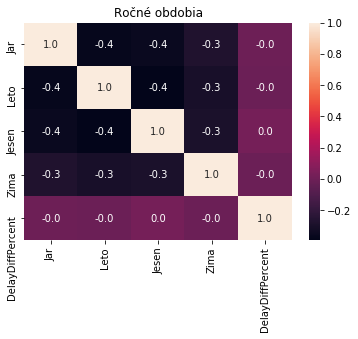

In [110]:
plt.title("Ročné obdobia")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

In [111]:
dffcut = df[used_attributes]

train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

print(train_stats.describe())
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)
print(normed_train_data.describe())   

(2221186, 11)
(555297, 11)
           count        mean         std        min         25%         50%  \
count       11.0   11.000000   11.000000  11.000000   11.000000   11.000000   
mean   2221186.0  114.021500   90.424539   8.454545   51.363636   87.000000   
std          0.0  190.962347  170.574078  25.730774   86.762057  139.403013   
min    2221186.0    0.183892    0.387396   0.000000    0.000000    0.000000   
25%    2221186.0    0.282046    0.449908   0.000000    0.000000    0.000000   
50%    2221186.0   11.438174   10.262214   1.000000    4.000000    7.000000   
75%    2221186.0  141.444981  102.793034   1.500000   57.000000  113.500000   
max    2221186.0  592.213798  567.140111  86.000000  224.000000  392.000000   

              75%           max  
count   11.000000     11.000000  
mean   146.818182   8440.727273  
std    235.727732  26011.055731  
min      0.000000      1.000000  
25%      1.000000      1.000000  
50%     19.000000     78.000000  
75%    208.000000    64

In [112]:
test3AltModel = build_model()
print(test3AltModel.summary())

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 64)                768       
_________________________________________________________________
dense_13 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 65        
Total params: 4,993
Trainable params: 4,993
Non-trainable params: 0
_________________________________________________________________
None


In [113]:
test3AltModelFit = test3AltModel.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop, PrintDot()])


...............................

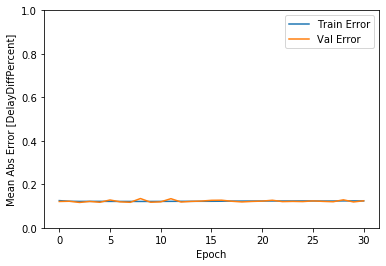

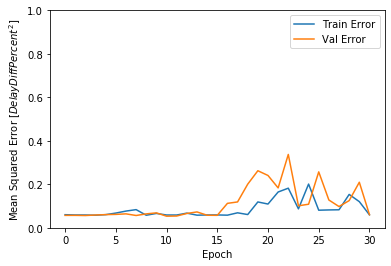

In [114]:
plot_history_Percent(test3AltModelFit, train_dataset['PlanDrivingTime'])

## Vyhodnotenie


In [115]:
test_predictions = test3AltModel.predict(normed_test_data).flatten()

In [116]:
inter = getDrivingTime(test_predictions,test_dataset['PlanDrivingTime'])
inter_real = getDrivingTime(test_labels,test_dataset['PlanDrivingTime'])

In [117]:
errors = inter - inter_real

In [118]:
eval_Percent(errors)

MAE:
39.65405120903742
MSE:
314273.0469448312
RMSE:
560.600612686814


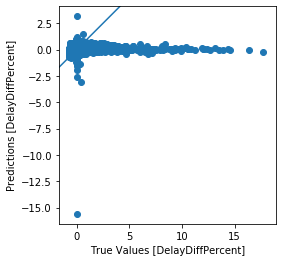

In [119]:
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [DelayDiffPercent]')
plt.ylabel('Predictions [DelayDiffPercent]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([-100,100],[-100,100])

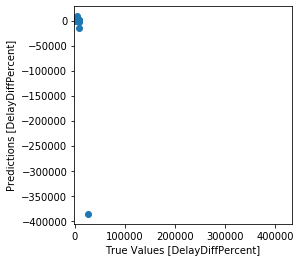

In [120]:
plt.scatter(getDrivingTime(test_labels, test_dataset['PlanDrivingTime']), getDrivingTime(test_predictions,  test_dataset['PlanDrivingTime']))
plt.xlabel('True Values [DelayDiffPercent]')
plt.ylabel('Predictions [DelayDiffPercent]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([-100,100],[-100,100])

Najväčšia chyba:3632.3544921875
Najväčšia chyba v zápornom smere:-412940.71875
% chýb menších ako 2 minúty: 0.944622427277655


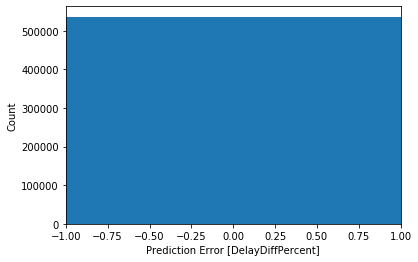

In [121]:
#error = test_predictions - test_labels
error = errors

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

lessThan2Min = error[abs(error) < 120] 
print("% chýb menších ako 2 minúty: " + str(len(lessThan2Min)/len(error)))


plt.hist(error, bins=1000)
plt.xlabel('Prediction Error [DelayDiffPercent]')
plt.xlim([-1,1])
_ = plt.ylabel("Count")

# Test 4 Alternatíva - skúmanie vplyvu obdobia dňa na percento meškania


In [122]:
test4Alt = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'SectIdx',
         'Rano', 'Obed', 'Vecer', 'Noc',
         'DelayDiffPercent']

In [123]:
used_attributes = test4Alt
label = used_attributes[-1]

Vidím, že teraz majú jednotlivé typy nižšiu koreláciu, čo je však v poriadku. V predošlých pokusoch vyššia korelácia znamenala, že isté typy vlakov majú dlhšie reálne jazdné doby, čo môže znamenať to, že aj ich plánované jazdné doby sú dlhé. Napríklad nákladné vlaky a rýchliky ukazovali vyššiu koreláciu, pretože nákladné vlaky jazdia často dlhé trate bez zastávok, zatiaľ čo rýchliky sú rýchlejšie a majú v trase mnoho zastávok. Teraz model ukazuje vplyv typu vlaku na meškanie a vidím, že nákladné vlaky na svojej trase viac meškajú ako iné vlaky. Naopak rýchliky a expresy málokedy meškajú.

In [124]:
type = df['DayTime']
for daytime_type in daytime_types:
    df[daytime_type] = (type == daytime_type)*1.0

In [125]:
cor_vlastnosti = daytime_types.copy()
cor_vlastnosti.append(label)
print(cor_vlastnosti)

dffcut = df[cor_vlastnosti]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

['Rano', 'Obed', 'Vecer', 'Noc', 'DelayDiffPercent']
DelayDiffPercent    1.000000
Rano                0.007800
Obed                0.001822
Vecer              -0.003652
Noc                -0.006911
Name: DelayDiffPercent, dtype: float64


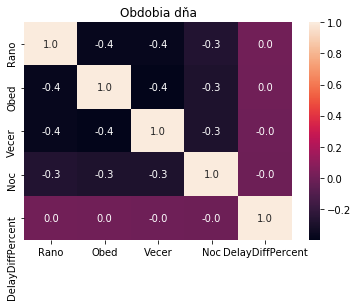

In [126]:
plt.title("Obdobia dňa")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

In [127]:
dffcut = df[used_attributes]

train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

print(train_stats.describe())
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)
print(normed_train_data.describe())   

(2221186, 11)
(555297, 11)
           count        mean         std        min         25%         50%  \
count       11.0   11.000000   11.000000  11.000000   11.000000   11.000000   
mean   2221186.0  114.021500   90.424147   8.454545   51.363636   87.000000   
std          0.0  190.962347  170.574306  25.730774   86.762057  139.403013   
min    2221186.0    0.169953    0.375592   0.000000    0.000000    0.000000   
25%    2221186.0    0.285018    0.451422   0.000000    0.000000    0.000000   
50%    2221186.0   11.438174   10.262214   1.000000    4.000000    7.000000   
75%    2221186.0  141.444981  102.793034   1.500000   57.000000  113.500000   
max    2221186.0  592.213798  567.140111  86.000000  224.000000  392.000000   

              75%           max  
count   11.000000     11.000000  
mean   146.818182   8440.727273  
std    235.727732  26011.055731  
min      0.000000      1.000000  
25%      1.000000      1.000000  
50%     19.000000     78.000000  
75%    208.000000    64

In [128]:
test4AltModel = build_model()
print(test4AltModel.summary())

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 64)                768       
_________________________________________________________________
dense_16 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 65        
Total params: 4,993
Trainable params: 4,993
Non-trainable params: 0
_________________________________________________________________
None


In [129]:
test4AltModelFit = test4AltModel.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop, PrintDot()])


.......................

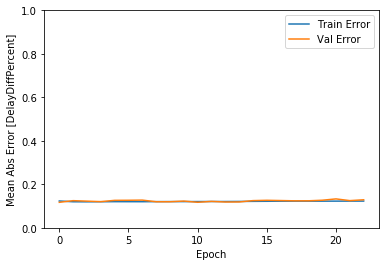

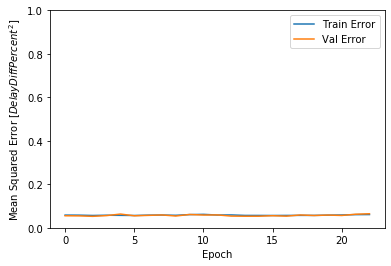

In [130]:
plot_history_Percent(test4AltModelFit, train_dataset['PlanDrivingTime'])

## Vyhodnotenie


In [132]:
test_predictions = test4AltModel.predict(normed_test_data).flatten()

In [133]:
inter = getDrivingTime(test_predictions,test_dataset['PlanDrivingTime'])
inter_real = getDrivingTime(test_labels,test_dataset['PlanDrivingTime'])

In [134]:
errors = inter - inter_real

In [135]:
eval_Percent(errors)

MAE:
41.52294867912508
MSE:
1053482.923705676
RMSE:
1026.3931623435906


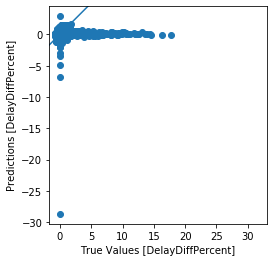

In [136]:
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [DelayDiffPercent]')
plt.ylabel('Predictions [DelayDiffPercent]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([-100,100],[-100,100])

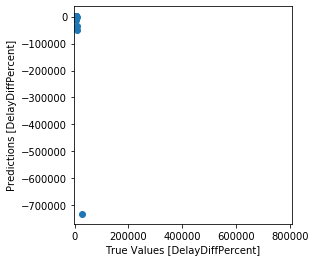

In [137]:
plt.scatter(getDrivingTime(test_labels, test_dataset['PlanDrivingTime']), getDrivingTime(test_predictions,  test_dataset['PlanDrivingTime']))
plt.xlabel('True Values [DelayDiffPercent]')
plt.ylabel('Predictions [DelayDiffPercent]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([-100,100],[-100,100])

Najväčšia chyba:1035.176513671875
Najväčšia chyba v zápornom smere:-758740.25
% chýb menších ako 2 minúty: 0.9454922320848123


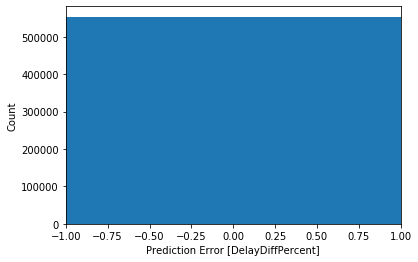

In [138]:
#error = test_predictions - test_labels
error = errors

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

lessThan2Min = error[abs(error) < 120] 
print("% chýb menších ako 2 minúty: " + str(len(lessThan2Min)/len(error)))


plt.hist(error, bins=1000)
plt.xlabel('Prediction Error [DelayDiffPercent]')
plt.xlim([-1,1])
_ = plt.ylabel("Count")

# Pridanie predošlých meškaní do modelu
Očakávam, že pridaním predošlých meškaní, bude model môcť využiť časový rad pre zlepšenie presnosti. Avšak bude mať obmedzenia z pohľadu úsekov, ktoré sú na začiatku trasy a teda nemajú predošlé meškanie.

In [28]:
casovy_rad = ['Ar1', 'Ar2', 'Ar3', 'Ar4', 'Ar5', 'Ar6', 'Ar7', 'Ar8', 'Ar9']
testCasovyRad = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'SectIdx',
                 'Ar1', 'Ar2', 'Ar3', 'Ar4', 'Ar5', 'Ar6', 'Ar7', 'Ar8', 'Ar9', 
                 'DelayDiffPercent']

In [29]:
used_attributes = testCasovyRad
label = used_attributes[-1]

In [30]:
cor_vlastnosti = casovy_rad.copy()
cor_vlastnosti.append(label)
print(cor_vlastnosti)

dffcut = df[cor_vlastnosti]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

['Ar1', 'Ar2', 'Ar3', 'Ar4', 'Ar5', 'Ar6', 'Ar7', 'Ar8', 'Ar9', 'DelayDiffPercent']
DelayDiffPercent    1.000000
Ar1                 0.160644
Ar2                 0.054488
Ar3                 0.045771
Ar4                 0.022079
Ar6                 0.017665
Ar5                 0.014066
Ar8                 0.012634
Ar7                 0.008600
Ar9                -0.001929
Name: DelayDiffPercent, dtype: float64


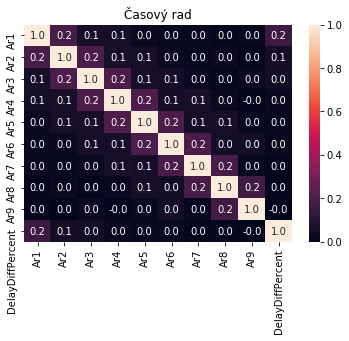

In [31]:
plt.title("Časový rad")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

In [32]:
dffcut = df[used_attributes]

train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

print(train_stats.describe())
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)
print(normed_train_data.describe())   

(2221186, 16)
(555297, 16)
           count        mean         std        min         25%         50%  \
count       16.0   16.000000   16.000000  16.000000   16.000000   16.000000   
mean   2221186.0   78.332688   62.154619   5.398004   35.300099   59.812500   
std          0.0  165.227054  145.850636  21.518478   74.993094  121.202431   
min    2221186.0    0.007300    0.097431  -0.746032   -0.083333    0.000000   
25%    2221186.0    0.009922    0.167936  -0.741667   -0.001389    0.000000   
50%    2221186.0    0.011951    0.228012  -0.717949    0.000000    0.000000   
75%    2221186.0   48.908031   37.620664   1.000000   13.000000   34.250000   
max    2221186.0  592.213798  567.140111  86.000000  224.000000  392.000000   

              75%           max  
count   16.000000     16.000000  
mean   100.753971   5812.442448  
std    204.997919  21616.206463  
min      0.000000     15.950000  
25%      0.000000     17.100000  
50%      0.031766     18.382639  
75%     78.250000    16

In [33]:
testCasovyRadModel = build_model()
print(testCasovyRadModel.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 64)                1088      
_________________________________________________________________
dense_1 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 65        
Total params: 5,313
Trainable params: 5,313
Non-trainable params: 0
_________________________________________________________________
None


In [34]:
testCasovyRadFit = testCasovyRadModel.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop, PrintDot()])


.......................

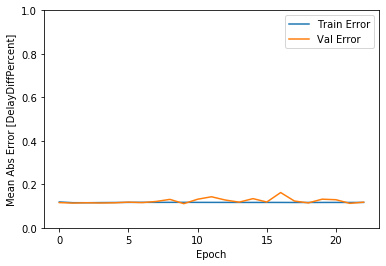

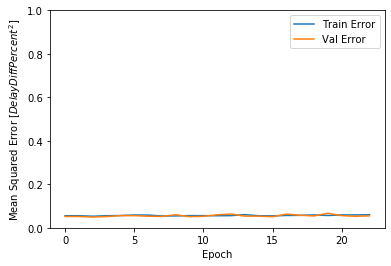

In [37]:
plot_history_Percent(testCasovyRadFit, train_dataset['PlanDrivingTime'])

## Vyhodnotenie


In [38]:
test_predictions = testCasovyRadModel.predict(normed_test_data).flatten()

In [41]:
inter = getDrivingTime(test_predictions,test_dataset['PlanDrivingTime'])
inter_real = getDrivingTime(test_labels,test_dataset['PlanDrivingTime'])

In [42]:
errors = inter - inter_real

In [45]:
eval_Percent(errors)

MAE:
36.67511922299004
MSE:
203050.12192479693
RMSE:
450.61083201005823


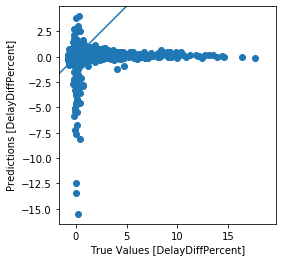

In [46]:
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [DelayDiffPercent]')
plt.ylabel('Predictions [DelayDiffPercent]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([-100,100],[-100,100])

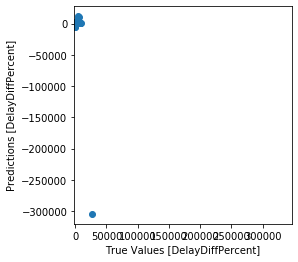

In [47]:
plt.scatter(getDrivingTime(test_labels, test_dataset['PlanDrivingTime']), getDrivingTime(test_predictions,  test_dataset['PlanDrivingTime']))
plt.xlabel('True Values [DelayDiffPercent]')
plt.ylabel('Predictions [DelayDiffPercent]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([-100,100],[-100,100])

Najväčšia chyba:6673.548828125
Najväčšia chyba v zápornom smere:-330924.5625
% chýb menších ako 2 minúty: 0.9558416487033066


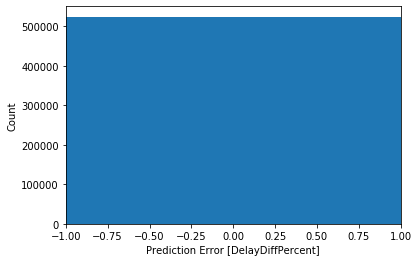

In [48]:
#error = test_predictions - test_labels
error = errors

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

lessThan2Min = error[abs(error) < 120] 
print("% chýb menších ako 2 minúty: " + str(len(lessThan2Min)/len(error)))


plt.hist(error, bins=1000)
plt.xlabel('Prediction Error [DelayDiffPercent]')
plt.xlim([-1000,1000])
_ = plt.ylabel("Count")

# uprava iba na 2 posledne meskania

In [49]:
casovy_rad = ['Ar1', 'Ar2', 'Ar3', 'Ar4', 'Ar5', 'Ar6', 'Ar7', 'Ar8', 'Ar9']
testCasovyRad = ['Weight', 'Length', 'CarCount', 'AxisCount', 'PlanDrivingTime', 'LengthSect', 'SectIdx',
                 'Ar1', 'Ar2',
                 'DelayDiffPercent']

In [50]:
used_attributes = testCasovyRad
label = used_attributes[-1]

In [52]:
cor_vlastnosti = ['Ar1', 'Ar2']
cor_vlastnosti.append(label)
print(cor_vlastnosti)

dffcut = df[cor_vlastnosti]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

['Ar1', 'Ar2', 'DelayDiffPercent']
DelayDiffPercent    1.000000
Ar1                 0.160644
Ar2                 0.054488
Name: DelayDiffPercent, dtype: float64


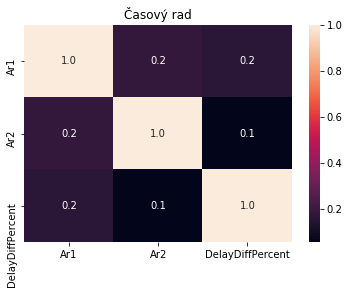

In [53]:
plt.title("Časový rad")
sns.heatmap(cor, annot = True, fmt='.1f')    
plt.show()

In [54]:
dffcut = df[used_attributes]

train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

print(train_stats.describe())
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)
print(normed_train_data.describe())   

(2221186, 9)
(555297, 9)
           count        mean         std        min         25%         50%  \
count        9.0    9.000000    9.000000   9.000000    9.000000    9.000000   
mean   2221186.0  139.251137  110.378285  10.168034   62.761111  106.333333   
std          0.0  204.070435  184.135412  28.455242   92.767450  148.252319   
min    2221186.0    0.010502    0.215567  -0.746032   -0.083333    0.000000   
25%    2221186.0    3.569621    2.958493   0.000000    1.000000    3.000000   
50%    2221186.0   46.146443   36.411201   1.000000   12.000000   28.000000   
75%    2221186.0  225.697169  164.337015   2.000000   98.000000  174.000000   
max    2221186.0  592.213798  567.140111  86.000000  224.000000  392.000000   

              75%           max  
count    9.000000      9.000000  
mean   179.118170  10320.085031  
std    251.006507  28703.044536  
min      0.015385     17.902778  
25%      6.000000     19.000000  
50%     76.000000    111.000000  
75%    331.000000    973.

In [55]:
testCasovyRadModel2 = build_model()
print(testCasovyRadModel2.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 64)                640       
_________________________________________________________________
dense_4 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 65        
Total params: 4,865
Trainable params: 4,865
Non-trainable params: 0
_________________________________________________________________
None


In [56]:
testCasovyRad2Fit = testCasovyRadModel2.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop, PrintDot()])


...............................

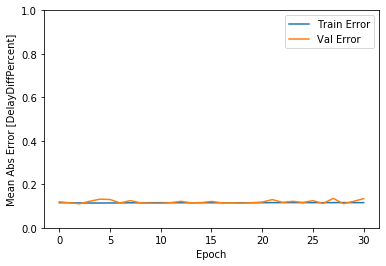

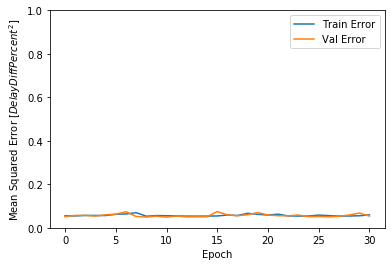

In [57]:
plot_history_Percent(testCasovyRad2Fit, train_dataset['PlanDrivingTime'])

## Vyhodnotenie


In [58]:
test_predictions = testCasovyRadModel2.predict(normed_test_data).flatten()

In [59]:
inter = getDrivingTime(test_predictions,test_dataset['PlanDrivingTime'])
inter_real = getDrivingTime(test_labels,test_dataset['PlanDrivingTime'])

In [60]:
errors = inter - inter_real

In [61]:
eval_Percent(errors)

MAE:
42.19376788292202
MSE:
79413.4725035644
RMSE:
281.80396112113897


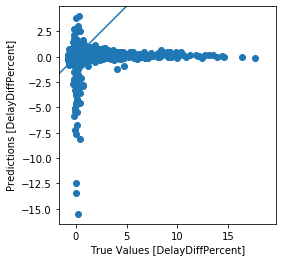

In [46]:
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [DelayDiffPercent]')
plt.ylabel('Predictions [DelayDiffPercent]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([-100,100],[-100,100])

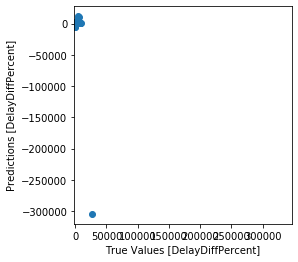

In [47]:
plt.scatter(getDrivingTime(test_labels, test_dataset['PlanDrivingTime']), getDrivingTime(test_predictions,  test_dataset['PlanDrivingTime']))
plt.xlabel('True Values [DelayDiffPercent]')
plt.ylabel('Predictions [DelayDiffPercent]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([-100,100],[-100,100])

Najväčšia chyba:6673.548828125
Najväčšia chyba v zápornom smere:-330924.5625
% chýb menších ako 2 minúty: 0.9558416487033066


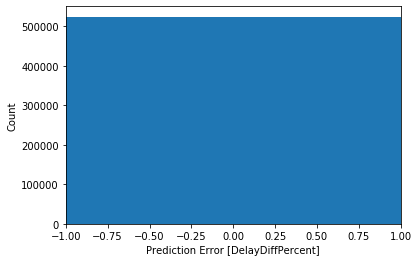

In [48]:
#error = test_predictions - test_labels
error = errors

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

lessThan2Min = error[abs(error) < 120] 
print("% chýb menších ako 2 minúty: " + str(len(lessThan2Min)/len(error)))


plt.hist(error, bins=1000)
plt.xlabel('Prediction Error [DelayDiffPercent]')
plt.xlim([-1,1])
_ = plt.ylabel("Count")

# Odhad parametrov vlaku na základe jeho jazdných dôb
Očakávam, že presnosť týchto modelov bude o niečo presnejšia, niektoré parametre sa často opakujú na istých trasách, a teda jediným faktor zostáva časová dĺžka trasy ktorá môže priamo rozhodnút o parametri. Avšak očakávam, že týmto dôjde aj k pretrénovaniu, a na validačnej množine nebude dosahovať dostatočne presné výsledky.

In [152]:
odhadParameters = []
dfPar = pd.DataFrame()

In [153]:
type = DFFILTER1['FromName']
for zastavka in DFFILTER1.FromName.unique():
    odhadParameters.append("From" + zastavka)
    dfPar["From" + zastavka] = (type == zastavka)*1.0

In [155]:
type = DFFILTER1['ToName']
for zastavka in DFFILTER1.ToName.unique():
    odhadParameters.append("To" + zastavka)
    dfPar["To" + zastavka] = (type == zastavka)*1.0

In [156]:
dfPar["RealDrivingTime"] = DFFILTER1["RealDrivingTime"]

In [157]:
odhadParameters.append("RealDrivingTime")

# Odhad počtu vagónov v súprave

In [158]:
dfPar['CarCount'] = DFFILTER1['CarCount']
label = 'CarCount'
used_attributes = odhadParameters.copy()
used_attributes.append('CarCount')

In [159]:
dffcut = dfPar[used_attributes]

cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

CarCount                 1.000000
RealDrivingTime          0.176910
ToPolom                  0.047551
FromPolom                0.047548
FromLipník nad Beèv.     0.029731
ToLipník nad Beèv.       0.029541
ToDrahotue              0.029394
FromDrahotue            0.029377
ToProsenice              0.029307
FromProsenice            0.029155
ToHranice na Mor.        0.027514
FromHranice na Mor.      0.026407
FromSuchdol nad Odr.     0.017403
ToSuchdol nad Odr.       0.015831
ToPøerov os.n.           0.013785
FromPøerov os.n.         0.012803
FromJistebník            0.008479
ToJistebník              0.008411
ToPolanka n. O.          0.006967
FromPolanka n. O.        0.003804
ToVýh Dluhonice          0.002204
FromVýh Dluhonice        0.002088
ToFulnek                -0.004601
FromFulnek              -0.004956
ToStudénka              -0.019935
FromStudénka            -0.022018
FromHranice mìsto       -0.025725
ToHranice mìsto         -0.030655
ToOstrava-Vítkovice     -0.033118
FromOstrava-Ví

In [35]:
train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)
print(normed_train_data.describe())

(2067026, 44)
(516757, 44)
       FromOdb Skalka  FromOstrava-Svinov  FromPolanka n. O.  FromJistebník  \
count    2.067026e+06        2.067026e+06       2.067026e+06   2.067026e+06   
mean     6.187113e-15        1.022564e-14      -3.276275e-15   3.326076e-15   
std      1.000000e+00        1.000000e+00       1.000000e+00   1.000000e+00   
min     -1.455914e-01       -2.405279e-01      -3.064463e-01  -3.070316e-01   
25%     -1.455914e-01       -2.405279e-01      -3.064463e-01  -3.070316e-01   
50%     -1.455914e-01       -2.405279e-01      -3.064463e-01  -3.070316e-01   
75%     -1.455914e-01       -2.405279e-01      -3.064463e-01  -3.070316e-01   
max      6.868536e+00        4.157520e+00       3.263213e+00   3.256993e+00   

       FromStudénka  FromSuchdol nad Odr.     FromPolom  FromHranice na Mor.  \
count  2.067026e+06          2.067026e+06  2.067026e+06         2.067026e+06   
mean  -4.444105e-15         -6.402715e-15 -1.802550e-15        -1.070819e-15   
std    1.000000e+00  

In [53]:
testParModelCarCount0_01 = build_model(0.1)
#print(testParModelCarCount0_01.summary())

In [54]:
testParModelCarCountFit = testParModelCarCount0_01.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop,save_best_model("testParModelCarCount0_01.h5"), PrintDot()])


.............

In [76]:
#testParModel.save("CarCountModel.h5")

In [55]:
testmodel = load_model("testParModelCarCount0_01.h5")

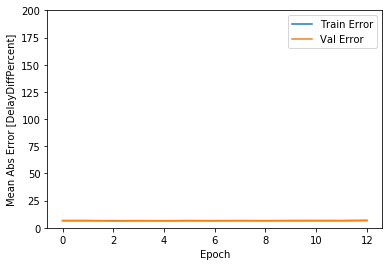

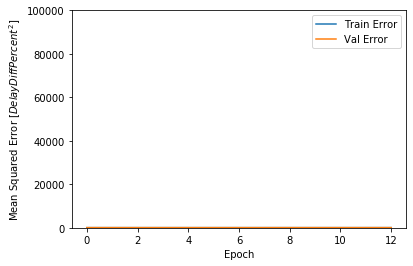

In [56]:
plot_history(testParModelCarCountFit)

In [57]:
eval(testmodel)

Testing set Loss : 78.79 RealDrivingTime
Testing set Mean Abs Error:  6.30 RealDrivingTime
Testing set Mean Sqrt Error: 78.79 RealDrivingTime
Testing set Root Mean Sqrt Error:  8.88 RealDrivingTime


## Vyhodnotenie
Pred Odstánením vlakov s jedným vagónom 
- Testing set Mean Abs Error:  6.04 RealDrivingTime
- Testing set Mean Sqrt Error: 70.75 RealDrivingTime
- Testing set Root Mean Sqrt Error:  8.41 RealDrivingTime

Po filtrácií
- Testing set Mean Abs Error:  5.88 RealDrivingTime
- Testing set Mean Sqrt Error: 69.18 RealDrivingTime
- Testing set Root Mean Sqrt Error:  8.32 RealDrivingTime

Model sa iba minimálne zlepšíl, ale hlavne z dôvodu, že sa naučil na dátach, ktoré už nemali chyby, a tým sa zameral na presné dáta, ktoré majú v niektorch prípadoch viac vagónov, a práve k týmto dátam, sa model priblížil.

Model však aj napriek tomu, nedokáže modelovať danú vlastnosť, a úspešne sa trafí iba v 57% prípadov, s odchýlkou 5 vagónov

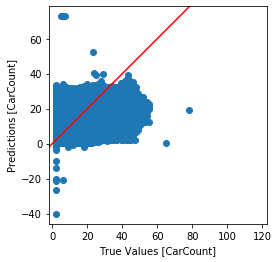

In [50]:
test_predictions = testmodel.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [CarCount]')
plt.ylabel('Predictions [CarCount]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([-100,100],[-100,100],'r')

Najväčšia chyba:67.81771850585938
Najväčšia chyba v zápornom smere:-64.58448028564453
% priblizne správnych: 0.5794270808136126


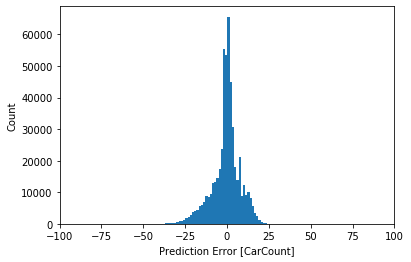

In [51]:
error = test_predictions - test_labels

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

goodPercent = error[abs(error) < 5] 
print("% priblizne správnych: " + str(len(goodPercent)/len(error)))

plt.hist(error, bins=100)
plt.xlabel('Prediction Error [CarCount]')
plt.xlim([-100,100])
_ = plt.ylabel("Count")

# Experiment - odhad počtu vagónov pomocou modelu vytvoreného pre daný úsek
Vybrané úseky  
    - Drahotuše -> Lipník nad Bečv. 
    - Ostrava-Svinov -> Polanka n. O.

In [160]:
dfPar['CarCount'] = DFFILTER1['CarCount']
label = 'CarCount'
used_attributes = ['RealDrivingTime', 'CarCount']

In [161]:
dffcut = dfPar[((dfPar['FromOstrava-Svinov'] == 1) & (dfPar['ToPolanka n. O.'] == 1))]
#dffcut = dfPar[((dfPar['FromDrahotue'] == 1) & (dfPar['ToLipník nad Beèv.'] == 1))]
dffcut = dffcut[used_attributes]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

print(dffcut.shape)

CarCount           1.000000
RealDrivingTime    0.218223
Name: CarCount, dtype: float64
(106504, 2)


Ako na prvý pohľad vidím, tak model nebude môcť odhadnúť z jazdnej doby počet vozňov, čo nám potvrdzuje ako korelácia, tak aj graf závislosti týchto dvoch vlastností.

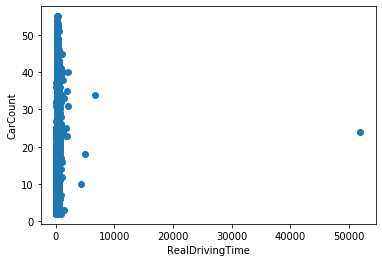

In [162]:
plt.scatter(dffcut['RealDrivingTime'],dffcut['CarCount'])
plt.ylabel('CarCount')
plt.xlabel('RealDrivingTime')
plt.show()

In [163]:
train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

(85203, 1)
(21301, 1)


In [176]:
def build_model(lr=0.001):
    model = keras.Sequential([
        layers.Dense(64, activation=tf.nn.relu, input_shape=[len(normed_train_data.keys())]),
        layers.Dense(64, activation=tf.nn.relu),
        layers.Dense(1)
    ])

    optimizer = tf.keras.optimizers.Adam(lr)

    model.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=['mae','mse'])
    return model

In [177]:
testParModelCarCountOneTrack = build_model()


............

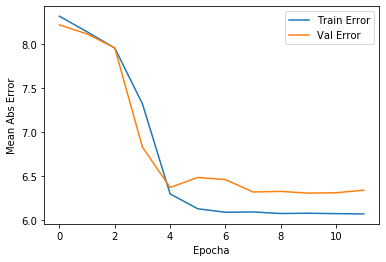

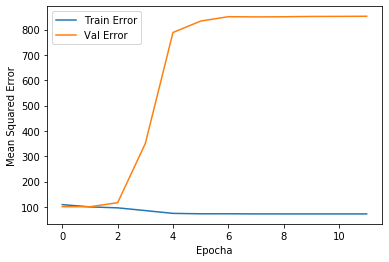

In [178]:
testFit = testParModelCarCountOneTrack.fit(normed_train_data, train_labels, epochs=EPOCHS,
                   validation_split=0.25, verbose=0, callbacks=[save_best_model("testParModelCarCountOneTrack.h5"),early_stop,reduce_lr, PrintDot()])
plot_history(testFit)

In [179]:
testParModelLengthOneTrack = load_model('testParModelCarCountOneTrack.h5')
eval(testParModelCarCountOneTrack)

Testing set Loss : 71.33 RealDrivingTime
Testing set Mean Abs Error:  6.10 RealDrivingTime
Testing set Mean Sqrt Error: 71.33 RealDrivingTime
Testing set Root Mean Sqrt Error:  8.45 RealDrivingTime


## Vyhodnotenie
Vidím, že zameranie sa na jeden úsek pomáha presnoti modelu, ale model dokáže iba do istej miery predpovedať, kde sa trafí v 51% prípadov s odchýlkou 4 vagónov, takže stále ho nepovažujeme za dostatočne presný.

pre trasu Drahotuše -> Lipník nad Bečv. 
- Testing set Mean Abs Error:  5.67 RealDrivingTime
- Testing set Mean Sqrt Error: 63.85 RealDrivingTime
- Testing set Root Mean Sqrt Error:  7.99 RealDrivingTime
    
        - Táto trasa málokedy zaznamená nulové meškanie, preto je dobrým príkladom dobre zaznamenaných dát
        
pre trasu Ostrava-Svinov -> Polanka n. O.
- Testing set Mean Abs Error:  5.69 RealDrivingTime
- Testing set Mean Sqrt Error: 64.32 RealDrivingTime
- Testing set Root Mean Sqrt Error:  8.02 RealDrivingTime


        - Táto trasa má často ako keby nadiktované výsledky, kde vlaky majú v niektorých prípadoch rovnaké jazdné doby

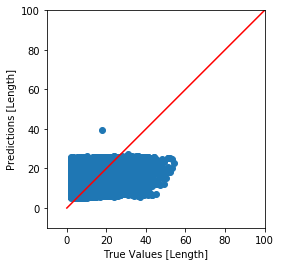

Najväčšia chyba:23.774511337280273
Najväčšia chyba v zápornom smere:-37.685028076171875
% priblizne správnych: 0.5149405692096415


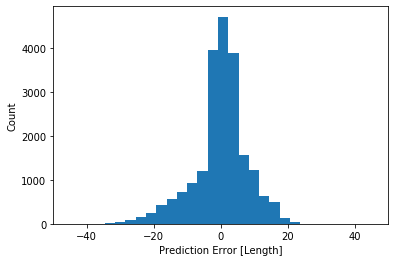

In [117]:
test_predictions = testParModelCarCountOneTrack.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [Length]')
plt.ylabel('Predictions [Length]')
plt.axis('equal')
plt.axis('square')
plt.xlim([-10,100])
plt.ylim([-10,100])
_ = plt.plot([0,100],[0,100],'r')
plt.show()

error = test_predictions - test_labels

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

goodPercent = error[abs(error) < 4] 
print("% priblizne správnych: " + str(len(goodPercent)/len(error)))

plt.hist(error, bins=20)
plt.xlabel('Prediction Error [Length]')
plt.xlim([-50,50])
_ = plt.ylabel("Count")

# Odhad počtu náprav v súprave

In [118]:
dfPar['AxisCount'] = df['AxisCount']
label = 'AxisCount'
used_attributes = odhadParameters.copy()
used_attributes.append('AxisCount')

In [119]:
dffcut = dfPar[used_attributes]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

AxisCount                1.000000
RealDrivingTime          0.172168
ToPolom                  0.048755
FromPolom                0.048755
FromLipník nad Beèv.     0.030251
ToLipník nad Beèv.       0.030051
ToDrahotue              0.029940
FromDrahotue            0.029889
ToProsenice              0.029778
FromProsenice            0.029208
ToHranice na Mor.        0.028383
FromHranice na Mor.      0.027313
FromPøerov os.n.         0.016232
ToPøerov os.n.           0.015783
FromSuchdol nad Odr.     0.015300
ToSuchdol nad Odr.       0.013674
ToJistebník              0.009322
FromJistebník            0.009314
ToPolanka n. O.          0.007954
FromPolanka n. O.        0.004332
FromCement Hranice      -0.000075
ToVýh Dluhonice         -0.000860
FromVýh Dluhonice       -0.001091
ToFulnek                -0.005070
FromFulnek              -0.005461
ToStudénka              -0.023286
FromHranice mìsto       -0.025480
FromStudénka            -0.025517
FromOstrava-Vítkovice   -0.027700
ToOstrava-Vítk

In [121]:
train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)


(2067026, 44)
(516757, 44)


In [128]:
testParModelAxis = build_model(0.001)


...................

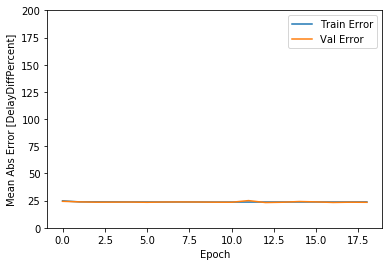

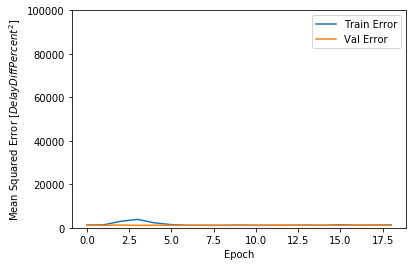

In [129]:
testParModelAxisFit = testParModelAxis.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[save_best_model("AxisModel.h5"),early_stop, PrintDot()])
plot_history(testParModelAxisFit)

In [130]:
testmodel = load_model("AxisModel.h5")

In [131]:
eval(testmodel)

Testing set Loss : 1105.65 RealDrivingTime
Testing set Mean Abs Error: 23.65 RealDrivingTime
Testing set Mean Sqrt Error: 1105.65 RealDrivingTime
Testing set Root Mean Sqrt Error: 33.25 RealDrivingTime


## Vyhodnotenie

- Testing set Mean Abs Error: 23.65 RealDrivingTime
- Testing set Mean Sqrt Error: 1105.65 RealDrivingTime
- Testing set Root Mean Sqrt Error: 33.25 RealDrivingTime

Model správne odhadne 58% prípadov s ochýlkou 20 náprav. Nestačí to na to, aby som ho označil za dotatočne presný

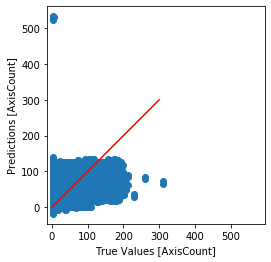

Najväčšia chyba:529.8419799804688
Najväčšia chyba v zápornom smere:-245.80941772460938
% chýb menších ako 20 náprav: 0.5790903654909367


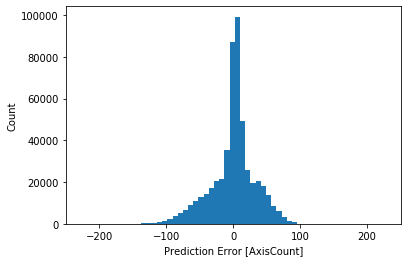

In [134]:
test_predictions = testmodel.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [AxisCount]')
plt.ylabel('Predictions [AxisCount]')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([0,300],[0,300],'r')
plt.show()

error = test_predictions - test_labels

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

goodError = error[abs(error) < 20] 
print("% chýb menších ako 20 náprav: " + str(len(goodError)/len(error)))

plt.hist(error, bins=100)
plt.xlabel('Prediction Error [AxisCount]')
plt.xlim([-250,250])
_ = plt.ylabel("Count")

## Experiment - odhad počtu náprav na modeli konkrétneho úseku
Vybrané úseky  
    - Drahotuše -> Lipník nad Bečv. 
    - Ostrava-Svinov -> Polanka n. O.

In [137]:
label = 'AxisCount'
dfPar[label] = df[label]
used_attributes = ['RealDrivingTime', label]

In [150]:
#dffcut = dfPar[((dfPar['FromOstrava-Svinov'] == 1) & (dfPar['ToPolanka n. O.'] == 1))]
dffcut = dfPar[((dfPar['FromDrahotue'] == 1) & (dfPar['ToLipník nad Beèv.'] == 1))]
dffcut = dffcut[used_attributes]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

print(dffcut.shape)

AxisCount          1.000000
RealDrivingTime    0.356696
Name: AxisCount, dtype: float64
(116955, 2)


Ako na prvý pohľad vidím, tak model nebude môcť odhadnúť z jazdnej doby počet náprav, čo nám potvrdzuje ako korelácia, tak aj graf závislosti týchto dvoch vlastností.

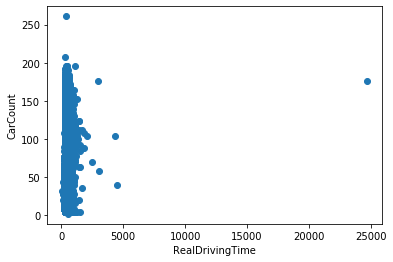

In [151]:
plt.scatter(dffcut['RealDrivingTime'],dffcut[label])
plt.ylabel(label)
plt.xlabel('RealDrivingTime')
plt.show()

In [152]:
train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

(93564, 1)
(23391, 1)


In [153]:
testParModelAxisCountOneTrack = build_model()


....................
.

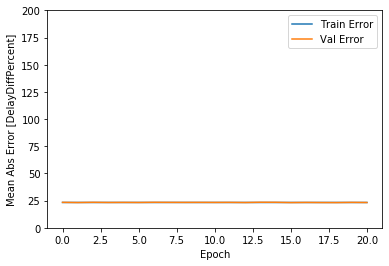

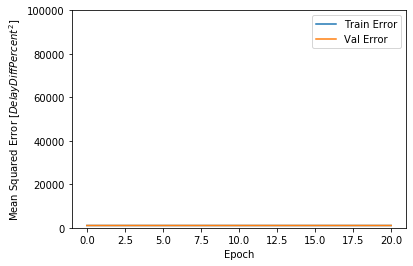

In [156]:
testFit = testParModelAxisCountOneTrack.fit(normed_train_data, train_labels, epochs=EPOCHS,
                   validation_split=0.25, verbose=0, callbacks=[save_best_model("AxisModelOneTrack.h5"),early_stop,reduce_lr, PrintDot()])
plot_history(testFit)

In [157]:
testParModelAxisCountOneTrack = load_model('AxisModelOneTrack.h5')
eval(testParModelAxisCountOneTrack)

Testing set Loss : 1036.08 RealDrivingTime
Testing set Mean Abs Error: 23.11 RealDrivingTime
Testing set Mean Sqrt Error: 1036.08 RealDrivingTime
Testing set Root Mean Sqrt Error: 32.19 RealDrivingTime


### Vyhodnotenie
Vidím, že zameranie sa na jeden úsek nepomáha výrazne presnoti modelu, kde sa trafí s podobnou presnoťou ako predošlý model v 52% prípadoch s odchýlkou 16 náprav, takže stále ho nepovažujeme za dostatočne presný.

pre trasu Drahotuše -> Lipník nad Bečv. 
- Testing set Mean Abs Error: 23.11 RealDrivingTime
- Testing set Mean Sqrt Error: 1036.08 RealDrivingTime
- Testing set Root Mean Sqrt Error: 32.19 RealDrivingTime
    
        - Táto trasa málokedy zaznamená nulové meškanie, preto je dobrým príkladom dobre zaznamenaných dát
        
pre trasu Ostrava-Svinov -> Polanka n. O.
- Testing set Mean Abs Error: 22.75 RealDrivingTime
- Testing set Mean Sqrt Error: 1001.90 RealDrivingTime
- Testing set Root Mean Sqrt Error: 31.65 RealDrivingTime


        - Táto trasa má často ako keby nadiktované výsledky, kde vlaky majú v niektorých prípadoch rovnaké jazdné doby

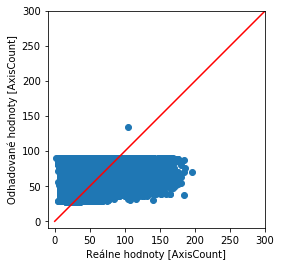

Najväčšia chyba:388.70989990234375
Najväčšia chyba v zápornom smere:-146.8528594970703
% priblizne správnych: 0.5108375016031808


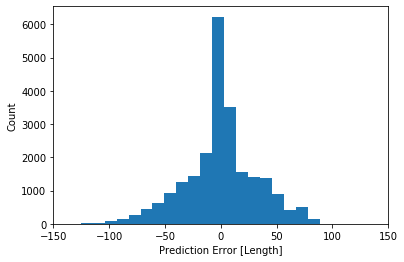

In [158]:
test_predictions = testParModelAxisCountOneTrack.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('Reálne hodnoty [' + label + ']')
plt.ylabel('Odhadované hodnoty [' + label + ']')
plt.axis('equal')
plt.axis('square')
plt.xlim([-10,300])
plt.ylim([-10,300])
_ = plt.plot([0,300],[0,300],'r')
plt.show()

error = test_predictions - test_labels

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

goodPercent = error[abs(error) < 16] 
print("% priblizne správnych: " + str(len(goodPercent)/len(error)))

plt.hist(error, bins=50)
plt.xlabel('Prediction Error [Length]')
plt.xlim([-150,150])
_ = plt.ylabel("Count")

# Odhad dĺžky vlakovej súpravy

In [159]:
label = 'Length'
dfPar[label] = df[label]
used_attributes = odhadParameters.copy()
used_attributes.append(label)

In [160]:
dffcut = dfPar[used_attributes]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

Length                   1.000000
RealDrivingTime          0.124322
FromPolom                0.055862
ToPolom                  0.055856
FromLipník nad Beèv.     0.040115
ToLipník nad Beèv.       0.039873
ToDrahotue              0.039670
FromDrahotue            0.039590
ToProsenice              0.039507
FromProsenice            0.039038
ToHranice na Mor.        0.034293
FromHranice na Mor.      0.033154
FromSuchdol nad Odr.     0.015485
ToSuchdol nad Odr.       0.013534
FromPøerov os.n.         0.013007
ToVýh Dluhonice          0.011850
FromVýh Dluhonice        0.011399
ToPøerov os.n.           0.010202
ToJistebník              0.009571
FromJistebník            0.009517
ToPolanka n. O.          0.007556
FromPolanka n. O.        0.002958
FromCement Hranice      -0.000301
ToFulnek                -0.005987
FromFulnek              -0.006446
FromHranice mìsto       -0.029710
ToStudénka              -0.030096
FromStudénka            -0.032773
ToHranice mìsto         -0.034462
FromOstrava-Ví

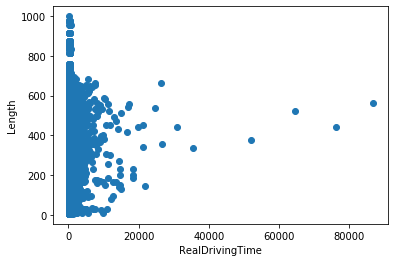

In [161]:
plt.scatter(dffcut['RealDrivingTime'],dffcut[label])
plt.ylabel(label)
plt.xlabel('RealDrivingTime')
plt.show()

In [162]:
train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

(2067026, 44)
(516757, 44)


In [166]:
testParModelLength = build_model(0.001)


....................
..

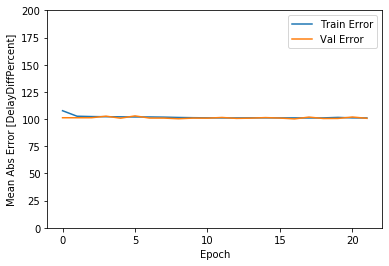

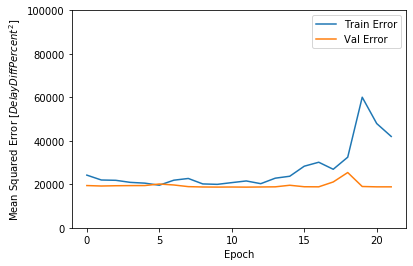

In [167]:
testParModelLengthFit = testParModelLength.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[reduce_lr,early_stop,save_best_model("testParModelLengthGeneral.h5"), PrintDot()])
plot_history(testParModelLengthFit)

In [168]:
testModel = load_model('testParModelLengthGeneral.h5')
eval(testModel)

Testing set Loss : 18653.71 RealDrivingTime
Testing set Mean Abs Error: 101.29 RealDrivingTime
Testing set Mean Sqrt Error: 18653.76 RealDrivingTime
Testing set Root Mean Sqrt Error: 136.58 RealDrivingTime


## Vyhodnotenie
Model sa priblížil iba v 25% testovacích prípadov, čo nieje ani zdaľeka dostatočné

- Testing set Mean Abs Error: 101.29 RealDrivingTime
- Testing set Mean Sqrt Error: 18653.76 RealDrivingTime
- Testing set Root Mean Sqrt Error: 136.58 RealDrivingTime

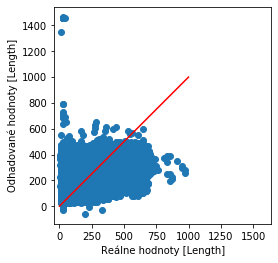

Najväčšia chyba:1438.185791015625
Najväčšia chyba v zápornom smere:-715.02392578125
% priblizne správnych: 0.2601493545322076


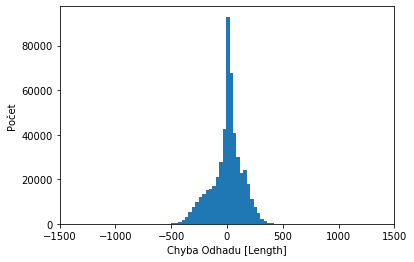

In [175]:
test_predictions = testModel.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('Reálne hodnoty ['+label+']')
plt.ylabel('Odhadované hodnoty ['+label+']')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([0,1000],[0,1000], 'r')
plt.show()

error = test_predictions - test_labels

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

goodPercent = error[abs(error) < 28] 
print("% priblizne správnych: " + str(len(goodPercent)/len(error)))

plt.hist(error, bins=70)
plt.xlabel('Chyba Odhadu ['+label+']')
plt.xlim([-1500,1500])
_ = plt.ylabel("Počet")


# Experiment Odhad dĺžky vlakovej súpravy na konkrétnom úseku
Mojim cieľom je zistiť, či model vytvorený pre špecifický úsek je presnejší ako model s použitím one-hot encoding

In [176]:
label = 'Length'
dfPar[label] = df[label]
used_attributes = ['RealDrivingTime', label]

In [182]:
dffcut = dfPar[((dfPar['FromOstrava-Svinov'] == 1) & (dfPar['ToPolanka n. O.'] == 1))]
#dffcut = dfPar[((dfPar['FromDrahotue'] == 1) & (dfPar['ToLipník nad Beèv.'] == 1))]

dffcut = dffcut[used_attributes]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

print(dffcut.shape)

Length             1.000000
RealDrivingTime    0.193244
Name: Length, dtype: float64
(105587, 2)


In [183]:
train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

(84470, 1)
(21117, 1)


In [184]:
testParModelLengthOneTrack = build_model()


....................

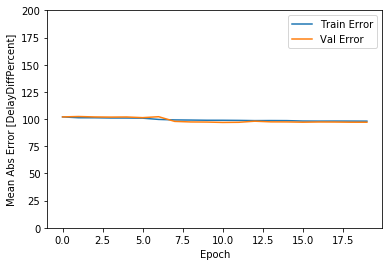

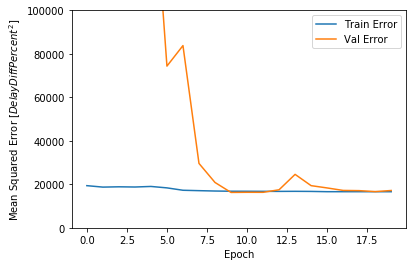

In [185]:
testParModelLengthFit = testParModelLengthOneTrack.fit(normed_train_data, train_labels, epochs=EPOCHS,
                   validation_split=0.25, verbose=0, callbacks=[save_best_model("testParModelLengthOneTrack.h5"),early_stop,reduce_lr, PrintDot()])
plot_history(testParModelLengthFit)

In [186]:
testModel = load_model('testParModelLengthOneTrack.h5')
eval(testModel)

Testing set Loss : 16650.66 RealDrivingTime
Testing set Mean Abs Error: 98.56 RealDrivingTime
Testing set Mean Sqrt Error: 16650.65 RealDrivingTime
Testing set Root Mean Sqrt Error: 129.04 RealDrivingTime


## Vyhodnotenie
Zameranie sa na jeden úsek sa zdá že nepomáha presnoti modelu, a trafí sa iba v 20% prípadov s odchýlkou 28 metrov čo je  5% horší výsledok. Teda usudzujem, že sa nedá odhadnúť dĺžka vlaku z jeho jazdnej doby.

pre trasu Drahotuše -> Lipník nad Bečv. 
- Testing set Mean Abs Error: 102.28 RealDrivingTime
- Testing set Mean Sqrt Error: 18510.44 RealDrivingTime
- Testing set Root Mean Sqrt Error: 136.05 RealDrivingTime
    
        - Táto trasa málokedy zaznamená nulové meškanie, preto je dobrým príkladom dobre zaznamenaných dát
        
pre trasu Ostrava-Svinov -> Polanka n. O.
- Testing set Mean Abs Error: 98.56 RealDrivingTime
- Testing set Mean Sqrt Error: 16650.65 RealDrivingTime
- Testing set Root Mean Sqrt Error: 129.04 RealDrivingTime


        - Táto trasa má často ako keby nadiktované výsledky, kde vlaky majú v niektorých prípadoch rovnaké jazdné doby

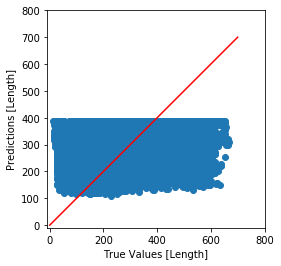

Najväčšia chyba:375.17572021484375
Najväčšia chyba v zápornom smere:-709.595703125
% priblizne správnych: 0.2079367334375148


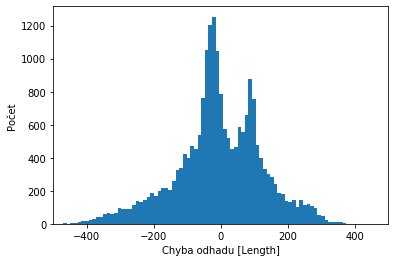

In [187]:
test_predictions = testModel.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values ['+label+']')
plt.ylabel('Predictions ['+label+']')
plt.axis('equal')
plt.axis('square')
plt.xlim([-10,800])
plt.ylim([-10,800])
_ = plt.plot([0,700],[0,700],'r')
plt.show()

error = test_predictions - test_labels

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

goodPercent = error[abs(error) < 28] 
print("% priblizne správnych: " + str(len(goodPercent)/len(error)))

plt.hist(error, bins=100)
plt.xlabel('Chyba odhadu ['+label+']')
plt.xlim([-500,500])
_ = plt.ylabel("Počet")

# Odhad váhy vlakovej súpravy

In [189]:
label = 'Weight'
dfPar[label] = df[label]
used_attributes = odhadParameters.copy()
used_attributes.append(label)

In [190]:
dffcut = dfPar[used_attributes]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

Weight                   1.000000
RealDrivingTime          0.150296
ToPolom                  0.045031
FromPolom                0.045026
ToPøerov os.n.           0.036322
FromLipník nad Beèv.     0.028945
FromDrahotue            0.028291
ToDrahotue              0.028052
ToProsenice              0.027888
ToLipník nad Beèv.       0.027730
FromProsenice            0.027297
ToHranice na Mor.        0.026508
FromHranice na Mor.      0.025630
FromSuchdol nad Odr.     0.013425
ToSuchdol nad Odr.       0.011986
ToVýh Dluhonice          0.009483
ToJistebník              0.008757
FromJistebník            0.008750
ToPolanka n. O.          0.006825
FromPolanka n. O.        0.004491
FromCement Hranice       0.000217
ToFulnek                -0.004750
FromFulnek              -0.005099
FromVýh Dluhonice       -0.005510
FromOstrava-Svinov      -0.011271
FromPøerov os.n.        -0.012418
ToOstrava-Vítkovice     -0.021138
ToStudénka              -0.021968
FromStudénka            -0.024248
FromHranice mì

In [191]:
train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

(2067026, 44)
(516757, 44)


In [200]:
testParModelWeight = build_model(0.001)


....................
....................
.......

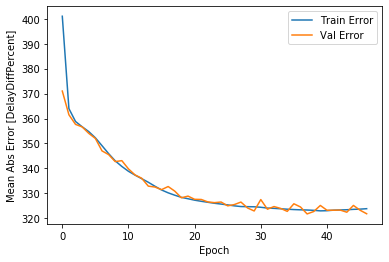

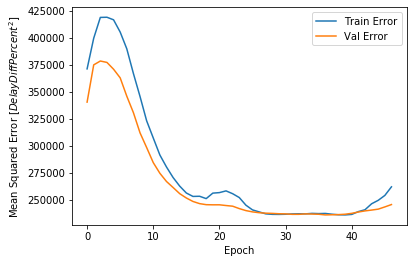

In [201]:
testParModelWeightFit = testParModelWeight.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop,save_best_model("testParModelWeightGeneral.h5"), PrintDot()])
plot_history(testParModelWeightFit)

In [202]:
testModel = load_model("testParModelWeightGeneral.h5")
eval(testModel)

Testing set Loss : 233971.17 RealDrivingTime
Testing set Mean Abs Error: 323.74 RealDrivingTime
Testing set Mean Sqrt Error: 233970.70 RealDrivingTime
Testing set Root Mean Sqrt Error: 483.71 RealDrivingTime


## Vyhodnotenie
Vidím že tento model nedokáže spoľahlivo predpovedať váhu vlaku
- Testing set Mean Abs Error: 323.74 RealDrivingTime
- Testing set Mean Sqrt Error: 233970.70 RealDrivingTime
- Testing set Root Mean Sqrt Error: 483.71 RealDrivingTime

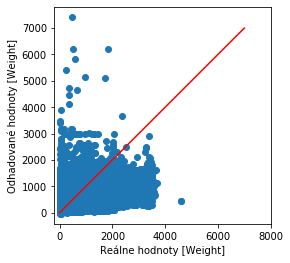

Najväčšia chyba:6980.16455078125
Najväčšia chyba v zápornom smere:-4152.72314453125


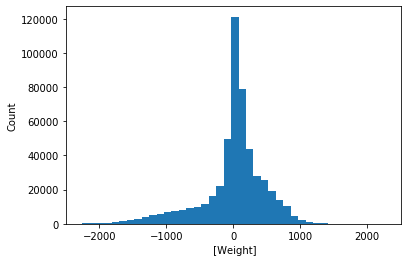

In [206]:
test_predictions = testModel.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('Reálne hodnoty ['+label+']')
plt.ylabel('Odhadované hodnoty ['+label+']')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([0,7000],[0,7000], 'r')
plt.show()

error = test_predictions - test_labels

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

plt.hist(error, bins=100)
plt.xlabel(' ['+label+']')
plt.xlim([-2500,2500])
_ = plt.ylabel("Count")

# Experiment Odhad váhy vlakovej súpravy na konkrétnom úseku
Mojim cieľom je zistiť, či model vytvorený pre špecifický úsek je presnejší ako model s použitím one-hot encoding

In [207]:
label = 'Weight'
dfPar[label] = df[label]
used_attributes = ['RealDrivingTime', label]

In [225]:
#dffcut = dfPar[((dfPar['FromOstrava-Svinov'] == 1) & (dfPar['ToPolanka n. O.'] == 1))]
dffcut = dfPar[((dfPar['FromDrahotue'] == 1) & (dfPar['ToLipník nad Beèv.'] == 1))]

dffcut = dffcut[used_attributes]
cor = dffcut.corr()
print(cor[label].sort_values(ascending=False))

print(dffcut.shape)

Weight             1.000000
RealDrivingTime    0.322788
Name: Weight, dtype: float64
(116955, 2)


In [226]:
train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

(93564, 1)
(23391, 1)


In [231]:
testParModelWeightOneTrack = build_model(0.005)


....................
....................
..........

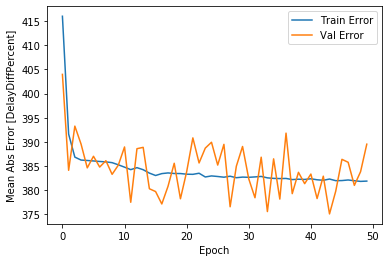

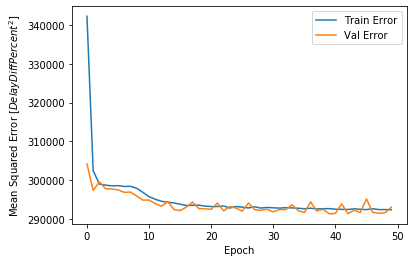

In [232]:
WeightOneTrackHistory = testParModelWeightOneTrack.fit(normed_train_data, train_labels, epochs=EPOCHS,
                   validation_split=0.25, verbose=0, callbacks=[save_best_model("testParModelWeightOneTrack.h5"),early_stop, PrintDot()])
plot_history(WeightOneTrackHistory)

In [233]:
testModel = load_model('testParModelWeightOneTrack.h5')
eval(testModel)

Testing set Loss : 289685.47 RealDrivingTime
Testing set Mean Abs Error: 381.80 RealDrivingTime
Testing set Mean Sqrt Error: 289685.44 RealDrivingTime
Testing set Root Mean Sqrt Error: 538.22 RealDrivingTime


## Vyhodnotenie
Zameranie sa na jeden úsek sa zdá že nepomáha presnoti modelu, a trafí sa iba v 3-6% prípadov. Takéto zhoršenie oproti všeobecnému modelu môže znamenať, že existujú úseky, ktoré sa odhadnúť dajú oveľa lepšie ako moje vybrané. 
pre trasu Drahotuše -> Lipník nad Bečv. 
- Testing set Mean Abs Error: 381.80 RealDrivingTime
- Testing set Mean Sqrt Error: 289685.44 RealDrivingTime
- Testing set Root Mean Sqrt Error: 538.22 RealDrivingTime
    
        - Táto trasa málokedy zaznamená nulové meškanie, preto je dobrým príkladom dobre zaznamenaných dát
        
pre trasu Ostrava-Svinov -> Polanka n. O.
- Testing set Mean Abs Error: 363.64 RealDrivingTime
- Testing set Mean Sqrt Error: 281428.50 RealDrivingTime
- Testing set Root Mean Sqrt Error: 530.50 RealDrivingTime


        - Táto trasa má často ako keby nadiktované výsledky, kde vlaky majú v niektorých prípadoch rovnaké jazdné doby

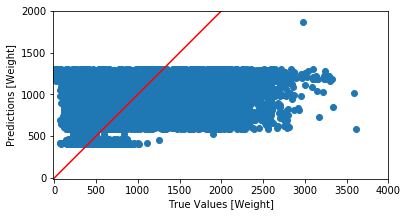

Najväčšia chyba:1298.6484375
Najväčšia chyba v zápornom smere:-3024.20849609375
% priblizne správnych: 0.30866572613398313


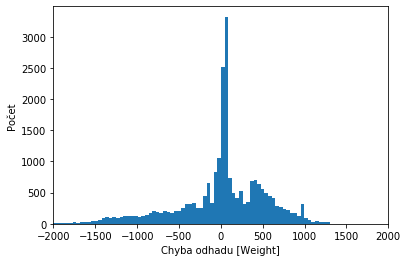

In [240]:
test_predictions = testModel.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values ['+label+']')
plt.ylabel('Predictions ['+label+']')
plt.axis('equal')
plt.axis('square')
plt.xlim([-10,4000])
plt.ylim([-10,2000])
_ = plt.plot([0,5000],[0,5000],'r')
plt.show()

error = test_predictions - test_labels

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

goodPercent = error[abs(error) < 80] 
print("% priblizne správnych: " + str(len(goodPercent)/len(error)))

plt.hist(error, bins=100)
plt.xlabel('Chyba odhadu ['+label+']')
plt.xlim([-2000,2000])
_ = plt.ylabel("Počet")

# Odhad Typu vlaku

In [209]:
dfPar['TrainType'] = df['TrainType']
label = 'TrainLabel'
used_attributes = odhadParameters.copy()
used_attributes = used_attributes + [label]

In [210]:
dfPar[label] = dfPar['TrainType'].astype('category')
dfPar[label] = dfPar[label].cat.codes

In [211]:
dffcut = dfPar[used_attributes]

train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)


train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

(2067026, 44)
(516757, 44)


In [225]:
def build_classification_model():
    model = keras.Sequential([
        layers.Dense(64, activation=tf.nn.relu, input_shape=[len(train_dataset.keys())]),
        layers.Dense(64, activation=tf.nn.relu),
        layers.Dense(10, activation=tf.nn.softmax)
    ])

    optimizer = tf.keras.optimizers.Adam(0.00001)

    model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  optimizer=optimizer,
                  metrics=['accuracy'])
    return model

In [223]:
testParModelType = build_classification_model()

In [217]:
early_stop_classification = keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=25)

In [218]:
def plot_class_history(history):
    plt.subplot(211)
    plt.title('Loss')
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='test')
    plt.legend()

    plt.subplot(212)
    plt.title('Accuracy')
    plt.plot(history.history['accuracy'], label='train')
    plt.plot(history.history['val_accuracy'], label='test')
    plt.legend()
    plt.show()

In [44]:
def class_eval(model):
    loss, accuracy = model.evaluate(normed_test_data, test_labels, verbose=0)
    print("Testing set Accuracy : {:5.2f} % ".format(accuracy*100))

In [224]:
def save_best_class_model(model_name):
    return keras.callbacks.ModelCheckpoint(model_name, monitor='val_accuracy', verbose=0, save_best_only=True, save_weights_only=False)


....................
....................
....................
....................
....................
....................
....................
..........

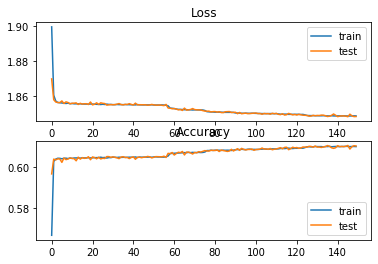

In [226]:
testParModelTypeFit = testParModelType.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split=0.25, verbose=0, callbacks=[early_stop_classification,save_best_model("TestParModelTypeGeneralAdam.h5"), PrintDot()])
plot_class_history(testParModelTypeFit)

In [227]:
testModel = load_model("TestParModelTypeGeneralAdam.h5")
class_eval(testModel)

Testing set Accuracy : 61.04 % 


## Vyhodnotenie
Tento model vykazuje na testovacej mnozine presnost 
- 61.04 %

očakával som väčšiu presnosť.

In [47]:
test_predictions = testModel.predict(normed_test_data)

print(np.argmax(test_predictions[0]))
print(test_labels.iloc[0])

for i in range(10):
    plt.subplot(1,2,2)
    plt.bar(range(10), test_predictions[i])
    plt.title(train_types[test_labels.iloc[i]])
    plt.xticks(range(10), train_types, rotation=45)
    plt.show()

Najväčšia chyba:True
Najväčšia chyba v zápornom smere:True
% chýb menších ako 2 minúty: 1.0


<string>:6: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


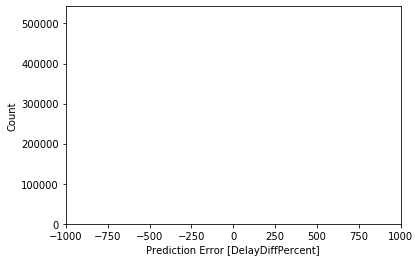

In [327]:
error = (test_predictions != test_labels)

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

lessThan2Min = error[abs(error) < 120] 
print("% chýb menších ako 2 minúty: " + str(len(lessThan2Min)/len(error)))


plt.hist(error, bins=1000)
plt.xlabel('Prediction Error [DelayDiffPercent]')
plt.xlim([-1000,1000])
_ = plt.ylabel("Count")

## Experiment - odhad typu vlaku na základe jazdnej doby na konkrétnom úseku

In [199]:
dfPar['TrainType'] = df['TrainType']
label = 'TrainLabel'
used_attributes = ['TrainLabel','RealDrivingTime']

In [200]:
dfPar[label] = dfPar['TrainType'].astype('category')
dfPar[label] = dfPar[label].cat.codes

In [201]:
dffcut = dfPar[((dfPar['FromOstrava-Svinov'] == 1) & (dfPar['ToPolanka n. O.'] == 1))]
#dffcut = dfPar[((dfPar['FromDrahotue'] == 1) & (dfPar['ToLipník nad Beèv.'] == 1))]

dffcut = dffcut[used_attributes]
print(dffcut.shape)

(105587, 2)


In [202]:
train_dataset = dffcut.sample(frac=0.8, random_state=0)
test_dataset = dffcut.drop(train_dataset.index)

train_labels = train_dataset.pop(label)
test_labels = test_dataset.pop(label)

print(train_dataset.shape)
print(test_dataset.shape)
    
train_stats = train_dataset.describe()
train_stats = train_stats.transpose()  

normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

(84470, 1)
(21117, 1)


In [203]:
def build_classification_model():
    model = keras.Sequential([
        layers.Dense(64, activation=tf.nn.relu, input_shape=[len(train_dataset.keys())]),
        layers.Dense(64, activation=tf.nn.relu),
        layers.Dense(len(train_types), activation=tf.nn.softmax)
    ])

    optimizer = tf.keras.optimizers.Adam(0.001)

    model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  optimizer=optimizer,
                  metrics=['accuracy'])
    return model

In [204]:
testTypeModel = build_classification_model()

In [205]:
EPOCHS = 150

In [206]:
early_stop_classification = keras.callbacks.EarlyStopping(monitor='accuracy', mode='max', patience=30)


....................
....................
........

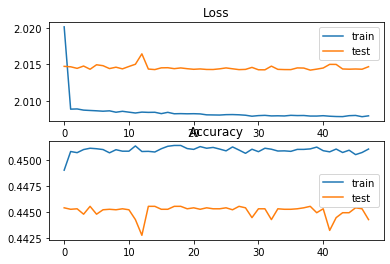

In [207]:
testTypeModelHistory = testTypeModel.fit(normed_train_data, train_labels, epochs=EPOCHS,
                   validation_split=0.25, verbose=0, callbacks=[save_best_model("testTypeModelOneTrack.h5"), early_stop_classification, reduce_lr, PrintDot()])
plot_class_history(testTypeModelHistory)

In [208]:
testModel = load_model('testTypeModelOneTrack.h5')
class_eval(testModel)

Testing set Accuracy : 45.12 % 


## Vyhodnotenie
Zameranie sa na jeden úsek sa zdá že nepomáha presnoti modelu, a trafí sa iba v 3-6% prípadov. Takéto zhoršenie oproti všeobecnému modelu môže znamenať, že existujú úseky, ktoré sa odhadnúť dajú oveľa lepšie ako moje vybrané. 
pre trasu Drahotuše -> Lipník nad Bečv. 
- Accuracy: 59.20 % 
    
        - Táto trasa málokedy zaznamená nulové meškanie, preto je dobrým príkladom dobre zaznamenaných dát
        
pre trasu Ostrava-Svinov -> Polanka n. O.
- Testing set Mean Abs Error: 363.64 RealDrivingTime
- Testing set Mean Sqrt Error: 281428.50 RealDrivingTime
- Testing set Root Mean Sqrt Error: 530.50 RealDrivingTime


        - Táto trasa má často ako keby nadiktované výsledky, kde vlaky majú v niektorých prípadoch rovnaké jazdné doby

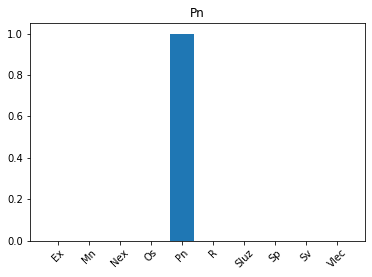

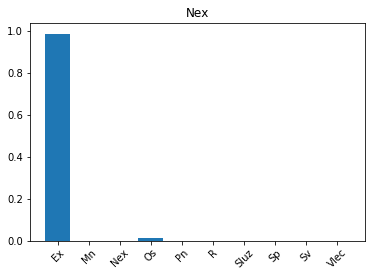

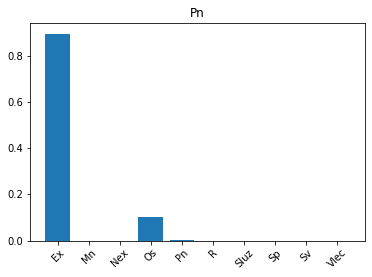

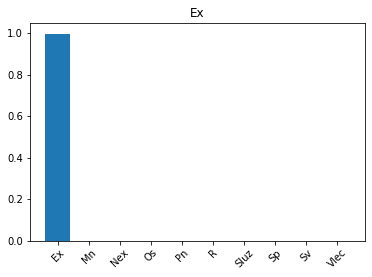

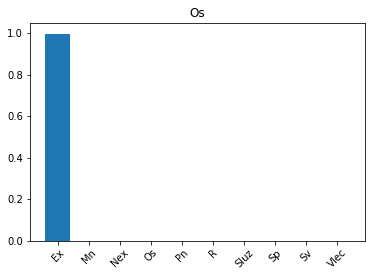

...

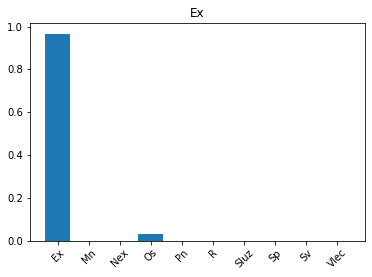

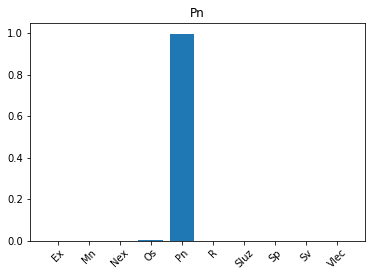

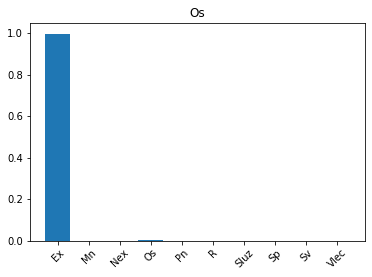

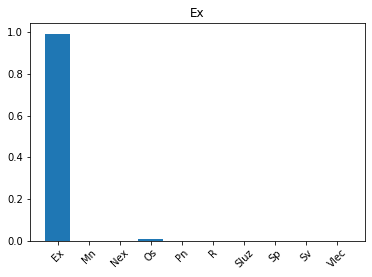

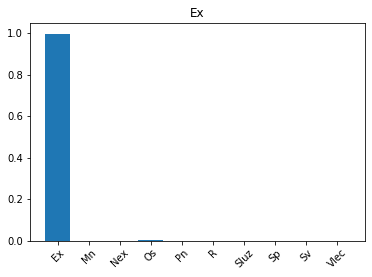

In [113]:
test_predictions = testModel.predict(normed_test_data)


for i in range(50): 
    plt.subplot(1,1,1)
    plt.bar(range(len(train_types)), test_predictions[i])
    plt.title(train_types[test_labels.iloc[i]])
    plt.xticks(range(len(train_types)), train_types, rotation=45)
    plt.show()

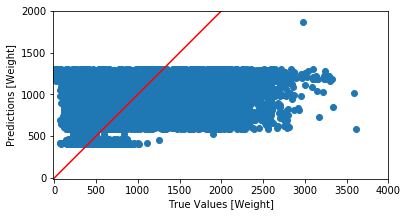

Najväčšia chyba:1298.6484375
Najväčšia chyba v zápornom smere:-3024.20849609375
% priblizne správnych: 0.30866572613398313


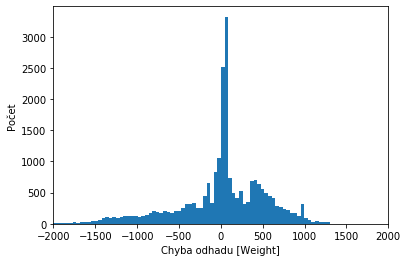

In [240]:
test_predictions = testModel.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values ['+label+']')
plt.ylabel('Predictions ['+label+']')
plt.axis('equal')
plt.axis('square')
plt.xlim([-10,4000])
plt.ylim([-10,2000])
_ = plt.plot([0,5000],[0,5000],'r')
plt.show()

error = test_predictions - test_labels

print("Najväčšia chyba:" + str(max(error)))
print("Najväčšia chyba v zápornom smere:" + str(min(error)))

goodPercent = error[abs(error) < 80] 
print("% priblizne správnych: " + str(len(goodPercent)/len(error)))

plt.hist(error, bins=100)
plt.xlabel('Chyba odhadu ['+label+']')
plt.xlim([-2000,2000])
_ = plt.ylabel("Počet")